In [445]:
#Initialization cell
%matplotlib notebook
#import expdata2018 as ex
import expdata2019temp as ex
import takatools2018new as tk
#import juntools as jt
import xarray as xr
import ipywidgets

import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib as mpl
from matplotlib import rcParams, cycler
import lmfit

#cmap = cm.plasma             # viridis, plasma, magma, coolwarm, Spectral, parula
cmap = cm.get_cmap('tab10')  #'tab20'
rcParams['axes.prop_cycle'] = cycler(color=cmap(np.linspace(0, 1, 11)))

#directory
import os

#path = r'Z:\Measurements\Chloe\20190410'   # 20180118   20170125
path = r'C:\Research data\Measurement'

if not os.path.exists(path):
    raise Exception()

def h5files(path = path):
    return [file_name for file_name in os.listdir(path) if file_name.endswith('.h5')]

def aindex(array, value):
    return np.argmin(np.abs(array-value))

holders = ['20180118',]
def load_data(filename = '', load_now = False):
    try:
        return ex.load_data(filename = filename, load_now = load_now)
    except:
        for holder in holders:
            new_filename = '..\%s\%s.h5' %(holder, filename.replace('.h5', ''))
            print new_filename
            return ex.load_data(filename = new_filename, load_now = load_now)
%cd $path

C:\Research data\Measurement


In [14]:
#print os.environ['CONDA_DEFAULT_ENV']
#print os.environ['CONDA_PREFIX']
print os.environ

{'TMP': 'C:\\Users\\TARUCH~1\\AppData\\Local\\Temp', 'COMPUTERNAME': 'CHLOE', 'USERDOMAIN': 'Chloe', 'PROCESSOR_ARCHITECTURE': 'AMD64', 'PSMODULEPATH': 'C:\\Windows\\system32\\WindowsPowerShell\\v1.0\\Modules\\', 'VS90COMNTOOLS': 'C:\\Program Files (x86)\\Microsoft Visual Studio 9.0\\Common7\\Tools\\', 'COMMONPROGRAMFILES': 'C:\\Program Files\\Common Files', 'PROCESSOR_IDENTIFIER': 'Intel64 Family 6 Model 45 Stepping 7, GenuineIntel', 'PROGRAMFILES': 'C:\\Program Files', 'PROCESSOR_REVISION': '2d07', 'PATH': 'C:\\ProgramData\\Oracle\\Java\\javapath;C:\\Program Files (x86)\\Intel\\iCLS Client\\;C:\\Program Files\\Intel\\iCLS Client\\;C:\\Windows\\system32;C:\\Windows;C:\\Windows\\System32\\Wbem;C:\\Windows\\System32\\WindowsPowerShell\\v1.0\\;C:\\Program Files\\Intel\\Intel(R) Management Engine Components\\DAL;C:\\Program Files\\Intel\\Intel(R) Management Engine Components\\IPT;C:\\Program Files (x86)\\Intel\\Intel(R) Management Engine Components\\DAL;C:\\Program Files (x86)\\Intel\\Int

In [2]:
import netCDF4
netCDF4.__version__

'1.4.1'

In [82]:
from platform import python_version
print python_version()

2.7.13


In [393]:
xr.__version__

u'0.10.9'

In [392]:
ipywidgets.__version__

'7.4.2'

In [391]:
mpl.__version__

'2.2.3'

In [579]:
mpl.rc('xtick', direction ='in', top = True)
mpl.rc('ytick', direction ='in', right = True)
# mpl.rcParams['xtick.direction'] = 'in'
# mpl.rcParams['ytick.direction'] = 'in'
# mpl.rcParams['xtick.top'] = True
# mpl.rcParams['ytick.right'] = True

In [617]:
#mpl.rc({'xtick.direction' : 'in',  'ytick.direction' : 'in', 'xtick.top' :True, 'ytick.right': True})
mpl.rc('tick', direction ='in')

In [396]:
# print rcParams['axes.prop_cycle']
csample = cm.get_cmap('tab10')(2) #[:3]
print mpl.colors.rgb2hex(csample)

#2ca02c


<IPython.core.display.Javascript object>


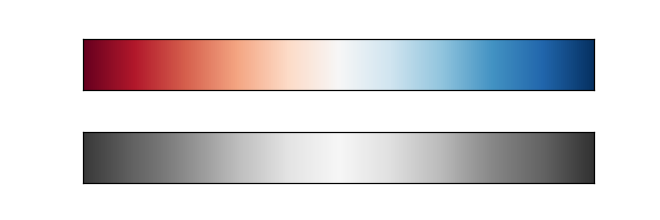

In [727]:
from matplotlib.colors import LinearSegmentedColormap

def grayscale_cmap(cmap):
    """Return a grayscale version of the given colormap"""
    cmap = plt.cm.get_cmap(cmap)
    colors = cmap(np.arange(cmap.N))
    
    # convert RGBA to perceived grayscale luminance
    # cf. http://alienryderflex.com/hsp.html
    RGB_weight = [0.299, 0.587, 0.114]
    luminance = np.sqrt(np.dot(colors[:, :3] ** 2, RGB_weight))
    colors[:, :3] = luminance[:, np.newaxis]
        
    return LinearSegmentedColormap.from_list(cmap.name + "_gray", colors, cmap.N)
    
def view_colormap(cmap):
    """Plot a colormap with its grayscale equivalent"""
    cmap = plt.cm.get_cmap(cmap)
    colors = cmap(np.arange(cmap.N))
    
    cmap = grayscale_cmap(cmap)
    grayscale = cmap(np.arange(cmap.N))
    
    fig, ax = plt.subplots(2, figsize=(6, 2),
                           subplot_kw=dict(xticks=[], yticks=[]))
    ax[0].imshow([colors], extent=[0, 10, 0, 1])
    ax[1].imshow([grayscale], extent=[0, 10, 0, 1])
view_colormap('RdBu')

In [107]:
#from GS200_new_Mi import GS200
#w.GS200 = GS200(addr = '192.168.1.7', interface = 'LAN') 
from instr import world as w
from YK7651 import YK7651
GS200 = YK7651(addr = 7, interface = 'GPIB') 
#GS200.range('10mV')
w.GS200_vol = GS200.voltage(max =0.012, min = 0.0, step=0.0001,range = '10mV')
#print 

In [110]:
w.GS200_vol  = 0.010

In [92]:
%matplotlib notebook

from __future__ import division
from time import sleep, time, strftime

import expdata2018 as ex
import takatools2018new as tk

from instr import world as w
from TUDAC import TUDAC
from AGE4432B import AGE4432B
import AlazarDigitizer.alazar_digitizer as ad
from MercuryIPS import IPS
from YK7651 import YK7651
import Keithley2450
from waveform_lazy import waveform
from AWG70000 import AWG70000
from AWG7000test  import AWG7000
from AWG520  import AWG520
import AG34401A
#from GS200_new_Mi import GS200


import numpy as np
import matplotlib.pyplot as plt
import lmfit


w.SMU = Keithley2450.Keithley2450(addr = '192.168.1.5', interface = 'LAN', compliance = 1e-3, nplc = 1)   #(addr = 12, compliance = 1e-4, nplc = 1)
w.SMU.voltage.setup(min = -0.1, max = 0.1, step = 0.001)

VisaIOError: VI_ERROR_ALLOC (-1073807300): Insufficient system resources to perform necessary memory allocation.

# typical plot

## Diagram

In [162]:
y0#.dims.keys()[0]

<xarray.Dataset>
Dimensions:    (C: 101)
Coordinates:
    direction  int32 0
  * C          (C) float64 0.0 -0.01 -0.02 -0.03 ... -0.97 -0.98 -0.99 -1.0
Data variables:
    current    (C) float32 ...
Attributes:
    filename:   190702211629
    status:     L = 0.1 V, PL = 0.1 V, T = 0.1 V, PR = 0.1 V, R = 0.1 V, C1 =...
    exec_code:  #QPC trace 1gate\ngate = w.G1 # C1\nrng   = np.linspace(0., -...
    comment:    L = 0.1 V, PL = 0.1 V, T = 0.1 V, PR = 0.1 V, R = 0.1 V, C1 =...

<IPython.core.display.Javascript object>


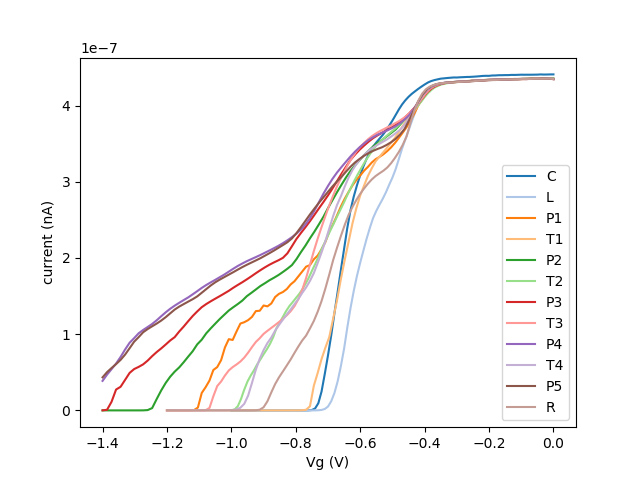

In [173]:
d1 = ex.load_data('190704213242')
d2 = ex.load_data('190704213507') #.sel(method = 'pad',**{'SMU.voltage': 0.0009})
d3 = ex.load_data('190704213721')
d4 = ex.load_data('190704213902')
d5 = ex.load_data('190704214114')
d6 = ex.load_data('190704214226')
d7 = ex.load_data('190704214344')
d8 = ex.load_data('190704214550')
d9 = ex.load_data('190704214712')
d10 = ex.load_data('190704214840')
d11 = ex.load_data('190704214959')
d12 = ex.load_data('190704215126')
d13 = ex.load_data('190704215332')
d14 = ex.load_data('190704215445')
d15 = ex.load_data('190704215553')
d16 = ex.load_data('190704215745')
d17 = ex.load_data('190704215915')
d18 = ex.load_data('190704220038')
#d0 = d1.expand_dims(dim ='SMU.voltage',axis = 0)#(dim=None, axis=None, **dim_kwargs)
# dcon = xr.concat([d0, d2], 'SMU.voltage')  # [d1, d2, d3, d4, d5, d6, d7, d8, d9]
# tk.plot(dcon,name = 'dVrf', cmap = 'magma')

#dslice = d.sel(method = 'pad', **{'PL': -0.3302})
fig, ax =plt.subplots()
for idx,y00 in enumerate([d1,d2,d3,d4,d5,d6,d7,d8,d9,d10,d11,d12] ):  #[d1,d2,d3,d4,d5,d6,d7,d8,d9,d10,d11,d12]     [d13,d14,d15,d16,d17,d18]
    y0 = y00.sel(method = 'pad',**{'direction': 0})
    y = y0['current'].values
    x = y0[y00.dims.keys()[0]].values
    ax.plot(x,y,label = [ 'C','L','P1','T1','P2','T2','P3','T3','P4','T4','P5','R' ][idx]) #['C','L','P1','T1','P2','T2','P3','T3','P4','T4','P5','T5',]    'S1L','S1C','S1R','S2L','S2C','S2R',
plt.xlabel('Vg (V)')
plt.ylabel('current (nA)')
plt.legend(loc =4)

In [5]:
#d0#.dims #coords
#d0 = d1.expand_dims(dim ='SMU.voltage',axis = 0,**{'SMU.voltage': 1,})
#d1.assign_coords(y=0.0004)
d2 = ex.load_data(h5files()[-2]).sel(method = 'pad',**{'SMU.voltage': 0.0009})
d2.dims,d1.dims
#dcon = xr.concat([d1, d2], 'new') 
#d2.Vrf.values
#d0 = d2.squeeze('SMU.voltage')
#d0

ValueError: dimensions or multi-index levels ['SMU.voltage'] do not exist

VGFiKGNoaWxkcmVuPShWQm94KGNoaWxkcmVuPShIQm94KGNoaWxkcmVuPShEcm9wZG93bihkZXNjcmlwdGlvbj11J25hbWUnLCBpbmRleD0xLCBvcHRpb25zPSh1J1ZyZicsIHUnZFZyZicsICfigKY=


<IPython.core.display.Javascript object>


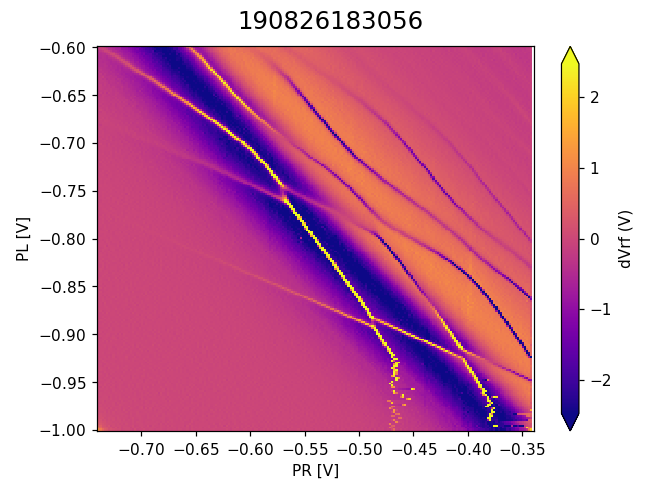

In [69]:
# d = ex.load_data(h5files()[-2], load_now = True)
d = ex.load_data(h5files()[-1]) #.sel(method = 'pad',**{'SMU.voltage': 0.0009})
#d = ex.load_data(181122144208) 190520151049
#d = ex.load_data(190710121407)
#d = ex.load_data(190729123039)
#d = ex.load_data(190604111614)
#d = ex.load_data(181022170213)   # bias 1mV
#d = ex.load_data(181005202344)
#d = ex.load_data(180208164054)   # small interdot
#d = ex.load_data(181004144042)
#d = ex.load_data(180629183941)   # Si
#d = ex.load_data(180607170719)   #180605160210
#d = ex.load_data(180605135259)
#d = ex.load_data(180525154146)

#d = ex.load_data(180314174405)  # S -T0 osci
#d = ex.load_data(180510171156)  # S -T0 osci
#d = ex.load_data(180206202834)
#d = ex.load_data(180306210719)
#d = ex.load_data(180523181415)

#d['Vrf_trans'] = d['Vrf'].transpose()
# d['dVrf_trans'] = d['dVrf'].transpose()
#d['diff1'] = tk.differentiate(d['Vrf'], dim = -1, sigma = 0.5)
#d['diff2'] = -tk.differentiate(d['Vrf'], dim = 1, sigma = 0.2)
#d['diff'] = tk.differentiate(d['Vrf_trans'], dim = 0,sigma = 0.5)
d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)

if [True,False][0]: #subtract plane
    try:
        d['Vrf_sub'] = tk.remove_plane(d['Vrf'])*1e3
        d['Vrf_sub'].attrs['units'] = 'mV'
    except:
        pass

#d['dVrftrans'] = d['dVrf'].transpose()
#cmaps = cm.Spectral
#cmaps = parula_map
#fig = plt.figure(figsize = (10,6))     # dpi=300
#fig = plt.figure(dpi =300)     # dpi=300
#fig, ax =plt.subplots()

#d1 = d[SMU.voltage = 0.0005]         # 'RdBu'
#d1 = d.sel(method = 'pad',**{'Vps (Volt)': 5.11})
#d1 = d.sel(method = 'pad',**{'Vps (Volt)': 5.11})
#d = d.isel(**{'GS200_vol': slice(3, 5)}) # method ='pad'
#d1 = d.sel(**{'PL': slice(-1.1625, -1.1669)}) # method ='pad'

tk.plot(d,name = 'dVrf',cmap = 'plasma',alpha = 0.5)
#tk.plot(d1,name = 'dVrf',cmap = 'plasma',alpha = 0.5,auto_scale = False) #  d[{'PR (V)' : 100}],interpolation = 'bicubic')#, ylog = True)name = 'current',

#d['dVrf'][0,:].plot(cmap = 'plasma')
#d.Vrf.plot( col = 'PL (V)',col_wrap = 5)  # hue = 'PL (V)' , # hue  = 'new'

#plt.show()
#tk.implot(d['dVrf'], d['PR'],d['PC'],vmax=8, vmin=-8, cmap ='magma',interpolation = 'None' )
# fig = plt.subplots()
# tk.implot(d['dVrf'], d['SR'],d['SC'],vmax=8, vmin=-8, cmap ='plasma',interpolation = 'bicubic',aspect =0.5 )
plt.show()
#print d #d.attrs

In [373]:
#d['Vrf_trans'].dims[0]
np.arange(0,5, 4.).dtype

dtype('float64')

In [486]:
np.arctan(13.)/np.pi * 180

85.60129464500447

<IPython.core.display.Javascript object>


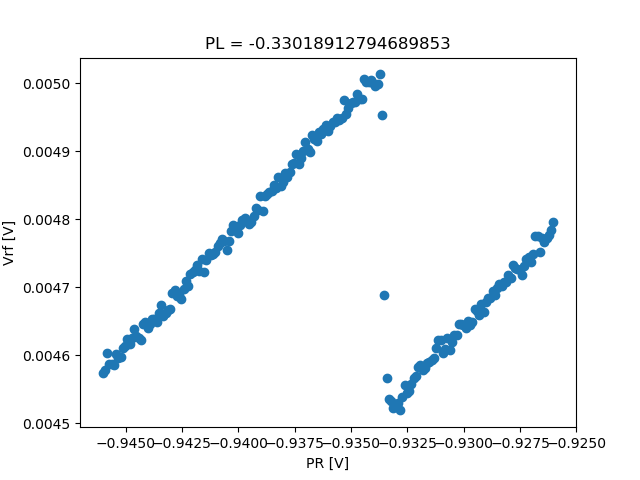

In [494]:
#dslice = d.sel(**{'SR (V)': -0.65 })  # slice(-0.34, -0.354),
#dslice = d.sel(method = 'pad', **{'SR (V)': [-0.650,-0.655,-0.700,-0.7025,-0.705]})
#dslice = d.sel(method = 'pad', **{'PL (V)': -0.641584})
dslice = d.sel(method = 'pad', **{'PL': -0.3302})
fig, ax =plt.subplots()
#tk.plot(dslice,marker = 'o')  # name = 'dVrf', cmap = 'magma'
dslice.Vrf.plot.line( 'o')
#print dslice

VGFiKGNoaWxkcmVuPShWQm94KGNoaWxkcmVuPShIQm94KGNoaWxkcmVuPShEcm9wZG93bihkZXNjcmlwdGlvbj11J25hbWUnLCBvcHRpb25zPSh1J1ZyZicsIHUnZFZyZicpLCB2YWx1ZT11J1bigKY=


<IPython.core.display.Javascript object>


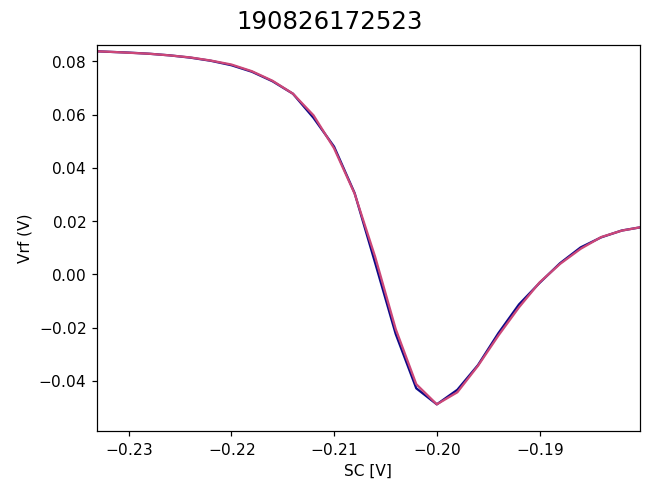

In [67]:
d11 = ex.load_data(h5files()[-1]) #h5files()[-1]
d22 = ex.load_data(h5files()[-2])
#d = ex.load_data(180808182951)
#d1 = d.sel(**{'PL (V)': slice(-0.3710, -0.3715),'PR (V)': slice(-0.9070, -0.9105)})
dcon = xr.concat([d11, d22], dim = 'new')

#tk.plot(d,color = 'C0') # cmap ='plasma'
#d.Vrf.plot()
tk.plot(dcon)
#plt.show()

#plt.show
#x = np.mean(d['dVrf'].values,axis = 0)[1:]
#print x, d['dVrf'].values

In [75]:
np.prod([[1.,2.,3],[3.,4.,5.]], axis= 0)

array([ 3.,  8., 15.])

VGFiKGNoaWxkcmVuPShWQm94KGNoaWxkcmVuPShIQm94KGNoaWxkcmVuPShEcm9wZG93bihkZXNjcmlwdGlvbj11J25hbWUnLCBpbmRleD0xLCBvcHRpb25zPSh1J1ZyZicsIHUnZFZyZicsICfigKY=


<IPython.core.display.Javascript object>


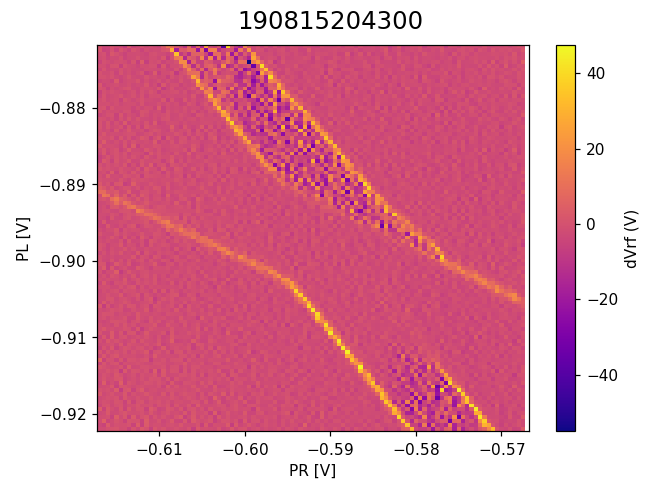

In [471]:
dq = ex.load_data(h5files()[-1]) # h5files()[-1]  '190530122256' '190722150218'
#dq = dq.sel(**{'Vps': slice(0, 6.0)}) # method ='pad'
if [True,False][0]: #subtract plane
    try:
        dq['Vrf_sub'] = tk.remove_plane(dq['Vrf'])*1e3
        dq['Vrf_sub'].attrs['units'] = 'mV'
    except:
        pass
tk.plot(dq,cmap= 'plasma',interpolation = 'bicubic')
#fig = plt.subplots()
#tk.implot(dq['dVrf'][:,::-1], dq[dq.dims.keys()[1]][::-1],dq[dq.dims.keys()[0]][::-1], cmap ='plasma',aspect = 0.8 ) #vmax=8, vmin=-8,
#plt.show()
#plt.savefig( dq.attrs['filename']+".pdf", bbox_inches="tight")

VGFiKGNoaWxkcmVuPShWQm94KGNoaWxkcmVuPShIQm94KGNoaWxkcmVuPShEcm9wZG93bihkZXNjcmlwdGlvbj11J25hbWUnLCBpbmRleD0xLCBvcHRpb25zPSh1J1ZyZicsICdkaWZmJyksIHbigKY=


<IPython.core.display.Javascript object>


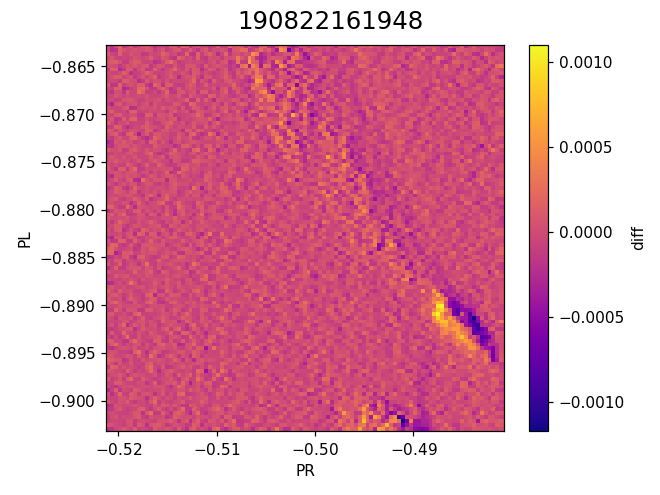

In [74]:
dqq = ex.load_data(190822161948) # h5files()[-1]  '190606145620'  , '180627193123' mikasa
dqq['diff'] = tk.differentiate(dqq['Vrf'], sigma = 0.5)
#dqq['dVrftrans'] = dqq['dVrf'].transpose()
# try:
#     dqq['Vrf_sub'] = tk.remove_plane(dqq['Vrf'])*1e3
#     dqq['Vrf_sub'].attrs['units'] = 'mV'
# except:
#     pass
tk.plot(dqq,cmap= 'plasma')

In [246]:
d1['dVrfave'] = tk.differentiate(d1['Vrfave'],sigma =0.5)
#d1['Vrfave'] 
#d1['fft'] = tk.new_array(d1['Vrf'], np.mean(d1['Vrf'].values, axis = 0))
#print d1.fft
print d1['Vrf'].shape

(20L, 81L)


In [494]:
raw_data =  ex.load_data(190201183058)
axis0, axis0n = raw_data.coords.values()[0],raw_data.coords.keys()[0] #dims.items()[1]
if len(raw_data.coords.keys())>1:
    axis1, axis1n = raw_data.coords.values()[1],raw_data.coords.keys()[1] #dims.items()[1]
if len(raw_data.coords.keys())>2:
    axis2, axis2n = raw_data.coords.values()[2],raw_data.coords.keys()[2] #dims.items()[1]  
if len(raw_data.coords.keys())>3:
    axis3, axis3n = raw_data.coords.values()[3],raw_data.coords.keys()[3] #dims.items()[1]  
#axis1, axis1n = raw_data.coords.values()[1],raw_data.coords.keys()[1] #dims.items()[1]
# if raw_data.coords.keys()[2] is False:
#     print 'its fal'
#print raw_data.attrs[0]

print len(raw_data.coords.keys())
comment0 = 'L = -0.15 V, PL = -0.901 V, T = -0.15 V, PR = -0.52 V, R = -0.81 V, C1 = -0.6 V, C2 = 0. V, SL = -1.3 V, SC = -0.206 V, SR = -0.725 V, G1 = 0. V, G2 = 0. V, rf(rf.frequency=204.800000, rf.power=7.000000), Vps=0.200000, AWG(), AWGMA(), Bext=-0.200000'

4


VGFiKGNoaWxkcmVuPShWQm94KGNoaWxkcmVuPShIQm94KGNoaWxkcmVuPShEcm9wZG93bihkZXNjcmlwdGlvbj11J25hbWUnLCBvcHRpb25zPSh1J1ZyZicsKSwgdmFsdWU9dSdWcmYnKSwgQ2jigKY=


<IPython.core.display.Javascript object>


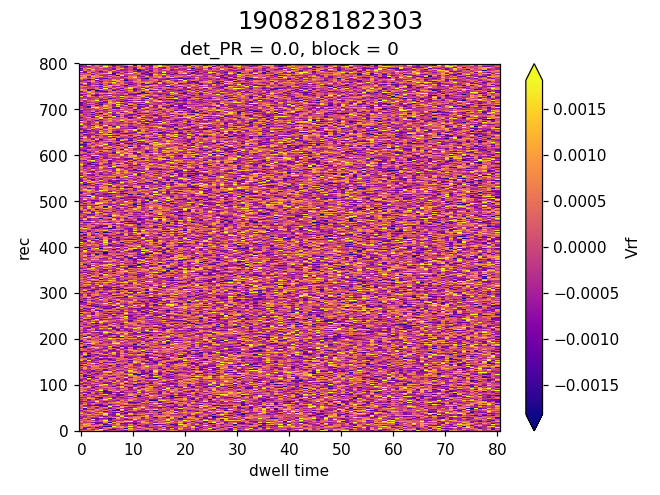

In [510]:

with ex.data_store(comment = comment0) as ds:
    #ds.axis(det_E, var = 'det_E (ueV)')
    ds.axis(axis0.values, var = axis0n)  #,dim = 0 )  #  +0.2 modify range
    if len(raw_data.coords.keys())>1:
        ds.axis(axis1.values , var = axis1n)
    if len(raw_data.coords.keys())>2:
        ds.axis(axis2.values, var = axis2n)
    if len(raw_data.coords.keys())>3:
        ds.axis(axis3.values, var = axis3n)
    #ds.axis(axis1.values, var = axis1n)
    ds.storage('Vrf', noplot = True)
    
    #for ii,_ in enumerate(ds.loop()):
    ds.put(raw_data['Vrf'].values, name = 'Vrf')
    

fig, ax = plt.subplots(figsize=(6,5))

# ax1 = ax.imshow(a1, cmap= 'plasma',interpolation = 'None', aspect = (evol_time[0]-evol_time[-1])/(det_E[0]-det_E[-1]),  
#                 vmin= 0.1, vmax= 0.7, extent= [evol_time[0],evol_time[-1],det_E[0],det_E[-1] ])
# plt.show()
test =  ex.load_data() # 190822161948
#test['diff']=tk.differentiate(test['Vrf'])
tk.plot(test)
#print ds

### Breit-Wigner fit of gamma

<IPython.core.display.Javascript object>


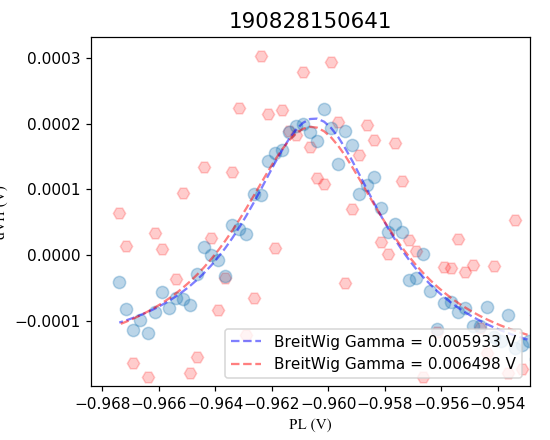

[[Model]]
    Model(Breit_Wigner)
[[Fit Statistics]]
    # function evals   = 63
    # data points      = 81
    # variables        = 5
    chi-square         = 0.000
    reduced chi-square = 0.000
    Akaike info crit   = -1700.716
    Bayesian info crit = -1688.744
[[Variables]]
    Gamma:   0.00593251 +/- 0.000395 (6.66%) (init= 0.0005)
    cen:    -0.96048321 +/- 8.08e-05 (0.01%) (init=-0.9574)
    amp:     9.4441e-05 +/- 3.09e-06 (3.27%) (init= 0.000255885)
    off:    -0.00136642 +/- 0.000777 (56.83%) (init= 0)
    a:      -0.00124579 +/- 0.000818 (65.68%) (init=-0.2)
[[Correlations]] (unreported correlations are <  0.250)
    C(off, a)                    =  1.000 
    C(amp, a)                    =  0.594 
    C(amp, off)                  =  0.591 
    C(Gamma, a)                  =  0.590 
    C(Gamma, off)                =  0.584 
    C(cen, off)                  = -0.514 
    C(cen, a)                    = -0.514 
    C(Gamma, amp)                =  0.307 
    C(Gamma, cen)  

In [469]:
##  Breit-Wigner(Lorentzian) fit of transition, for Gamma >> kT , 

# d = ex.load_data(180528163213)                   
# d1 = d.sel(**{'PL (V)': slice(-0.3605, -0.3645),'PR (V)': slice(-0.800, -0.850)})
# d = ex.load_data(180528175920)
# d1 = d.sel(**{'PL (V)': slice(-0.3710, -0.3715),'PR (V)': slice(-0.9070, -0.9110)})
#d = ex.load_data(180808182951)
#d1 = d.sel(**{'PL': slice(-0.5732, -0.5743),'PR': slice(-0.8600, -0.8999)})

# d1 = ex.load_data(181205205629)                           # L =-0.46 V
# d1['dVrf'] = tk.differentiate(d1['Vrf'], sigma = 0.5)

# d1 = ex.load_data(181218214855)                           # L =-0.46 V
# d1['dVrf'] = tk.differentiate(d1['Vrf'], sigma = 0.5)

# d1 = ex.load_data(181219173504)                           # L =-0.46 V
# d1['dVrf'] = tk.differentiate(d1['Vrf'], sigma = 0.5)

# d1 = ex.load_data(181225153007)                           # L =-0.45 V
# d1['dVrf'] = tk.differentiate(d1['Vrf'], sigma = 0.5)

# d1 = ex.load_data(181225155128)                            # L =-0.44 V
# d1['dVrf'] = tk.differentiate(d1['Vrf'], sigma = 0.5)

# d1 = ex.load_data(181225204400)                            # L =-0.43 V, # 181225165437
# d1['Vrfave'] = d1['Vrf'].mean(axis = 0)

# d1 = ex.load_data(181228155042)                            # L =-0.435 V, 181225221745,  181226153307, 

# d1 = ex.load_data(190107182833)                             # L =-0.435 V,  after new year

d1 = ex.load_data()                               # L =-0.430 V,  after new year, 190108170104
d1['dVrf'] = tk.differentiate(d1['Vrf'], sigma = 0.5)
d1['dVrfave'] = d1['dVrf'].mean(axis = 0)
#d1 = ex.load_data(190115153706)                          # L =-0.425 V, 190108182418, 190108183622, 190108183831, 190109181750, 190111163049
#d1 = ex.load_data(190115233157)                          # L =-0.385 V, T =-0.550,
#d1 = ex.load_data(190116165025)                          # L =-0.380 V, T =-0.550, 
#d1 = ex.load_data(190117163609)                           # L =-0.375 V, T =-0.550,   190116174439
#d1 = ex.load_data(190117210524)                           # L =-0.375 V, T =-0.530,
#d1 = ex.load_data(190117211807)                           # L =-0.365 V, T =-0.530,   
#d1 = ex.load_data(190118143523)                           # L =-0.355 V, T =-0.530,     190117214458, 190118141821
#d1 = ex.load_data(190121172000)                           # L =-0.345 V, T =-0.530,    190118151637 
#d1 = ex.load_data(190121210546)                           # L =-0.340 V, T =-0.530,  
#d1 = ex.load_data(190124211551)                           # L =-0.330 V, T =-0.520,
#d1 = ex.load_data(190128173112)                           # L =-0.320 V, T =-0.510, 190125202607
#d1 = ex.load_data(190128174727)                           # L =-0.310 V, T =-0.510, 
#d1 = ex.load_data(190128180425)                           # L =-0.310 V, T =-0.500, 
#d1 = ex.load_data(190128194402)                           # L =-0.300 V, T =-0.500, 
#d1 = ex.load_data(190204160317)                           # L =-0.300 V, T =-0.490, 190128200848, 190129171412,190201153441

# d2 = ex.load_data('190813204038')                            # 300mK, broadening to check lever, L =-0.300 V, T =-0.490, 190206022247
# print d2.PR
# d3 = d2.sel(method = 'pad', **{'PR': -0.82447})#, 'PL': slice(-1.295, -1.320)}) #method = 'pad',
# d1 = d3.sel(**{'PL': slice(-1.20, -1.235)})
#print d1.PL
#d1['Vrfave'] = d1['Vrf'] #[0:20,].mean(axis = 0)   # ave Vrf along repeats
#d1['dVrf'] = tk.differentiate(d1['Vrf'][:,], sigma = 0.5)
#d1['dVrfave'] = tk.differentiate(d1['Vrfave'], sigma = 0.5)

#d1 = ex.load_data(180530115203)#(h5files()[-])
#d1 = ex.load_data(180808182951)#(h5files()[-])

fig, ax = plt.subplots(figsize = (5.,4.))

x = d1['PL'].values#*1.3 + 0.25 # [10:]
y1, y2 = d1['dVrfave'].values , d1['dVrf'].values[1]  # d1['dVrfave'].values np.mean(d1['dVrf'].values, axis = 0), d1['dVrf'].values[6][1:]

ax.plot(x, y2, 'rH', ms =8, alpha =0.2) # mfc = 'w',
ax.plot(x, y1, 'o',c ='C0',ms = 8,alpha =0.3) # marker = 'o', c ='b'


from lmfit import minimize, Parameters, Parameter, report_fit

# def Lorentz(x, t, cen, amp, off):
#     return  (1/np.pi)* amp * t / ((x -cen)**2 + t**2) + off

def Breit_Wigner(x, Gamma, cen, amp,  off,a):          # Gamma is total tunneling rate, = Gamma_l + Gamma_r, h*Gamma is energy broadening
    return  amp * (Gamma**2.) / ((x -cen)**2 + (Gamma/2.0)**2) + off + a*x

model = lmfit.Model(Breit_Wigner,independent_vars=['x'])

result = model.fit(y1, x = x,
                   Gamma= lmfit.Parameter(value = 0.0005 ),
                   cen = lmfit.Parameter(value = (x[0]+1.*x[-1])/2.0 ),
                   amp  = lmfit.Parameter(value = max(y1)- np.mean(y1)),
                   #slo  = lmfit.Parameter(value = (y1[-1]-y1[0])/(x[-1]-x[0])),
                   off  = lmfit.Parameter(value = 0. ),
                   a  = lmfit.Parameter(value = -0.2 ))   # np.min(y1) 0
 
Gamma, cen, amp,  off,a = (result.best_values[key] for key in model.param_names)

print(result.fit_report(min_correl=0.25))
ax.plot(x, result.best_fit, 'b--', alpha =0.5, label = 'BreitWig Gamma = %f V'%(Gamma))
plt.legend()

result = model.fit(y2, x = x,
                   Gamma = lmfit.Parameter(value = 0.0005 ),
                   cen = lmfit.Parameter(value = (x[0]+1.*x[-1])/2.0 ),
                   amp  = lmfit.Parameter(value = max(y1)- np.mean(y1)),
                   #slo  = lmfit.Parameter(value = (y1[-1]-y1[0])/(x[-1]-x[0])),
                   off  = lmfit.Parameter(value = 0. ),
                   a  = lmfit.Parameter(value = -0.2 ))   # np.mean(y1)

Gamma, cen, amp,  off,a = (result.best_values[key] for key in model.param_names)

print(result.fit_report(min_correl=0.25))
ax.plot(x, result.best_fit, 'r--', alpha =0.5,label = 'BreitWig Gamma = %f V'%(Gamma) )
plt.legend(loc = 4)

plt.xlabel('PL (V)',  family = 'Times New Roman') # size = 14,
plt.ylabel('dVrf (V)', family = 'Times New Roman') # , size = 14
#plt.text(0.1, 1.1, d1.attrs['filename'], fontsize = 14,transform=ax.transAxes )
#fig.text(0.8, 0.95, 'PR= %.5f'%(d1.PR.values))
plt.title(d1.attrs['filename'], fontsize = 14)

plt.savefig( d1.attrs['filename']+"_fit.pdf", bbox_inches="tight")
plt.show()
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

In [166]:
d1['Vrf'][2:5,]

<xarray.DataArray 'Vrf' (repeat: 3, PL: 81)>
array([[0.018609, 0.018673, 0.018307, ..., 0.023839, 0.02375 , 0.02349 ],
       [0.018756, 0.018836, 0.018727, ..., 0.023553, 0.023206, 0.023262],
       [0.018475, 0.018484, 0.01856 , ..., 0.023632, 0.023254, 0.023279]],
      dtype=float32)
Coordinates:
  * repeat   (repeat) int32 2 3 4
  * PL       (PL) float64 -1.096 -1.096 -1.096 -1.096 ... -1.106 -1.106 -1.106
Attributes:
    units:    V

<IPython.core.display.Javascript object>


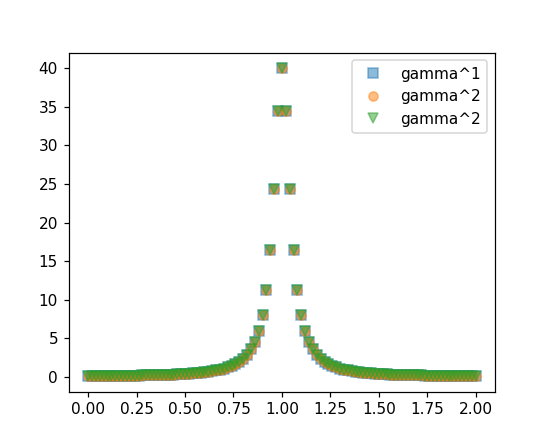

In [124]:
def Breit_Wigner(x, Gamma, cen, amp, off):          # Gamma is total tunneling rate, = Gamma_l + Gamma_r, h*Gamma is energy broadening
    return  amp * (Gamma**2.) / ((x -cen)**2 + (Gamma/2.0)**2) + off

xt = np.linspace(0., 2.0,101)

yt1 = 1.0 * (0.1**1.) / ((xt - 1.0)**2 + (0.1/2.0)**2) + 0.
yt2 = 1.0 * (0.1**2.) / ((xt - 1.0)**2 + (0.1/2.0)**2) + 0.
yt3 = 1.0 * (0.1**3.) / ((xt - 1.0)**2 + (0.1/2.0)**2) + 0.

fig,ax = plt.subplots(figsize = (5,4))
plt.plot(xt, yt1, 's', c ='C0', alpha = 0.5,label = 'gamma^1')
plt.plot(xt, yt2*10,'o',c ='C1', alpha =0.5,label = 'gamma^2')
plt.plot(xt, yt3*100,'v', c ='C2', alpha =0.5,label = 'gamma^2')
plt.legend()

In [95]:
cmap(0.6)

(0.86879300000000004, 0.28772799999999998, 0.40930299999999997, 1.0)

In [339]:
d2.dims.items()#[-1]   # .values()   .items(),  keys()

[(u'PR_sweep(mV)', 26), (u'evol_time', 101)]

In [606]:
Init_vec = np.array([0.006, -0.010]) + np.array([1, -2.30])*(0.012) + np.array([1, 0.56])*(0.012)
print Init_vec

[ 0.03    -0.03088]


In [101]:
d = ex.load_data(h5files()[-3], load_now = True)
print d  #[{'C2 (V)' : 1}]

<xarray.Dataset>
Dimensions:     (block: 3, det_PR: 51, dwell time: 41, rec: 800)
Coordinates:
  * det_PR      (det_PR) float64 0.0 0.4 0.8 1.2 1.6 ... 18.8 19.2 19.6 20.0
  * block       (block) int32 0 1 2
  * rec         (rec) int32 0 1 2 3 4 5 6 7 ... 792 793 794 795 796 797 798 799
  * dwell time  (dwell time) float64 0.0 0.25 0.5 0.75 ... 9.25 9.5 9.75 10.0
Data variables:
    Vrf         (det_PR, block, rec, dwell time) float32 6.0097656e-05 ... 0.005327969
Attributes:
    filename:   181108165619
    status:     L = -0.75 V, PL = -0.2288 V, T = -0.5 V, PR = -0.6665 V, R = ...
    exec_code:  ## Evol_time dependence,    1st order transition dependence\n...


In [455]:
#'SC' in d
sli = d[{'PR (V)' : 100}]
sli['Vrf'].values

array([ 0.01594519,  0.0160131 ,  0.0155749 ,  0.01903844,  0.01789338,
        0.01885371,  0.0188123 ,  0.01884652,  0.01610681,  0.01521027,
        0.01849407,  0.01785301,  0.01840788,  0.01830104,  0.01820784,
        0.0181425 ,  0.01817048,  0.01793404,  0.01761221,  0.0176495 ,
        0.01757153,  0.01745587,  0.0174267 ,  0.01747163,  0.01760167,
        0.01747503,  0.0174622 ,  0.01721734,  0.01710414,  0.01715334,
        0.0171467 ,  0.01721121,  0.0170305 ,  0.01702172,  0.01689728,
        0.01689742,  0.01684887,  0.01682677,  0.0167811 ,  0.01674473,
        0.01672346,  0.01683451,  0.01653087,  0.01659665,  0.01646667,
        0.01652887,  0.0163547 ,  0.01645321,  0.01618782,  0.01614114,
        0.01602678,  0.01611115,  0.01592907,  0.0159755 ,  0.01584047,
        0.01592438,  0.01572725,  0.01576761,  0.01563969,  0.01555151,
        0.01553291,  0.01546944,  0.01548727,  0.0152717 ,  0.01541233,
        0.01528132,  0.01524839,  0.01522414,  0.01505555,  0.01

In [438]:
#d.isel(**{'PC (V)': slice(1,20), 'PR (V)': 0}) method='nearest'
#d.sel( **{'PC (V)': slice(0.05, 0.06), 'CL (V)': -1.48})  # method='pad', 'backfill', 'nearest'
dse = d.sel(method='pad', **{'PC (V)': 0.153})
#d.loc[{'PC (V)': 0}]
#d['PC']

<xarray.Dataset>
Dimensions:  (CL (V): 4, PR (V): 151)
Coordinates:
    CL       (CL (V)) float64 -1.48 -1.52 -1.56 -1.6
    PC       float64 0.04898
    PR       (PR (V)) float64 0.007992 0.009992 0.01199 0.01399 0.01599 ...
  * CL (V)   (CL (V)) float64 -1.48 -1.52 -1.56 -1.6
    PC (V)   float64 0.04898
  * PR (V)   (PR (V)) float64 0.007992 0.009992 0.01199 0.01399 0.01599 ...
Data variables:
    Vrf      (CL (V), PR (V)) float32 0.0832433 0.0832424 0.0832231 0.083242 ...
    dVrf     (CL (V), PR (V)) float32 nan -0.000465249 -0.00960539 ...
    diff1    (CL (V), PR (V)) float32 4.12309e-06 5.70429e-06 -1.93923e-06 ...
    diff2    (CL (V), PR (V)) float32 8.60731e-11 1.87626e-09 3.33186e-11 ...
    Vrf_sub  (CL (V), PR (V)) float32 0.0544935 0.0782935 0.0838023 0.127384 ...
Attributes:
    filename: 171101095547
    comment: L = 0. V, PL = 0. V, CL = -1.48 V, PC = 0.187 V, CR = -1. V, PR = 0.158 V, R = -1.4 V, S = -0.9 V, SL = -1.23 V, SC = -0.2345 V, SR = -0.95 V, rf(rf.frequency

In [340]:
#d['Vrf'].isel(CL (V) = 0)        #d['CL']
#d[{'SC (V)' : 2}]
d.loc[{'SC (V)' : -0.004}]   #[{ 'PC (V)' : 0.03698}]


<xarray.Dataset>
Dimensions:  ()
Coordinates:
    SC       float64 -0.004
    SC (V)   float64 -0.004
Data variables:
    Vrf      float32 -0.0427688
    dVrf     float32 -0.876973
Attributes:
    filename: 171102155625
    comment: L = 0. V, PL = 0. V, CL = -1.53 V, PC = 0.23 V, CR = -1. V, PR = 0.182 V, R = -1.4 V, S = -0.9 V, SL = -1.23 V, SC = 0. V, SR = -0.95 V, rf(rf.frequency=247.600000, rf.power=15.000000), Vps=3.000000, SMU(SMU.voltage=0.000000), AWG(), Bext=0.200000

def scan(var_rng_list, nplc = 1, relative = False, triggered = False):
    max_dim = 4
    if len(var_rng_list) > max_dim:
        raise Exception('Not implemented')
    
    callback_funcs = [lambda:None,]*(max_dim - len(var_rng_list))
    for ax,...

<IPython.core.display.Javascript object>


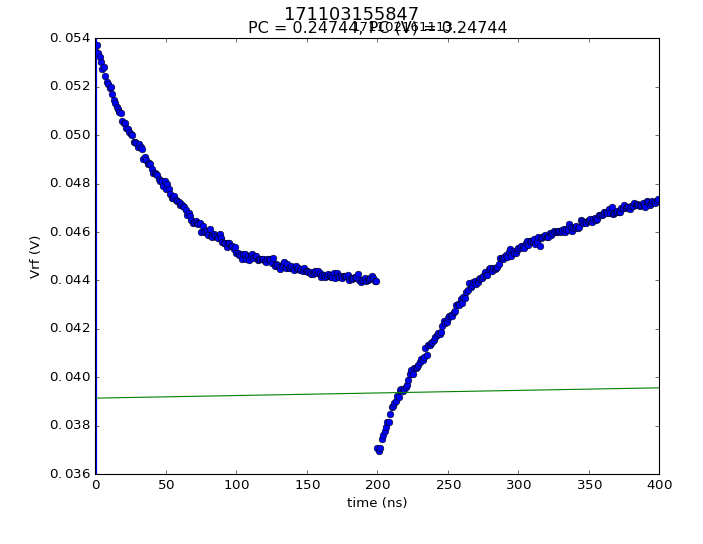

In [360]:
#d = ex.load_data(h5files()[-1], load_now = True)

d = ex.load_data(171102161113)
#d = ex.load_data(170410132638)
#d = ex.load_data(170428164203)
#d = ex.load_data(170501122245)
# d['Vrf_trans'] = d['Vrf'].transpose()
# d['dVrf_trans'] = d['dVrf'].transpose()


# d['Vrf_sub_trans'] = d['Vrf_sub'].transpose()
#cmaps = cm.Spectral
#cmaps = parula_map
fig = plt.figure() #dpi=300
#d1 = d[SMU.voltage = -0.0015]
#tk.plot(d, name = 'Vrf',cmap = 'magma', markerstyle = 'o') # ,interpolation = 'bicubic')#, ylog = True)
x = d['time'].values
y1 = d['Vrf'].values
#y2 = d['dVrf'].values
plt.plot(x,y1,'bo')
plt.show()

plt.xlabel('PC (V)')
plt.ylabel('Vrf (V)')
fig.text(0.5,0.97,d.attrs['filename'])
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
#plt.show()

In [107]:
print repr(d['Vrf'].values)

array([[-0.00572682, -0.00504737, -0.00314335, ...,  0.05697421,
         0.05850061,  0.06047428],
       [-0.00413569, -0.00300707, -0.00106882, ...,  0.05793885,
         0.05944387,  0.06105189],
       [-0.00277167, -0.00201583, -0.0003223 , ...,  0.06000012,
         0.06140639,  0.06299634],
       ..., 
       [ 0.0461007 ,  0.04615396,  0.04756921, ...,  0.1000611 ,
         0.10157296,  0.10281858],
       [ 0.04755374,  0.04824694,  0.0495843 , ...,  0.10107984,
         0.1024965 ,  0.10395044],
       [ 0.04834746,  0.04952399,  0.05064745, ...,  0.10224282,
         0.10287037,  0.10425107]], dtype=float32)


## Single trace

In [497]:
temp_data['ps'].shape #.shape[1]

(41L, 4L, 101L)

VGFiKGNoaWxkcmVuPShWQm94KGNoaWxkcmVuPShIQm94KGNoaWxkcmVuPShEcm9wZG93bihkZXNjcmlwdGlvbj11J25hbWUnLCBpbmRleD0yLCBvcHRpb25zPSh1J1ZyZicsICdwcycsICdwc2HigKY=


<IPython.core.display.Javascript object>


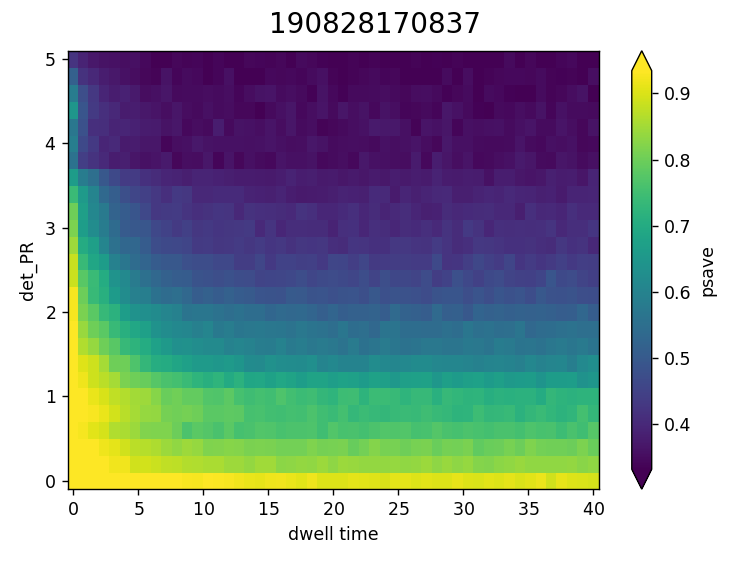

In [270]:
# temp for current dc meas

#temp_data = ex.load_data(h5files()[-3], load_now = True)
temp_data = ex.load_data(190828170837)   # 190816120933
#d = ex.load_data(181102183429)     # ST0

#dsi = ex.load_data(181116194957)    #  transition for poster
#d = ex.load_data(181212210602)     #  funnel T =-0.60, L = -0.46, 9th cool
#d = ex.load_data(181129214110)     #  funnel T =-0.60, L = -0.50, 9th cool
#d = ex.load_data(181127180355)     #  funnel T =-0.60, L = -0.54, 9th cool
#d = ex.load_data(181114190513)    #  funnel T =-0.50,R = +0.2, 8th cool
#d = ex.load_data(181106121714)    #  funnel T =-0.50,R =-0.2, 8th cool
#d = ex.load_data(181101213713)    #  funnel T =-0.50, new cool
#d = ex.load_data(181005183733)    # funnel T =-0.36
#d = ex.load_data(181004234504)   # funnel T =-0.37
#d = ex.load_data(180912205116)  # PSB
#d = ex.load_data(180629172709)  # PSB
#d = ex.load_data(180727192008)
#d= ex.load_data(180731141737)
#d = ex.load_data(170221173807)#170221180738  180912205116
#d = ex.load_data(180521121542)
#d = ex.load_data(170428164203)
#d = ex.load_data(170501122245)
#d = ex.load_data(180413161757)
#d['QG'] = d['current']/(0.001 - d['current']*4300)/(38.63*10**(-6))

#dsi['diff'] = tk.differentiate(dsi['Vrf'], sigma = 0.5)

#dsi['hist'] = tk.hist(dsi.Vrf, axis = -2, range = (-0.008,0.008)) 
#temp_data['ps'] = 1.0 - tk.probability_lower(temp_data.Vrf, -0.018, axis ='rec') # -0.018, axis='rec'
temp_data['ps'] = tk.probability_lower(temp_data.Vrf, 0.0015, axis ='rec') # axis='rec'
#dsi['ps'] = tk.probability_lower(dsi.Vrf, 0.0023, axis ='rec')
temp_data['psave'] = np.mean(temp_data.ps, axis = 1)
#temp_data['psave2'] = np.mean(temp_data.ps, axis = 1) + np.random.rand(41,101)*0.05  # average along blocks
#d['det_PR (mV)'] =
# d['fft'] = tk.new_array(d.ps_, replaced_dim=-1, new_dim='Frequency (MHz)', new_coords=np.fft.rfftfreq(d.ps_.shape[-1], d=1e-3))
# d.fft[:,] = np.abs(np.fft.rfft(d.ps_.values))


# d['fft'] = tk.new_array(d.Vrf, replaced_dim=-1, new_dim='Frequency (MHz)', 
#                        new_coords=np.fft.rfftfreq(d.Vrf.shape[-1], d=1./(1000./8.))) # 1/sampling rate in us
# d.fft[:,] = np.abs(np.fft.rfft(d.Vrf.values))

if [False,True][0]: #subtract plane
    try:
        temp_data['Vrf_sub'] = tk.remove_plane(temp_data['Vrf'])*1e3
        temp_data['Vrf_sub'].attrs['units'] = 'mV'
    except:
        pass
plt.figure()

# t_start, t_stop, i_step = 0e3, 100e+3, 1
# time       = d.Vrf[time_label].values
# i_start, i_stop = aindex(time, t_start), aindex(time, t_stop)
# Vrf     = d.Vrf.values[:,i_start:i_stop]
# Vrf_box = np.average(Vrf.reshape(-1, Vrf.shape[1]/i_step, i_step), axis = -1)
# Vrf_cum = np.cumsum(Vrf_box, axis = 1)/np.arange(1, Vrf_box.shape[1]+1)
# dd = Vrf_cum

#dsel = d.sel( **{'SL (V)': slice(-1.25, -1.35)}) 
#dsel = d.isel( **{'C2 (V)': slice(0, 33)}) 
#d1 = d.sel(**{'repeat': 1})
#d['integ'] =np.cumsum(d.Vrf.values[:,i_start:i_stop],axis = 1)/np.arange(1, Vrf_box.shape[1]+1)
#plt.plot(np.arange(0,Vrf_cum.shape[1]),Vrf_cum[1],'b',np.arange(0,Vrf_cum.shape[1]),Vrf_cum[100],'r',np.arange(0,Vrf_cum.shape[1]),Vrf_cum[800],'g')

tk.plot(temp_data,name ='psave2', cmap ='viridis')   # 'Blues' YlGnBu
#tk.plot(d['ps_'][:,3,:],name ='dVrf', cmap ='Blues') 
#tk.plot(d, name = 'dVrf', cmap ='magma')#, ylog = True)
#tk.plot(d, name = 'ps', cmap ='magma')#, ylog = True
#tk.plot(d)#['fft'][:,1:])#['ps'])#[0,5:9])#,cmap='inferno'

#f1 = tk.implot(d['ps'],interpolation ='none',  cmap ='magma',extent = [0,200,0,100])#, ylog = True) # aspect = 1,
#plt.colorbar(f1, shrink = 0.59, fraction=0.046, pad=0.04) #fraction=0.046, pad=0.04
#tk.plot(d, name = 'current',cmap ='magma')#, ylog = True,'Spectral')
#print d ##

In [600]:
PR [2.34, 3.20,  4.78,  8.40, 17.5 ]
B  [0.20, 0.145, 0.092, 0.05, 0.0178  ]


array([0.    , 0.0002, 0.0004, 0.0006, 0.0008, 0.001 , 0.0012, 0.0014,
       0.0016, 0.0018, 0.002 , 0.0022, 0.0024, 0.0026, 0.0028, 0.003 ,
       0.0032, 0.0034, 0.0036, 0.0038, 0.004 , 0.0042, 0.0044, 0.0046,
       0.0048, 0.005 ])

In [517]:
dsi['det_PR'].values

array([0. , 0.5, 1. , 1.5, 2. , 2.5, 3. , 3.5, 4. , 4.5, 5. ])

## PS fft trace

In [305]:
d.hist[:,1,::]

<xarray.DataArray 'hist' (det_PR (mV): 21, bins: 100, dwell time (ns): 101)>
array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ..., 
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ..., 
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ..., 
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       ..., 
       [[0, 0, 0, ..., 0, 1, 0],
        [1, 1, 0, ..., 0, 1, 1],
        [2, 1, 2, ..., 1, 3, 1],
        ..., 
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ...

In [156]:
np.fft.rfftfreq(125*2,0.4/1000)

array([   0.,   10.,   20.,   30.,   40.,   50.,   60.,   70.,   80.,
         90.,  100.,  110.,  120.,  130.,  140.,  150.,  160.,  170.,
        180.,  190.,  200.,  210.,  220.,  230.,  240.,  250.,  260.,
        270.,  280.,  290.,  300.,  310.,  320.,  330.,  340.,  350.,
        360.,  370.,  380.,  390.,  400.,  410.,  420.,  430.,  440.,
        450.,  460.,  470.,  480.,  490.,  500.,  510.,  520.,  530.,
        540.,  550.,  560.,  570.,  580.,  590.,  600.,  610.,  620.,
        630.,  640.,  650.,  660.,  670.,  680.,  690.,  700.,  710.,
        720.,  730.,  740.,  750.,  760.,  770.,  780.,  790.,  800.,
        810.,  820.,  830.,  840.,  850.,  860.,  870.,  880.,  890.,
        900.,  910.,  920.,  930.,  940.,  950.,  960.,  970.,  980.,
        990., 1000., 1010., 1020., 1030., 1040., 1050., 1060., 1070.,
       1080., 1090., 1100., 1110., 1120., 1130., 1140., 1150., 1160.,
       1170., 1180., 1190., 1200., 1210., 1220., 1230., 1240., 1250.])

In [163]:
raw = ex.load_data(h5files()[-2], load_now = True)
raw.dims.items()

[(u'block', 6), (u'det_PR', 41), (u'dwell time', 126), (u'rec', 200)]

VGFiKGNoaWxkcmVuPShWQm94KGNoaWxkcmVuPShIQm94KGNoaWxkcmVuPShEcm9wZG93bihkZXNjcmlwdGlvbj11J25hbWUnLCBpbmRleD01LCBvcHRpb25zPSh1J1ZyZicsICdwcycsICdmZnTigKY=


<IPython.core.display.Javascript object>


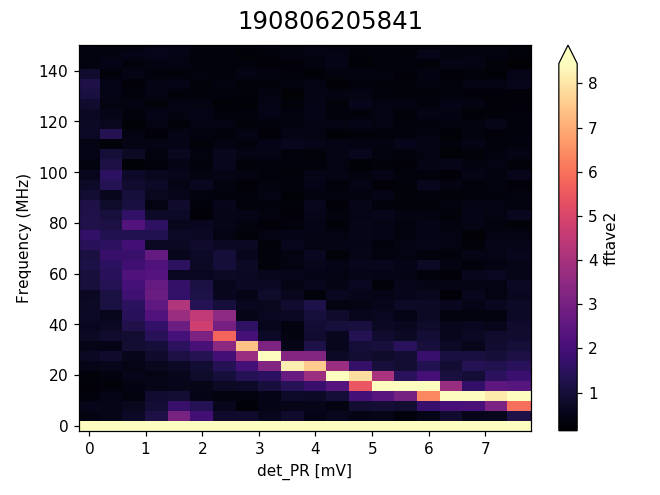

In [275]:
# temp for current dc meas

raw = ex.load_data(h5files()[-1], load_now = True)
raw = ex.load_data(190806205841)
#raw = ex.load_data(181204160510)   # SWAP map ,         B = -0.2 T, T =-0.60, L =-0.5, 9thcool again
#raw = ex.load_data(181116182042)  # interaction 0.005,  B =0.2 T,  T =-0.50, R =+0.2, 8thcool again
#raw = ex.load_data(181116155953)  # interaction 0.005,  B =0.2 T,  T =-0.50, R =+0.2, 8thcool
#raw = ex.load_data(181006001054)  # interaction 0.002,  B =0.1 T,  T =-0.35
#raw = ex.load_data(181005223908)  # interaction 0.006,  B =0.1 T,  T =-0.35
#raw = ex.load_data(181005173816)  # interaction 0.002,  B =0.025,  T =-0.37
#raw = ex.load_data(181005170141)  # interaction 0.004,  B =0.025
#raw = ex.load_data(181005162527)  # interaction 0.004, shifted,  B =0.025
#raw = ex.load_data(181004220316)   # # interaction 0.001,  B =0.1
#raw = ex.load_data(181004211849)  # interaction 0.004,   B =0.1
#raw = ex.load_data(181004154355)
#d = ex.load_data(181004123041)
#d = ex.load_data(180727205614)
#d = ex.load_data(180718155749)
#d = ex.load_data(180628144945)
#d = ex.load_data(180717213030)
#d= ex.load_data(180323170007)
#d = ex.load_data(170221173807)#170221180738
#d = ex.load_data(180711182709)
#d = ex.load_data(170428164203)
#d = ex.load_data(170501122245)
#d = ex.load_data(180413161757)
#d['QG'] = d['current']/(0.001 - d['current']*4300)/(38.63*10**(-6))

#d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)

# when Eject is not perfect, triplet hist has two parts with opposite signs
raw['ps'] = 1.0 - ( tk.probability_lower(raw.Vrf, -0.014, axis ='rec') + (1- tk.probability_lower(raw.Vrf, 0.014, axis ='rec')) )# axis='rec'
#raw['ps'] =  tk.probability_lower(raw.Vrf, 0.015, axis ='rec') # axis='rec'
raw['fft'] = tk.new_array(raw.ps, replaced_dim=-1, new_dim='Frequency (MHz)', 
                        new_coords=np.fft.rfftfreq( raw.ps.shape[-1], d=1./(1000./2.0))) # 1/ evolution interval in us
raw.fft[:,] = np.abs(np.fft.rfft(raw.ps.values))

raw['psave'] = np.mean(raw.ps, axis= 1) # ave along 'block'
raw['fftave'] = np.mean(raw.fft, axis= 1) # ave along 'block'
#d['hist'] = tk.hist(d.Vrf, axis = -2, range = (-0.006,0.004)) # (-0.008,0.008)  (0.02,0.03)

if False: #subtract plane
    try:
        d['Vrf_sub'] = tk.remove_plane(d['Vrf'])*1e3
        d['Vrf_sub'].attrs['units'] = 'mV'
    except:
        pass
plt.figure()

# t_start, t_stop, i_step = 0e3, 100e+3, 1
# time       = d.Vrf[time_label].values
# i_start, i_stop = aindex(time, t_start), aindex(time, t_stop)
# Vrf     = d.Vrf.values[:,i_start:i_stop]
# Vrf_box = np.average(Vrf.reshape(-1, Vrf.shape[1]/i_step, i_step), axis = -1)
# Vrf_cum = np.cumsum(Vrf_box, axis = 1)/np.arange(1, Vrf_box.shape[1]+1)
# dd = Vrf_cum

raw['fftave2'] = raw['fftave'].transpose()
rawsel = raw.sel( **{'det_PR': slice(0., 7.61)}) 

#dsel = d.isel( **{'wait (ns)': slice(0, 29)}) 
#d1 = d.sel(**{'repeat': 1})
#d['integ'] = np.cumsum(d.Vrf.values[:,i_start:i_stop],axis = 1)/np.arange(1, Vrf_box.shape[1]+1)
#plt.plot(np.arange(0,Vrf_cum.shape[1]),Vrf_cum[1],'b',np.arange(0,Vrf_cum.shape[1]),Vrf_cum[100],'r',np.arange(0,Vrf_cum.shape[1]),Vrf_cum[800],'g')

#tk.plot(d, name = 'dVrf', cmap ='magma')#, ylog = True)
tk.plot(rawsel, name = 'psave', cmap ='magma',auto_scale = False)#, ylog = True) auto_scale = False
#tk.plot(d, name='ps')#['fft'][:,1:])#['ps'])#[0,5:9])#,cmap='inferno')
#tk.plot(d.hist[:,1,::])
#f1 = tk.implot(d['Psave'],interpolation ='none',  cmap ='magma',extent = [0,40,0,40])#, ylog = True) # aspect = 1,
#plt.colorbar(f1, shrink = 0.59, fraction=0.046, pad=0.04) #fraction=0.046, pad=0.04
#tk.plot(d, name = 'current',cmap ='magma')#, ylog = True,'Spectral')
#print d
plt.gca().invert_yaxis()
raw.dims.items()

In [168]:
raw.dims.items()[-1]

(u'rec', 200)

(25, slice(None, None, None)) done.Reopened 181010212713.h5 in read-only mode


<IPython.core.display.Javascript object>


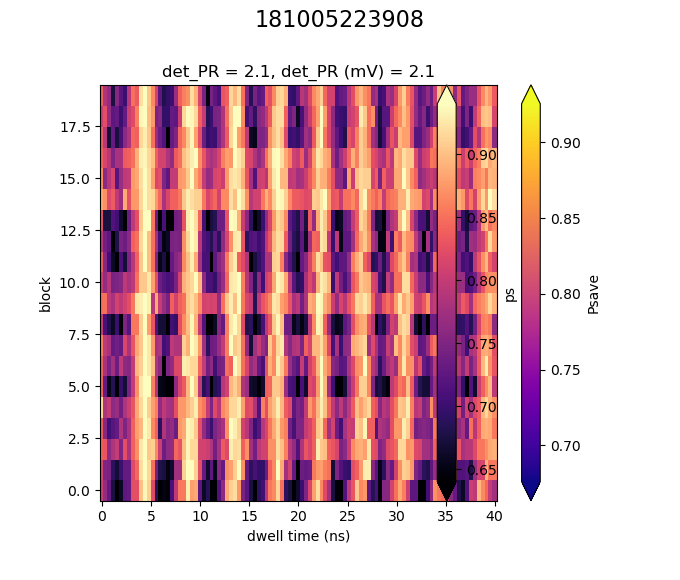

In [539]:
drop_ar =  np.array([19,10,3,13,5, 1,3,2,1,12, 15,5,4,19,3, 0,19,19,18,18, 19,0,1,0,4,16])

PR_sweep = raw['det_PR'].values
prs = len(PR_sweep)                               # PR lens
ad = np.empty([prs, len(raw['block'].values)-1, len(raw['dwell time'].values)]) 
for ind,dr in enumerate(drop_ar):
    ad[ind] = raw.ps[ind].drop([dr],dim ='block')
    
evol_time = raw['dwell time'].values
sweep_vec = np.array([-3.0,-1.0])
with ex.data_store(comment= raw.attrs['filename']+'sweep_vec = %s'%(sweep_vec)+ raw.comment) as ds:
    #ds.axis(det_E, var = 'det_E (ueV)')
    ds.axis(PR_sweep, var = 'PR_sweep(mV)') #,dim = 0 )
    ds.axis(evol_time, var = 'evol_time')
    ds.storage('Psave', noplot = False)
    
    for ii,_ in enumerate(ds.loop()):
        ds.put(np.mean(ad[ii], axis = 0 ), name = 'Psave')   # np.mean(ad[ii], axis = 0 ) average over block to get 1D data

fig, ax = plt.subplots(figsize=(6,5))
tk.plot(ds, name = ['Psave'])

In [332]:
nm = np.array([0,12,3,7,19, 8,16,19,19,19, 18,11,11,3,7, 10,13,0,5,15, 9])

np.fft.rfftfreq(160, d=1./250) # d should be 1/ (how many datapoints per us, = 1us/evol_interval )

array([   0.    ,    1.5625,    3.125 ,    4.6875,    6.25  ,    7.8125,
          9.375 ,   10.9375,   12.5   ,   14.0625,   15.625 ,   17.1875,
         18.75  ,   20.3125,   21.875 ,   23.4375,   25.    ,   26.5625,
         28.125 ,   29.6875,   31.25  ,   32.8125,   34.375 ,   35.9375,
         37.5   ,   39.0625,   40.625 ,   42.1875,   43.75  ,   45.3125,
         46.875 ,   48.4375,   50.    ,   51.5625,   53.125 ,   54.6875,
         56.25  ,   57.8125,   59.375 ,   60.9375,   62.5   ,   64.0625,
         65.625 ,   67.1875,   68.75  ,   70.3125,   71.875 ,   73.4375,
         75.    ,   76.5625,   78.125 ,   79.6875,   81.25  ,   82.8125,
         84.375 ,   85.9375,   87.5   ,   89.0625,   90.625 ,   92.1875,
         93.75  ,   95.3125,   96.875 ,   98.4375,  100.    ,  101.5625,
        103.125 ,  104.6875,  106.25  ,  107.8125,  109.375 ,  110.9375,
        112.5   ,  114.0625,  115.625 ,  117.1875,  118.75  ,  120.3125,
        121.875 ,  123.4375,  125.    ])

In [55]:
PR_sweep = np.linspace(0., 6.4, 17)
sweep_vec = np.array([1,-1.0])  # sweep direction in pulse
det_vec = np.array([1,-2.20])    # actual detuing direc from stability

det_eta = PR_sweep*( 1/np.sqrt(1+det_vec[1]**2) + (np.abs(det_vec[1])/np.sqrt(1+det_vec[1]**2)) * (np.abs(sweep_vec[1])/1) )
det_E = det_eta / 26.5 * 1000
det_E

array([   0.        ,   19.98746297,   39.97492594,   59.96238891,
         79.94985188,   99.93731485,  119.92477782,  139.91224079,
        159.89970376,  179.88716673,  199.8746297 ,  219.86209267,
        239.84955564,  259.83701861,  279.82448158,  299.81194455,
        319.79940752])

### Selection of blocks and storage

Closed 181010011524
(25, slice(None, None, None)) done.Reopened 181010194739.h5 in read-only mode


<IPython.core.display.Javascript object>


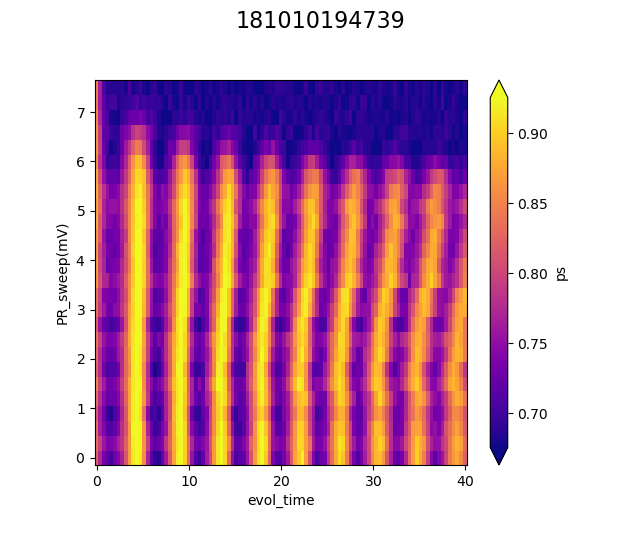

In [508]:
### Selection of good blocks and Storage

#d.ps.shape
PR_sweep = raw['det_PR'].values
prs = len(PR_sweep)                               # PR lens
a1 = np.empty([prs,len(raw['dwell time'].values)]) # PR, dwell time
#nm = np.array([0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0])        # selection of good block in each PR_det
#nm = np.array([7,3,2,15,5, 4,16,1,1,4, 18,0,9,13,13, 19,17,18,7,0, 0,6,9,13,12,2])   # 181004154355 SWAP_detu
#nm = np.array([18,5,7,1,9, 11,13,0,4,10, 13,0,3,4,1, 5,0,5,0,0, 0])   # 181004211849  SWAP_interaction B =0.1, epsilon =0.004
#nm = np.array([16,13,0,19,2, 0,0,11,3,0, 1,7,10,7,16, 5])          # 181004220316   SWAP_interaction B =0.1, epsilon =0.001
#nm = np.array([2,4,11,0,2, 0,4,14,13,1, 11,1,0,2,0, 0,0,0,0,0, 0]) #181005170141 SWAP_interaction B =0.025 ,epsilon =0.004
#nm = np.array([5,3,2,0,2, 5,15,9,1,7, 0,0,2,3,2, 1,2,2,2,3, 3])   #181005173816 SWAP_interaction B =0.025 , T =-0.37,  epsilon =0.002
#nm = np.array([0,3,18,17,15, 17,5,0,1,0, 16,0,15,9,13, 2,18,5,16,12, 5,5,11,11,15,13])   #181005223908 ,SWAP_interaction B = 0.1,T =-0.35 ,epsilon =0.006, 181009163103      
#nm = np.array([0,12,3,7,19, 8,16,18,19,19, 18,11,10,3,0, 10,13,0,12,15, 2]) #181006001054 SWAP_interaction B = 0.1, T =-0.35,epsilon =0.002,181009180504
#nm = np.array([0,12,3,7,19, 8,16,19,19,19, 18,11,11,3,7, 10,13,0,12,15, 9]) #181006001054 SWAP_interaction B = 0.1, T =-0.35,epsilon =0.002, 181009210155
#nm = np.array([0,12,3,7,19, 8,16,19,19,19, 18,11,11,3,7, 10,13,0,5,15, 19]) #181006001054 SWAP_interaction B = 0.1, T =-0.35,epsilon =0.002, 181009212606
#nm = np.array([0,12,3,7,19, 8,16,19,19,19, 18,11,11,3,7, 10,13,0,5,15, 17]) #181006001054 SWAP_interaction B = 0.1, T =-0.35,epsilon =0.002, 181009213349
nm = np.array([0,12,3,7,19, 8,16,19,19,19, 18,11,11,3,7, 10,13,0,5,15, 9]) #181006001054 SWAP_interaction B = 0.1, T =-0.35,epsilon =0.002, 181009215148
nm = np.array([0,3,18,17,15, 17,5,0,18,0, 16,0,15,9,13, 2,18,5,16,12, 5,5,11,11,15,13])   #181005223908 ,SWAP_interaction B = 0.1,T =-0.35 ,epsilon =0.006, 181009163103  

for n1 in range(prs):
    #a1[n1,:] = raw.ps[n1,nm[n1],:] # PR, block, dwell time
    a1[n1,:] = raw.Psave[n1,:] # PR, block, dwell time
    
# a1[0,:] = d.ps[0,14,:]          # PR, block, dwell time
# a1[1,:] = d.ps[1,14,:]
# a1[2,:] = d.ps[2,12,:]
# a1[3,:] = d.ps[3,18,:]
# a1[4,:] = d.ps[4,9,:]
# a1[5,:] = d.ps[5,6,:]
# a1[6,:] = d.ps[6,18,:]
# a1[7,:] = d.ps[7,5,:]
# a1[8,:] = d.ps[8,4,:]

#PR_sweep = np.linspace(0., 6.4, 17) # mV ,in pulse,along (1, -1.5), but actual detuning is (1, -1.9)
#delta_PR = 5.6 - np.linspace(0., 2.8, 8)*2
sweep_vec = np.array([1.,-1.0])  # sweep direction in pulse
det_vec = np.array([1.,-2.70])    # actual detuing direc from stability

det_eta = PR_sweep*( np.abs(det_vec[0])/np.sqrt(det_vec[0]**2+det_vec[1]**2) + (np.abs(det_vec[1])/np.sqrt(det_vec[0]**2+det_vec[1]**2)) * np.abs(sweep_vec[1]/sweep_vec[0]) )
det_E = det_eta / 26.5 * 1000 # ueV, 27mV /meV lever along detuing

evol_time = raw['dwell time'].values

with ex.data_store(comment= raw.attrs['filename']+'det_vec = %s'%(det_vec)+ raw.comment) as ds:
    #ds.axis(det_E, var = 'det_E (ueV)')
    ds.axis(PR_sweep, var = 'PR_sweep(mV)') #,dim = 0 )
    ds.axis(evol_time, var = 'evol_time')
    ds.storage('ps', noplot = True)
    
    for ii,_ in enumerate(ds.loop()):
        ds.put(a1[ii,:], name = 'ps')

fig, ax = plt.subplots(figsize=(6,5))

# ax1 = ax.imshow(a1, cmap= 'plasma',interpolation = 'None', aspect = (evol_time[0]-evol_time[-1])/(det_E[0]-det_E[-1]),  
#                 vmin= 0.1, vmax= 0.7, extent= [evol_time[0],evol_time[-1],det_E[0],det_E[-1] ])
# plt.show()
tk.plot(ds, name = ['ps'])

#print repr(a1)

<IPython.core.display.Javascript object>


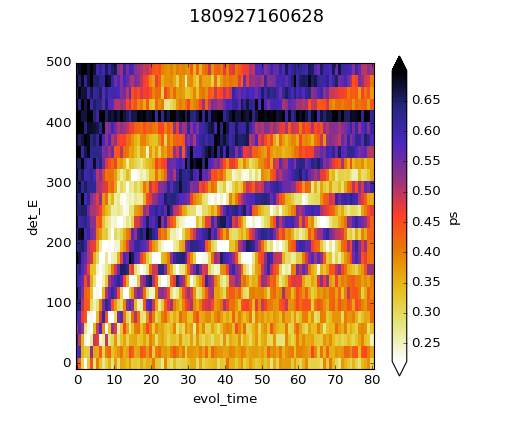

In [54]:
#tk.plot(ds, name = ['ps'])
fig, ax = plt.subplots(figsize=(6,5))

# ax1 = ax.imshow(a1, cmap= 'plasma',interpolation = 'none', aspect = (evol_time[0]-evol_time[-1])/(det_E[0]-det_E[-1]),  
#                 vmin= 0.1, vmax= 0.7, extent= [evol_time[0],evol_time[-1],det_E[0],det_E[-1] ])
# plt.show()
tk.plot(ds, name = ['ps'])

In [76]:
#ds1 = ex.load_data(h5files()[-1], load_now = True)
# print repr(ds.comment)
print ds['det_E (ueV)']

<xarray.DataArray 'det_E (ueV)' (det_E (ueV): 26)>
array([   0.      ,   19.397179,   38.794358,   58.191537,   77.588716,
         96.985896,  116.383075,  135.780254,  155.177433,  174.574612,
        193.971791,  213.36897 ,  232.766149,  252.163329,  271.560508,
        290.957687,  310.354866,  329.752045,  349.149224,  368.546403,
        387.943582,  407.340761,  426.737941,  446.13512 ,  465.532299,
        484.929478])
Coordinates:
  * det_E (ueV)  (det_E (ueV)) float64 0.0 19.4 38.79 ... 446.1 465.5 484.9


VGFiKGNoaWxkcmVuPShWQm94KGNoaWxkcmVuPShIQm94KGNoaWxkcmVuPShEcm9wZG93bihkZXNjcmlwdGlvbj11J25hbWUnLCBvcHRpb25zPSh1J3BzJywgJ2ZmdCcpLCB2YWx1ZT11J3BzJynigKY=


<IPython.core.display.Javascript object>


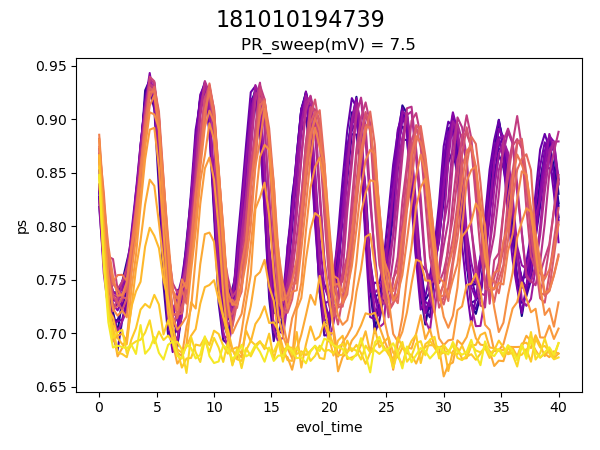

In [58]:
d1 = ex.load_data(h5files()[-1], load_now = True)
d1 = ex.load_data(181010194739) #  181005145350,181010194739
#d1 = ex.load_data(181004223216)

d1['fft'] = tk.new_array(d1.ps, replaced_dim=-1, new_dim='Frequency (MHz)', 
                        new_coords=np.fft.rfftfreq(d1.ps.shape[-1], d=1./(1000./0.2))) # 1/sampling rate in us

d1.fft[:,] = np.abs(np.fft.rfft(d1.ps.values))

keyw = {'interpolation' : 'bicubic'}
#fig, ax = plt.subplots(figsize = (6,5))
#tk.plot(d1, **keyw)
tk.plot(d1, name = 'ps')
#plt.xlabel('s')

In [75]:
t_start, t_stop, i_step = 0e3, 100e+3, 1
time       = d.Vrf[time_label].values
i_start, i_stop = aindex(time, t_start), aindex(time, t_stop)
Vrf     = d.Vrf.values[:,i_start:i_stop]
Vrf_box = np.average(Vrf.reshape(-1, Vrf.shape[1]/i_step, i_step), axis = -1)
Vrf_cum = np.cumsum(Vrf_box, axis = 1)/np.arange(1, Vrf_box.shape[1]+1)
print repr(Vrf),Vrf.shape
print repr(Vrf_box),Vrf_box.shape
print repr(Vrf_cum),Vrf_cum.shape

array([[ 0.00734507, -0.01570181,  0.0282435 , ...,  0.01249644,
        -0.00703481,  0.0214564 ],
       [ 0.00892722, -0.02137063,  0.01263816, ...,  0.02250144,
        -0.02622903,  0.00358054],
       [ 0.02737503, -0.02086716,  0.01814652, ...,  0.01731644,
        -0.01190719,  0.00640335],
       ..., 
       [ 0.02467489, -0.01768351,  0.01996298, ...,  0.03268271,
        -0.00679483,  0.0081954 ],
       [ 0.03008566, -0.01610574,  0.00310812, ...,  0.03604269,
         0.00044699, -0.01774149],
       [ 0.02251711, -0.01190672, -0.01263914, ...,  0.03911867,
         0.03296633, -0.00209227]], dtype=float32) (1000L, 12500L)
array([[ 0.00734507, -0.01570181,  0.0282435 , ...,  0.01249644,
        -0.00703481,  0.0214564 ],
       [ 0.00892722, -0.02137063,  0.01263816, ...,  0.02250144,
        -0.02622903,  0.00358054],
       [ 0.02737503, -0.02086716,  0.01814652, ...,  0.01731644,
        -0.01190719,  0.00640335],
       ..., 
       [ 0.02467489, -0.01768351,  0.01996

<IPython.core.display.Javascript object>


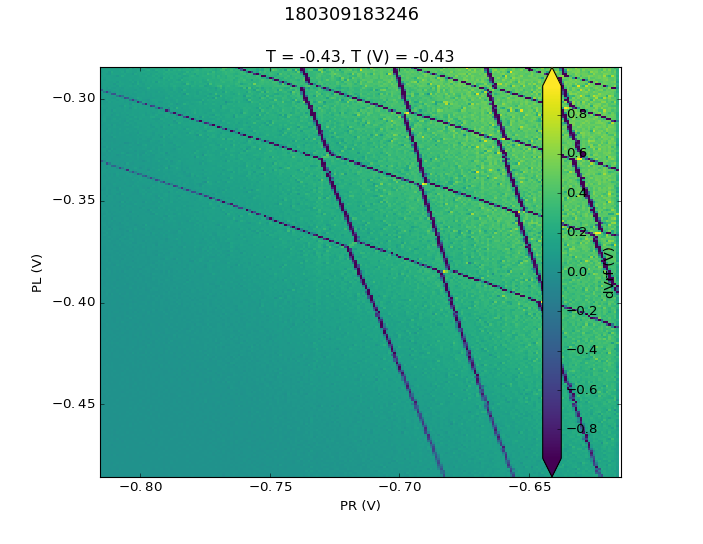

In [11]:
#d = ex.load_data(h5files()[-1], load_now = True)
d= ex.load_data(180308215631)    # repeated dutuning sweep for Te
#d= ex.load_data(170410132638)
#d = ex.load_data(170428164203)
#d = ex.load_data(170501122245)
#d = ex.load_data(h5files()[-1], load_now = True)
# d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)
if False: #subtract plane
    try:
        d['Vrf_sub'] = tk.remove_plane(d['Vrf'])*1e3
        d['Vrf_sub'].attrs['units'] = 'mV'
    except:
        pass
#cmaps = cm.Spectral
plt.figure()
dsel = d.isel( **{'C2 (V)': slice(0, 33)}) 
tk.plot(dsel, **{'cmap': 'magma', 'linewidth': 3})  #, ylog = True)
#tk.plot(d, name = 'current',cmap ='magma')#, ylog = True,'Spectral')
#print d

<IPython.core.display.Javascript object>


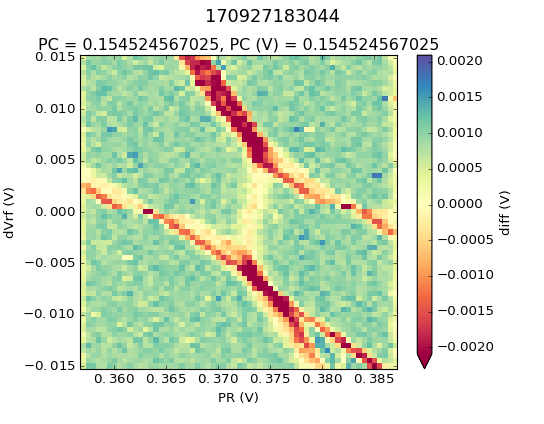

In [150]:
#d = ex.load_data(h5files()[-1], load_now = True)
#d = ex.load_data(170915173509)
d = ex.load_data(170128172932)
d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)
if True: #subtract plane
    try:
        d['Vrf_sub'] = tk.remove_plane(d['Vrf'])*1e3
        d['Vrf_sub'].attrs['units'] = 'mV'
    except:
        pass
# #cmaps = cm.Spectral
plt.figure()
tk.plot(d, name = 'Vrf',cmap ='Spectral')#, ylog = True)

In [611]:
#np.linspace(0,20,5)
np.arange(0,20,5)

array([ 0,  5, 10, 15])

## Oscillation fit (damp)

<IPython.core.display.Javascript object>


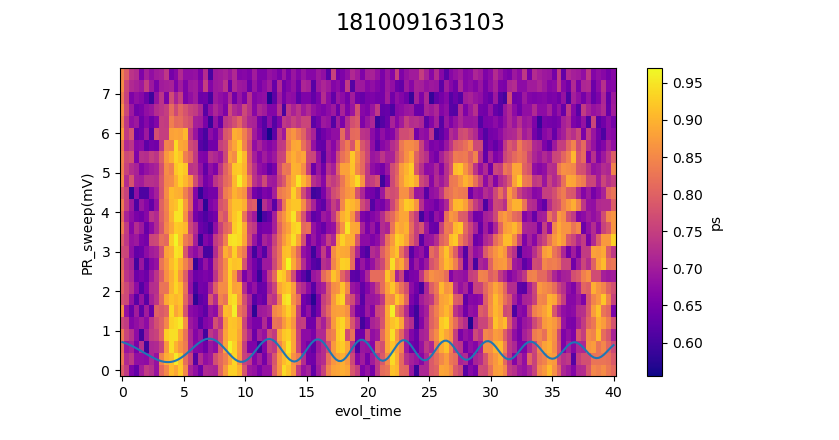

In [2]:
# Cosine chirped (freq by a expential at small t ),  with Gaussian decay 

def Osc_gau(t, A, phi0,  T_J, tc, B, td, off): 
    omg = 2*np.pi/ (B*np.exp(-t/tc) + T_J)
    y = A*np.cos(omg*t + phi0) * np.exp(-(t/td)**2) + off
    return y

#time1 = np.linspace(0,40,201)

#Pstest = Exc_osc(t = time1, A =0.3, phi0 = 0.8, T_J =4., tc =9., B = 9., td = 60. , off = 0.5)

fig, ax = plt.subplots(figsize= (8,4))

ax.plot(time1, Pstest)
    

[[Model]]
    Model(Exc_osc)
[[Fit Statistics]]
    # function evals   = 160
    # data points      = 81
    # variables        = 7
    chi-square         = 0.072
    reduced chi-square = 0.001
    Akaike info crit   = -555.228
    Bayesian info crit = -538.467
[[Variables]]
    A:      0.13914638 +/- 0.008329 (5.99%) (init= 0.3)
    phi0:   2.47146864 +/- 0.165295 (6.69%) (init= 0.9)
    T_J:    1.30234556 +/- 0.017721 (1.36%) (init= 1)
    tc:     5.37216301 +/- 0.385564 (7.18%) (init= 5)
    T0:     1.42904159 +/- 0.104933 (7.34%) (init= 1)
    td:     14.5655987 +/- 1.327489 (9.11%) (init= 10)
    off:    0.77603517 +/- 0.003479 (0.45%) (init= 0.5)
[[Correlations]] (unreported correlations are <  0.250)
    C(T_J, tc)                   = -0.959 
    C(tc, T0)                    = -0.885 
    C(phi0, T0)                  =  0.878 
    C(T_J, T0)                   =  0.764 
    C(phi0, tc)                  = -0.668 
    C(A, td)                     = -0.625 
    C(phi0, T_J)         

<IPython.core.display.Javascript object>


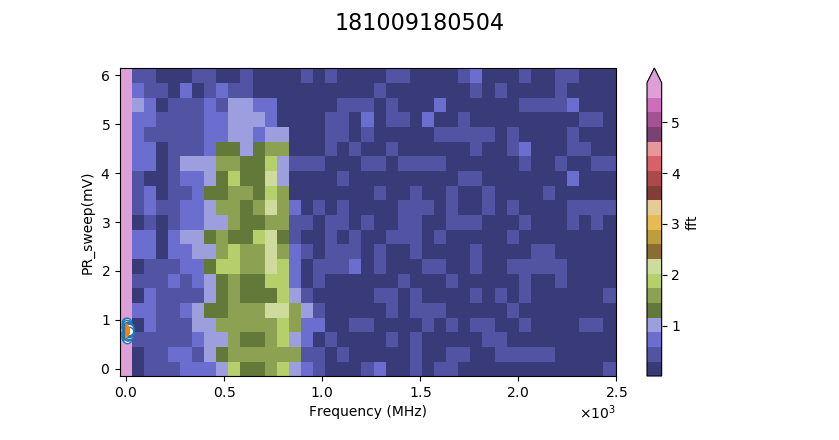

In [18]:
def Exc_osc(t, A, phi0,  T_J, tc, T0, td, off):
    omg = 2*np.pi/ (T0*np.exp(-t/tc) + T_J)
    y = A*np.cos(omg*t + phi0) * np.exp(-(t/td)**2) + off
    return y

d2 = ex.load_data(181009180504)
y0 = d2['ps'].values
x = d2['evol_time'].values

model  = lmfit.Model(Exc_osc, independent_vars=['t'])
result = model.fit(y0[0], t = x,
                   A = lmfit.Parameter(value = 0.3),
                   phi0   = lmfit.Parameter(value = 0.9),
                   T_J    = lmfit.Parameter(value = 1., min = 0.5, max = 5.0),
                   tc     = lmfit.Parameter(value = 5., min = 1., max = 12.0),
                   T0     = lmfit.Parameter(value = 1., min = 0.1, max = 10.0),
                   td     = lmfit.Parameter(value = 10., min = 1., max = 50.0),
                   off     = lmfit.Parameter(value = 0.5, min = 0.1, max = 1.0)) 

A, phi0,  T_J, tc, T0, td, off = (result.best_values[key] for key in model.param_names)

print(result.fit_report(min_correl=0.25))


fig, ax = plt.subplots(figsize= (8,4))

ax.plot(x, y0[0], 'o', ms=6, mfc = 'w')  # 'skyblue'
x_span = np.arange(x.min(), 1.*x.max(), 0.1)
ax.plot(x_span, model.func(x_span, **result.best_values), linewidth = 1) 

In [31]:
range(0)

[]

### loop fit

In [494]:
fun = [Osc_gau,Osc_exp][0]
print fun

<function Osc_gau at 0x00000001A61E2048>


In [2]:
off = 0.6

In [4]:
# fit_list = [A_array, phi0_array, T_J_array, tc_array,T0_array, td_array, a_array, off_array]
# for iarray in fit_list:
#     iarray = np.empty(len(lab))
d2 = ex.load_data(181010194739)  # 181009215148, 181010011524, 
# y0 = d2['ps'].values
# x = d2['evol_time'].values
lab = d2['PR_sweep(mV)'].values
A_array, phi0_array, T_J_array, tc_array,T0_array, td_array, factor_array,slo_array, off_array = np.empty(len(lab)),np.empty(len(lab)),np.empty(len(lab)),np.empty(len(lab)),np.empty(len(lab)),np.empty(len(lab)),np.empty(len(lab)),np.empty(len(lab)),np.empty(len(lab))
A_er, phi0_er, T_J_er, tc_er,T0_er, td_er, factor_er, slo_er, off_er = np.empty(len(lab)),np.empty(len(lab)),np.empty(len(lab)),np.empty(len(lab)),np.empty(len(lab)),np.empty(len(lab)),np.empty(len(lab)),np.empty(len(lab)),np.empty(len(lab))

In [5]:
# b1,b2,b3 = np.round([0.0126782, 0.085764, 1.54352], 5)
# print b3

d2['evol_time'].values

array([ 0. ,  0.4,  0.8,  1.2,  1.6,  2. ,  2.4,  2.8,  3.2,  3.6,  4. ,
        4.4,  4.8,  5.2,  5.6,  6. ,  6.4,  6.8,  7.2,  7.6,  8. ,  8.4,
        8.8,  9.2,  9.6, 10. , 10.4, 10.8, 11.2, 11.6, 12. , 12.4, 12.8,
       13.2, 13.6, 14. , 14.4, 14.8, 15.2, 15.6, 16. , 16.4, 16.8, 17.2,
       17.6, 18. , 18.4, 18.8, 19.2, 19.6, 20. , 20.4, 20.8, 21.2, 21.6,
       22. , 22.4, 22.8, 23.2, 23.6, 24. , 24.4, 24.8, 25.2, 25.6, 26. ,
       26.4, 26.8, 27.2, 27.6, 28. , 28.4, 28.8, 29.2, 29.6, 30. , 30.4,
       30.8, 31.2, 31.6, 32. , 32.4, 32.8, 33.2, 33.6, 34. , 34.4, 34.8,
       35.2, 35.6, 36. , 36.4, 36.8, 37.2, 37.6, 38. , 38.4, 38.8, 39.2,
       39.6, 40. ])

<IPython.core.display.Javascript object>


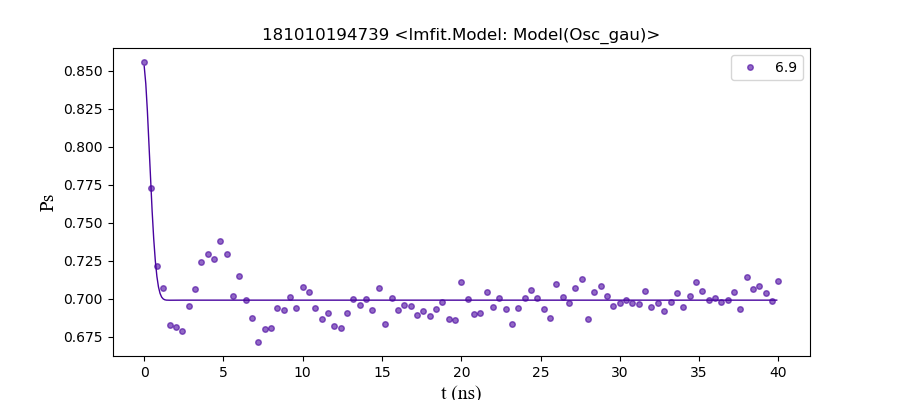

[[Model]]
    Model(Osc_gau)
[[Fit Statistics]]
    # function evals   = 427
    # data points      = 98
    # variables        = 8
    chi-square         = 0.012
    reduced chi-square = 0.000
    Akaike info crit   = -870.811
    Bayesian info crit = -850.132
[[Variables]]
    A:      0.19999999 +/- nan      (nan%) (init= 0.064)
    phi0:   0.69262574 +/- nan      (nan%) (init= 0.1)
    T_J:    5.52725318 +/- 3.60e+08 (6513253142.18%) (init= 3.4)
    tc:     19.9999945 +/- nan      (nan%) (init= 1)
    T0:     4.99999977 +/- 4.53e+08 (9060262946.26%) (init= 0.1)
    td:     0.63510602 +/- nan      (nan%) (init= 3)
    slo:   -0.00052260 +/- 0.000107 (20.54%) (init=-0.002)
    off:    0.69905017 +/- 0.002575 (0.37%) (init= 0.72)
[[Correlations]] (unreported correlations are <  0.250)
    C(T_J, T0)                   = -1.043 
    C(slo, off)                  = -0.892 



In [6]:
# loop fit  #,SWAP_interaction B = 0.1,T =-0.35 ,epsilon = 0.006, 181010011524


def Osc_gau(t, A, phi0,  T_J, tc, T0, td, slo, off):
    omg = 2*np.pi/ (T0*np.exp(-t/tc) + T_J)
    y = A*np.cos(omg*t + phi0) * np.exp(-(t/td)**2) + off+ slo*t
    return y

def Osc_exp(t, A, phi0,  T_J, tc, T0, td, slo, off):
    omg = 2*np.pi/ (T0*np.exp(-t/tc) + T_J)
    y = A*np.cos(omg*t + phi0) * np.exp(-(t/td)) + off+ slo*t
    return y

def Osc_factor(t, A, phi0,  T_J, tc, T0, td, slo, off):
    omg = 2*np.pi/ (T0*np.exp(-t/tc) + T_J)
    y = A*np.cos(omg*t + phi0) * np.exp(-(t/td)) + off+ slo*t
    return y

d2 = ex.load_data(181010194739)  # 181009215148, 181010011524, 
y0 = d2['ps'].values
x = d2['evol_time'].values
lab = d2['PR_sweep(mV)'].values
#y1= raw.ps[20,9,:].values  # PR, block, time
#y1= np.mean(raw.ps[20,:,:].values, axis = 0)  # PR, block, time

fig, ax = plt.subplots(figsize= (9,4))
cmap = cm.get_cmap('plasma')

op = 1
PR_ind = 23
for nn in [range(len(lab)),[PR_ind]][op]:  #  range(len(lab)) , [17]
    y = y0[nn] #  y1, 
    fun = [Osc_gau,Osc_exp, Osc_factor][ 0]  # fitting function option, 0 Gaussian, 1 Exponential
    model  = lmfit.Model(fun, independent_vars=['t'])
    result = model.fit(y[np.r_[0:4,7:101]], t = x[np.r_[0:4,7:101]],
                       A    = lmfit.Parameter(value = 0.064, min = 0.0, max = 0.2),
                       phi0   = lmfit.Parameter(value = 0.1, min = 0., max = np.pi*0.5), # np.pi*0.5
                       T_J    = lmfit.Parameter(value = 3.4, min = 0.1, max = 10.0), 
                       tc     = lmfit.Parameter(value = 1., min = 0.00, max = 20.0),
                       T0     = lmfit.Parameter(value = 0.1, min = 0.0, max = 5.0),
                       td     = lmfit.Parameter(value = 3., min = 0.1, max = 50.0),
                       slo     = lmfit.Parameter(value = -0.002, min = -0.02, max = 0.02),
                       off     = lmfit.Parameter(value = 0.72, min = 0.1, max = 1.0)) 

    A, phi0,  T_J, tc, T0, td, slo, off = (result.best_values[key] for key in model.param_names)

    print(result.fit_report(min_correl=0.25))
    A_array[nn], phi0_array[nn],T_J_array[nn], tc_array[nn], T0_array[nn], td_array[nn], slo_array[nn], off_array[nn] = A,phi0, T_J, tc, T0, td, slo, off 
    
    A_er[nn],phi0_er[nn], T_J_er[nn] = np.round([result.params['A'].stderr,result.params['phi0'].stderr,result.params['T_J'].stderr],5)
    tc_er[nn],T0_er[nn], td_er[nn] = np.round([result.params['tc'].stderr,result.params['T0'].stderr,result.params['td'].stderr],5)
    slo_er[nn], off_er[nn] = np.round([result.params['slo'].stderr,result.params['off'].stderr],5)
    
    if op == 0:
        f1 = ax.plot(x, y+0.3*nn - slo*x , 'o', c = cmap(1.-nn*1.0/(1.0*len(lab))), ms= 4, alpha = 0.6, label = '%s'%(lab[nn]) )  
        x_span = np.arange(x.min(), 1.*x.max(), 0.1)
        ax.plot(x_span, model.func(x_span, **result.best_values)+0.3*nn - slo*x_span, c = cmap(1.-nn*1.0/(1.0*len(lab))),lw = 1) 
    else:
        f1 = ax.plot(x, y - slo*x , 'o', c = cmap(1.-nn*1.0/(1.0*len(lab))), ms= 4, alpha = 0.6, label = '%s'%(round(lab[nn],3)) )   # - slo*x
        x_span = np.arange( x.min() , 1.*x.max(), 0.1)
        ax.plot(x_span, model.func(x_span, **result.best_values) - slo*x_span, c = cmap(1.-nn*1.0/(1.0*len(lab))),lw = 1)        # - slo*x_span  
    
    plt.xlabel('t (ns)', size = 14, fontname = 'Times New Roman') # style = 'italic'
    plt.ylabel('Ps', size = 14, fontname = 'Times New Roman')
    leg = ax.legend()    #(f1," %s" %(lab[nn]),prop={'size':8, 'family': 'Times New Roman'})
    ax.set_title(d2.filename + ' %s'%(model))



<IPython.core.display.Javascript object>


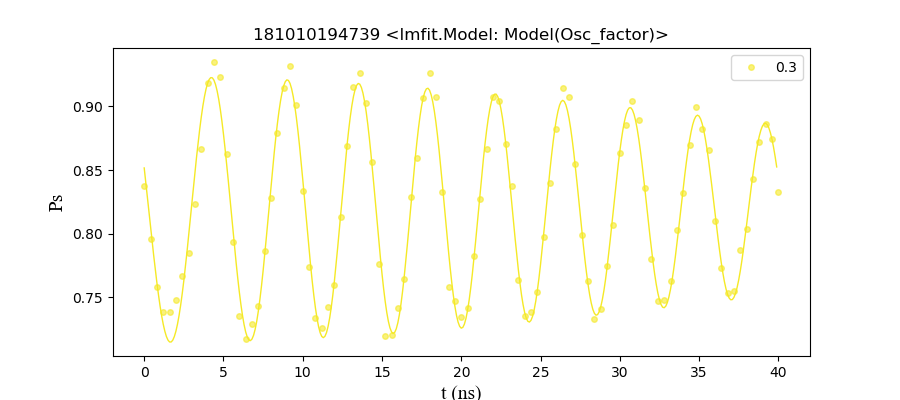

[[Model]]
    Model(Osc_factor)
[[Fit Statistics]]
    # function evals   = 407
    # data points      = 101
    # variables        = 9
    chi-square         = 0.012
    reduced chi-square = 0.000
    Akaike info crit   = -897.098
    Bayesian info crit = -873.562
[[Variables]]
    A:        0.10450159 +/- 0.003824 (3.66%) (init= 0.14)
    phi0:     1.25202180 +/- 0.063231 (5.05%) (init= 0.7)
    T_J:      4.39431498 +/- 0.015377 (0.35%) (init= 4.8)
    tc:       12.7766241 +/- 0.881639 (6.90%) (init= 5)
    T0:       1.25468509 +/- 0.094754 (7.55%) (init= 0.2)
    td:       59.7484200 +/- 10.57010 (17.69%) (init= 20)
    factor:   1.99999999 +/- 0.027943 (1.40%) (init= 1.1)
    slo:     -5.9693e-05 +/- 9.96e-05 (166.88%) (init=-0.002)
    off:      0.81887654 +/- 0.002306 (0.28%) (init= 0.82)
[[Correlations]] (unreported correlations are <  0.250)
    C(T_J, tc)                   = -0.949 
    C(td, factor)                =  0.913 
    C(slo, off)                  = -0.871 
    C(phi

In [15]:
# loop fit  #,SWAP_interaction B = 0.1,T =-0.35 ,epsilon = 0.006, 181010011524


def Osc_gau_sim(t, A, phi0,  T_J,  td, slo, off):
    omg = 2*np.pi/  T_J
    y = A*np.cos(omg*t + phi0) * np.exp(-(t/td)**2) + off+ slo*t
    return y

def Osc_exp_sim(t, A, phi0,  T_J, td, slo, off):
    omg = 2*np.pi/  T_J
    y = A*np.cos(omg*t + phi0) * np.exp(-(t/td)) + off+ slo*t
    return y

def Osc_factor(t, A, phi0,  T_J, tc, T0, td, factor, slo, off):
    omg = 2*np.pi/ (T0*np.exp(-t/tc) + T_J)
    y = A*np.cos(omg*t + phi0) * np.exp(-(t/td)**factor) + off+ slo*t
    return y

def Osc_factor_sim(t, A, phi0,  T_J, td, factor, slo, off):
    omg = 2*np.pi/  T_J
    y = A*np.cos(omg*t + phi0) * np.exp(-(t/td)**factor) + off+ slo*t
    return y

d2 = ex.load_data(181010194739)  # 181009215148, 181010011524, 
y0 = d2['ps'].values
x = d2['evol_time'].values
lab = d2['PR_sweep(mV)'].values
#y1= raw.ps[20,9,:].values  # PR, block, time
#y1= np.mean(raw.ps[20,:,:].values, axis = 0)  # PR, block, time

fig, ax = plt.subplots(figsize= (9,4))
cmap = cm.get_cmap('plasma')

op = 1
PR_ind = 1
for nn in [range(len(lab)),[PR_ind]][op]:  #  range(len(lab)) , [17]
    y = y0[nn] #  y1, 
    fun = [Osc_gau_sim,Osc_exp_sim, Osc_factor][ 2]  # fitting function option, 0 Gaussian, 1 Exponential
    model  = lmfit.Model(fun, independent_vars=['t'])
    result = model.fit(y, t = x,            # x[np.r_[0:3,7:11,12:14,15:101]]
                       A    = lmfit.Parameter(value = 0.14, min = 0.0, max = 0.2),
                       phi0   = lmfit.Parameter(value = 0.7, min = 0., max = np.pi*0.5), # np.pi*0.5
                       T_J    = lmfit.Parameter(value = 4.8, min = 0.1, max = 5.0), 
                       tc     = lmfit.Parameter(value = 5., min = 0.00, max = 50.0),
                       T0     = lmfit.Parameter(value = 0.2, min = 0.0, max = 10.0),
                       td     = lmfit.Parameter(value = 20., min = 0.1, max = 100.0),
                       factor  = lmfit.Parameter(value = 1.1, min = 0.1, max = 2.0),
                       slo     = lmfit.Parameter(value = -0.002, min = -0.02, max = 0.02),
                       off     = lmfit.Parameter(value = 0.82, min = 0.1, max = 1.0)) 

    A, phi0,  T_J, tc,T0, td, factor, slo, off = (result.best_values[key] for key in model.param_names)

    print(result.fit_report(min_correl=0.25))
    A_array[nn], phi0_array[nn],T_J_array[nn], tc_array[nn], T0_array[nn], td_array[nn],factor_array[nn], slo_array[nn], off_array[nn] = A,phi0, T_J, tc, T0, td,factor, slo, off 
    
    A_er[nn],phi0_er[nn], T_J_er[nn] = np.round([result.params['A'].stderr,result.params['phi0'].stderr,result.params['T_J'].stderr],5)
    tc_er[nn],T0_er[nn], td_er[nn] = np.round([result.params['tc'].stderr,result.params['T0'].stderr,result.params['td'].stderr],5)
    factor_er[nn],slo_er[nn], off_er[nn] = np.round([result.params['factor'].stderr,result.params['slo'].stderr,result.params['off'].stderr],5)
    
    if op == 0:
        f1 = ax.plot(x, y+0.3*nn - slo*x , 'o', c = cmap(1.-nn*1.0/(1.0*len(lab))), ms= 4, alpha = 0.6, label = '%s'%(lab[nn]) )  
        x_span = np.arange(x.min(), 1.*x.max(), 0.1)
        ax.plot(x_span, model.func(x_span, **result.best_values)+0.3*nn - slo*x_span, c = cmap(1.-nn*1.0/(1.0*len(lab))),lw = 1) 
    else:
        f1 = ax.plot(x, y - slo*x , 'o', c = cmap(1.-nn*1.0/(1.0*len(lab))), ms= 4, alpha = 0.6, label = '%s'%(round(lab[nn],3)) )   # - slo*x
        x_span = np.arange( x.min() , 1.*x.max(), 0.1)
        ax.plot(x_span, model.func(x_span, **result.best_values) - slo*x_span, c = cmap(1.-nn*1.0/(1.0*len(lab))),lw = 1)        # - slo*x_span  
    
    plt.xlabel('t (ns)', size = 14, fontname = 'Times New Roman') # style = 'italic'
    plt.ylabel('Ps', size = 14, fontname = 'Times New Roman')
    leg = ax.legend()    #(f1," %s" %(lab[nn]),prop={'size':8, 'family': 'Times New Roman'})
    ax.set_title(d2.filename + ' %s'%(model))



In [405]:
np.mean(y)

0.68593067

In [408]:
atest = np.array([0,1,2,3,4,5,6,7,8,9])
atest[np.r_[0:3,4:6]]

array([0, 1, 2, 4, 5])

<IPython.core.display.Javascript object>


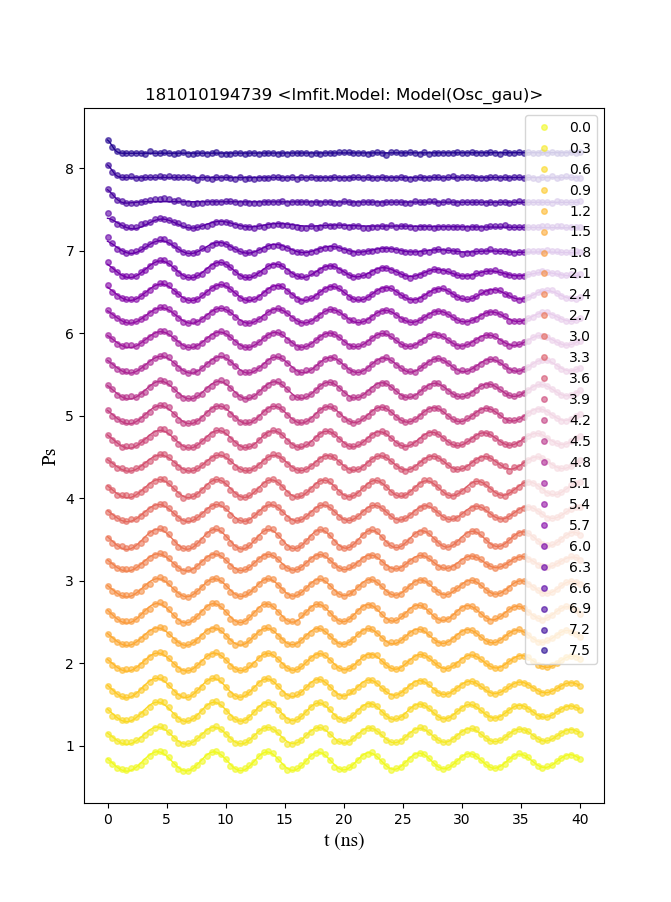

In [169]:
# plot all fitted Osc_curves with stored fitting keys, and raw data points

x = d2['evol_time'].values

fig, ax = plt.subplots(figsize= (9,9))
cmap = cm.get_cmap('plasma')

for nn in range(len(lab)):  #  range(len(lab)) , [17]
    y = y0[nn] #  y1, 
    fitkeys = {'A': A_array[nn],'phi0':phi0_array[nn],'T_J':T_J_array[nn],'tc': tc_array[nn],'T0':T0_array[nn],
               'td':td_array[nn],'slo':slo_array[nn], 'off':off_array[nn]}
        
    if True:   #op == 0:
        labelnn = round(lab[nn],2)
        f1 = ax.plot(x, y+ 0.3*nn - slo*x , 'o', c = cmap(1.-nn*1.0/(1.0*len(lab))), ms= 4, alpha = 0.6, label = '%s'%(round(lab[nn],2)) )  
        x_span = np.arange(x.min(), 1.*x.max(), 0.1)
        ax.plot(x_span, model.func(x_span, **fitkeys)+0.3*nn - slo*x_span, c = cmap(1.-nn*1.0/(1.0*len(lab))),lw = 1) 
    else:
        f1 = ax.plot(x, y - slo*x , 'o', c = cmap(1.-nn*1.0/(1.0*len(lab))), ms= 4, alpha = 0.6, label = '%s'%(round(lab[nn]),2) )   # - slo*x
        x_span = np.arange( x.min() , 1.*x.max(), 0.1)
        ax.plot(x_span, model.func(x_span, **result.best_values) - slo*x_span, c = cmap(1.-nn*1.0/(1.0*len(lab))),lw = 1)        # - slo*x_span  
    
    plt.xlabel('t (ns)', size = 14, fontname = 'Times New Roman') # style = 'italic'
    plt.ylabel('Ps', size = 14, fontname = 'Times New Roman')
    leg = ax.legend(loc = 1)    #(f1," %s" %(lab[nn]),prop={'size':8, 'family': 'Times New Roman'})
    ax.set_title(d2.filename + ' %s'%(model))


In [411]:
# fitting params data store

with ex.data_store(comment= d2.attrs['filename']+ 'fitting method = %s'%(model)+ d2.comment) as dfit:
    #ds.axis(det_E, var = 'det_E (ueV)')
    dfit.axis(lab, var = 'delta_PR(mV)') #,dim = 0 )
    #dfit.axis(evol_time, var = 'evol_time')
    dfit.storage('A_array', noplot = True)
    dfit.storage('phi0_array', noplot = True)
    dfit.storage('T_J_array', noplot = True)
    dfit.storage('tc_array', noplot = True)
    dfit.storage('T0_array', noplot = True)
    dfit.storage('td_array', noplot = True)
    dfit.storage('factor_array', noplot = True)
    dfit.storage('slo_array', noplot = True)
    dfit.storage('off_array', noplot = True)
    dfit.storage('A_er', noplot = True)
    dfit.storage('phi0_er', noplot = True)
    dfit.storage('T_J_er', noplot = True)
    dfit.storage('tc_er', noplot = True)
    dfit.storage('T0_er', noplot = True)
    dfit.storage('td_er', noplot = True)
    dfit.storage('factor_er', noplot = True)
    dfit.storage('slo_er', noplot = True)
    dfit.storage('off_er', noplot = True)
    
    dfit.put(A_array, name = 'A_array')
    dfit.put(phi0_array, name = 'phi0_array')
    dfit.put(T_J_array, name = 'T_J_array')
    dfit.put(tc_array, name = 'tc_array')
    dfit.put(T0_array, name = 'T0_array')
    dfit.put(td_array, name = 'td_array')
    dfit.put(factor_array, name = 'factor_array')
    dfit.put(slo_array, name = 'slo_array')
    dfit.put(off_array, name = 'off_array')
    dfit.put(A_er, name = 'A_er')
    dfit.put(phi0_er, name = 'phi0_er')
    dfit.put(T_J_er, name = 'T_J_er')
    dfit.put(tc_er, name = 'tc_er')
    dfit.put(T0_er, name = 'T0_er')
    dfit.put(td_er, name = 'td_er')
    dfit.put(factor_er, name = 'factor_er')
    dfit.put(slo_er, name = 'slo_er')
    dfit.put(off_er, name = 'off_er')


Closed 181024011207
(slice(None, None, None),) done.Reopened 181024011256.h5 in read-only mode


In [353]:
a = ['JM','JN']#{'KL':0,'KM':0}
for i in a:
    i = 1
#print a
'JM'

'JM'

In [371]:
d = ex.load_data(181024011207)
#print dtes.time
#tk.plot(d)
for i in d.data_vars:
    print i #d[i].values
#print 
#= (d[i].values for i in d.data_vars)

A_array
phi0_array
T_J_array
tc_array
T0_array
td_array
factor_array
slo_array
off_array
A_er
phi0_er
T_J_er
tc_er
T0_er
td_er
factor_er
slo_er
off_er


In [396]:
#d.dims.keys()[0]
d['factor_array'].values

array([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan,
       nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
      dtype=float32)

In [ ]:
A_array,phi0_array,T_J_array,tc_array,T0_array,td_array,factor_array,slo_array,off_array,A_er,phi0_er,T_J_er,tc_er,T0_er,td_er,factor_er,slo_er,off_er

In [390]:
A_array,phi0_array,T_J_array,tc_array,T0_array,td_array,factor_array,slo_array,off_array,A_er,phi0_er,T_J_er,tc_er,T0_er,td_er,factor_er,slo_er,off_er =(d[key].values for key in d.data_vars)
lab = d[d.dims.keys()[0]].values

In [391]:
lab

array([0. , 0.3, 0.6, 0.9, 1.2, 1.5, 1.8, 2.1, 2.4, 2.7, 3. , 3.3, 3.6,
       3.9, 4.2, 4.5, 4.8, 5.1, 5.4, 5.7, 6. , 6.3, 6.6, 6.9, 7.2, 7.5])

<IPython.core.display.Javascript object>


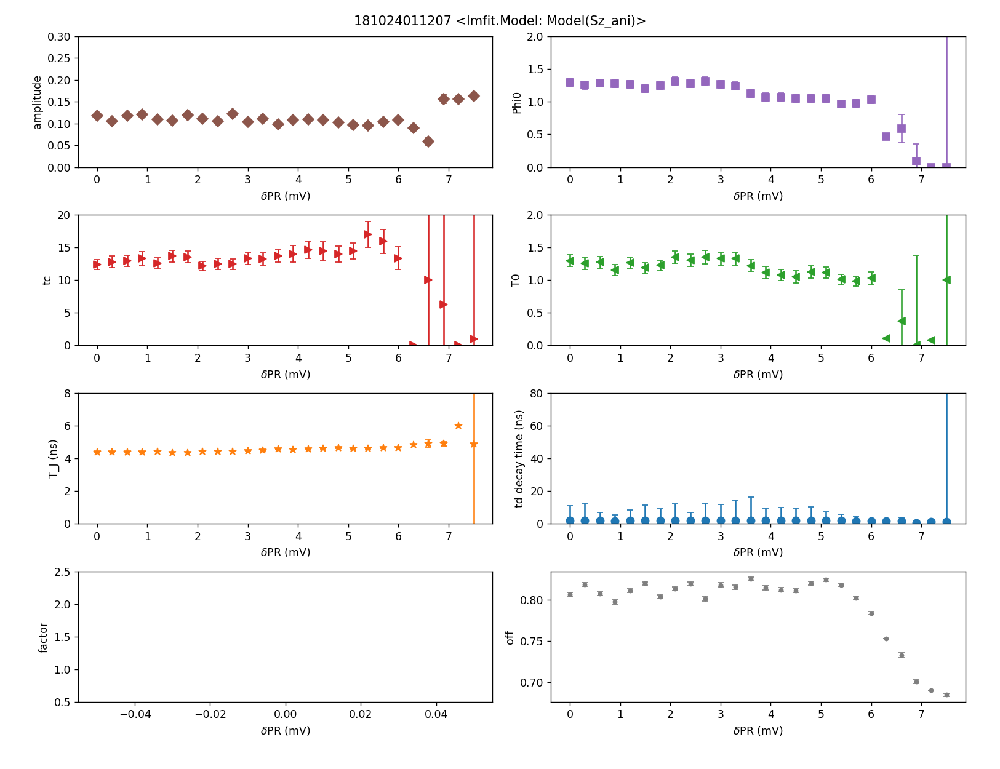

Text(0.5,0.98,u'181024011207 <lmfit.Model: Model(Sz_ani)>')

In [393]:
## plot  fitted params from damped oscillations (Gaussian)

fig, axall = plt.subplots(4,2,figsize=(13,10))

axall[0,0].errorbar(lab, A_array, A_er, fmt = 'D' ,capsize = 3, markersize = 7, color= 'C5') # ,  mfc = cmap(0.4),color = cmap(0.05),alpha=0.99
axall[0,0].set_ylabel("amplitude") #  # ax.set_ylabel("decay time td (ns)", color= 'indigo' )
axall[0,0].set_xlabel("$\delta$PR (mV)") # , color = 'k',size = 12)
axall[0,0].set_ylim((0,0.3))

axall[0,1].errorbar(lab, phi0_array, phi0_er, fmt = 's' ,capsize = 3, markersize = 7, color= 'C4') # ,  mfc = cmap(0.4),color = cmap(0.05),alpha=0.99
axall[0,1].set_ylabel("Phi0") #  # ax.set_ylabel("decay time td (ns)", color= 'indigo' )
axall[0,1].set_xlabel("$\delta$PR (mV)") # , color = 'k',size = 12
axall[0,1].set_ylim((0,2))

axall[1,0].errorbar(lab, tc_array, tc_er, fmt = '>' ,capsize = 3, markersize = 7, color= 'C3') # ,  mfc = cmap(0.4),color = cmap(0.05),alpha=0.99
axall[1,0].set_ylabel("tc") #  # ax.set_ylabel("decay time td (ns)", color= 'indigo' )
axall[1,0].set_xlabel("$\delta$PR (mV)") # , color = 'k',size = 12
axall[1,0].set_ylim((0,20))

axall[1,1].errorbar(lab, T0_array, T0_er, fmt = '<' ,capsize = 3, markersize = 7, color= 'C2') # ,  mfc = cmap(0.4),color = cmap(0.05),alpha=0.99
axall[1,1].set_ylabel("T0") #  # ax.set_ylabel("decay time td (ns)", color= 'indigo' )
axall[1,1].set_xlabel("$\delta$PR (mV)") # , color = 'k',size = 12
axall[1,1].set_ylim((0,2))

axall[2,0].errorbar(lab, T_J_array, T_J_er, fmt = '*' ,capsize = 3, markersize = 7, color= 'C1') # ,  mfc = cmap(0.4),color = cmap(0.05),alpha=0.99
axall[2,0].set_ylabel("T_J (ns)") #  # ax.set_ylabel("decay time td (ns)", color= 'indigo' )
axall[2,0].set_xlabel("$\delta$PR (mV)") # , color = 'k',size = 12
axall[2,0].set_ylim((0,8))

axall[2,1].errorbar(lab, td_array, td_er, fmt = 'o' ,capsize = 3, markersize = 7, color= 'C0') # ,  mfc = cmap(0.4),color = cmap(0.05),alpha=0.99
axall[2,1].set_ylabel("td decay time (ns)") #  # ax.set_ylabel("decay time td (ns)", color= 'indigo' )
axall[2,1].set_xlabel("$\delta$PR (mV)") # , color = 'k',size = 12
axall[2,1].set_ylim((0,80))

axall[3,0].errorbar(lab, factor_array, factor_er, fmt = 'p' ,capsize = 3, markersize = 7, color= 'C6') # ,  mfc = cmap(0.4),color = cmap(0.05),alpha=0.99
axall[3,0].set_ylabel("factor") #  # ax.set_ylabel("decay time td (ns)", color= 'indigo' )
axall[3,0].set_xlabel("$\delta$PR (mV)") # , color = 'k',size = 12
axall[3,0].set_ylim((0.5,2.5))

axall[3,1].errorbar(lab, off_array, off_er, fmt = '.' ,capsize = 3, markersize = 7, color= 'C7') # ,  mfc = cmap(0.4),color = cmap(0.05),alpha=0.99
axall[3,1].set_ylabel("off") #  # ax.set_ylabel("decay time td (ns)", color= 'indigo' )
axall[3,1].set_xlabel("$\delta$PR (mV)") # , color = 'k',size = 12
# plt.xticks( fontsize=14, rotation=0, fontname = 'Times New Roman')      #np.arange(50, 101, 5),
# plt.yticks( fontsize=14, rotation=0, fontname = 'Times New Roman')     # np.arange(0.05, 0.26, 0.05),

#ax.axvspan(-0.010, 0.0017, facecolor='C1', alpha=0.)
#ax.axvspan(0.0017, 0.017, facecolor='C2', alpha=0.)
#ax.text(0.2, 0.7, " (1,0)", fontsize = 14,transform=ax.transAxes )
#ax.text(0.6, 0.7, " (1,1)", fontsize = 14,transform=ax.transAxes )
#axarr[xx, yy].set(title = temp_data.attrs['filename'])

# ax.text(0.50, 0.92, " Initvec = (x, - 2.0*x )" , fontsize = 14,transform=ax.transAxes )
# plt.title(temp_data.attrs['filename'])
# plt.xlim((-0.0005,0.0085))
# plt.ylim((0,150))
#plt.yscale('log')
#plt.autoscale(enable = False, axis='both', tight = True)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02)) [f1],
#leg = axarr[xx, yy].legend( [f1],[" %d PS, jump=%s" %(total_num-index,jump)],prop={'size':8, 'family': 'Times New Roman'}, loc = 0)
#leg.set_title('%s'%(temp_data.attrs['filename']),prop={'size':8, 'family': 'Times New Roman'})

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w') ;plt.tight_layout(pad = 3.0, w_pad = 0.9, h_pad = 0.8)
#fig.tight_layout()
#print para_store python
#plt.show()
fig.suptitle(d.filename + ' %s'%(model))

<IPython.core.display.Javascript object>


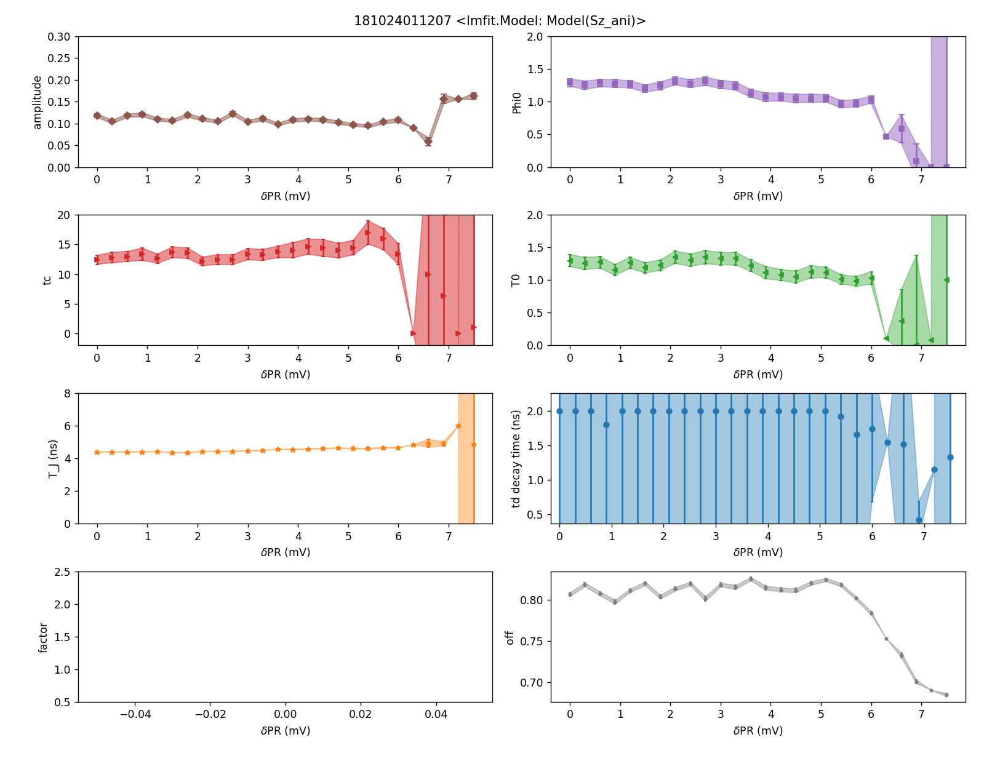

Text(0.5,0.98,u'181024011207 <lmfit.Model: Model(Sz_ani)>')

In [409]:
## plot  fitted params from damped oscillations (Gaussian)

fig, axall = plt.subplots(4,2,figsize=(13,10)) #figsize=(13,10)

axall[0,0].errorbar(lab, A_array, A_er, fmt = 'D' ,capsize = 3, markersize = 5, color= 'C5') # ,  mfc = cmap(0.4),color = cmap(0.05),alpha=0.99
axall[0,0].fill_between(lab, A_array- A_er,A_array+ A_er,  color= 'C5',alpha =0.5)
axall[0,0].set_ylabel("amplitude") #  # ax.set_ylabel("decay time td (ns)", color= 'indigo' )
axall[0,0].set_xlabel("$\delta$PR (mV)") # , color = 'k',size = 12)
axall[0,0].set_ylim((0,0.3))

axall[0,1].errorbar(lab, phi0_array, phi0_er, fmt = 's' ,capsize = 3, markersize = 5, color= 'C4') # ,  mfc = cmap(0.4),color = cmap(0.05),alpha=0.99
axall[0,1].fill_between(lab, phi0_array- phi0_er,phi0_array+ phi0_er,color= 'C4', alpha =0.5)
axall[0,1].set_ylabel("Phi0") #  # ax.set_ylabel("decay time td (ns)", color= 'indigo' )
axall[0,1].set_xlabel("$\delta$PR (mV)") # , color = 'k',size = 12
axall[0,1].set_ylim((0,2))

axall[1,0].errorbar(lab, tc_array, tc_er, fmt = '>' ,capsize = 2, markersize = 5, color= 'C3') # ,  mfc = cmap(0.4),color = cmap(0.05),alpha=0.99
axall[1,0].fill_between(lab, tc_array- tc_er,tc_array+ tc_er, color= 'C3', alpha =0.5)
axall[1,0].set_ylabel("tc") #  # ax.set_ylabel("decay time td (ns)", color= 'indigo' )
axall[1,0].set_xlabel("$\delta$PR (mV)") # , color = 'k',size = 12
axall[1,0].set_ylim((-2,20))

axall[1,1].errorbar(lab, T0_array, T0_er, fmt = '<' ,capsize = 2, markersize = 5, color= 'C2') # ,  mfc = cmap(0.4),color = cmap(0.05),alpha=0.99
axall[1,1].fill_between(lab, T0_array-T0_er,T0_array+T0_er, color= 'C2', alpha =0.4)
axall[1,1].set_ylabel("T0") #  # ax.set_ylabel("decay time td (ns)", color= 'indigo' )
axall[1,1].set_xlabel("$\delta$PR (mV)") # , color = 'k',size = 12
axall[1,1].set_ylim((0,2))

axall[2,0].errorbar(lab, T_J_array, T_J_er, fmt = '*' ,capsize = 2, markersize = 5, color= 'C1') # ,  mfc = cmap(0.4),color = cmap(0.05),alpha=0.99
axall[2,0].fill_between(lab, T_J_array- T_J_er,T_J_array+ T_J_er, color= 'C1', alpha =0.4)
axall[2,0].set_ylabel("T_J (ns)") #  # ax.set_ylabel("decay time td (ns)", color= 'indigo' )
axall[2,0].set_xlabel("$\delta$PR (mV)") # , color = 'k',size = 12
axall[2,0].set_ylim((0,8))

axall[2,1].errorbar(lab, td_array, td_er, fmt = 'o' ,capsize = 1, markersize = 5, color= 'C0') # ,  mfc = cmap(0.4),color = cmap(0.05),alpha=0.99
axall[2,1].fill_between(lab, td_array- td_er,td_array+ td_er, color= 'C0', alpha =0.4)
axall[2,1].set_ylabel("td decay time (ns)") #  # ax.set_ylabel("decay time td (ns)", color= 'indigo' )
axall[2,1].set_xlabel("$\delta$PR (mV)") # , color = 'k',size = 12
axall[2,1].set_ylim((0,20))

axall[3,0].errorbar(lab, factor_array, factor_er, fmt = 'p' ,capsize = 1, markersize = 5, color= 'C6') # ,  mfc = cmap(0.4),color = cmap(0.05),alpha=0.99
axall[3,0].fill_between(lab, factor_array- factor_er,factor_array+factor_er, color= 'C6', alpha =0.4)
axall[3,0].set_ylabel("factor") #  # ax.set_ylabel("decay time td (ns)", color= 'indigo' )
axall[3,0].set_xlabel("$\delta$PR (mV)") # , color = 'k',size = 12
axall[3,0].set_ylim((0.5,2.5))

axall[3,1].errorbar(lab, off_array, off_er, fmt = '.' ,capsize = 1, markersize = 5, color= 'C7') # ,  mfc = cmap(0.4),color = cmap(0.05),alpha=0.99
axall[3,1].fill_between(lab, off_array- off_er,off_array+ off_er, color= 'C7', alpha =0.4)
axall[3,1].set_ylabel("off") #  # ax.set_ylabel("decay time td (ns)", color= 'indigo' )
axall[3,1].set_xlabel("$\delta$PR (mV)") # , color = 'k',size = 12
# plt.xticks( fontsize=14, rotation=0, fontname = 'Times New Roman')      #np.arange(50, 101, 5),
# plt.yticks( fontsize=14, rotation=0, fontname = 'Times New Roman')     # np.arange(0.05, 0.26, 0.05),

#ax.axvspan(-0.010, 0.0017, facecolor='C1', alpha=0.)
#ax.axvspan(0.0017, 0.017, facecolor='C2', alpha=0.)
#ax.text(0.2, 0.7, " (1,0)", fontsize = 14,transform=ax.transAxes )
#ax.text(0.6, 0.7, " (1,1)", fontsize = 14,transform=ax.transAxes )
#axarr[xx, yy].set(title = temp_data.attrs['filename'])

# ax.text(0.50, 0.92, " Initvec = (x, - 2.0*x )" , fontsize = 14,transform=ax.transAxes )
# plt.title(temp_data.attrs['filename'])
# plt.xlim((-0.0005,0.0085))
# plt.ylim((0,150))
#plt.yscale('log')
#plt.autoscale(enable = False, axis='both', tight = True)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02)) [f1],
#leg = axarr[xx, yy].legend( [f1],[" %d PS, jump=%s" %(total_num-index,jump)],prop={'size':8, 'family': 'Times New Roman'}, loc = 0)
#leg.set_title('%s'%(temp_data.attrs['filename']),prop={'size':8, 'family': 'Times New Roman'})

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w') ;plt.tight_layout(pad = 3.0, w_pad = 0.9, h_pad = 0.8)
#fig.tight_layout()
#print para_store python
#plt.show()
fig.suptitle(d.filename + ' %s'%(model))

<IPython.core.display.Javascript object>


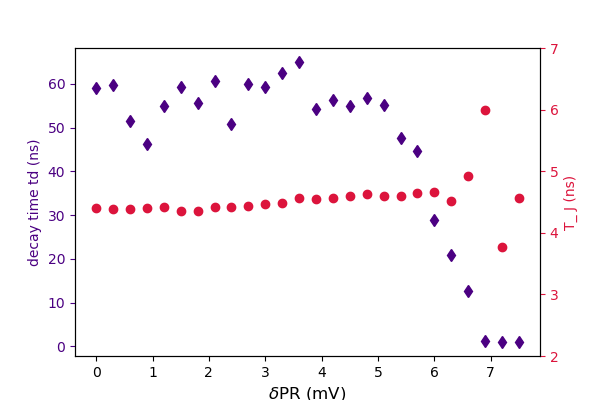

(2.0, 7.0)

In [44]:
fig, ax = plt.subplots(figsize= (6,4))
ax.plot(lab, td_array, 'd',c='indigo')  # 'skyblue', , ms=6, mfc = 'w'
ax.tick_params('y', colors='indigo')
ax.set_ylabel("decay time td (ns)", color= 'indigo' )
ax.set_xlabel("$\delta$PR (mV)", color = 'k',size = 12)

ax2 = ax.twinx()
ax2.plot(lab, T_J_array, 'o',c = 'crimson')  # 'skyblue', , ms=6, mfc = 'w'
ax2.tick_params('y', colors='crimson')
ax2.set_ylabel("T_ J (ns)", color = 'crimson')
ax2.set_ylim(2., 7.)

# ax2.spines['left'].set_color('b')
# ax2.spines['right'].set_color('r')
# ax2.tick_params('y', colors='r')

#fig.tight_layout()

<IPython.core.display.Javascript object>


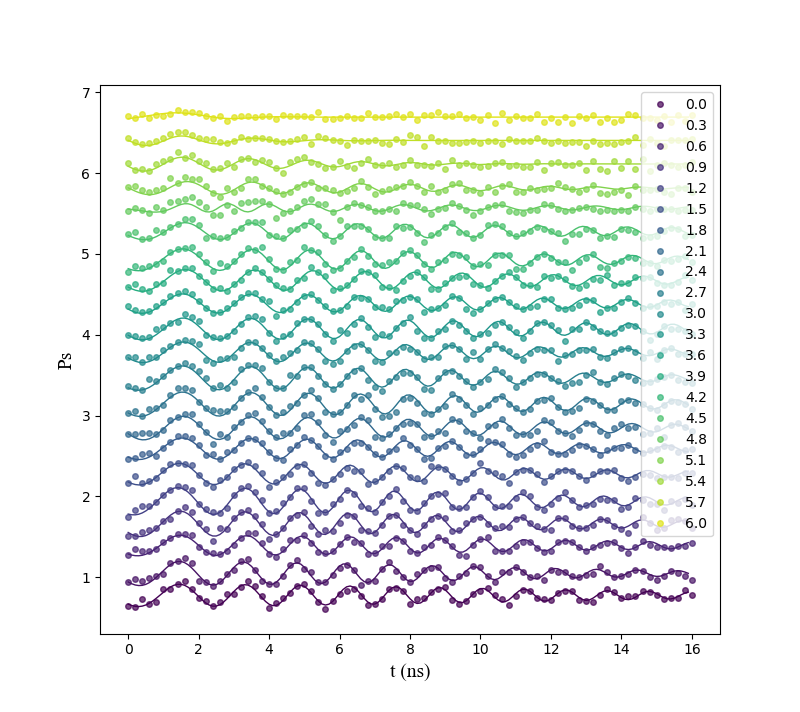

[[Model]]
    Model(Osc_gau)
[[Fit Statistics]]
    # function evals   = 117
    # data points      = 81
    # variables        = 7
    chi-square         = 0.072
    reduced chi-square = 0.001
    Akaike info crit   = -555.228
    Bayesian info crit = -538.467
[[Variables]]
    A:      0.13914513 +/- 0.008328 (5.99%) (init= 0.3)
    phi0:   2.47143663 +/- 0.165293 (6.69%) (init= 0.9)
    T_J:    1.30233827 +/- 0.017723 (1.36%) (init= 1.2)
    tc:     5.37230840 +/- 0.385633 (7.18%) (init= 5)
    T0:     1.42901412 +/- 0.104917 (7.34%) (init= 1)
    td:     14.5659288 +/- 1.327670 (9.11%) (init= 8)
    off:    0.77603511 +/- 0.003479 (0.45%) (init= 0.5)
[[Correlations]] (unreported correlations are <  0.250)
    C(T_J, tc)                   = -0.959 
    C(tc, T0)                    = -0.885 
    C(phi0, T0)                  =  0.878 
    C(T_J, T0)                   =  0.764 
    C(phi0, tc)                  = -0.668 
    C(A, td)                     = -0.625 
    C(phi0, T_J)        

In [233]:
# loop fit   SWAP_interaction B = 0.1, T =-0.35,epsilon =0.002, 181009215148


def Osc_gau(t, A, phi0,  T_J, tc, T0, td, off):
    omg = 2*np.pi/ (T0*np.exp(-t/tc) + T_J)
    y = A*np.cos(omg*t + phi0) * np.exp(-(t/td)**2) + off
    return y

def Osc_exp(t, A, phi0,  T_J, tc, T0, td, off):
    omg = 2*np.pi/ (T0*np.exp(-t/tc) + T_J)
    y = A*np.cos(omg*t + phi0) * np.exp(-(t/td)) + off
    return y

d2 = ex.load_data(181009215148)  # 181009180504,181009210155, 181009212606, 181009213349,181009215148
y0 = d2['ps'].values
x = d2['evol_time'].values
lab = d2['PR_sweep(mV)'].values
#y1= raw.ps[20,9,:].values  # PR, block, time
#y1= np.mean(raw.ps[20,:,:].values, axis = 0)  # PR, block, time

fig, ax = plt.subplots(figsize= (8,4))
cmap = cm.get_cmap('viridis')
A_array, T_J_array, tc_array, T0_array, td_array = np.empty(len(lab)),np.empty(len(lab)),np.empty(len(lab)),np.empty(len(lab)),np.empty(len(lab))

for nn in range(len(lab)) :  #  range(len(lab)) , [17]
    y = y0[nn] #  y1, 
    model  = lmfit.Model(Osc_gau, independent_vars=['t'])
    result = model.fit(y, t = x,
                       A = lmfit.Parameter(value = 0.3),
                       phi0   = lmfit.Parameter(value = 0.9),
                       T_J    = lmfit.Parameter(value = 1.2, min = 1.05, max = 5.0) if nn<19 else lmfit.Parameter(value = 1.2, min = 1.1, max = 5.0),
                       tc     = lmfit.Parameter(value = 5., min = 1., max = 12.0),
                       T0     = lmfit.Parameter(value = 1., min = 0.1, max = 5.0),
                       td     = lmfit.Parameter(value = 8., min = 1., max = 20.0),
                       off     = lmfit.Parameter(value = 0.5, min = 0.1, max = 1.0)) 

    A, phi0,  T_J, tc, T0, td, off = (result.best_values[key] for key in model.param_names)

    print(result.fit_report(min_correl=0.25))
    A_array[nn], T_J_array[nn], tc_array[nn], T0_array[nn], td_array[nn] = A, T_J, tc, T0, td

    f1 = ax.plot(x, y+0.3*nn, 'o', c = cmap(nn*1.0/(1.0*len(lab))), ms= 4, alpha = 0.7, label = '%s'%(lab[nn]) )  
    x_span = np.arange(x.min(), 1.*x.max(), 0.1)
    ax.plot(x_span, model.func(x_span, **result.best_values)+0.3*nn, c = cmap(nn*1.0/(1.0*len(lab))),lw = 1) 
    plt.xlabel('t (ns)', size = 14, fontname = 'Times New Roman') # style = 'italic'
    plt.ylabel('Ps', size = 14, fontname = 'Times New Roman')
    leg = ax.legend()    #(f1," %s" %(lab[nn]),prop={'size':8, 'family': 'Times New Roman'})



In [620]:
print type(f1)

<type 'list'>


<IPython.core.display.Javascript object>


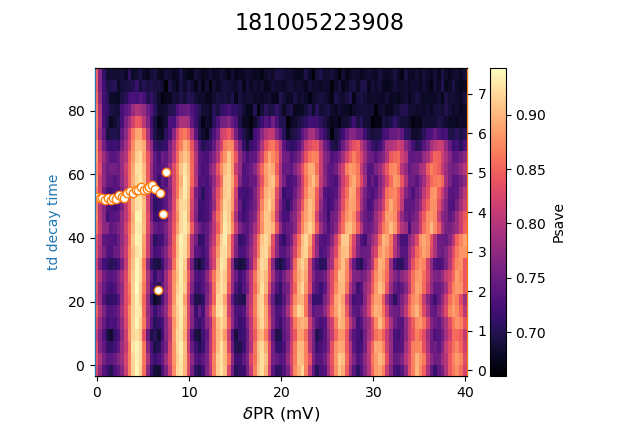

In [303]:
fig, ax = plt.subplots(figsize= (6,4))
ax.plot(lab, td_array, 'd', c = 'C0', ms=6, mfc = 'w')  # 'skyblue'
ax.set_ylabel("td decay time", color = 'C0' )
ax.set_xlabel("$\delta$PR (mV)", color = 'k',size = 12)

ax2 = ax.twinx()
ax2.plot(lab, T_J_array, 'o',c = 'C1', ms=6, mfc = 'w')  # 'skyblue'
ax2.set_ylabel("T_ J", color = 'C1')
ax2.set_ylim(2.0,7.0)

ax2.spines['left'].set_color('C0')
ax2.spines['right'].set_color('C1')

<IPython.core.display.Javascript object>


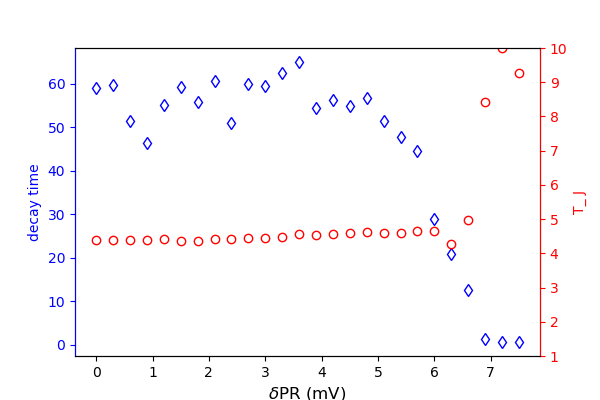

In [206]:
fig, ax = plt.subplots(figsize= (6,4))
ax.plot(lab, td_array, 'd', c = 'b', ms=6, mfc = 'w')  # 'skyblue'
ax.set_ylabel("decay time", color = 'b' )
ax.tick_params('y', colors='b')
ax.set_xlabel("$\delta$PR (mV)", color = 'k',size = 12)

ax2 = ax.twinx()
ax2.plot(lab, T_J_array, 'o',c = 'r', ms=6, mfc = 'w')  # 'skyblue'
ax2.set_ylabel("T_ J", color = 'r')
ax2.set_ylim(1., 10.)

ax2.spines['left'].set_color('b')
ax2.spines['right'].set_color('r')
ax2.tick_params('y', colors='r')

#fig.tight_layout()

In [ ]:
ds = xr.DataArray(np.arange(16).reshape(4, 4), dims=['x', 'y'])

### Gau Exp plot

<IPython.core.display.Javascript object>


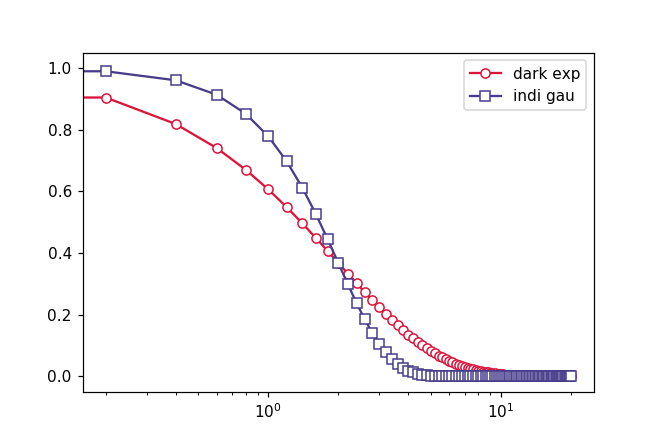

In [78]:
x = np.linspace(-0., 20., 101)
ya = np.exp(-x/2.)           # Exponential
yb = np.exp(-(x/2.)**2)      # Gaussian 
yc = np.exp(-(x/2.)**0.6)

fig, ax = plt.subplots(figsize= (6,4))
f1= ax.plot(x, ya, '-o',c ='crimson',ms =6,mfc = 'w',label = 'dark exp')  # 'd', c = 'b', ms=6, mfc = 'w', 'crimson', '#d1222a'
ax.plot(x, yb, '-s',c= 'darkslateblue', ms =6,mfc = 'w',label = 'indi gau')    # 'indigo', 'darkslateblue',  '#3c328c'
#ax.plot(x, yc, 'd',c='C0', ms =6,label = '0.7')    # 'indigo', 'darkslateblue'
#ax.set_ylabel("decay time", color = 'b' )
#ax.tick_params('y', colors='b')
#ax.set_xlabel("$\delta$PR (mV)", color = 'k',size = 12)
ax.legend()
ax.set_xscale('log')
#plt.savefig('darkslate and indigo.pdf', format='pdf', dpi=1000)
#ax.tick_params(axis ='both', direction ='in')

In [195]:
#print A_array

[0.11787654 0.1045018  0.11843217 0.11911173 0.10973661 0.10652564
 0.11877918 0.11017061 0.10462497 0.12269226 0.10441422 0.11087971
 0.09828495 0.10818636 0.1097793  0.10846366 0.10258378 0.09715405
 0.0942387  0.1006057  0.1043124  0.08195382 0.06599796 0.19999999
 0.2        0.2       ]


In [204]:
dtest = ex.load_data(h5files()[-1], load_now = True)
print dtest#.A_array

<xarray.Dataset>
Dimensions:       (delta_PR(mV): 26)
Coordinates:
  * delta_PR(mV)  (delta_PR(mV)) float64 0.0 0.3 0.6 0.9 1.2 ... 6.6 6.9 7.2 7.5
Data variables:
    A_array       (delta_PR(mV)) float32 0.11787654 0.1045018 ... 0.2 0.2
    phi0_array    (delta_PR(mV)) float32 1.2906767 1.2521552 ... 0.6400946
    T_J_array     (delta_PR(mV)) float32 4.395552 4.394349 ... 9.997632 9.274173
    tc_array      (delta_PR(mV)) float32 12.404458 12.774583 ... 39.998547
    T0_array      (delta_PR(mV)) float32 1.2968067 1.2549254 ... 0.0100343
    td_array      (delta_PR(mV)) float32 58.99072 59.747837 ... 0.6749256
    slo_array     (delta_PR(mV)) float32 -9.481865e-05 ... -5.9453763e-05
    off_array     (delta_PR(mV)) float32 0.80727893 0.81887764 ... 0.684484
    A_er          (delta_PR(mV)) float32 0.00265 0.00255 0.00266 ... 3.59012 0.0
    phi0_er       (delta_PR(mV)) float32 0.05792 0.06288 0.05694 ... 0.57904 0.0
    T_J_er        (delta_PR(mV)) float32 0.01342 0.01528 ... 90997.516

## time trace

VGFiKGNoaWxkcmVuPShWQm94KGNoaWxkcmVuPShIQm94KGNoaWxkcmVuPShEcm9wZG93bihkZXNjcmlwdGlvbj11J25hbWUnLCBvcHRpb25zPSh1J1ZyZicsKSwgdmFsdWU9dSdWcmYnKSwgQ2jigKY=


<IPython.core.display.Javascript object>


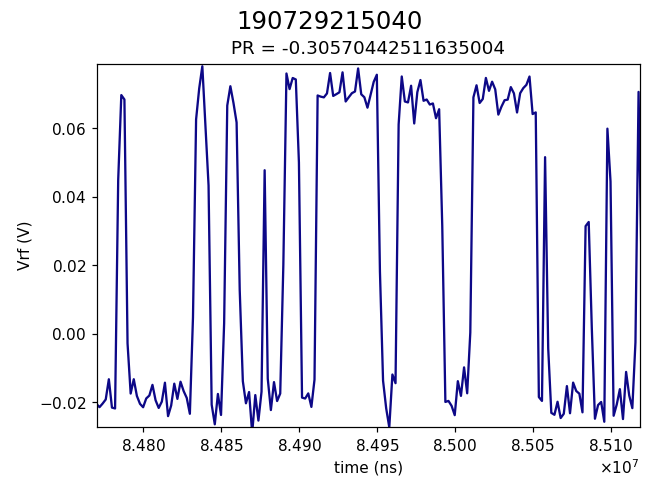

In [30]:
dtr = ex.load_data(h5files()[-1], load_now = True)
#d = ex.load_data(170801215526, load_now = True)  # AWG70000 170725171742; AWG7122 170801215526; 180629172709
#d = ex.load_data(180611160522, load_now = True)
#dtr = ex.load_data(190723205208)

dtr = ex.load_data(190729215040)
#dtr = ex.load_data(190607183940)
#dtr = ex.load_data(190528212420)
#d = ex.load_data(180329134302)
#d = ex.load_data(170410132638)170421155935.h5
#d = ex.load_data(180424170911)
#d = ex.load_data(170501122245)
#d = ex.load_data(170421155935)
# d['Vrf_trans'] = d['Vrf'].transpose()
# d['dVrf_trans'] = d['dVrf'].transpose()

if [True,False][1]: #subtract plane
    try:
        dtr['Vrf_sub'] = tk.remove_plane(dtr['Vrf'])*1e3
        dtr['Vrf_sub'].attrs['units'] = 'mV'
    except:
        pass

#dtr['diff'] = tk.differentiate(dtr['Vrf'], sigma = 0.5)
#d['diffave'] = np.mean(d['diff'], axis = 0)
#d['Vrfave'] = np.mean(d['Vrf'][0:20,:], axis = 0)
# d['Vrf_sub_trans'] = d['Vrf_sub'].transpose()
#cmaps = cm.Spectral
#cmaps = parula_map
# d['fft'] = tk.new_array(d.Vrf, replaced_dim=-1, new_dim='Frequency (MHz)', 
#                        new_coords=np.fft.rfftfreq(d.Vrf.shape[-1], d=1./(1000./8.))) # 1/sampling rate in us
# d.fft[:,] = np.abs(np.fft.rfft(d.Vrf.values))

#d['hist'] = tk.hist(d.Vrf, axis = -1, range = (-0.010,0.006))  # hist of Vrf for time axis
#d = d.sel(**{'PL': slice(-0.1945, -0.1955)}) 
#d1 = d[SMU.voltage = -0.0015]
#d = d.sel(**{'rec': [134, 144] })   # slice(-0.1945, -0.1955)
tk.plot(dtr,  cmap = 'plasma') #dtr.Vrf[0:12,] # style = '-o',  [{'PC (V)': 22}],interpolation = 'bicubic')#, ylog = True)
#fig,ax = plt.subplots()
#d.Vrf.plot(**{ 'marker' : 'o', 'mfc': 'w'})
#tk.implot(d['dVrf'], d['PR'],d['PC'],vmax=8, vmin=-8, cmap ='magma',interpolation = 'None' )
#tk.implot(d['dVrf'], d['PR'],d['PC'],extent=[0.25, 0.29, -0.240, -0.2005],vmax=8, vmin=-8, cmap =parula_map,interpolation = 'None' )
#print d #d.attrs

In [30]:
dtr.Vrf.values

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)

In [673]:
408/5

81

### histogram tunneling

In [223]:
d_raw.size

810000

In [224]:
widths

array([  547,   318,  5940,  3459,  5449,   651,  5041,   820,  6076,
        4611,  7884,  3589,  1163,   594,  6360,    29,  9879, 21201,
        6746,  9682,   887,  8480, 10434,  6298, 11599, 10000,  5613,
       13442,  2581, 25649,  3309,  6610,   494,  2329,  2489,   863,
        2854, 12365,  5167,  2072, 11434, 13053,  6827,  7710,  1738,
         500, 26226,  9026,  3129,  4695,  1516,  9291, 16084,  5619,
        3670,  9342,  5723,  2167,  3000,  7450,  2830,  1425,  6468,
        7075, 12506,  1323,  7953,  2745,  2923,  2483,  1199, 12611,
         691,  4677,   242,  2798,  7487, 11633,  1276,  9714,  3763,
        4342,  3460,   492,  1966,  2494,  3282,   892,  8772])

In [29]:
d_raw.size
#bins#_reduce
#hist#.size

NameError: name 'd_raw' is not defined

<IPython.core.display.Javascript object>


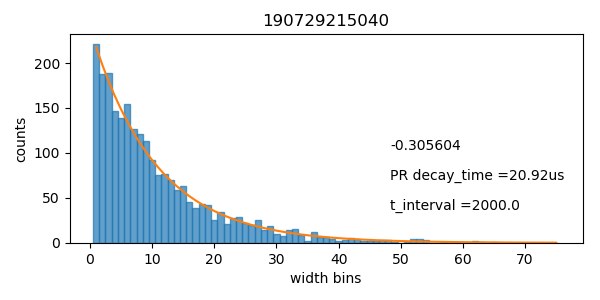

In [241]:
#len(dtr.PR.values)
#dtr.Vrf[0]
#dtr = ex.load_data(190522212412)
gate0 = 'PR'
d_raw0= dtr.sel(method ='pad',**{gate0: -0.30561})
d_raw = d_raw0['Vrf'].values#[0:50000]
#d_raw = dtr['Vrf'].values.flatten()
dtt = dtr['time (ns)'].values[1] - dtr['time (ns)'].values[0]
#d_bina = np.greater(d_raw , 0.1295)*1   # np.greater np.where

#data = np.array([0,1,0,1,1,0,0,1,1,1,0,0,1,0,0,1,1,0])
def window_widths(time_trace, thres):
    data_bina = np.asarray(time_trace > thres) *1
    cu = 0
    widths = np.empty(0,dtype = int)
    for num in data_bina:
        if num == 1:
            cu += 1
        else:
            if cu !=0:
                widths = np.append(widths,cu)
            cu = 0
    return widths
#print data, lengths
def exp_decay(t, t_decay, amplitude, offset):
    return amplitude*np.exp(-t/t_decay) + offset
  
widths = window_widths(d_raw, 0.033)  #0.1265
bins = np.arange(max(widths)/1)*1
hist = np.histogram(widths,bins)[0] # histogram contains 2 arrays, hists and bins
bins_reduce = bins[1:-1]
hist_eff = hist[1:]

model  = lmfit.Model(exp_decay, independent_vars=['t'])
result = model.fit(hist_eff, t = bins_reduce,
                   t_decay   = lmfit.Parameter(value = 0.2*(max(bins)+min(bins)), min= 0., max = max(bins)),
                   amplitude = lmfit.Parameter(value = max(hist)),  # 0.0002,   amp_init
                   offset  = lmfit.Parameter(value = 1, min =0., max =1000), )
t_decay, amplitude, offset = (result.best_values[key] for key in result.var_names)

fig, ax = plt.subplots(figsize = (6,3))
#ax.plot(t_arr, trace_full, 'bo-', markersize = 2)    # fitted part
ax.bar(bins_reduce, hist_eff,width = bins[2]-bins[1], color= 'C0' if gate0=='PR' else 'teal', alpha =0.7,edgecolor='C0') # ,edgecolor = 'w'
ax.plot(bins_reduce, model.func(bins_reduce, **result.best_values),'-', c='C1' )

#ax.hist( lengths, bins= n_bins)
time_in = 't_interval ='+ str(dtt)
time_decay = gate0 +' decay_time ='+ str(round(t_decay*dtt*1e-3, 2)) +'us'
fig.text(0.65,0.3,time_in)
fig.text(0.65,0.4,time_decay)
fig.text(0.65,0.5,round(d_raw0[gate0].values,6))
plt.xlabel('width bins')
plt.ylabel('counts')
#plt.xscale('log')
#plt.yscale('log')
plt.title(dtr.attrs['filename'])

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout(pad=1.0, w_pad=0.9, h_pad=0.9)

In [28]:
tes = 0.1234217
print '%.5f'% tes

0.12342


In [41]:
# fig, ax = plt.subplots(figsize = (6,3))
# q00 = np.array([0,1,2,3])
# w00 = np.array([3,5,4,1])
# ax.bar(q00,w00)

hist

array([ 0, 42, 50, 48, 44, 38, 39, 46, 28, 39, 38, 41, 29, 34, 32, 26, 27,
       26, 23, 17, 22, 29, 18, 14, 13, 15, 15, 14, 17, 10, 20, 16, 12, 17,
       10, 10,  8, 17, 13, 16, 11,  9, 17,  5,  9, 11, 10,  7, 11, 15,  5,
        7,  7,  6,  9,  7,  5,  7,  6,  3,  7,  5,  3,  2,  4,  4,  1,  4,
        2,  6,  5,  1,  1,  3,  3,  4,  2,  3,  2,  2,  3,  4,  4,  2,  1,
        1,  1,  0,  4,  1,  1,  2,  1,  1,  4,  0,  1,  2,  1,  1,  0,  2,
        2,  2,  0,  1,  3,  0,  3,  1,  0,  2,  0,  0,  3,  2,  3,  0,  0,
        2,  2,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0,  1,  0,  0,  0,  1,
        1,  1,  0,  1,  0,  1,  0,  0,  3,  0,  0,  1,  1,  0,  0,  1,  0,
        0,  0,  1,  0,  1,  0,  1,  0,  0,  0,  0,  1,  1,  1,  0,  0,  0,
        0,  0,  2,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        1,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        1,  0,  1,  0,  1

<IPython.core.display.Javascript object>


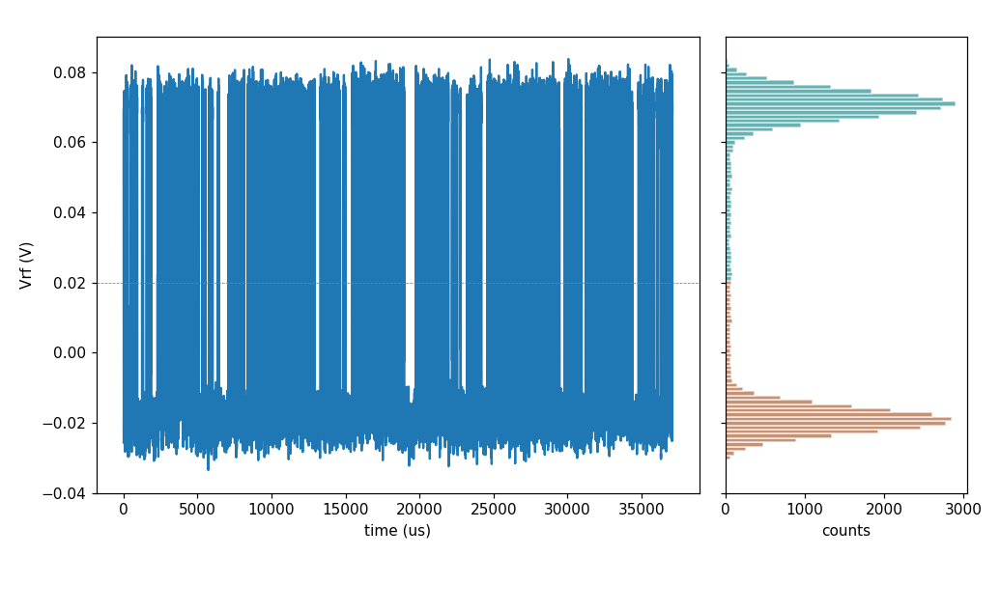

In [50]:
#dtr = ex.load_data('190528212420')
dtr = ex.load_data('190729215040')
gate0 = 'PR'
# d_raw0= dtr.sel(method ='pad',**{gate0: -0.3322})
d_raw0= dtr.sel(method ='pad',**{gate0: -0.30561})
d_raw1 = d_raw0['Vrf'].values
t_axis = d_raw0['time (ns)'].values
dtt = dtr['time (ns)'].values[1] - dtr['time (ns)'].values[0]
#d_bina = np.greater(d_raw , 0.1295)*1   # np.greater np.where
#widths = window_widths(d_raw, 0.0050)  #0.1265
bins1 = np.linspace(min(d_raw1),max(d_raw1),100)
hist1 = np.histogram(d_raw1,bins1)[0] #[1:]
bins1_reduce = bins1[1:]

fig, axs =  plt.subplots(1, 2, figsize = (9,3),gridspec_kw={'width_ratios': [5, 2]},sharey ='row')  

be, ed = 800, 19350 
#be, ed = 2120, 2450 
#axs[0].plot( (t_axis[be:ed]-t_axis[be])*1e-3, d_raw1[be:ed],'-', c='C0' )
from scipy.signal import savgol_filter
axs[0].plot( (t_axis[be:ed]-t_axis[be])*1e-3, savgol_filter(d_raw1[be:ed],3,2),'-', c='C0' )
axs[0].set_ylim((-0.04,0.09))

thres = 0.02
axs[0].axhline(y = thres, linestyle = '--',lw = 0.5,color = 'grey')
axs[0].set_ylabel('Vrf (V)'),axs[0].set_xlabel('time (us)')


upper = np.ma.masked_where(bins1_reduce > thres, bins1_reduce)
#upper2 = np.asarray(bins1_reduce < thres) * bins1_reduce
upper2 = bins1_reduce[np.where(bins1_reduce < thres)]
hist2 = hist1[np.where(bins1_reduce < thres)]

axs[1].barh( bins1_reduce, hist1, height = bins1_reduce[1]- bins1_reduce[0],align='center',color = 'teal',edgecolor = 'white',alpha =0.6)
#axs[1].plot(  hist1,upper,color = 'C2')
axs[1].barh( upper2, hist2, height = bins1_reduce[1]- bins1_reduce[0],align='center',color = 'coral',edgecolor = 'white',alpha =0.6)
axs[1].set_xlabel('counts')

#plt.suptitle(dtr.attrs['filename'])
fig.tight_layout()


In [43]:
#upper
bins1_reduce[np.where(bins1_reduce < thres)]

array([-0.03225835, -0.03104414, -0.02982993, -0.02861572, -0.02740151,
       -0.02618731, -0.0249731 , -0.02375889, -0.02254468, -0.02133047,
       -0.02011626, -0.01890205, -0.01768785, -0.01647364, -0.01525943,
       -0.01404522, -0.01283101, -0.0116168 , -0.01040259, -0.00918839,
       -0.00797418, -0.00675997, -0.00554576, -0.00433155, -0.00311734,
       -0.00190314, -0.00068893,  0.00052528,  0.00173949,  0.0029537 ,
        0.00416791,  0.00538212,  0.00659632,  0.00781053,  0.00902474,
        0.01023895,  0.01145316,  0.01266737,  0.01388158,  0.01509578,
        0.01630999,  0.0175242 ,  0.01873841,  0.01995262])

In [435]:
#bins1_reduce, upper[-1]>0.006
np.asarray(bins1_reduce >0.005) * bins1_reduce

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.00506652, 0.00513764,
       0.00520876, 0.00527988, 0.005351  , 0.00542212, 0.00549323,
       0.00556435, 0.00563547, 0.00570659, 0.00577771, 0.00584883,
       0.00591995, 0.00599107, 0.00606219, 0.00613331, 0.00620443,
       0.00627555, 0.00634667, 0.00641779, 0.00648891, 0.00656003,
       0.00663115, 0.00670227, 0.00677339, 0.00684451, 0.00691

In [440]:
bins[:-1]

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75])

In [421]:
aa = np.array([1,1,2,9])
np.asarray(aa>5)*1

array([0, 0, 0, 1])

In [433]:
a,b = np.histogram(lengths, bins = np.arange(70))
len(a),len(b)
#n_bins
#lengths

(69, 70)

In [357]:
lengths = np.empty(0)
print np.greater(d_raw , 0.122) *1

[0 0 1 ... 0 0 0]


<IPython.core.display.Javascript object>


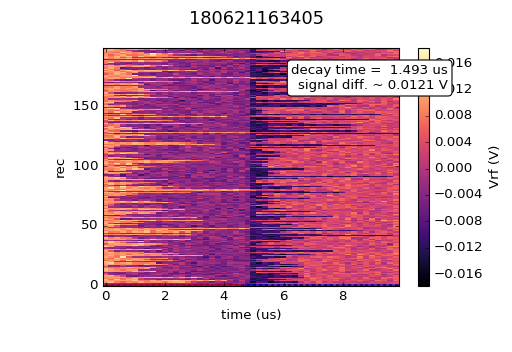

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # function evals   = 24
    # data points      = 24
    # variables        = 3
    chi-square         = 0.000
    reduced chi-square = 0.000
    Akaike info crit   = -483.752
    Bayesian info crit = -480.218
[[Variables]]
    t_decay:     1.49251366 +/- 0.010891 (0.73%) (init= 4.6)
    amplitude:   0.01208936 +/- 3.01e-05 (0.25%) (init= 0.01144708)
    offset:     -0.00301395 +/- 2.74e-05 (0.91%) (init=-0.002472518)
[[Correlations]] (unreported correlations are <  0.100)
    C(t_decay, offset)           = -0.892 
    C(amplitude, offset)         = -0.515 
    C(t_decay, amplitude)        =  0.200 



In [205]:
if [True, False][0]:   # True for fitting first half part
    t_ref = 0.        # start point of fitting
    #_t_min, _t_max = 2, 5000
    _t_min, _t_max = 0, 4.8
    t_min, t_max = t_ref + _t_min, t_ref + _t_max

    t_raw = d['time'].values
    V_raw = d['Vrf'].values

    xarr  = d['Vrf'][0:24]
    t_arr = d['time'].values[0:24]
    in_rng = np.where((t_min <= t_arr)&(t_arr <= t_max))
else:
    t_ref =5.16 #1.965  # start point of fitting
    #_t_min, _t_max = 2, 5000
    _t_min, _t_max = 0, 2
    t_min, t_max = t_ref + _t_min, t_ref + _t_max

    t_raw = d['time'].values

    xarr  = d['Vrf'] [129:170]            #[122:160]
    t_arr = d['time'].values[129:170]       # [122:160]
    in_rng = np.where((t_min <= t_arr)&(t_arr <= t_max))

if len(xarr.dims) == 2:
    if xarr.dims[-2] == 'repeat':
        trace_full = np.average(xarr.values, axis = 0)
    else:
        diff = np.amax(xarr.values[...,in_rng], axis = (1,2)) - np.amin(xarr.values[...,in_rng], axis = (1,2))
        trace_full = xarr.values[diff.argmax(), slice(None)]
elif len(xarr.dims) == 1:
    trace_full = xarr.values
else:
    raise Exception()

trace = trace_full[in_rng]
t_argmin, t_argmax = t_arr[in_rng][trace.argmin()], t_arr[in_rng][trace.argmax()]
amp_init = trace.max() - trace.min() if t_argmax < t_argmin else trace.min() - trace.max()

def exp_decay(t, t_decay, amplitude, offset):
    return amplitude*np.exp(-t/t_decay) + offset

model  = lmfit.Model(exp_decay, independent_vars=['t'])
result = model.fit(trace, t = t_arr[in_rng],
                   t_decay   = lmfit.Parameter(value = abs(t_argmin-t_argmax), min= 0., max = 10.*(t_max-t_min)),
                   amplitude = lmfit.Parameter(value = amp_init),  # 0.0002,   amp_init
                   offset  = lmfit.Parameter(value = trace.min() if t_argmax < t_argmin else trace.max()))
t_decay, amplitude, offset = (result.best_values[key] for key in result.var_names)

fig, ax = plt.subplots(figsize = (6,4))
#ax.plot(t_arr, trace_full, 'bo-', markersize = 2)    # fitted part
ax.plot(t_raw, V_raw, 'bo-', markersize = 2)
ax.plot(t_arr[in_rng], model.func(t_arr[in_rng], **result.best_values), 'r-')

if len(xarr.dims) == 2 and xarr.dims[-2] != 'repeat':
    label = '%s = %.4f'%(xarr.dims[0], d[xarr.dims[0]].values[diff.argmax()])
    txt   = label + '\n'
    #plt.legend([label, 'fit'], loc = 'best')
else:
    txt = ''
txt += 'decay time = %6.3f us'% t_decay
txt += '\n'+'signal diff. ~ %6.4f V'%(model.func(t_ref, **result.best_values)-offset)
props = dict(boxstyle='round', facecolor='w', alpha=1.)
if amplitude < 0:
    fig.text(0.9, 0.2, txt, bbox = props, ha = 'right', va = 'bottom')
else:
    fig.text(0.9, 0.85, txt, bbox = props, ha = 'right', va = 'top')

ax.set_ylabel(xarr.name); ax.set_xlabel(xarr.dims[0])
ax.set_title(d.filename)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

print result.fit_report()

### full fitting

In [194]:
d['time'].values

array([  0. ,   0.2,   0.4,   0.6,   0.8,   1. ,   1.2,   1.4,   1.6,
         1.8,   2. ,   2.2,   2.4,   2.6,   2.8,   3. ,   3.2,   3.4,
         3.6,   3.8,   4. ,   4.2,   4.4,   4.6,   4.8,   5. ,   5.2,
         5.4,   5.6,   5.8,   6. ,   6.2,   6.4,   6.6,   6.8,   7. ,
         7.2,   7.4,   7.6,   7.8,   8. ,   8.2,   8.4,   8.6,   8.8,
         9. ,   9.2,   9.4,   9.6,   9.8,  10. ,  10.2,  10.4,  10.6,
        10.8,  11. ,  11.2,  11.4,  11.6,  11.8,  12. ,  12.2,  12.4,
        12.6,  12.8,  13. ,  13.2,  13.4,  13.6,  13.8,  14. ,  14.2,
        14.4,  14.6,  14.8,  15. ,  15.2,  15.4,  15.6,  15.8,  16. ,
        16.2,  16.4,  16.6,  16.8,  17. ,  17.2,  17.4,  17.6,  17.8,
        18. ,  18.2,  18.4,  18.6,  18.8,  19. ,  19.2,  19.4,  19.6,
        19.8,  20. ,  20.2,  20.4,  20.6,  20.8,  21. ,  21.2,  21.4,
        21.6,  21.8,  22. ,  22.2,  22.4,  22.6,  22.8,  23. ,  23.2,
        23.4,  23.6,  23.8,  24. ,  24.2,  24.4,  24.6,  24.8,  25. ,
        25.2,  25.4,

In [175]:
int(1.96/0.04)

49

<IPython.core.display.Javascript object>


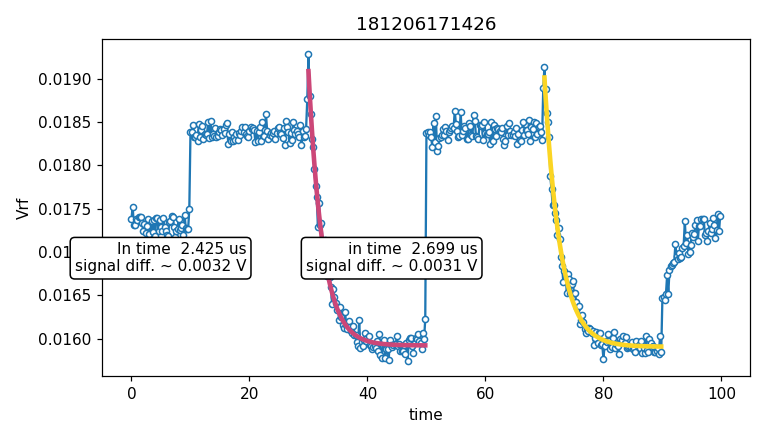

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # function evals   = 33
    # data points      = 100
    # variables        = 3
    chi-square         = 0.000
    reduced chi-square = 0.000
    Akaike info crit   = -1856.595
    Bayesian info crit = -1848.780
[[Variables]]
    t_decay:     2.42539137 +/- 0.066363 (2.74%) (init= 16.8)
    amplitude:   0.00316467 +/- 4.86e-05 (1.54%) (init= 0.003535042)
    offset:      0.01592164 +/- 1.27e-05 (0.08%) (init= 0.01574695)
[[Correlations]] (unreported correlations are <  0.100)
    C(t_decay, offset)           = -0.563 
    C(t_decay, amplitude)        = -0.536 

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # function evals   = 28
    # data points      = 100
    # variables        = 3
    chi-square         = 0.000
    reduced chi-square = 0.000
    Akaike info crit   = -1869.007
    Bayesian info crit = -1861.192
[[Variables]]
    t_decay:     2.69885066 +/- 0.069641 (2.58%) (init= 10)
    amplitude:   0.00310608 +/- 4.37e-

In [147]:
##  fitting both segments simultaneously,  100 points per cycle-time  default 
d = ex.load_data(h5files()[-1], load_now = True)
#d = ex.load_data(180706183551)

fig, ax = plt.subplots(figsize = (7,4))
t_raw = d['time'].values
V_raw = d['Vrf'].values
ax.plot(t_raw, V_raw, 'o-', markersize = 4, mfc ='w',alpha =1.0)

t_half = 20.        #  half of duty time
dt = 0.2

for nn in range(2):
    if [True, False][nn]:   # True for fitting first half part
        t_ref = 30.        # start point of fitting
        #_t_min, _t_max = 2, 5000
        _t_min, _t_max = 0., 20. # t_half
        t_min, t_max = t_ref + _t_min, t_ref + _t_max

        oa = 0
        xarr  = d['Vrf'][int(t_min/dt): int(t_max/dt)]
        t_arr = d['time'].values[int(t_min/dt): int(t_max/dt)]
        in_rng = np.where((t_min <= t_arr)&(t_arr <= t_max))
    else:
        t_ref = 70.   #1.*t_half #1.965  # start point of fitting
        #_t_min, _t_max = 2, 5000
        _t_min, _t_max = 0., 20.0
        t_min, t_max = t_ref + _t_min, t_ref + _t_max

        ob = 0
        xarr  = d['Vrf'][int(t_min/dt): int(t_max/dt)]           #[122:160]
        t_arr = d['time'].values[int(t_min/dt): int(t_max/dt)]      # [122:160]
        in_rng = np.where((t_min <= t_arr)&(t_arr <= t_max))
        
    t0 = t_min
    if len(xarr.dims) == 2:
        if xarr.dims[-2] == 'repeat':
            trace_full = np.average(xarr.values, axis = 0)
        else:
            diff = np.amax(xarr.values[...,in_rng], axis = (1,2)) - np.amin(xarr.values[...,in_rng], axis = (1,2))
            trace_full = xarr.values[diff.argmax(), slice(None)]
    elif len(xarr.dims) == 1:
        trace_full = xarr.values
    else:
        raise Exception()

    trace = trace_full[in_rng]
    t_argmin, t_argmax = t_arr[in_rng][trace.argmin()], t_arr[in_rng][trace.argmax()]
    amp_init = trace.max() - trace.min() if t_argmax < t_argmin else trace.min() - trace.max()

    def exp_decay(t, t_decay, amplitude, offset):
        return amplitude*np.exp(-(t-t0)/t_decay) + offset

    model  = lmfit.Model(exp_decay, independent_vars=['t'])
    result = model.fit(trace, t = t_arr[in_rng],
                       t_decay   = lmfit.Parameter(value = abs(t_argmin-t_argmax), min= 0., max = 10.*(t_max-t_min)), # abs(t_argmin-t_argmax)
                       amplitude = lmfit.Parameter(value = amp_init),  # 0.0002,   amp_init
                       offset  = lmfit.Parameter(value = trace.min() if t_argmax < t_argmin else trace.max())) #0.018)) 
    t_decay, amplitude, offset = (result.best_values[key] for key in result.var_names)


    #ax.plot(t_arr, trace_full, 'bo-', markersize = 2)    # fitted part

    ax.plot(t_arr, model.func(t_arr, **result.best_values), lw = 3,c = cmap(0.5+nn/2.4))
    #ax.plot(t_raw, model.func(t_raw, **result.best_values), lw = 3,c = cmap(0.5+nn/2.4))

    if len(xarr.dims) == 2 and xarr.dims[-2] != 'repeat':
        label = '%s = %.4f'%(xarr.dims[0], d[xarr.dims[0]].values[diff.argmax()])
        txt   = label + '\n'
        #plt.legend([label, 'fit'], loc = 'best')
    else:
        txt = ''
    tunnel = ['In time', 'in time']    
    txt += tunnel[nn] +' %6.3f us'% t_decay
    txt += '\n'+'signal diff. ~ %6.4f V'%(model.func(t_ref, **result.best_values)-offset)
    props = dict(boxstyle='round', facecolor='w', alpha=1.)
    if amplitude > 0:
        fig.text(0.32+nn*0.3, 0.45, txt, bbox = props, ha = 'right', va = 'top')
    else:
        fig.text(0.5+nn*0.4, 0.24, txt, bbox = props, ha = 'right', va = 'top')

    ax.set_ylabel(xarr.name); ax.set_xlabel(xarr.dims[0])
    ax.set_title(d.filename)
    fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

    print result.fit_report()

In [187]:
result.var_names

['t0', 't_decay', 'amplitude', 'offset']

In [320]:
xarr.dims[0]

'time (us)'

In [332]:
np.arange(0, 10, 1)

array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])

In [334]:
([1:10],[20:23])

SyntaxError: invalid syntax (<ipython-input-334-0d151d9dab82>, line 1)

### repeat detuning sweep

<IPython.core.display.Javascript object>


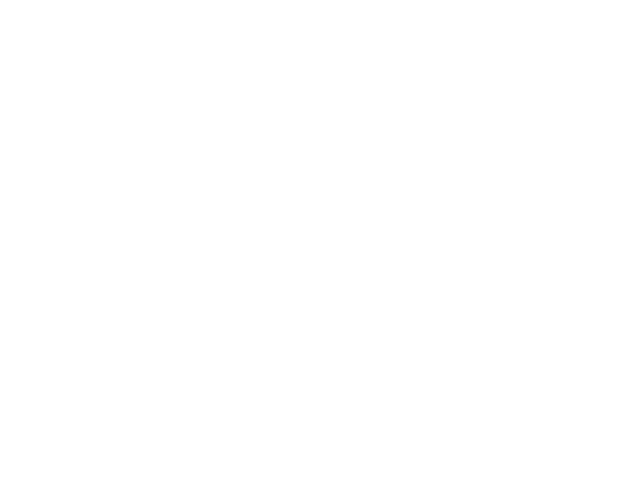

ValueError: invalid axis

In [353]:
from scipy.signal import savgol_filter

d1 = ex.load_data(h5files()[-1], load_now = True)
d1= ex.load_data(180329131556)
#d= ex.load_data(170410132638)
# d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)
# if True: #subtract plane
#     try:
#         d['Vrf_sub'] = tk.remove_plane(d['Vrf'])*1e3
#         d['Vrf_sub'].attrs['units'] = 'mV'
#     except:
#         pass
d = d1.sel(method='pad', **{'PR (V)': -0.8905})             # (**{'PR (V)': slice(0, 30)})  #d.sel(method='pad', **{'PC (V)': 0.153})
#d = d1.isel(dict[repeat=0])

fig = plt.figure()
x = d['PR'].values      #d['time (ns)'].values
y1 = d['Vrf'][0:160]
y2 =  y1.values.mean(axis = 0)              #d['Vrf'].values.

y = savgol_filter(y2, 13, 4)+0.001

diff = np.diff(y)/np.diff(x)
x1 = x[0:160]
diff_smo = savgol_filter(diff, 11, 4)+3

# def PR_to_detuning(PRval):
#     coef = 1.347
#     det_ratio = coef/np.sqrt(coef**2+1)
#     det_arm = det_ratio * 0.02* np.sqrt(2)
# #     return (PRval-(0-0.3795))/0.01224*1000    #0.0082*1000
# #     return (PRval-(0-0.6587))/0.01914*1000
    
#     return (PRval-(0.1412)/det_arm*1000          # all energy parameters are in 'ueV' unit. 0.3146
 

#detuning = PR_to_detuning(d['PR'].values)

plt.plot(x,y2,'s',x,y,'o')
#plt.plot(x1,diff,x1,diff_smo)
plt.show()

plt.xlabel('PR (V)')
plt.ylabel('Vrf (V)')
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
            
print diff,x,x1
            
#tk.plot(d, name = 'Vrf',cmap ='magma')#, ylog = True)
#tk.plot(d, name = 'current',cmap ='magma')#, ylog = True,'Spectral')

<IPython.core.display.Javascript object>


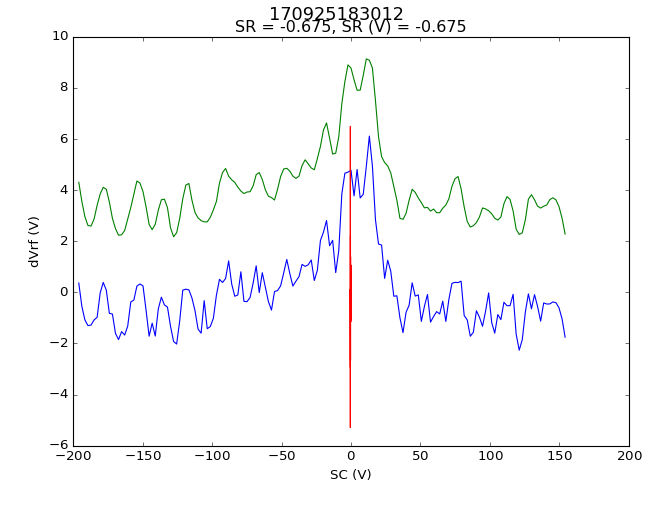

[-1.75599009 -1.03536993 -0.60513616 -0.40505081 -0.37483871 -0.45441091
 -0.4575029  -0.41499734 -1.12574548 -0.5543232  -0.08989125 -0.64332038
 -0.05938113 -0.77351928 -1.85139477 -2.2642687  -1.64017081 -0.0769645
 -0.52317977 -0.52243471 -0.38858503 -1.06863678 -0.86966902 -1.59684569
 -1.18311495 -0.02253801 -0.73820353 -1.33052468 -0.97446144 -0.72028488
 -1.56480819 -1.71821564 -1.08152628 -0.90561807  0.43749809  0.38061291
  0.39126724  0.35207719 -0.27675182 -1.13867223 -0.34555793 -0.84593892
 -0.75425953 -0.94566494 -1.16597861 -0.08355826 -0.54955482 -1.13826245
 -0.09980053 -0.14677644  0.3721565  -0.50421804 -0.78104436 -1.57784671
 -0.99610537 -0.13545156 -0.15325844  0.82876533  1.26000494  0.54590404
  1.851134    1.89088285  2.83952802  4.94617969  6.11647964  4.92591411
  3.83656472  3.69511545  4.80744988  3.77543271  4.77857888  4.70530242
  4.66354191  3.85507941  1.63167715  0.77240169  2.03441828  1.82639807
  2.81047076  2.35591084  2.0268932   0.86102635  0.

In [35]:
## from scipy.signal import savgol_filter

d = ex.load_data(h5files()[-1], load_now = True)
#d= ex.load_data(170628144305)
#d= ex.load_data(170410132638)
# d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)
# if True: #subtract plane
#     try:
#         d['Vrf_sub'] = tk.remove_plane(d['Vrf'])*1e3
#         d['Vrf_sub'].attrs['units'] = 'mV'
#     except:
#         pass

fig = plt.figure()
x = d['PR'].values      #d['time (ns)'].values
y1 = d['Vrf'][0:22]
y2 =  y1.values.mean(axis = 0)              #d['Vrf'].values.

y = savgol_filter(y2, 13, 4)+0.001

diff = np.diff(y)/np.diff(x)
diff_smo = savgol_filter(diff, 11, 4)+4
x1 = x[0:160]
#plt.plot(x,y,x,y2)
plt.plot(detuning[0:160],diff, detuning[0:160], diff_smo)

plt.xlabel('PR')
plt.ylabel('dVrf/dPR')
plt.show()
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
print diff,x,x1
#tk.plot(d, name = 'Vrf',cmap ='magma')#, ylog = True)
#tk.plot(d, name = 'current',cmap ='magma')#, ylog = True,'Spectral')

In [32]:
d = ex.load_data(h5files()[-1], load_now = True)
#d= ex.load_data(170410132638)
#d= ex.load_data(170419211303)

d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)
if True: #subtract plane
    try:
        d['Vrf_sub'] = tk.remove_plane(d['Vrf'])*1e3
        d['Vrf_sub'].attrs['units'] = 'mV'
    except:
        pass
#cmaps = cm.Spectral
n_average   = 1
n_indeces   = 1000
meas_length = 2500
times = 313
d1 = d.mean(axis = 0)
#d1.axis(times, var = 'time (ns)')
#plt.figure()
#tk.plot(d1, name = 'Vrf',cmap ='Spectral')#, ylog = True)
print d,d1

<xarray.Dataset>
Dimensions:    (repeat: 1000, time (ns): 313)
Coordinates:
  * repeat     (repeat) int32 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
  * time (ns)  (time (ns)) int32 0 8 16 24 32 40 48 56 64 72 80 88 96 104 ...
Data variables:
    Vrf        (repeat, time (ns)) float32 -0.0522705 -0.0529297 -0.0539551 ...
    diff       (repeat, time (ns)) float32 -0.000282845 -0.000711832 ...
    Vrf_sub    (repeat, time (ns)) float32 0.0 -0.73242 -1.83105 2.36817 ...
Attributes:
    filename: 170420155729
    comment: L = 0. V, PL = 0. V, CL = -1.25 V, PC = -0.114 V, CR = -0.92 V, PR = 0.192 V, R = -1.4 V, S = -0.95 V, SL = -1.1 V, SC = -0.433 V, SR = -0.75 V, rf(rf.frequency=250.000000, rf.power=14.500000), Vps=0.000000, AWG(), Bext=0.200000

#simple time trace repeated
n_average   = 1
n_indeces   = 1000
meas_length = 2500
time_axis = np.arange(0, meas_length, 8)

with ex.data_store() as d:
    d.axis(np.arange(n_indeces), var = 'repeat')
    d.axis(time_axis, var = 'time (ns

In [199]:
#d = ex.load_data(h5files()[-1], load_now = True)
d= ex.load_data(170221170120)

#d1.axis(times, var = 'time (ns)')
#plt.figure()
#tk.plot(d1, name = 'Vrf',cmap ='Spectral')#, ylog = True)

#print d,d['Vrf'].values
print d,d.attrs

<xarray.Dataset>
Dimensions:    (repeat: 1000, time (ns): 12500)
Coordinates:
  * repeat     (repeat) int32 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
  * time (ns)  (time (ns)) int32 0 8 16 24 32 40 48 56 64 72 80 88 96 104 ...
Data variables:
    Vrf        (repeat, time (ns)) float32 0.00736635 0.00299623 0.00685365 ...
Attributes:
    filename: 170221170120
    comment: L = 0. V, PL = 0. V, CL = -1.4 V, PC = 0.059 V, CR = -0.9 V, PR = 0.148 V, R = -1.4 V, S = -0.95 V, SL = -1.15 V, SC = -0.382 V, SR = -0.75 V, rf(rf.frequency=245.500000, rf.power=14.500000), Vps=5.000000, AWG(), Bext=0.200000

#simple time trace repeated
n_average   = 1
n_indeces   = 1000
if time_label == 'dwell':
    config_CDS = {'meas_offset': 501*us_pnts, 'meas_samples': 100*us_pnts,
                   'ref_offset':  50*us_pnts,  'ref_samples': 100*us_pnts}
if time_label == 'evolution':
... OrderedDict([(u'filename', u'170221170120'), (u'comment', u"L = 0. V, PL = 0. V, CL = -1.4 V, PC = 0.059 V, CR = -

<IPython.core.display.Javascript object>


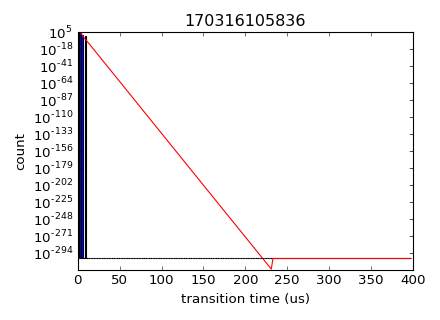

[[Model]]
    Model(double_exponential_decay_hist)
[[Fit Statistics]]
    # function evals   = 4795
    # data points      = 197
    # variables        = 4
    chi-square         = 1.000
    reduced chi-square = 0.005
    Akaike info crit   = -1032.785
    Bayesian info crit = -1019.652
[[Variables]]
    decay_time1:   278.513619 +/- nan      (nan%) (init= 10000)
    decay_time2:   310.196285 +/- nan      (nan%) (init= 100000)
    n1:            1.5774e+09 +/- nan      (nan%) (init= 400)
    n2:           -1.0202e+08 +/- nan      (nan%) (init= 400)
[[Correlations]] (unreported correlations are <  0.100)

decay times: 0.278514 us, 0.310196 us (ratio = 1.113756)


In [212]:
d = ex.load_data(h5files()[-1], load_now = True)
#d = ex.load_data(170222131034, load_now = True)
estimate = True
if estimate:
    threshold = 0.0014
    t_start, t_stop, i_step = 2e3, 400e+3, 1

    Vrf        = d.Vrf.values
    time       = d[d.Vrf.dims[-1]].values
    i_start, i_stop = aindex(time, t_start), aindex(time, t_stop)
    i_stop    -= (i_stop-i_start)%i_step
    time_calc  = time[i_start:i_stop:i_step]
    Vrf        = d.Vrf.values[:,i_start:i_stop]
    Vrf_box    = Vrf if i_step == 1 else np.average(Vrf.reshape(-1, Vrf.shape[1]/i_step, i_step), axis = -1)

    dVrf       = Vrf_box - threshold if threshold > 0 else threshold - Vrf_box
    fwd_cumsum = np.cumsum(dVrf, axis = -1)
    bwd_cumsum = np.cumsum(np.fliplr(dVrf), axis = -1)
    step_prob_dist = fwd_cumsum - np.fliplr(bwd_cumsum)
    step_times = time_calc[np.argmax(step_prob_dist, axis = -1)]

density_plot = False
if density_plot:
    bin1, bin2      = np.arange(0,20e3,1e3), np.arange(20e3, 400e3,4e3)
    bin_edges       = np.concatenate((bin1, bin2))
    hist_step_times = np.histogram(step_times, bins = bin_edges, density = True)[0]
    fig, ax = plt.subplots()
    ax.bar(bin1/1e3, hist_step_times[:len(bin1)], width = (bin1[1]-bin1[0])/1e3)
    ax.bar(bin2/1e3, hist_step_times[-len(bin2):], width = (bin2[1]-bin2[0])/1e3)
    ax.set_yscale('log')
    ax.set_xlabel('transition time (us)'); ax.set_ylabel('density')
else:
    bin_edges       = np.arange(t_start, t_stop, 2e3)
    bin_centers     = 0.5*(bin_edges[1:] + np.roll(bin_edges, 1)[1:])
    hist_step_times = np.histogram(step_times, bins = bin_edges, density = False)[0]

    def double_exponential_decay_hist(t, decay_time1, decay_time2, n1, n2):
        return  n1* np.exp(-t/decay_time1) + n2 * np.exp(-t/decay_time2)

    model2  = lmfit.Model(double_exponential_decay_hist, independent_vars = ['t'])
    result2 = model2.fit(hist_step_times[1:], t = bin_centers[1:],
                         decay_time1  = lmfit.Parameter(value = 10e3),
                         decay_time2  = lmfit.Parameter(value = 100e3),
                         n1           = lmfit.Parameter(value = 0.4*len(step_times)),
                         n2           = lmfit.Parameter(value = 0.4*len(step_times)),)

    fig, ax = plt.subplots(figsize = (5.5, 4))
    ax.set_yscale('log')
    ax.bar(bin_edges[:-1]/1e3, hist_step_times, width = (bin_edges[1]-bin_edges[0])/1e3)
    ax.plot(bin_centers/1e3, np.abs(double_exponential_decay_hist(bin_centers, **result2.best_values)), '-', color = 'red')
    ax.set_yscale('log')
    ax.set_xlabel('transition time (us)'); ax.set_ylabel('count');plt.title(d.filename)
    fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

    print result2.fit_report()
    print 'decay times: %f us, %f us (ratio = %f)'%(result2.best_values['decay_time1']/1000.,
                                                    result2.best_values['decay_time2']/1000.,
                                                    result2.best_values['decay_time2']/result2.best_values['decay_time1'])

3000


<IPython.core.display.Javascript object>


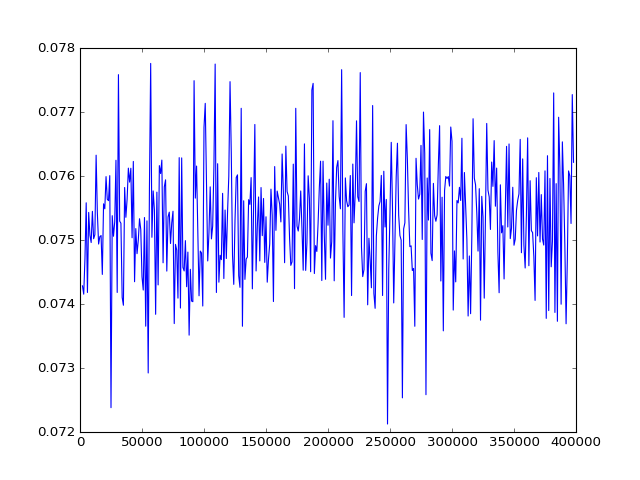

In [46]:
index = 1630
print step_times[index]
fig, ax = plt.subplots()
#ax.plot(step_times, '.')
ax.plot(time_calc, Vrf_box[index])

<IPython.core.display.Javascript object>


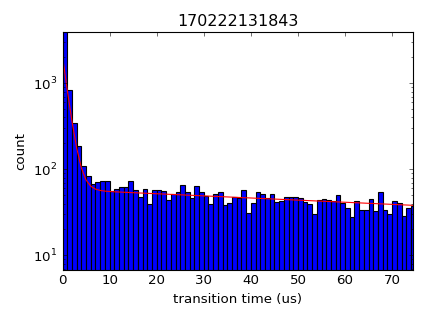

[[Model]]
    Model(double_exponential_decay_hist)
[[Fit Statistics]]
    # function evals   = 60
    # data points      = 398
    # variables        = 4
    chi-square         = 35548.157
    reduced chi-square = 90.224
    Akaike info crit   = 1795.892
    Bayesian info crit = 1811.838
[[Variables]]
    decay_time1:   1068.27261 +/- 28.43863 (2.66%) (init= 10000)
    decay_time2:   1.7595e+05 +/- 7.23e+03 (4.11%) (init= 100000)
    n1:            1985.32074 +/- 61.58443 (3.10%) (init= 8000)
    n2:            58.2931275 +/- 1.597304 (2.74%) (init= 8000)
[[Correlations]] (unreported correlations are <  0.100)
    C(decay_time1, n1)           = -0.928 
    C(decay_time2, n2)           = -0.754 
    C(decay_time1, n2)           = -0.236 
    C(decay_time1, decay_time2)  =  0.174 
    C(n1, n2)                    =  0.134 

decay times: 1.068273 us, 175.946479 us (ratio = 164.701853)


optimal distinction time: 79.8 us, with average error rate: 4.8 %


<IPython.core.display.Javascript object>


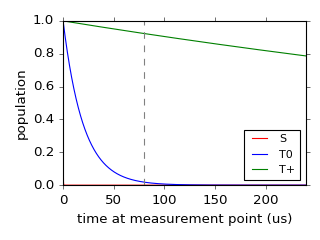

<IPython.core.display.Javascript object>


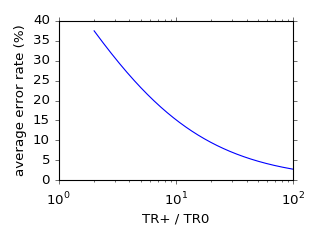

In [335]:
#back of envelope
time_us = np.arange(0, 1e3, 0.1)
decay0  = 20
decay1  = 1000

alpha = decay1/float(decay0)
def tau_best(alpha):
    return (alpha/(alpha-1))*np.log(alpha)
def err(tau, alpha):
    return 1-np.exp(-tau/alpha) + np.exp(-tau)
def err_best(alpha):
    return 1-(alpha-1)*np.exp(-alpha/(alpha-1)*np.log(alpha))
    
t_best = tau_best(alpha)*decay0
e_best = err(tau_best(alpha), alpha)
print 'optimal distinction time: %.1f us, with average error rate: %.1f %%' %(t_best, 100*0.5*e_best)

fig, ax = plt.subplots(figsize = (4.,3))
ax.plot(time_us, np.exp(-time_us/0.1), label = 'S', color = 'red')
ax.plot(time_us, np.exp(-time_us/decay0), label = 'T0')
ax.plot(time_us, np.exp(-time_us/decay1), label = 'T+')
ax.axvline(t_best, linestyle ='--', color = 'grey')
#ax.plot(time_us, 1-np.exp(-time_us/decay1)+np.exp(-time_us/decay0), color = 'purple')
ax.set_xlim(0, 3*t_best)
ax.legend(loc = 'best', fontsize = 10)
ax.set_xlabel('time at measurement point (us)');ax.set_ylabel('population')
ax.tick_params(direction = 'out')
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

alpha_arr = np.arange(2, 100, 0.1)
fig, ax = plt.subplots(figsize = (4.,3))
ax.plot(alpha_arr, 100*0.5*err(tau_best(alpha_arr), alpha_arr))
#ax.plot(alpha_arr, 100*0.5*err_best(alpha_arr))
ax.set_xscale('log')
ax.set_xlabel('TR+ / TR0');ax.set_ylabel('average error rate (%)')
ax.tick_params(which = 'both', direction = 'out')
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

## boxcar

(10000L,) (51L, 10000L)
0
(4L,) (204L,)


<IPython.core.display.Javascript object>


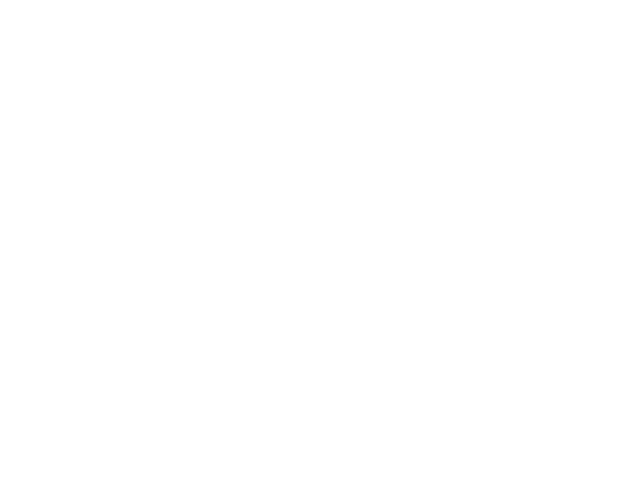

ValueError: x and y must have same first dimension

In [309]:
#filename = ''

#time_resolution = 8*10*5#ns
time_resolution = 20e3
d = ex.load_data(h5files()[-1], load_now = True)
#d= ex.load_data(170621140800)
#d  = ex.load_data(filename)
def boxcar(t, signal, width = int(time_resolution/8)):
    print t.shape, signal.shape
    signal_ave = signal.reshape(-1, width).mean(axis = 1)
    t_ave = t.reshape(-1, width).mean(axis = 1)
    return t_ave, signal_ave

time, vrf = boxcar(d['time (ns)'].values, d['Vrf'].values)
transition_index = np.argmax(vrf.var(axis = 0))

glabel = d.coords.keys()[0]
g = d[glabel].values[transition_index]

print transition_index
print time.shape, vrf.shape

if True:
    fig = plt.figure()
    plt.plot(time, vrf, '-')
    plt.xlabel('time(ns)'); plt.ylabel('Vrf(V)')
    plt.title('%s %s = %f'%(d.attrs['filename'], glabel, g))
    fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
    plt.show()

# PSB liftime

<IPython.core.display.Javascript object>


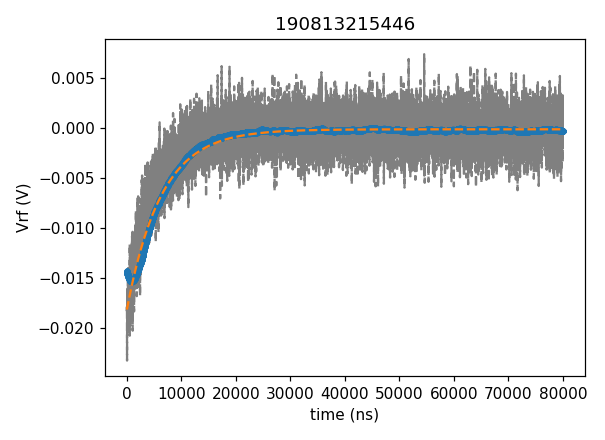

[[Model]]
    Model(exponential_decay)
[[Fit Statistics]]
    # function evals   = 53
    # data points      = 9999
    # variables        = 3
    chi-square         = 0.001
    reduced chi-square = 0.000
    Akaike info crit   = -159733.560
    Bayesian info crit = -159711.929
[[Variables]]
    decay_time:   6299.96694 +/- 13.26887 (0.21%) (init= 39992)
    offset:      -0.00017095 +/- 4.10e-06 (2.40%) (init=-0.001308022)
    signal:      -0.01801426 +/- 2.42e-05 (0.13%) (init=-0.002518221)
[[Correlations]] (unreported correlations are <  0.100)
    C(decay_time, signal)        =  0.637 
    C(decay_time, offset)        =  0.432 

decay time: 6.3 us
note the cutoff time constant of the low-pass used is 1.2 us


<IPython.core.display.Javascript object>


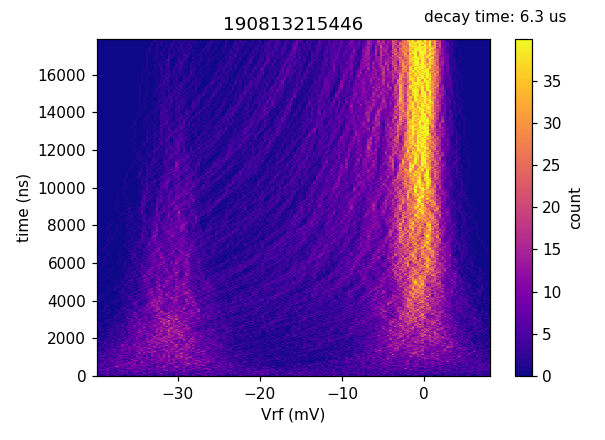

In [341]:
process = {'load' : True, 'decay': True, 'hist' : True, 'fit': False, 'std': False,}
figshow = {'load' : None, 'decay': True, 'hist' : True, 'fit': False, 'std': False,}

t_start, t_stop, i_step = 0e3, 200e+3, 1  #  original t_stop = 360e+3
# determines for which time range the integrated histogram will be calculated

lpf_cutoff =  800e-6 #800e-6 #lpf cutoff frequency in GHz. None to turn off.
t_int = 200e+3 #"integration" time for which fitting will be performed. Note the integration time is actually t_start shorter if t_start > 0.
Vrf_sep = None #-0.001 #Expected value of Vrf_T-Vrf_S. None to autodetect

bins_array = [np.linspace(0.012, 0.020, 201),np.linspace(0.018, 0.028, 201)][1]
bins_array = np.linspace(-0.04, 0.02, 201)
#describes the bin for histgrams. None for automated bin setting.

double_exp = False
log        = False

if process['load']:
    dP = ex.load_data(h5files()[-1], load_now = True)  #  h5files()[-1]
    #dP = ex.load_data('190730180509', load_now = True)   # 180912205116  , 170801215526
    
    fname_PSB  = dP.filename
    repeat     = dP.Vrf['repeat'].values
    time_label = dP.coords.keys()[1]
    time       = dP.Vrf[time_label].values

    i_start, i_stop = aindex(time, t_start), aindex(time, t_stop)
    i_stop    -= (i_stop-i_start)%i_step
    time_calc  = time[i_start:i_stop:i_step]

    Vrf     = dP.Vrf.values[:,i_start:i_stop]
    Vrf_box = np.average(Vrf.reshape(-1, Vrf.shape[1]/i_step, i_step), axis = -1)

if process['decay']:
    if lpf_cutoff is not None:
        freq = np.fft.rfftfreq(len(time_calc), d = 8)[1:]
        
        from scipy.signal import iirfilter, lfilter
        lpf_cutoff, lpf_order, lpf_ripple = lpf_cutoff, 1, 1 #you can tweak here
        f_nyq  = 0.5*(1./8)
        numerator, denominator = iirfilter(lpf_order, lpf_cutoff, rp = lpf_ripple, btype='lowpass', analog=False, ftype='cheby1')
        Vrf_tmp = np.average(Vrf, axis = 0)
        Vrf_tmp = np.concatenate((np.ones(1000)*np.average(Vrf_tmp[i_start:i_start+300]), Vrf_tmp))
        Vrf_lpf = lfilter(numerator, denominator,Vrf_tmp, axis = -1)[1000:]
        Vrf_ave = np.average(Vrf_lpf.reshape(-1, i_step), axis = -1)

    else:
        Vrf_ave = np.average(Vrf_box, axis = 0)
   
    def exponential_decay(t, decay_time, offset, signal):
        return offset + signal * np.exp(-t/decay_time)
    
    indeces = [int(r*len(Vrf_ave)) for r in (0.1, 0.2, 0.8, 0.9)]
    signal = np.mean(Vrf_ave[indeces[0]:indeces[1]]) - np.mean(Vrf_ave[indeces[2]:indeces[3]])

    model  = lmfit.Model(exponential_decay, independent_vars=['t'])   # fitting function
    result = model.fit(Vrf_ave, t = time_calc,
                       decay_time = lmfit.Parameter(value = 0.5*max(time_calc)),
                       offset     = lmfit.Parameter(value = np.mean(Vrf_box)),
                       signal     = lmfit.Parameter(value = signal),)

    decay_time, offset, signal = (result.best_values[key] for key in model.param_names)

    def double_exponential_decay(t, decay_time1, decay_time2, offset, signal1, signal2):
        return offset + signal1 * np.exp(-t/decay_time1) + signal2 * np.exp(-t/decay_time2)
    
    if double_exp:
        model2  = lmfit.Model(double_exponential_decay, independent_vars = ['t'])
        result2 = model2.fit(Vrf_ave, t = time_calc,
                             decay_time1  = lmfit.Parameter(value = 5e3),
                             decay_time2  = lmfit.Parameter(value = 200e3),
                             offset       = lmfit.Parameter(value = np.mean(Vrf_box)),
                             signal1      = lmfit.Parameter(value = signal),
                             signal2      = lmfit.Parameter(value = signal),)
        offset2 = result2.best_values['offset']
    else:
        offset2 = offset
    
    if figshow['decay']:
        fig, ax = plt.subplots(figsize = (5.5, 4))
        if log:
            ax.set_yscale('log')
            ax.plot(time_calc, np.abs(Vrf_ave+offset2),'.')
            ax.plot(time_calc, np.abs(exponential_decay(time_calc, decay_time, offset, signal)+offset2), '--', color = 'red')
            if double_exp:
                ax.plot(time_calc, np.abs(double_exponential_decay(time_calc, **result2.best_values)+offset2), '-', color = 'violet')
        else:
            if lpf_cutoff is not None:
                ax.plot(time_calc, np.average(Vrf_box, axis = 0), '--', color = 'grey')
            ax.plot(time_calc, Vrf_ave,'--.', color = 'C0') # 'blue'
            ax.plot(time_calc, exponential_decay(time_calc, decay_time, offset, signal), '--', color = 'C1',lw =1.5)
            if double_exp:
                ax.plot(time_calc, double_exponential_decay(time_calc, **result2.best_values), '-', color = 'yellow')            
        ax.set_xlabel(time_label);ax.set_ylabel('Vrf (V)');ax.set_title(fname_PSB)
        fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
    
    if double_exp:
        print result2.fit_report()
        print 'decay times: %f us, %f us (ratio = %f)'%(result2.best_values['decay_time1']/1000.,
                                                        result2.best_values['decay_time2']/1000.,
                                                        result2.best_values['decay_time2']/result2.best_values['decay_time1'])

    else:
        print result.fit_report()
        print 'decay time: %.1f us' % (decay_time*1e-3)
    
    if lpf_cutoff is not None and decay_time*lpf_cutoff < 10.:
        print 'note the cutoff time constant of the low-pass used is %.1f us'%(1e-3/lpf_cutoff)

if process['hist'] or process['std']:
    Vrf_cum = np.cumsum(Vrf_box, axis = 1)/np.arange(1, Vrf_box.shape[1]+1)
    
    if process['hist']:
        if bins_array is None:
            hist_bins = 200
            ave, std = float(np.average(Vrf_cum)), float(np.std(Vrf_cum, ddof=1))
            val_range  = (ave-3*std, ave+3*std)
            step_bins  = (val_range[-1] - val_range[0])/(hist_bins-1)
            bins_array = np.linspace(val_range[0], val_range[-1], hist_bins)
        bins_centers = (bins_array[:-1]+bins_array[1:])/2
        Vrf_cum_hist = np.array([np.histogram(v, bins = bins_array)[0] for v in Vrf_cum.transpose()])   # histogram of Vrf_cum/np.arange
    
    if figshow['hist']:
        fig, ax = plt.subplots(figsize = (5.5, 4))
        im  = plt.gca().pcolormesh(bins_centers*1000, time_calc, Vrf_cum_hist,cmap = 'plasma', vmax = 0.04*repeat[-1])  #####---------
        fig.colorbar(im, label = 'count')
        plt.xlabel('Vrf (mV)'); plt.ylabel(time_label); plt.title(fname_PSB)
#        plt.xticks(np.linspace(min(bins_centers), max(bins_centers), 3))
#        plt.xticks(np.linspace(min(bins_array), max(bins_array), 0.001)*1000)
        fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
        fig.text(0.7,0.95,'decay time: %.1f us' % (decay_time*1e-3))
    

if process['fit']:
    t, TR, d_bins = t_int, decay_time, np.abs(bins_centers[0]-bins_centers[1])
    from scipy import integrate
    def n_Vrf(Vrf, sigma, P_T, Vrf_T, Vrf_S):
        dVrf = Vrf_T - Vrf_S
        g_coeff = 1./(np.sqrt(2*np.pi)*sigma)
        n_S  = g_coeff*np.exp(-(Vrf-Vrf_S)**2/(2*(sigma**2)))
        n_TT = g_coeff*np.exp(-t/TR)*np.exp(-(Vrf-Vrf_T)**2/(2*(sigma**2)))
        def relax(v_avg, v_bin):
            return np.exp(-(t/TR)*((v_avg-Vrf_S)/dVrf)-(v_bin-v_avg)**2/(2*(sigma**2)))
        n_TS = (g_coeff/dVrf)*(t/TR)*np.array([integrate.quad(relax, Vrf_S, Vrf_T, (v_bin,))[0] for v_bin in Vrf])
        return ((1.-P_T)*n_S + P_T*(n_TT+n_TS))*len(repeat)*d_bins
    
    Vrf_T_init, Vrf_S_init = (Vrf_sep, 0.) if Vrf_sep is not None else (offset+signal, offset)
    model  = lmfit.Model(n_Vrf, independent_vars=['Vrf'])
    result = model.fit(Vrf_cum_hist[aindex(time_calc, t_int)], Vrf = bins_centers,
                       sigma = lmfit.Parameter(value = 0.2*np.abs(signal), min = 0., max = max(bins_centers) - min(bins_centers)),
                       P_T   = lmfit.Parameter(value = 0.5, min = 0., max = 1.),
                       Vrf_T = lmfit.Parameter(value = Vrf_T_init, min = min(bins_centers), max = max(bins_centers)),
                       Vrf_S = lmfit.Parameter(value = Vrf_S_init, min = min(bins_centers), max = max(bins_centers)),)
#                       Vrf_S = lmfit.Parameter(value = Vrf_S_init, min = min(bins_centers), max = 0.000),)
                       
    sigma, P_T, Vrf_T, Vrf_S = (result.best_values[key] for key in model.param_names)
    
    if figshow['fit']:
        fig = plt.figure(figsize = (5.5, 4))
        plt.plot(bins_centers, Vrf_cum_hist[aindex(time_calc, t_int)], '.')
        plt.plot(bins_centers, n_Vrf(bins_centers, **result.best_values), '--', color = 'C3',lw = 2)
        #plt.plot(bins_centers, n_Vrf(bins_centers, **result.init_values), '--', color = 'grey')
        plt.xlabel('Vrf (V)');plt.ylabel('count'); plt.title(fname_PSB)
        fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()            
    
    print result.fit_report()
    print '%s,  ,%f'%(d.filename, result.best_values['P_T'])

if process['std']:
    std = np.array([np.std(v, ddof = 1) for v in Vrf_cum.transpose()])
    
    if figshow['std']:
        fig = plt.figure(figsize = (5.5, 4))
        if process['decay']:
            valid_index = aindex(time_calc, 2*decay_time)
            plt.plot(time_calc[:valid_index], sigma[:valid_index], 'b.')
            plt.plot(time_calc[valid_index:], sigma[valid_index:], 'bo')
            #plt.axhline(abs(signal), color = 'grey', linestyle='--')
        else:
            plt.plot(time_calc, sigma, 'o')
        plt.xlabel(time_label);plt.ylabel('std of Vrf (V)')
        fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

# print Vrf     
# print d.Vrf.values
# print Vrf_box

In [106]:
#Vrf_cum.shape
#Vrf_ave.shape
#Vrf_box.shape
#Vrf_lpf.shape
#denominator#numerator#, 
lfilter(numerator, denominator,Vrf_tmp, axis = -1).shape
Vrf_tmp.shape
np.average(Vrf, axis = 0).shape

(9999L,)

<IPython.core.display.Javascript object>


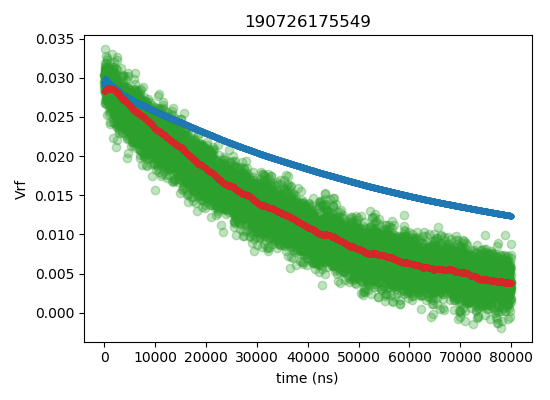

In [98]:
#np.cumsum(Vrf_box, axis = 1)
#Vrf_box
fig = plt.figure(figsize = (5.5, 4))

plt.plot(time_calc, np.mean(Vrf_box, axis = 0), 'o', color = 'C2',alpha =0.3)
plt.plot(time_calc, np.mean(np.cumsum(Vrf_box, axis = 1), axis =0)/np.arange(1, Vrf_box.shape[1]+1), '.',c ='C0',alpha =0.6)
#plt.plot(time_calc, np.cumsum(Vrf_box, axis = 1)[78,:]/np.arange(1, Vrf_box.shape[1]+1), '.',c ='C3',alpha =0.6)
plt.plot(time_calc, Vrf_ave, '.',c ='C3',alpha =0.6)

#plt.plot(time_calc, np.cumsum(Vrf_box, axis = 1)[0,:]/np.arange(1, Vrf_box.shape[1]+1), '.',c ='C0',alpha =0.6)
#plt.plot(time_calc, Vrf_box[0,:], 'o', color = 'C3',alpha =0.3)

plt.xlabel('time (ns)')
plt.ylabel('Vrf')
plt.title(fname_PSB)
fig.tight_layout()

In [44]:
#v.shape
np.histogram(v, bins = bins_array)

(array([ 0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  0,  0,  1,  1,  0,
         0,  0,  0,  1,  0,  0,  0,  1,  0,  0,  1,  0,  0,  0,  0,  0,  1,
         0,  0,  1,  0,  0,  1,  1,  0,  0,  0,  0,  0,  1,  1,  1,  0,  0,
         1,  3,  2,  4,  1,  1,  2,  4,  4,  6,  2, 10, 11,  9, 15, 15,  8,
        11, 10, 16, 11, 13, 16, 24, 14, 17, 18, 10, 10,  7, 14, 13,  9, 24,
        12, 12, 12, 14, 12, 15, 12, 12, 11, 12,  8, 14, 11, 13, 12, 14, 12,
        10,  5,  9,  9,  7, 12, 20, 14, 13, 14, 17, 19, 24, 32, 28, 21, 13,
        28, 16, 20, 14, 13, 19,  8, 11, 11, 10,  7,  5,  3,  4,  1,  2,  1,
         2,  0,  0,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
         0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0], dtype=int64),
 array([-1.000e-02, -9.850e-03, -9.700e-03, -9.550e-03, -9.400e-03,
        -9.250e-03, -

In [161]:
a_1 = np.linspace(0,10,11)
a_1[1:]+a_1[:-1]

array([  1.,   3.,   5.,   7.,   9.,  11.,  13.,  15.,  17.,  19.])

In [34]:
Vrf_box.shape

(1000L, 1249L)

0 1 2 3 4 5 6 7 8 9

<IPython.core.display.Javascript object>


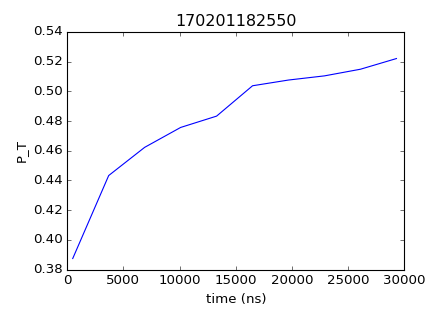

<IPython.core.display.Javascript object>


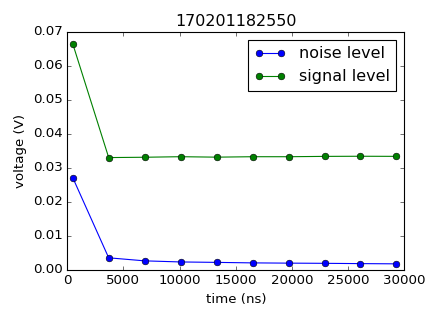

In [22]:
#integration time dependence of fitting parameters
time_calc_step = 400

time_calc_stepped = time_calc[aindex(time_calc, t_start):aindex(time_calc, 2*decay_time):time_calc_step]
sigma, P_T, Vrf_T, Vrf_S = (np.zeros_like(time_calc_stepped) for i in range(4))
for idx, t_int in enumerate(time_calc_stepped):
    t, TR, d_bins = t_int, decay_time, np.abs(bins_centers[0]-bins_centers[1])
    def n_Vrf(Vrf, sigma, P_T, Vrf_T, Vrf_S):
        dVrf = Vrf_T - Vrf_S
        g_coeff = 1./(np.sqrt(2*np.pi)*sigma)
        n_S  = g_coeff*np.exp(-(Vrf-Vrf_S)**2/(2*(sigma**2)))
        n_TT = g_coeff*np.exp(-t/TR)*np.exp(-(Vrf-Vrf_T)**2/(2*(sigma**2)))
        def relax(v_avg, v_bin):
            return np.exp(-(t/TR)*((v_avg-Vrf_S)/dVrf)-(v_bin-v_avg)**2/(2*(sigma**2)))
        n_TS = (g_coeff/dVrf)*(t/TR)*np.array([integrate.quad(relax, Vrf_S, Vrf_T, (v_bin,))[0] for v_bin in Vrf])
        return ((1.-P_T)*n_S + P_T*(n_TT+n_TS))*len(repeat)*d_bins
    
    model  = lmfit.Model(n_Vrf, independent_vars=['Vrf'])
    result = model.fit(Vrf_cum_hist[aindex(time_calc, t_int)], Vrf = bins_centers,
                       sigma = lmfit.Parameter(value = 0.1*np.abs(signal), min = 0., max = max(bins_centers) - min(bins_centers)),
                       P_T   = lmfit.Parameter(value = 0.5, min = 0., max = 1.),
                       Vrf_T = lmfit.Parameter(value = offset+signal, min = min(bins_centers), max = max(bins_centers)),
                       Vrf_S = lmfit.Parameter(value = offset,        min = min(bins_centers), max = max(bins_centers)),)

    sigma[idx], P_T[idx], Vrf_T[idx], Vrf_S[idx] = (result.best_values[key] for key in model.param_names)
    print idx, 

dVrf = Vrf_T - Vrf_S

fig = plt.figure(figsize = (5.5, 4))
plt.plot(time_calc_stepped, P_T)
plt.xlabel('time (ns)');plt.ylabel('P_T'); plt.title(fname_PSB)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()            

fig = plt.figure(figsize = (5.5, 4))
plt.plot(time_calc_stepped, sigma, 'o-', label = 'noise level')
plt.plot(time_calc_stepped, np.abs(dVrf), 'o-', label = 'signal level')
plt.xlabel('time (ns)');plt.ylabel('voltage (V)'); plt.title(fname_PSB)
plt.legend(loc = 'best')            
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

In [312]:
df = ex.load_data(-1)
print df.attrs

OrderedDict([(u'filename', u'190121175126'), (u'status', u'L = -0.345 V, PL = -1.1034 V, T = -0.53 V, PR = -0.2172 V, R = -0.85 V, C1 = -0.65 V, C2 = 0. V, SL = -1.3 V, SC = -0.802 V, SR = -0.78 V, rf(rf.frequency=207.500000, rf.power=14.500000), Vps=4.500000, AWG(), AWGMA(), Bext=0.200000'), (u'exec_code', u"## simple time trace repeated\nn_average   = 1\nn_indeces   = 1000\nif time_label == 'dwell':\n    config_CDS = {'meas_offset': 501.*us_pnts, 'meas_samples': 20.*us_pnts,\n                   'ref_offset': 11.*us_pnts,  'ref_samples': 20.*us_pnts}   # For T+ test, ref_samp = 0 turns off CDS\n# if time_label == 'dwell':\n#     config_CDS = {'meas_offset': 80.2*us_pnts, 'meas_samples': 30*us_pnts,\n#                    'ref_offset': 24.2*us_pnts,  'ref_samples': 30*us_pnts}\n# if time_label == 'evolution':\n#     config_CDS = {'meas_offset': 501*us_pnts, 'meas_samples': 400*us_pnts,\n#                   'ref_offset':    1*us_pnts, 'ref_samples':  400*us_pnts}\n\ntime_axis = np.arange

# PSB dynamics

<IPython.core.display.Javascript object>


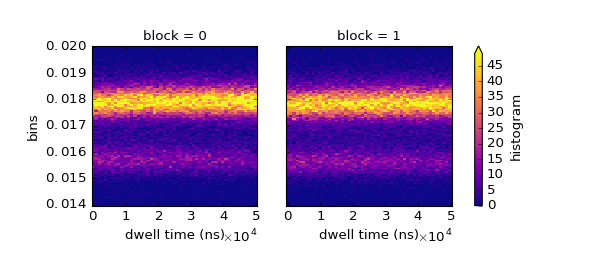

In [212]:
tk.plot(tk.hist(ex.load_data(h5files()[-1], load_now = True).Vrf[::], axis = -2, range = (0.014,0.020)))

In [294]:
temp_data0 = ex.load_data(180926213328)
t00 = temp_data0.sel(method ='pad', **{'det_PR (mV)':3.8, 'block':1})
print t00 #['Vrf']#.shape
print temp_data0

<xarray.Dataset>
Dimensions:          (dwell time (ns): 101, rec: 200)
Coordinates:
    det_PR           float64 3.6
    block            int32 1
  * rec              (rec) int32 0 1 2 3 4 5 6 7 ... 193 194 195 196 197 198 199
    dwell time       (dwell time (ns)) float64 0.0 0.8 1.6 ... 78.4 79.2 80.0
    det_PR (mV)      float64 3.6
  * dwell time (ns)  (dwell time (ns)) float64 0.0 0.8 1.6 ... 78.4 79.2 80.0
Data variables:
    Vrf              (rec, dwell time (ns)) float32 ...
Attributes:
    filename:  180926213328
    comment:   L = -0.58 V, PL = -0.4858 V, T = -0.37 V, PR = -0.9406 V, R = ...
<xarray.Dataset>
Dimensions:          (block: 20, det_PR (mV): 26, dwell time (ns): 101, rec: 200)
Coordinates:
    det_PR           (det_PR (mV)) float64 0.0 0.4 0.8 1.2 ... 8.8 9.2 9.6 10.0
  * block            (block) int32 0 1 2 3 4 5 6 7 8 ... 12 13 14 15 16 17 18 19
  * rec              (rec) int32 0 1 2 3 4 5 6 7 ... 193 194 195 196 197 198 199
    dwell time       (dwell time (ns)

VGFiKGNoaWxkcmVuPShWQm94KGNoaWxkcmVuPShIQm94KGNoaWxkcmVuPShEcm9wZG93bihkZXNjcmlwdGlvbj11J25hbWUnLCBpbmRleD0xLCBvcHRpb25zPSh1J1ZyZicsICdoaXN0JyksIHbigKY=


<IPython.core.display.Javascript object>


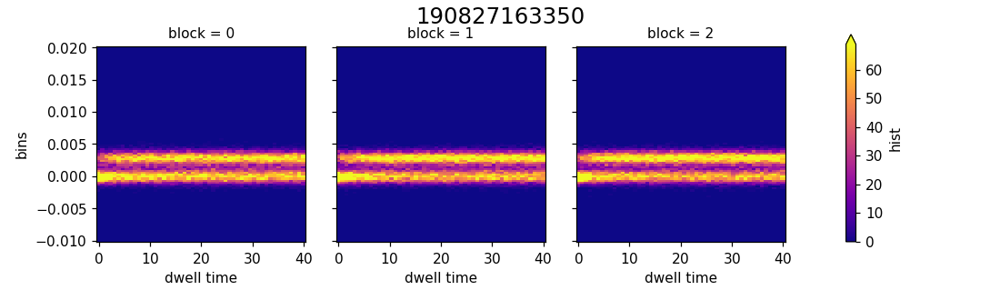

In [349]:
temp_data = ex.load_data(h5files()[-1], load_now = True)

#temp_data = ex.load_data(180723175841)
#temp_data0 = ex.load_data(180926213328)
#temp_data = ex.load_data(181006001054)
#temp_data = ex.load_data(180711182709)
#temp_data = ex.load_data(170221173956)  # S-T0 2017 chloe
#temp_data = temp_data0.sel(method ='pad', **{'det_PR (mV)':3.8, 'block':1})
temp_data['hist'] = tk.hist(temp_data.Vrf, axis = -2, range = (-0.01,0.02))  # (-0.006,0.004)  (0.009,0.017)

#temp_data['ps'] = tk.probability_lower(temp_data.Vrf, 0.0010, axis ='rec')  # axis='rec'

#temp_data['ps'] = 1.0 - tk.probability_lower(temp_data.Vrf, -0.0016, axis ='rec')  # axis='rec'
# temp_data['psave'] = np.mean(temp_data.ps, axis= 1)   # average along blocks
# temp_data['pssub'] = temp_data['psave'] + 0.001
# for nn in range(21):
#     temp_data['pssub'][nn,:] = temp_data['psave'][nn,:]- np.min(temp_data['psave'][nn,:].values)
#plt.figure()
#temp_data['histave'] = temp_data['hist'].mean(axis = - 1)
#tk.plot(temp_data['hist'][:,3,:,:])#, ylog = True
tk.plot(temp_data,name ='hist')

In [225]:
## temp_data = ex.load_data(h5files()[-1], load_now = True)

#temp_data = ex.load_data(180723175841)
temp_data0 = ex.load_data(180926213328)
#temp_data = ex.load_data(181006001054)
#temp_data = ex.load_data(180711182709)
#temp_data = ex.load_data(170221173956)  # S-T0 2017 chloe
temp_data = temp_data0.sel(method ='pad', **{'det_PR (mV)':3.8, 'block':1})
temp_data['hist'] = tk.hist(temp_data.Vrf, axis = -2, range = (-0.016,0.004)) # (-0.006,0.004)  (0.009,0.017)

# temp_data['ps'] = 1.0 - tk.probability_lower(temp_data.Vrf, -0.0016, axis ='rec')  # axis='rec'
# temp_data['psave'] = np.mean(temp_data.ps, axis= 1)   # average along blocks
# temp_data['pssub'] = temp_data['psave'] + 0.001
# for nn in range(21):
#     temp_data['pssub'][nn,:] = temp_data['psave'][nn,:]- np.min(temp_data['psave'][nn,:].values)
#plt.figure()
temp_data['histave'] = temp_data['hist'].mean(axis = - 1)
#tk.plot(temp_data['hist'][:,4,:,:])#, ylog = True
tk.plot(temp_data,name ='histave')

ValueError: dimensions or multi-index levels ['det_PR (mV)'] do not exist

<IPython.core.display.Javascript object>


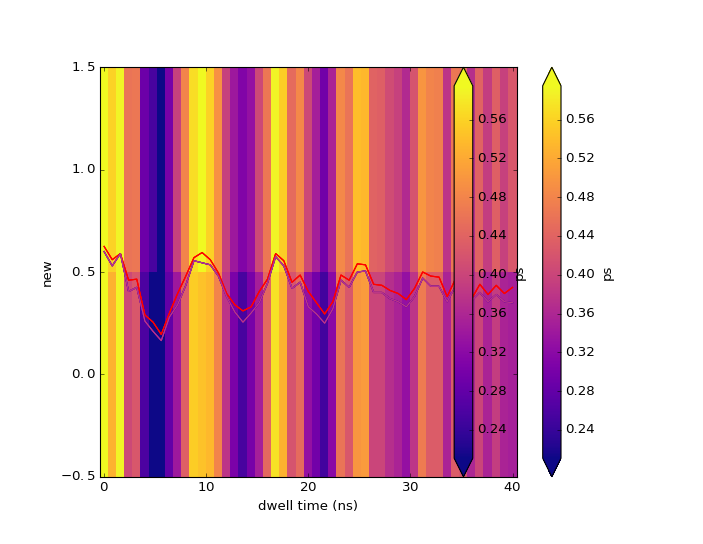

([<matplotlib.lines.Line2D at 0x245de7f0>],
 [<matplotlib.lines.Line2D at 0x245dec18>])

In [29]:
temp_data = ex.load_data(h5files()[-4], load_now = True)
#temp_data = ex.load_data(180625214019)
#temp_data = ex.load_data(180711182709)
#temp_data = ex.load_data(170221173956)  # S-T0 2017 chloe

temp_data['hist'] = tk.hist(temp_data.Vrf, axis = -2, range = (-0.016,0.004)) # (-0.006,0.004)  (0.009,0.017)
#temp_data['hist'] = tk.hist(temp_data.Vrf, axis = 3)
temp_data['ps'] = 1.0 - tk.probability_lower(temp_data.Vrf, -0.002, axis ='rec')  #  -0.0014, axis = 'rec'
temp_data['ps2'] = 1.0 - tk.probability_lower(temp_data.Vrf, -0.005, axis ='rec')  #  -0.0014, axis = 'rec'
#temp_data['histave'] = np.mean(temp_data.hist, axis= -1)   # average along evol times
temp_slice1 = temp_data['ps'].sel(**{'block': 0})
temp_slice2 = temp_data['ps2'].sel(**{'block': 0})
temp_slice = xr.concat([temp_slice1, temp_slice2],dim ='new').drop('block') # , dim ='new'
#tk.plot(temp_data,name ='hist')
#tk.plot(temp_data['hist'][9,2,:,:])  # [PR, block, rec, time]
#tk.plot(temp_data['ps'][9,2,:])       # [PR, block ,time]
#tk.plot(temp_slice)       # [PR, block ,time]
temp_slice[0].plot.line(),temp_slice[1].plot.line(c='r')

<IPython.core.display.Javascript object>


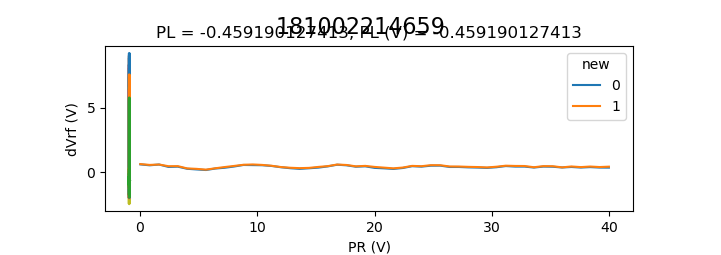

In [4]:
# plot sliced  'PS'
#temp_data = ex.load_data(h5files()[-4], load_now = True)
temp_data = ex.load_data(181002220546)
#temp_data = ex.load_data(180711182709)
#temp_data = ex.load_data(170221173956)  # S-T0 2017 chloe

temp_data['hist'] = tk.hist(temp_data.Vrf, axis = -2, range = (-0.016,0.004)) # (-0.006,0.004)  (0.009,0.017)
#temp_data['hist'] = tk.hist(temp_data.Vrf, axis = 3)
temp_data['ps'] = 1.0 - tk.probability_lower(temp_data.Vrf, -0.002, axis ='rec')  #  -0.0014, axis = 'rec'
temp_data['ps2'] = 1.0 - tk.probability_lower(temp_data.Vrf, -0.005, axis ='rec')  #  -0.0014, axis = 'rec'
#temp_data['histave'] = np.mean(temp_data.hist, axis= -1)   # average along evol times
temp_slice1 = temp_data['ps'].sel(**{'block': 0})
temp_slice2 = temp_data['ps2'].sel(**{'block': 0})
temp_slice = xr.concat([temp_slice1, temp_slice2],dim ='new').drop('block') # , dim ='new'
#tk.plot(temp_data,name ='hist')
#tk.plot(temp_data['hist'][9,2,:,:])  # [PR, block, rec, time]
#tk.plot(temp_data['ps'][9,2,:])       # [PR, block ,time]
#tk.plot(temp_slice)       # [PR, block ,time]
fig, ax =plt.subplots()
temp_slice.plot(hue = 'new')
#temp_slice[0].plot.line(label = '-2mV')
#temp_slice[1].plot.line(label = '-5mV',c ='r')

In [ ]:
##### temp_data1 = ex.load_data(180924190112)
temp_data1['hist'] = tk.hist(temp_data1.Vrf, axis = -2, range = (-0.02,0.004))
tk.plot(temp_data1,name ='hist')

In [244]:
temp_data[dict(block=slice(0, 2))]

SyntaxError: keyword can't be an expression (<ipython-input-244-b38e4f6dbf91>, line 1)

In [117]:
dic1 = {'va': 'wfm', 'as': 0.1}
dic1['va']

'wfm'

In [315]:
#temp_data = ex.load_data(h5files()[-1], load_now = True)
temp_data.attrs

OrderedDict([(u'filename', u'170221173956'),
             (u'comment',
              u'L = 0. V, PL = 0. V, CL = -1.4 V, PC = 0.062 V, CR = -0.9 V, PR = 0.147 V, R = -1.4 V, S = -0.95 V, SL = -1.15 V, SC = -0.387 V, SR = -0.75 V, rf(rf.frequency=245.500000, rf.power=14.500000), Vps=5.000000, AWG(), Bext=0.200000\n\nnum_blocks = 2\nnum_recs   = 100\n\nif time_label == \'evolution\':\n    config_CDS = {\'meas_offset\': 501*us_pnts, \'meas_samples\': 6*1.234567*us_pnts,\n                  \'ref_offset\': (101-80*1.234567)*us_pnts, \'ref_samples\': 40*1.234567*us_pnts}\n\nwith ex.data_store(diskless=False) as d:\n    d.axis(np.arange(num_blocks), var="block")\n    d.axis(np.arange(num_recs), var="rec")\n    d.axis(evol_times, var="%s time"%time_label, units="ns")\n    d.storage(\'Vrf\', chunksizes=(num_blocks, num_recs, len(evol_times)))\n    d.setup_plot(live_plot=False)\n\n    with w.Vrf.start(time_average=True, record_average=False, triggered = True,\n                     num_blocks=num

In [397]:
np.arange(0, 60, 2)

array([ 0,  2,  4,  6,  8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32,
       34, 36, 38, 40, 42, 44, 46, 48, 50, 52, 54, 56, 58])

In [809]:
temp_data#['Vrf'][0][99] #['evolution time']

<xarray.Dataset>
Dimensions:       (block: 1, detu_PR (mV): 51, rec: 1000)
Coordinates:
  * block         (block) int32 0
  * rec           (rec) int32 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
    detu_PR       (detu_PR (mV)) float64 0.0 0.2 0.4 0.6 0.8 1.0 1.2 1.4 1.6 ...
  * detu_PR (mV)  (detu_PR (mV)) float64 0.0 0.2 0.4 0.6 0.8 1.0 1.2 1.4 1.6 ...
Data variables:
    Vrf           (block, rec, detu_PR (mV)) float32 -0.00347941 ...
Attributes:
    filename: 180515143642
    comment: L = -0.59 V, PL = -0.3437 V, T = -0.4 V, PR = -0.9312 V, R = -0.41 V, C1 = -0.75 V, C2 = 0. V, SL = -1.2 V, SC = -0.4665 V, SR = -0.325 V, rf(rf.frequency=204.600000, rf.power=15.000000), Vps=0.600000, AWG(), Bext=0.100000

## Detuning depth dependence
num_blocks = 1
num_recs   = 1000

if time_label == 'evolution' or time_label == 'dwell':
    config_CDS = {'meas_offset':100.2*us_pnts, 'meas_samples': 5.0*us_pnts,
                  'ref_offset': 41*us_pnts, 'ref_samples': 5.0*us_pnts}

with e.

In [27]:
temp_data['histave']

<xarray.DataArray 'histave' (detuning: 1, ramp time: 2, ramp step: 1, Evolution time (ns): 200)>
array([[[[ 2.  ,  1.99,  1.99,  2.  ,  2.  ,  2.  ,  1.99,  2.  ,  2.  ,
           2.  ,  1.99,  1.99,  2.  ,  1.99,  2.  ,  2.  ,  2.  ,  2.  ,
           1.99,  1.99,  2.  ,  2.  ,  2.  ,  2.  ,  1.99,  1.99,  2.  ,
           2.  ,  2.  ,  2.  ,  2.  ,  1.99,  2.  ,  2.  ,  2.  ,  2.  ,
           2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,
           2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,
           2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  1.99,  1.99,  1.99,
           2.  ,  1.99,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,
           1.99,  1.99,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,
           2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  2.  ,
           2.  ,  2.  ,  2.  ,  2.  ,  2.  ,  1.99,  2.  ,  2.  ,  2.  ,
           2.  ,  2.  ,  1.99,  2.  ,  1.99,  2.  ,  2.  ,  2.  ,  2.  ,
           2.  ,  2.  ,  2.

In [12]:
temp_data['Vrf'][0,1,0,1]

<xarray.DataArray 'Vrf' (Evolution time (ns): 200)>
array([ 0.03401676,  0.03359246,  0.03525124,  0.03385643,  0.034449  ,
        0.03480724,  0.03611568,  0.03589058,  0.03401686,  0.03547798,
        0.03638269,  0.03447547,  0.03386826,  0.03413141,  0.03420693,
        0.03625502,  0.03582258,  0.03416321,  0.03389298,  0.03640439,
        0.03580412,  0.03404918,  0.03503877,  0.03578484,  0.03526948,
        0.03596746,  0.03367916,  0.03603606,  0.03414327,  0.03354361,
        0.03360671,  0.03366958,  0.03439429,  0.03381547,  0.03468098,
        0.03402356,  0.03495223,  0.0341844 ,  0.0339525 ,  0.03422135,
        0.03388651,  0.03416095,  0.0342714 ,  0.03427031,  0.03614584,
        0.03521404,  0.03574286,  0.03433095,  0.03347672,  0.03370829,
        0.03555431,  0.03438897,  0.03448728,  0.03397316,  0.03418501,
        0.03392715,  0.03362587,  0.03616432,  0.03388331,  0.03600223,
        0.03360006,  0.03317258,  0.03533199,  0.0352267 ,  0.03452155,
        0.03

## Multi block fit

[-0.001  -0.0008 -0.0012] [ 0.36300004  0.39699996  0.38200003]


<IPython.core.display.Javascript object>


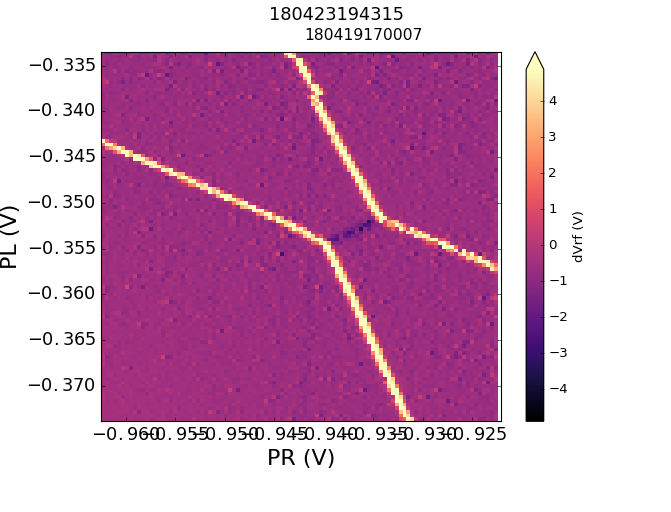

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # function evals   = 48
    # data points      = 21
    # variables        = 3
    chi-square         = 0.015
    reduced chi-square = 0.001
    Akaike info crit   = -146.738
    Bayesian info crit = -143.605
[[Variables]]
    decay_time:   3755.31718 +/- 659.1390 (17.55%) (init= 10000)
    offset:       0.58390999 +/- 0.011066 (1.90%) (init= 0.6450952)
    amp:          0.30150849 +/- 0.023609 (7.83%) (init= 0.2)
[[Correlations]] (unreported correlations are <  0.250)
    C(decay_time, offset)        = -0.714 
    C(decay_time, amp)           = -0.259 

[ 5104.74025626  4734.1465218   3755.31718696] 4531.40132167


In [412]:
#### Multi-blocks fit , with average of decay time

temp_data = ex.load_data(h5files()[-1], load_now = True) #170404230959
#temp_data = ex.load_data(171102170304, load_now = True)
temp_data['hist'] = tk.hist(temp_data.Vrf, axis = -2, range = (-0.006, 0.004))

threshold_candits = np.linspace(0,-0.01,51)
dps = []
for threshold in threshold_candits:
    ps = 1. - tk.probability_lower(temp_data.Vrf, threshold, 'rec')   # when the T peak bins is negative
    #ps = tk.probability_lower(temp_data.Vrf, threshold, 'rec')       # when the T peak bins is positive
    dps.append(np.max(ps.values, axis = -1)-np.min(ps.values, axis = -1))

best_candits = threshold_candits[np.argmax(dps, axis = -2)]
if True: #common threshold
    #thresholds = np.mean(best_candits)
    thresholds = -0.0015
else:
    print best_candits
    thresholds = np.stack([best_candits[idx[0]] for idx in np.ndindex(temp_data.Vrf.shape)])
    thresholds = thresholds.reshape(temp_data.Vrf.shape)

temp_data['ps'] = 1. - tk.probability_lower(temp_data.Vrf, thresholds, 'rec')    # when the T peak bins is negative
#temp_data['ps'] = tk.probability_lower(temp_data.Vrf, thresholds, 'rec')        # when the T peak bins is positive

print best_candits, np.max(temp_data['ps'].values, axis = -1)-np.min(temp_data['ps'].values, axis = -1)

temp_data['delta ps'] = temp_data['ps'].copy()
ps_avg = np.average(temp_data['ps'], axis = -1)
for idx in np.ndindex(ps_avg.shape):
    temp_data['delta ps'][idx] -= ps_avg[idx]

#tk.plot(temp_data, name='ps')
#tk.plot(temp_data['ps'][1])

tick_spacing = 0.2
## plt.autoscale(enable=True, axis='both', tight=None)
x = temp_data['dwell time'].values
y1 = temp_data['ps'][-1].values
#print x,y1
aa = x[0]
bb = y1[0]
#print aa,bb

fig = plt.figure()
from lmfit import minimize, Parameters, Parameter, report_fit

def exp_decay(t, decay_time, offset, amp):
    #bb == amp * np.exp(-aa/decay_time) + offset
    return amp * np.exp(-t/decay_time) + offset

def exp_decay_start_fixed(t, decay_time, start, amp):
    return amp * np.exp(-t/decay_time) + (start - amp)

indeces = [int(r*len(y1)) for r in (0., 0.1, 0.8, 0.9)]
#amp = np.mean(y1[indeces[0]:indeces[1]]) - np.mean(y1[indeces[2]:indeces[3]])
amp = 0.2

nn = len(temp_data['block'])
mm = len(y1)
nums = np.arange(0,len(temp_data['block']),1)
para_store = np.empty(nn)
ps_blocks = np.empty([nn,mm])
# for num in nums:
#     x = temp_data['dwell time'].values
#     y1 = temp_data['ps'][num].values
#     model  = lmfit.Model(exp_decay_start_fixed, independent_vars=['t'])
#     result = model.fit(y1, t = x,
#                    decay_time = lmfit.Parameter(value = 0.5*max(x)),
#                    start     = lmfit.Parameter(value = y1[0], vary = False),
#                    amp     = lmfit.Parameter(value = amp),                  
#                    )
#     decay_time, start, signal = (result.best_values[key] for key in model.param_names)
#     para_store[num] = decay_time
for num in nums:
    x = temp_data['dwell time'].values
    y1 = temp_data['ps'][num].values
    model  = lmfit.Model(exp_decay, independent_vars=['t'])
    result = model.fit(y1, t = x,
                   decay_time = lmfit.Parameter(value = 0.5*max(x)),
                   offset     = lmfit.Parameter(value = np.mean(y1)),
                   amp     = lmfit.Parameter(value = amp))
    
    decay_time, offset, signal = (result.best_values[key] for key in model.param_names)
    para_store[num] = decay_time
    ps_blocks[num] = y1
    
print(result.fit_report(min_correl=0.25))
#y1 = temp_data['ps'][0].values
#plt.plot(x, result.best_fit, color = 'darkorange') # 'dodgerblue'  'midnightblue' darkturquoise
y2 = np.average(ps_blocks,axis = 0)

plt.plot(x, y1, 'o', color = 'skyblue',markersize=10)
plt.plot(x, result.best_fit, color = 'dodgerblue')

plt.xlabel('t (ns)', size = 20)
plt.ylabel('Ps', size = 20)
plt.xticks(fontsize=16, rotation=0)
plt.yticks(fontsize=16, rotation=0)

#fig.text(0,0.01,d.attrs['filename'])
#plt.xlim((0.0,2.0))
plt.ylim((0.4,1.0))
plt.autoscale(enable=False, axis='both', tight=None)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02))

plt.show()
fig.text(0.45,0.95,temp_data.attrs['filename'], size =14)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout(pad=2.0, w_pad=0.9, h_pad=0.9)
##
print para_store, np.average(para_store,axis = 0), 

## single block fit

[ 0.  0.  0.] [ 0.204       0.24899995  0.24400002]


<IPython.core.display.Javascript object>


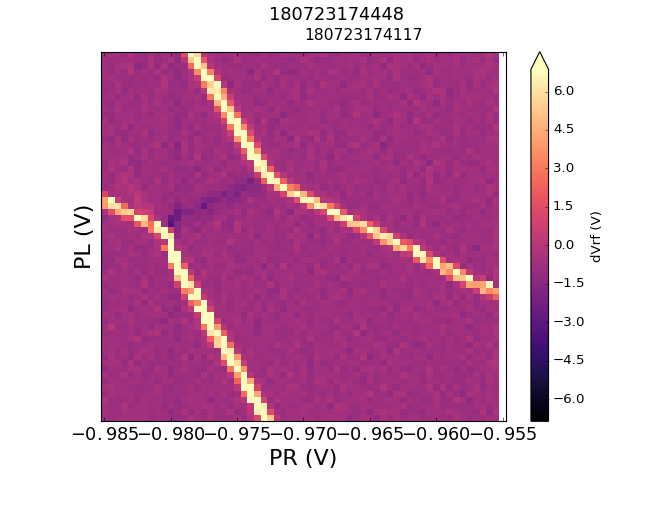

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # function evals   = 27
    # data points      = 21
    # variables        = 3
    chi-square         = 0.002
    reduced chi-square = 0.000
    Akaike info crit   = -188.405
    Bayesian info crit = -185.271
[[Variables]]
    decay_time:   2478.48405 +/- 248.1226 (10.01%) (init= 4000)
    offset:       0.69630420 +/- 0.007240 (1.04%) (init= 0.7705238)
    amp:          0.24040437 +/- 0.008392 (3.49%) (init= 0.24)
[[Correlations]] (unreported correlations are <  0.250)
    C(decay_time, offset)        = -0.880 
    C(offset, amp)               = -0.486 

[  2.47848406e+003   4.94065646e-324   9.88131292e-324] 826.161352798


In [362]:
# single block fit
temp_data = ex.load_data(h5files()[-1], load_now = True) #170404230959
#temp_data = ex.load_data(180625214043)
temp_data['hist'] = tk.hist(temp_data.Vrf, axis = -2) # range = (-0.010, 0.020)

# threshold_candits = np.linspace(0,0.02,51)
# dps = []
# for threshold in threshold_candits:
#     ps = 1. - tk.probability_lower(temp_data.Vrf, threshold, 'rec')   # when the T peak bins is negative
#     #ps = tk.probability_lower(temp_data.Vrf, threshold, 'rec')       # when the T peak bins is positive
#     dps.append(np.max(ps.values, axis = -1)-np.min(ps.values, axis = -1))

# best_candits = threshold_candits[np.argmax(dps, axis = -2)]
if True: #common threshold
    #thresholds = np.mean(best_candits)
    thresholds = -0.0014
else:
    print best_candits
    thresholds = np.stack([best_candits[idx[0]] for idx in np.ndindex(temp_data.Vrf.shape)])
    thresholds = thresholds.reshape(temp_data.Vrf.shape)

temp_data['ps'] = 1. - tk.probability_lower(temp_data.Vrf, thresholds, 'rec')    # when the T peak bins is negative
#temp_data['ps'] = tk.probability_lower(temp_data.Vrf, thresholds, 'rec')        # when the T peak bins is positive

print best_candits, np.max(temp_data['ps'].values, axis = -1)-np.min(temp_data['ps'].values, axis = -1)

temp_data['delta ps'] = temp_data['ps'].copy()
ps_avg = np.average(temp_data['ps'], axis = -1)
for idx in np.ndindex(ps_avg.shape):
    temp_data['delta ps'][idx] -= ps_avg[idx]

#tk.plot(temp_data, name='ps')
#tk.plot(temp_data['ps'][1])

tick_spacing = 0.2
## plt.autoscale(enable=True, axis='both', tight=None)
x = temp_data['dwell time'].values
y1 = temp_data['ps'][1].values
#print x,y1
aa = x[0]
bb = y1[0]
#print aa,bb

fig = plt.figure()
from lmfit import minimize, Parameters, Parameter, report_fit

def exp_decay(t, decay_time, offset, amp):
    bb == amp * np.exp(-aa/decay_time) + offset
    return amp * np.exp(-t/decay_time) + offset

def exp_decay_start_fixed(t, decay_time, start, amp):
    return amp * np.exp(-t/decay_time) + (start - amp)

indeces = [int(r*len(y1)) for r in (0., 0.1, 0.8, 0.9)]
#amp = np.mean(y1[indeces[0]:indeces[1]]) - np.mean(y1[indeces[2]:indeces[3]])
amp = 0.24

nn = len(temp_data['block'])
nums = np.arange(0,len(temp_data['block']),1)
para_store = np.empty(nn)


x = temp_data['dwell time'].values
y1 = temp_data['ps'][1].values
model  = lmfit.Model(exp_decay, independent_vars=['t'])
result = model.fit(y1, t = x,
                   decay_time = lmfit.Parameter(value = 0.5*max(x)),
                   offset     = lmfit.Parameter(value = np.mean(y1)),
                   amp     = lmfit.Parameter(value = amp),                  
                   )
decay_time, offset, amp = (result.best_values[key] for key in model.param_names)
para_store[0] = decay_time

print(result.fit_report(min_correl=0.25))
plt.plot(x, y1, 'o', color = 'skyblue',markersize=10)
plt.plot(x, result.best_fit, color = 'dodgerblue')

plt.xlabel('t (ns)', size = 20)
plt.ylabel('Ps', size = 20)
#plt.xlim((0.0,2.0))
#plt.ylim((0.4,0.85))
plt.autoscale(enable=False, axis='both', tight=None)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02))

plt.show()
plt.xticks(fontsize=16, rotation=0)

plt.yticks(np.arange(0.5, 1.01, 0.1),fontsize=16, rotation=0)
fig.text(0.45,0.95,temp_data.attrs['filename'], size =14)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout(pad=2.0, w_pad=0.9, h_pad=0.9)
##
print para_store, np.average(para_store,axis = 0)

In [410]:
ee = np.linspace(0., 10, 11)
ee[1:]

array([  1.,   2.,   3.,   4.,   5.,   6.,   7.,   8.,   9.,  10.])

## Fit of Averaged Ps

In [379]:
#### Multi-blocks  with Average fitting
import matplotlib.ticker as ticker

temp_data = ex.load_data(h5files()[-1], load_now = True)

#temp_data = ex.load_data(180521164710, load_now = True) #170404230959

#range_array = [(0.004, 0.012),(0.008, 0.018)][1]
range_array = (-0.050, 0.050)
temp_data['hist'] = tk.hist(temp_data.Vrf, axis = -2, range = range_array)

threshold_candits = np.linspace(0,0.02,51)
dps = []
xlabel = '%s'%(temp_data.dims.keys()[-2])

# for threshold in threshold_candits:
#     #ps = 1. - tk.probability_lower(temp_data.Vrf, threshold, 'rec')   # when the T peak bins is negative
#     ps = tk.probability_lower(temp_data.Vrf, threshold, 'rec')       # when the T peak bins is positive
#     dps.append(np.max(ps.values, axis = -1)-np.min(ps.values, axis = -1))

#best_candits = threshold_candits[np.argmax(dps, axis = -2)]
if True: #common threshold
    #thresholds = np.mean(best_candits)
    thresholds = 0.0014 #-0.018
    sta = 0
    
    #thresholds = 0.0125
else:
    print best_candits
    thresholds = np.stack([best_candits[idx[0]] for idx in np.ndindex(temp_data.Vrf.shape)])
    thresholds = thresholds.reshape(temp_data.Vrf.shape)

#temp_data['ps'] = 1. - tk.probability_lower(temp_data.Vrf, thresholds, 'rec')    # when the T peak bins is negative
temp_data['ps'] = tk.probability_lower(temp_data.Vrf, thresholds, 'rec')        # when the T peak bins is positive

#print best_candits, np.max(temp_data['ps'].values, axis = -1)-np.min(temp_data['ps'].values, axis = -1)

temp_data['delta ps'] = temp_data['ps'].copy()
ps_avg = np.average(temp_data['ps'], axis = -1)
for idx in np.ndindex(ps_avg.shape):
    temp_data['delta ps'][idx] -= ps_avg[idx]

#tk.plot(temp_data, name='ps')
#tk.plot(temp_data['ps'][1])

tick_spacing = 0.2
## plt.autoscale(enable=True, axis='both', tight=None)
x = temp_data[xlabel].values
y1 = temp_data['ps'][-1].values
#print x,y1
aa = x[0]
bb = y1[0]
#print aa,bb

fig, ax = plt.subplots(figsize = (6,5))
from lmfit import minimize, Parameters, Parameter, report_fit

def exp_decay(t, decay_time, offset, amp):
    #bb == amp * np.exp(-aa/decay_time) + offset
    return amp * np.exp(-t/decay_time) + offset

def exp_decay_start_fixed(t, decay_time, start, amp):
    return amp * np.exp(-t/decay_time) + (start - amp)

indeces = [int(r*len(y1)) for r in (0., 0.1, 0.8, 0.9)]
#amp = np.mean(y1[indeces[0]:indeces[1]]) - np.mean(y1[indeces[2]:indeces[3]])
amp = 0.2

nn = len(temp_data['block']) # -1    # average over several blocks
mm = len(y1) -sta
nums = np.arange(0,nn,1)
para_store = np.empty(nn)
ps_blocks = np.empty([nn,mm])

for num in nums:
    x = temp_data[xlabel].values[sta:]
    y1 = temp_data['ps'][num].values[sta:]+0.2
    ps_blocks[num] = y1

y2 = [np.average(ps_blocks,axis = 0), ps_blocks[0]][0]   # np.average(ps_blocks,axis = 0)  # [0:14]   ps_blocks[1]   # np.average(ps_blocks,axis = 0) -------------------------

model  = lmfit.Model(exp_decay, independent_vars=['t'])
result = model.fit(y2, t = x,
               decay_time = lmfit.Parameter(value = 0.5*max(x)),
               offset     = lmfit.Parameter(value = np.mean(y1)),
               amp     = lmfit.Parameter(value = amp, max = 1.0))  # value = amp   ---------------------

decay_time, offset, signal = (result.best_values[key] for key in model.param_names)

print(result.fit_report(min_correl=0.25))

#y1 = temp_data['ps'][0].values
#plt.plot(x, result.best_fit, color = 'darkorange') # 'dodgerblue'  'midnightblue' darkturquoise

plt.plot(x, y2, 'o', color = 'skyblue', markersize=10)  # 'skyblue'
# plt.plot(x, result.best_fit, color = 'dodgerblue')
x_expanded = np.arange(x.min(), 1.*x.max(), np.abs(x[1]-x[0]))
plt.plot(x, model.func(x, **result.best_values), linewidth = 1,color = 'dodgerblue')  ## fitting curve , 'dodgerblue'

plt.xlabel('%s (%s)'%(xlabel,'ns' ), size = 16, family = 'Times New Roman')  #temp_data[xlabel].attrs['units']
#plt.xlabel('%s'%('time (us)'), size = 20, family = 'Times New Roman')  #temp_data.dims.keys()[-2]
plt.ylabel('Ps', size = 16, family = 'Times New Roman')
plt.xticks(fontsize=16, rotation=0,family = 'Times New Roman')  #np.arange(0, 100, 20),
plt.yticks(fontsize=16, rotation=0,family = 'Times New Roman') #plt.yticks(np.arange(0.5, 1.01, 0.1), fontsize=16, rotation=0)

#fig.text(0,0.01,d.attrs['filename'])
#plt.xlim((0.0,2.0))
plt.ylim((0.45, 1.0))
#plt.autoscale(enable=False, axis='both', tight=None)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02))

#ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/1000))
#ax.xaxis.set_major_formatter(ticks_x)

plt.show()
fig.text(0.45,0.95,temp_data.attrs['filename'], size =14)
fig.text(0.7,0.2,'decay time %.3f'%(decay_time), size =10)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout(pad=2.0, w_pad=0.9, h_pad=0.9)
##
print para_store

KeyboardInterrupt: 

In [482]:
temp_data[xlabel]

<xarray.DataArray u'detu_PR' (detu_PR: 81)>
array([ 0. ,  0.2,  0.4,  0.6,  0.8,  1. ,  1.2,  1.4,  1.6,  1.8,  2. ,  2.2,
        2.4,  2.6,  2.8,  3. ,  3.2,  3.4,  3.6,  3.8,  4. ,  4.2,  4.4,  4.6,
        4.8,  5. ,  5.2,  5.4,  5.6,  5.8,  6. ,  6.2,  6.4,  6.6,  6.8,  7. ,
        7.2,  7.4,  7.6,  7.8,  8. ,  8.2,  8.4,  8.6,  8.8,  9. ,  9.2,  9.4,
        9.6,  9.8, 10. , 10.2, 10.4, 10.6, 10.8, 11. , 11.2, 11.4, 11.6, 11.8,
       12. , 12.2, 12.4, 12.6, 12.8, 13. , 13.2, 13.4, 13.6, 13.8, 14. , 14.2,
       14.4, 14.6, 14.8, 15. , 15.2, 15.4, 15.6, 15.8, 16. ])
Coordinates:
  * detu_PR  (detu_PR) float64 0.0 0.2 0.4 0.6 0.8 ... 15.2 15.4 15.6 15.8 16.0
Attributes:
    units:    mV

In [479]:
#temp_data.detu_PR.attrs['units']
temp_data.dims.keys()[-2]

u'detu_PR'

In [263]:
temp_data.dims.keys()

[u'block', u'dwell time', u'rec']

<IPython.core.display.Javascript object>


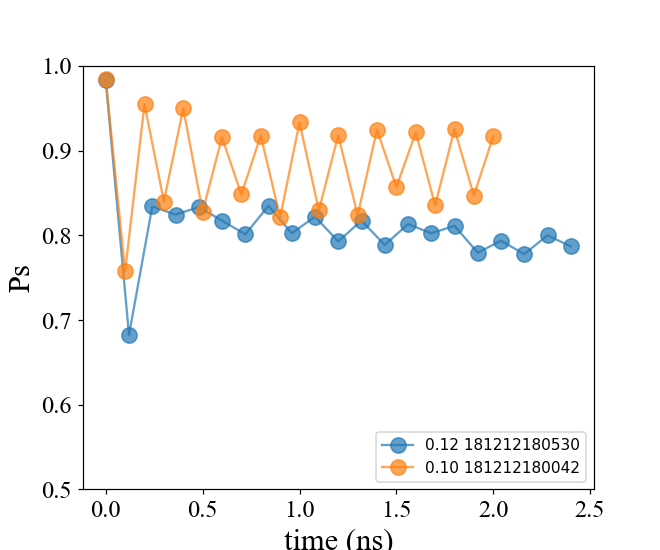

In [284]:
fig, ax = plt.subplots(figsize = (6,5))
for na in [1,3]:
    temp_data = ex.load_data(h5files()[-na], load_now = True)
    xlabel = '%s'%(temp_data.dims.keys()[-2]) # dwell time
    thresholds = 0.0048
    temp_data['ps'] = tk.probability_lower(temp_data.Vrf, thresholds, 'rec') 
    x = temp_data[xlabel].values
    y_ave = np.average(temp_data['ps'], axis = 0) # blocks
    
    plt.plot(x, y_ave, '-o', color = cm.get_cmap('tab10')((na-1)/11.), #mfc ='w',
             markersize=10, alpha =0.7, label = '%.2f %s'%(x[1],temp_data.attrs['filename'])) 
    plt.xlabel('%s'%('time (ns)'), size = 20, family = 'Times New Roman')  #temp_data.dims.keys()[-2]
    plt.ylabel('Ps', size = 20, family = 'Times New Roman')
    plt.xticks(fontsize=16, rotation=0,family = 'Times New Roman')  #np.arange(0, 100, 20),
    plt.yticks(fontsize=16, rotation=0,family = 'Times New Roman') #plt.yticks(np.arange(0.5, 1.01, 0.1), fontsize=16, rotation=0)
    plt.ylim((0.5, 1.0))
    plt.legend(loc = 4)


In [375]:
ps_blocks

array([[ 0.89399999,  0.84100002,  0.77200001,  0.741     ,  0.73500001,
         0.67699999,  0.65700001,  0.63100004,  0.62599999,  0.602     ,
         0.59099996,  0.62199998,  0.58000004,  0.57700002,  0.57099998,
         0.537     ,  0.57099998,  0.55299997,  0.56099999,  0.565     ,
         0.55400002],
       [ 0.88700002,  0.83700001,  0.792     ,  0.77200001,  0.69200003,
         0.713     ,  0.68700004,  0.667     ,  0.616     ,  0.63100004,
         0.63300002,  0.59599996,  0.59000003,  0.59899998,  0.588     ,
         0.57700002,  0.574     ,  0.55799997,  0.57499999,  0.54299998,
         0.574     ]])

In [214]:
# def count_high(arr, thres, dim):
#     b = 0.
#     for a in arr:
#         b += 1 if a>= thres else 0
#     return b

def count_high(arr, thres, dim):

    return np.sum(arr >= thres, axis = dim)

test1 = np. array([[1,1,1,1],
                  [1,1.,0,0],
                  [1,1,0,0],
                  [1,1,0,0]])

count_high(test1, 0.7, 0)
        

array([4, 4, 1, 1])

## Calculate Ps in array

In [603]:
# single block fit
index_arr = np.arange(1,42)[::-1]
evol_t = np.linspace(0,200,51)
RAP_t = np.linspace(0,120,41)
PS_1arr,PS_2arr,PS_3arr = np.empty([len(RAP_t),len(evol_t)]),np.empty([len(RAP_t),len(evol_t)]),np.empty([len(RAP_t),len(evol_t)])
total_n = len(index_arr)

for index in index_arr:
    temp_data = ex.load_data(h5files()[-index], load_now = True) #170404230959
    #temp_data = ex.load_data(171102170304, load_now = True)
    temp_data['hist'] = tk.hist(temp_data.Vrf, axis = -2) # range = (-0.010, 0.020)

#     threshold_candits = np.linspace(0,0.02,51)
#     dps = []
#     for threshold in threshold_candits:
#         ps = 1. - tk.probability_lower(temp_data.Vrf, threshold, 'rec')   # when the T peak bins is negative
#         #ps = tk.probability_lower(temp_data.Vrf, threshold, 'rec')       # when the T peak bins is positive
#         dps.append(np.max(ps.values, axis = -1)-np.min(ps.values, axis = -1))

#     best_candits = threshold_candits[np.argmax(dps, axis = -2)]
    if True: #common threshold
        #thresholds = np.mean(best_candits)
        thresholds = -0.0015
    else:
        print best_candits
        thresholds = np.stack([best_candits[idx[0]] for idx in np.ndindex(temp_data.Vrf.shape)])
        thresholds = thresholds.reshape(temp_data.Vrf.shape)

    temp_data['ps'] = 1. - tk.probability_lower(temp_data.Vrf, thresholds, 'rec')    # when the T peak bins is negative
    #temp_data['ps'] = tk.probability_lower(temp_data.Vrf, thresholds, 'rec')        # when the T peak bins is positive
    
    #block_n = 0
    PS_1arr[index-1, :] = temp_data['ps'][0].values
    PS_2arr[index-1, :] = temp_data['ps'][1].values
    PS_3arr[index-1, :] = temp_data['ps'][2].values
    

# fig, ax = plt.subplots(figsize = (6,6))

# ax.imshow(PS_arr, cmap= 'plasma', vmin=0., vmax=1.)  #rel_array, 'o',mfc = 'w',mew = 2,mec = 'darkblue', ms = 10)
# #ax.plot(x, y1, 'o', mfc='none', markersize=10)

# plt.xlabel('detuning (meV)', size = 16,fontname = 'Times New Roman')
# plt.ylabel('Relaxation (ns)', size = 16,fontname = 'Times New Roman')
# #plt.xlim((0.0,2.0))
# #plt.ylim((0.4,0.9))
# #plt.yscale('log')
# plt.autoscale(enable=False, axis='both', tight=None)
# #fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
# #plt.yticks(np.arange(min(y), max(y)+0.01, 0.02))

# plt.show()

# fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

<IPython.core.display.Javascript object>


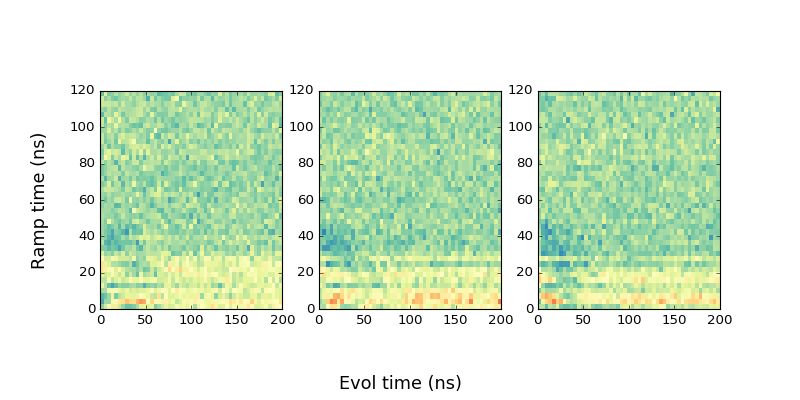

In [608]:
fig, axarr = plt.subplots(1,3,figsize=(10,5))

ax1 = axarr[0].imshow(PS_1arr, cmap= 'Spectral',interpolation = 'None', aspect =2,vmin= 0.5, vmax=1.0,extent= [0,200,0,120])  #rel_array, 'o',mfc = 'w',mew = 2,mec = 'darkblue', ms = 10)
#ax.plot(x, y1, 'o', mfc='none', markersize=10)
axarr[1].imshow(PS_2arr, cmap= 'Spectral',interpolation = 'None', aspect =2,vmin= 0.5, vmax=1.0,extent= [0,200,0,120])
ax3 = axarr[2].imshow(PS_3arr, cmap= 'Spectral',interpolation = 'None',aspect =2, vmin= 0.5, vmax=1.0,extent= [0,200,0,120])


fig.text(0.5,0.04, "Evol time (ns)",size =16, ha="center", va="center")
fig.text(0.05,0.5, "Ramp time (ns)",size =16, ha="center", va="center", rotation=90)
#plt.xlabel('evol t (ns)', size = 16,fontname = 'Times New Roman')
#plt.ylabel('RAP t (ns)', size = 16,fontname = 'Times New Roman')
#plt.xlim((0.0,2.0))
#plt.ylim((0.4,0.9))
#plt.yscale('log')
#plt.autoscale(enable=False, axis='both', tight=None)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02))

#plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
#cax = plt.axes([0.85, 0.1, 0.075, 0.8])
#plt.colorbar(ax1,axarr[2])

#plt.colorbar(ax1)
plt.show()

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w'); #plt.tight_layout()

<IPython.core.display.Javascript object>


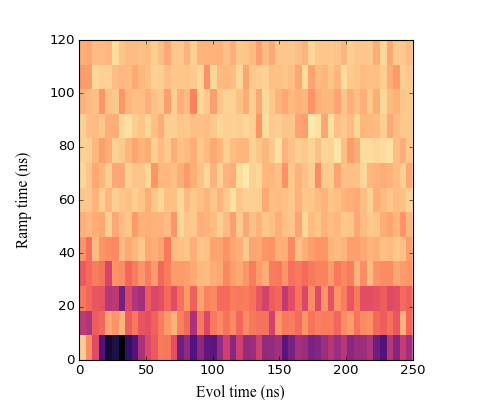

In [602]:
fig, ax = plt.subplots(figsize=(6,5))

#ax1 = axarr[0].imshow(PS_1arr, cmap= 'Spectral',interpolation = 'None', aspect ='equal',vmin= 0.5, vmax=1.0,extent= [0,250,0,300])  #rel_array, 'o',mfc = 'w',mew = 2,mec = 'darkblue', ms = 10)
#ax.plot(x, y1, 'o', mfc='none', markersize=10)
#axarr[1].imshow(PS_2arr, cmap= 'Spectral',interpolation = 'None', vmin= 0.5, vmax=1.0,extent= [0,250,0,300])
ax3 = ax.imshow(PS_3arr[18:31,:], cmap= 'magma',interpolation = 'None',aspect=2, vmin= 0.5, vmax=1.0,extent= [0,250,0,120])


fig.text(0.5,0.02, "Evol time (ns)",size =14, ha="center", va="center",fontname = 'Times New Roman')
fig.text(0.05,0.5, "Ramp time (ns)",size =14, ha="center", va="center", rotation=90,fontname = 'Times New Roman')
#plt.xlabel('evol t (ns)', size = 16,fontname = 'Times New Roman')
#plt.ylabel('RAP t (ns)', size = 16,fontname = 'Times New Roman')
#plt.xlim((0.0,2.0))
#plt.ylim((0.4,0.9))
#plt.yscale('log')
#plt.autoscale(enable=False, axis='both', tight=None)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02))

#plt.subplots_adjust(bottom=0.1, right=0.8, top=0.9)
#cax = plt.axes([0.85, 0.1, 0.075, 0.8])
#plt.colorbar(ax1,axarr[2])

#plt.colorbar(ax1)
plt.show()

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w'); #plt.tight_layout()

In [448]:
index_arr = np.arange(0,31)
evol_t = np.linspace(0,250,51)
RAP_t = np.linspace(0,300,31)
PS_arr = np.empty([len(RAP_t),len(evol_t)])
print PS_arr.shape

(31L, 51L)


In [55]:
#np.arange(5)[::-1]
np.arange(1,16)

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15])

## Fits PS loops

In [68]:
####  Average fitting of Multi-blocks  with diffrent magnetic fields

#temp_data = ex.load_data(h5files()[-2], load_now = True) #170404230959
#filenames = [170724142000,170724151428,170724153035,170724154403]   ## CL = -1.12V
#filenames = [170725141152,170725143007,170725150128,170725151456]    #  CL = -1.10V
#filenames = [170725173646,170725175727,170725180958,170725183132]    #  CL = -1.08V
#filenames = [170725205611,170725210829,170725211935,170725213332]    #  CL = -1.06V

#filenames = [170816153353,170816154534,170816161422,170816162146]    #  CL = -1.10V after changeto AWG7122C

indexs =  np.flipud(np.arange(1,41+1))  # np.arange(1,n) = [1,2,.. n-1 ]    to specify the filenames from last
#indexs =  np.arange(0,17)
total_num = indexs[0]
init_num = 0
ahead_num = 0                        # how many files are after the series
#indexs = np.arange([0,1,2,3])
#plt.figure(figsize=(10, 8))
n_rows, n_cols = 6, 7
fig, axarr = plt.subplots(n_rows, n_cols,figsize=(13,13))    # subplots(nrows, ncols, sharex=False, sharey=False, squeeze=True, subplot_kw=None, gridspec_kw=None, **fig_kw)
#f = [[],[],[],[]]
cmap = plt.cm.plasma
para_store2 = np.empty(total_num-init_num)
## new arrays to store all the calculated Ps and fittings
data_test1 = ex.load_data(h5files()[-(total_num+ahead_num)], load_now = True)

evol_points = 31 #len(data_test1['dwell time'])
Ps_ave_array = np.empty([total_num-init_num,evol_points])
Ps_fit_array = np.empty([total_num-init_num,evol_points])
name_array = np.empty(total_num-init_num, dtype = 'S14')
stderr_array = np.empty(total_num-init_num)
field_array = np.empty(total_num-init_num)

vec0, PR_array = np.array([-0.0020, -0.0020]),  np.linspace(0.00, 0.016, 41)
slope_vec = np.array([1, -1.50])*PR_array.reshape(len(PR_array),1)
Init_vec = vec0 + slope_vec

#Tran_vec = np.array([-0.0040, -0.0040]) + np.array([1., -1.50])*np.linspace(0.0, 0.020, 51).reshape(51,1)


for index in indexs:
    fn = (index+ahead_num)
    temp = ex.load_data(h5files()[-1])
    #temp['hist'] = tk.hist(temp_data.Vrf, axis = -2, range = (-0.01, 0.01))
    temp_data = temp['Vrf'][-index,:,:,:]
    #temp_data = ex.load_data(h5files()[- fn], load_now = True)     # - (4*(index+ahead_num)-3)
    #temp_data['hist'] = tk.hist(temp_data.Vrf, axis = -2, range = (-0.01, 0.01))

    threshold_candits = np.linspace(0,-0.01,51)
    dps = []
#     for threshold in threshold_candits:
#         #ps = 1. - tk.probability_lower(temp_data.Vrf, threshold, 'rec')   # when the T peak bins is negative
#         ps = tk.probability_lower(temp_data.Vrf, threshold, 'rec')       # when the T peak bins is positive
#         dps.append(np.max(ps.values, axis = -1)- np.min(ps.values, axis = -1))

#    best_candits = threshold_candits[np.argmax(dps, axis = -2)]
    if True: #common threshold
        #thresholds = np.mean(best_candits)
        thresholds =  0.0035  #+ 0.00003*(total_num -index)
    else:
        print best_candits
        thresholds = np.stack([best_candits[idx[0]] for idx in np.ndindex(temp_data.Vrf.shape)])
        thresholds = thresholds.reshape(temp_data.Vrf.shape)

    #temp_data['ps'] = 1. - tk.probability_lower(temp_data.Vrf, thresholds, 'rec')    # when the T peak bins is negative
    temp_data['ps'] = tk.probability_lower(temp_data, thresholds, 'rec')        # when the T peak bins is positive

    print best_candits, np.max(temp_data['ps'].values, axis = -1)-np.min(temp_data['ps'].values, axis = -1)," %d PS" %(total_num-index)

    temp_data['delta ps'] = temp_data['ps'].copy()
    ps_avg = np.average(temp_data['ps'], axis = -1)
    for idx in np.ndindex(ps_avg.shape):
        temp_data['delta ps'][idx] -= ps_avg[idx]

    #tk.plot(temp_data, name='ps')
    #tk.plot(temp_data['ps'][1])

    tick_spacing = 0.2
    ## plt.autoscale(enable=True, axis='both', tight=None)
    x = temp_data['dwell time'].values
    y1 = temp_data['ps'][-1].values
    #print x,y1
    aa = x[0]
    bb = y1[0]
    #print aa,bb

    # plt.figure(figsize = (5.5, 4))

    from lmfit import minimize, Parameters, Parameter, report_fit

    def exp_decay(t, decay_time, offset, amp):
        #bb == amp * np.exp(-aa/decay_time) + offset
        return amp * np.exp(-t/decay_time) + offset

    def exp_decay_start_fixed(t, decay_time, start, amp):
        return amp * np.exp(-t/decay_time) + (start - amp)

    indeces = [int(r*len(y1)) for r in (0., 0.1, 0.8, 0.9)]
    #amp = np.mean(y1[indeces[0]:indeces[1]]) - np.mean(y1[indeces[2]:indeces[3]])
    amp = 0.24

    nn = len(temp_data['block'])
    mm = len(y1)
    nums = np.arange(0,len(temp_data['block']),1)
    para_store = np.empty(nn)
    ps_blocks = np.empty([nn,mm])

    for num in nums:
        x = temp_data['dwell time'].values #/1000  # as 'us'
        y1 = temp_data['ps'][num].values
        ps_blocks[num] = y1

    y2 = np.average(ps_blocks,axis = 0) #np.average(ps_blocks,axis = 0),ps_blocks[1,:]   # averaged Ps(t) of 5 blocks
    jump = round(y2[0]- y2[1], 3 )
    y3 = y2 # + (0.9 - y2[0])
    
    model  = lmfit.Model(exp_decay, independent_vars=['t'])
    result = model.fit(y2, t = x,
                   decay_time = lmfit.Parameter(value = 0.5*max(x)),
                   offset     = lmfit.Parameter(value = np.mean(y1)),
                   amp     = lmfit.Parameter(value = amp))

    decay_time, offset, amp = (result.best_values[key] for key in model.param_names)
    
    #params =  { 'decay_time':decay_time, 'offset': offset, 'amp': amp}
    fitting_curve = model.func(x, **result.best_values)
    
    para_store2[total_num - index] = np.round(decay_time,2) 
    #Ps_ave_array[total_num-index,:] = y3
    #Ps_fit_array[total_num-index,:] = fitting_curve
    name_array[total_num-index] = temp.attrs['filename']   #  temp_data.attrs
    stderr_array[total_num-index] = np.round(result.params['decay_time'].stderr,3)
    field_array[total_num-index] = 1.1 - index/10.0
    #name_array.astype(numpy.int64)
    #print(result.fit_report(min_correl=0.25))
    #plt.plot(x, result.best_fit, color = 'darkorange') # 'dodgerblue'  'midnightblue' darkturquoise
    #plt.errorbar(x, y2, yerr= np.std(ps_blocks, axis = 0), fmt = 'o', markersize = 8, markerfacecolor='none') # color = 'skyblue',

    x_expanded = np.linspace(0, 50, 51) 
    colors = ['C0','C1','C2','C4','C5','C6','C7','C8']
    #ax1 = fig.add_subplot(221)
    
    xx = (total_num - index)//n_cols
    yy = (total_num - index)% n_cols
    
    #axarr[0, 0].plot(x, y)
    color_n = (total_num - index)/(total_num*1.0)      # (total_num - index)/(total_num*1.5)+0.2
    f1, = axarr[xx, yy].plot(x, y3, 'o', markersize = 6,  color = cmap(color_n), alpha =0.5) # color =  'C0',  'skyblue',
    #plt.plot(x, result.best_fit, 's',markersize = 8, color = 'C0')                 # color = 'dodgerblue'
    #x_expanded = np.linspace(0, 50000, np.abs(x[1]-x[0]))       #x_expanded = np.arange(x.min(), 2.*x.max(), np.abs(x[1]-x[0]))
    axarr[xx, yy].plot(x, fitting_curve, linewidth = 1, color = cmap(color_n)) # 'C1'
   
    plt.xlabel('t (ns)', size = 14, fontname = 'Times New Roman') # style = 'italic'
    #plt.xlabel('(ns)', size = 20, fontname = 'Century')
    plt.ylabel('Ps', size = 14, fontname = 'Times New Roman')
    plt.sca(axarr[xx, yy])           ## plt.sca()  to set current axes of a subplot
    plt.xticks( fontsize=10, rotation=0, fontname = 'Times New Roman')
    plt.yticks(np.arange(0.5, 0.95, 0.1), fontsize=10, rotation=0, fontname = 'Times New Roman')

    axarr[xx, yy].text(0.3, 0.8, " %s\n Init_vec = \n%s" %(name_array[total_num-index],slope_vec[total_num-index]), 
                       fontsize = 10, fontname = 'Times New Roman',transform=axarr[xx, yy].transAxes)
    #axarr[xx, yy].set(title = temp_data.attrs['filename'])
    #plt.xlim((0,20))
    #plt.ylim((0.5,0.9))
    #plt.autoscale(enable = False, axis='both', tight = True)
    #fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
    #plt.yticks(np.arange(min(y), max(y)+0.01, 0.02)) [f1],
    #leg = axarr[xx, yy].legend( [f1],[" %d PS, jump=%s" %(total_num-index,jump)],prop={'size':8, 'family': 'Times New Roman'}, loc = 0)
    #leg.set_title('%s'%(temp_data.attrs['filename']),prop={'size':8, 'family': 'Times New Roman'})
    

#fig.text(0.45,0.95, 'CL = -1.10 V', size =14)
#leg = plt.legend([f[0], f[1], f[2],f[3]], [" 0 mV", "20mV", "30mV", "40mV"],prop={'size':14, 'family': 'Times New Roman'}, loc = 0)
#leg.set_title('Pulse Amp',prop={'size':14, 'family': 'Times New Roman'})

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w') #;plt.tight_layout(pad = 3.0, w_pad = 0.9, h_pad = 0.8)
fig.tight_layout()
#print para_store 
plt.show()

#print x
#print y2
print 'fitted_rel_time = np.',repr(para_store2), 
print 'fitted_rel_err = np.',repr(stderr_array) #fitting_curve

<IPython.core.display.Javascript object>

IndexError: index -41 is out of bounds for axis 0 with size 26

In [151]:
#print 'fitted_rel_time = np.',repr(para_store2), 
para_store2

array([ 5.97080000e+02,  6.31900000e+02,  2.86180000e+02,  1.61280000e+02,
        1.76430000e+02,  2.15810000e+02,  2.66580000e+02,  1.35860000e+02,
        8.76200000e+01,  2.73440000e+02,  6.46700000e+01,  7.79800000e+01,
        5.77000000e+01,  5.86700000e+01,  6.21800000e+01,  7.00100000e+01,
        5.60900000e+01,  7.60300000e+01,  5.48300000e+01,  4.60400000e+01,
        5.03900000e+01,  4.14300000e+01,  5.60500000e+01,  6.78300000e+01,
        4.67600000e+01,  3.67700000e+01,  2.31400000e+01,  3.25000000e+01,
        2.47300000e+01,  2.00500000e+01,  2.40900000e+01,  2.46900000e+01,
        1.32600000e+01,  2.21400000e+01,  2.14900000e+01,  1.73900000e+01,
        2.24200000e+01,  1.62300000e+01,  1.48100000e+01,  1.43600000e+01,
       -2.16513233e+07])

In [60]:
temp = ex.load_data(h5files()[-1])
#temp['hist'] = tk.hist(temp_data.Vrf, axis = -2, range = (-0.01, 0.01))
temp_data = temp.Vrf[-1,:,:,:]
print temp_data

<xarray.DataArray 'Vrf' (block: 3, rec: 800, dwell time: 41)>
array([[[ 3.565430e-04, -5.647852e-04, ...,  4.373633e-04, -3.819141e-04],
        [-1.283008e-04,  3.034180e-04, ...,  7.574941e-03,  7.180840e-03],
        ...,
        [-4.135156e-04, -5.472461e-04, ..., -3.494336e-04,  7.657578e-03],
        [ 3.992383e-04,  3.983594e-04, ...,  7.206270e-03,  7.448340e-03]],

       [[ 7.095703e-05, -1.477344e-04, ..., -5.278125e-04,  6.859199e-03],
        [ 1.681250e-04,  6.826406e-03, ...,  7.070664e-03,  7.399648e-03],
        ...,
        [ 1.153711e-04, -4.092773e-04, ...,  7.619355e-03,  7.242188e-05],
        [-1.849609e-05,  7.240684e-03, ...,  5.088047e-03,  7.645098e-03]],

       [[ 3.303516e-04, -8.802734e-05, ...,  2.427148e-04,  1.189844e-03],
        [ 6.378711e-04,  7.832031e-06, ..., -5.108008e-04,  1.256680e-03],
        ...,
        [-2.355859e-04, -2.715039e-04, ...,  7.024942e-03,  6.785625e-03],
        [-2.463281e-04, -4.617578e-04, ..., -3.050977e-04,  7.081582e-

In [137]:
temp_data['ps'][-1]

<xarray.DataArray 'ps' (dwell time: 51)>
array([0.80125, 0.49625, 0.40875, 0.35875, 0.33375, 0.34625, 0.30625, 0.3525 ,
       0.33875, 0.305  , 0.33125, 0.32125, 0.32125, 0.30125, 0.29625, 0.30875,
       0.33125, 0.3025 , 0.31125, 0.3325 , 0.3525 , 0.3125 , 0.30875, 0.31   ,
       0.32   , 0.295  , 0.33125, 0.32875, 0.30125, 0.31125, 0.3175 , 0.29875,
       0.30125, 0.32625, 0.31875, 0.32625, 0.33875, 0.31   , 0.3225 , 0.31   ,
       0.3175 , 0.31375, 0.2825 , 0.32375, 0.315  , 0.3    , 0.3375 , 0.32125,
       0.30375, 0.33375, 0.315  ], dtype=float32)
Coordinates:
    det_PR      float64 16.0
    block       int32 1
  * dwell time  (dwell time) float64 0.0 24.0 48.0 ... 1.176e+03 1.2e+03
    ps          (dwell time) float32 0.80125 0.49625 0.40875 ... 0.33375 0.315
    delta ps    (dwell time) float32 0.4677206 0.16272062 ... -0.018529385

<IPython.core.display.Javascript object>


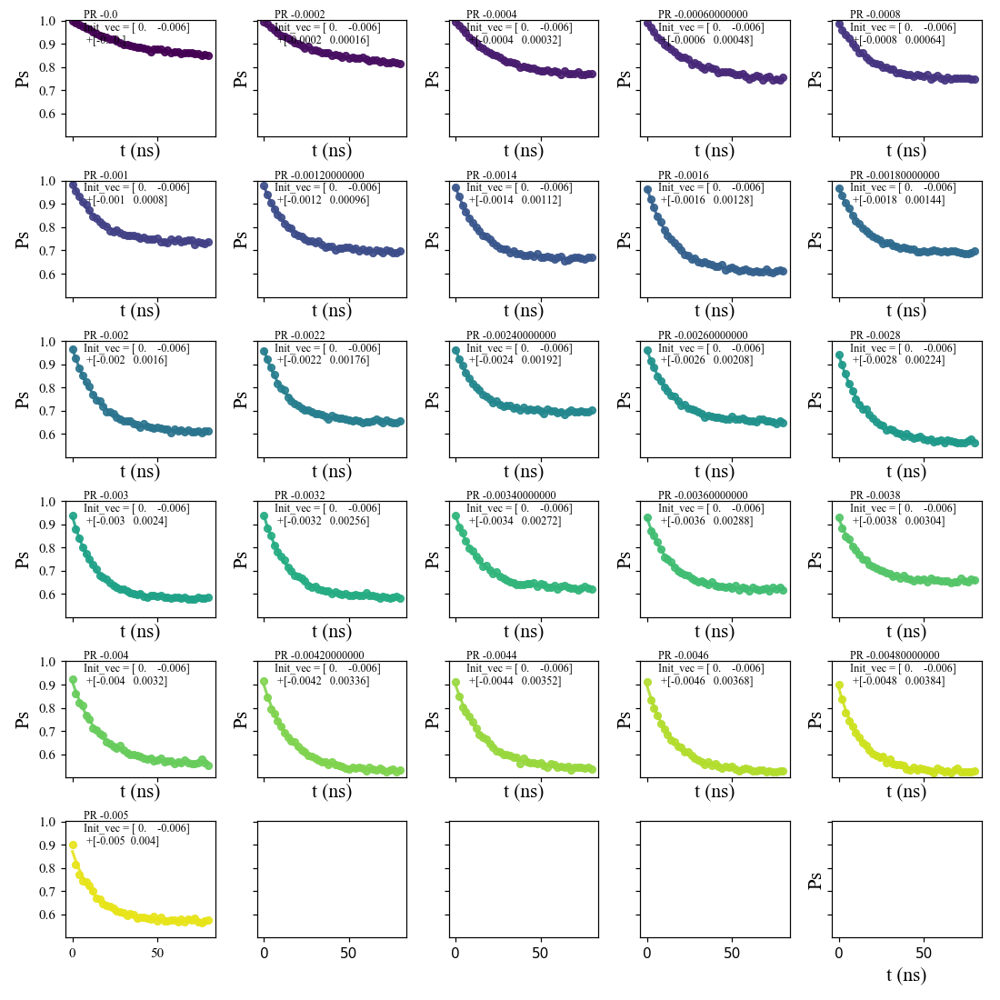

190111212124 ,
fitted_rel_time = np. array([31.548, 28.248, 23.177, 23.201, 17.584, 15.412, 14.752, 14.629,
       14.882, 14.638, 15.373, 13.639, 12.838, 14.435, 15.24 , 13.288,
       14.294, 14.459, 14.053, 13.904, 15.77 , 15.343, 16.319, 14.668,
       13.168, 13.256])
fitted_rel_err = np. array([1.412, 0.897, 0.551, 0.817, 0.444, 0.461, 0.369, 0.307, 0.264,
       0.272, 0.298, 0.295, 0.316, 0.336, 0.327, 0.189, 0.268, 0.388,
       0.373, 0.382, 0.437, 0.366, 0.46 , 0.354, 0.343, 0.546])


In [138]:
#Ps array fitting plotted individually as below, following 'Single trace' chapter of ps calculation



#temp_data = ex.load_data(h5files()[-2], load_now = True) #170404230959
#filenames = [170724142000,170724151428,170724153035,170724154403]   ## CL = -1.12V
#filenames = [170725141152,170725143007,170725150128,170725151456]    #  CL = -1.10V
#filenames = [170725173646,170725175727,170725180958,170725183132]    #  CL = -1.08V
#filenames = [170725205611,170725210829,170725211935,170725213332]    #  CL = -1.06V

#filenames = [170816153353,170816154534,170816161422,170816162146]    #  CL = -1.10V after change to AWG7122C

PR_array = temp_data['det_PR'].values*0.001  # mV to V
indexs =  np.flipud(np.arange(1,len(PR_array)+1) )    # np.arange(1,n) = [1,2,.. n-1 ]    to specify the filenames from last
#indexs = np.array([10,9,8,7,6,5,4,3,2,1])
total_num = indexs[0]
init_num = 0
ahead_num = 0                        # how many files are after the series
#indexs = np.arange([0,1,2,3])
#plt.figure(figsize=(10, 8))
n_rows, n_cols = 6,5 #4, 7
fig, axarr = plt.subplots(n_rows, n_cols,figsize=(10,10),sharex=True, sharey=True)  #14,10 dpi=300  # subplots(nrows, ncols, sharex=False, sharey=False, squeeze=True, subplot_kw=None, gridspec_kw=None, **fig_kw)
#f = [[],[],[],[]]
cmap = plt.cm.viridis #plasma
para_store2 = np.empty(total_num-init_num)
## new arrays to store all the calculated Ps and fittings
#data_test1 = ex.load_data(h5files()[-(total_num+ahead_num)], load_now = True)
evol_points = len(temp_data['dwell time'])
Ps_ave_array = np.empty([total_num-init_num,evol_points])
Ps_fit_array = np.empty([total_num-init_num,evol_points])
name_array = np.empty(total_num-init_num, dtype = 'S14')
stderr_array = np.empty(total_num-init_num)
#PR_array = np.empty(total_num-init_num)

vec0, slope_vec = np.array([0.00,-0.006]), np.array([-1.0, 0.8])
slope_array = slope_vec * PR_array.reshape(len(PR_array),1) # which is Init_vec in pulse
Initvec_array = vec0 + slope_array

#temp_data = ex.load_data(h5files()[- 1], load_now = True)     # - (4*(index+ahead_num)-3)
#temp_data['hist'] = tk.hist(temp_data.Vrf, axis = -2, range = (-0.008, 0.004))

for index in indexs:
    #fn = (index+ahead_num)

#     threshold_candits = np.linspace(0,-0.01,51)
#     dps = []
#     for threshold in threshold_candits:
#         ps = 1. - tk.probability_lower(temp_data.Vrf, threshold, 'rec')   # when the T peak bins is negative
#         ps = tk.probability_lower(temp_data.Vrf, threshold, 'rec')       # when the T peak bins is positive
#         dps.append(np.max(ps.values, axis = -1)- np.min(ps.values, axis = -1))

#     best_candits = threshold_candits[np.argmax(dps, axis = -2)]
    if True: #common threshold
        #thresholds = np.mean(best_candits)
        thresholds =  -0.018  #+ 0.00003*(total_num -index)
    else:
        print best_candits
        thresholds = np.stack([best_candits[idx[0]] for idx in np.ndindex(temp_data.Vrf.shape)])
        thresholds = thresholds.reshape(temp_data.Vrf.shape)

    #temp_data['ps'] = 1. - tk.probability_lower(temp_data.Vrf, thresholds, 'rec')    # when the T peak bins is negative
    #temp_data['ps'] = tk.probability_lower(temp_data.Vrf, thresholds, 'rec')        # when the T peak bins is positive

    #print best_candits, np.max(temp_data['ps'].values, axis = -1)-np.min(temp_data['ps'].values, axis = -1)," %d PS" %(total_num-index)


    #tk.plot(temp_data, name='ps')
    #tk.plot(temp_data['ps'][1])

    tick_spacing = 0.2
    ## plt.autoscale(enable=True, axis='both', tight=None)
    x = temp_data['dwell time'].values
    y1 = temp_data['psave'].values[total_num-index]
    #print x,y1
    aa = x[0]
    bb = y1[0]
    #print aa,bb

    # plt.figure(figsize = (5.5, 4))

    from lmfit import minimize, Parameters, Parameter, report_fit

    def exp_decay(t, decay_time, offset, amp):
        #bb == amp * np.exp(-aa/decay_time) + offset
        return amp * np.exp(-t/decay_time) + offset

    def exp_decay_start_fixed(t, decay_time, start, amp):
        return amp * np.exp(-t/decay_time) + (start - amp)

    indeces = [int(r*len(y1)) for r in (0., 0.1, 0.8, 0.9)]
    #amp = np.mean(y1[indeces[0]:indeces[1]]) - np.mean(y1[indeces[2]:indeces[3]])
    amp = 0.2

    #nn = len(temp_data['block'])
    #mm = len(y1)
    #nums = np.arange(0,len(temp_data['block']),1)
    #para_store = np.empty(nn)
    #ps_blocks = np.empty([nn,mm])
    # for num in nums:
    #     x = temp_data['dwell time'].values
    #     y1 = temp_data['ps'][num].values
    #     model  = lmfit.Model(exp_decay_start_fixed, independent_vars=['t'])
    #     result = model.fit(y1, t = x,
    #                    decay_time = lmfit.Parameter(value = 0.5*max(x)),
    #                    start     = lmfit.Parameter(value = y1[0], vary = False),
    #                    amp     = lmfit.Parameter(value = amp),                  
    #                    )
    #     decay_time, start, signal = (result.best_values[key] for key in model.param_names)
    #     para_store[num] = decay_time
#     for num in nums:
#         x = temp_data['dwell time'].values #/1000  # as 'us'
#         y1 = temp_data['ps'][num].values
#         ps_blocks[num] = y1

#    y2 =y1  # averaged Ps(t) of 5 blocks
#    jump = round(y2[0]- y2[1], 3 )
#    y3 = y2 # + (0.9 - y2[0])
    
    model  = lmfit.Model(exp_decay, independent_vars=['t'])
    result = model.fit(y1[0:], t = x[0:],
                   decay_time = lmfit.Parameter(value = 0.5*max(x),), # min = 1.6,max =8.
                   offset     = lmfit.Parameter(value = np.mean(y1)),
                   amp     = lmfit.Parameter(value = amp))

    decay_time, offset, amp = (result.best_values[key] for key in model.param_names)
    
    #params =  { 'decay_time':decay_time, 'offset': offset, 'amp': amp}
    fitting_curve = model.func(x, **result.best_values)
    
    para_store2[total_num - index] = round(decay_time,3) 
    #Ps_ave_array[total_num-index,:] = y3
    #Ps_fit_array[total_num-index,:] = fitting_curve
    name_array[total_num-index] = PR_array[total_num - index] * -1.0
    stderr_array[total_num-index] = round(result.params['decay_time'].stderr,3)
    #PR_array[total_num-index] = temp_data.psave['det_PR'].values[total_num - index]
    #name_array.astype(numpy.int64)
    #print(result.fit_report(min_correl=0.25))
    #plt.plot(x, result.best_fit, color = 'darkorange') # 'dodgerblue'  'midnightblue' darkturquoise
    #plt.errorbar(x, y2, yerr= np.std(ps_blocks, axis = 0), fmt = 'o', markersize = 8, markerfacecolor='none') # color = 'skyblue',

    x_expanded = np.linspace(0, 10, 51)
    #colors = ['C0','C1','C2','C4','C5','C6','C7','C8']
    #ax1 = fig.add_subplot(221)
    
    xx = (total_num - index)//n_cols
    yy = (total_num - index)% n_cols
    
    #axarr[0, 0].plot(x, y)
    color_n = (total_num - index)/(total_num*1.0)      # (total_num - index)/(total_num*1.5)+0.2
    #f1, = axarr.plot(x, y1, 'o', markersize = 5,  alpha = 0.9, color = cmap(color_n)  ,label = '')
    f1, = axarr[xx, yy].plot(x, y1, 'o', markersize = 5,  color = cmap(color_n), alpha = 0.9) # color =  'C0',  'skyblue',
    #plt.plot(x, result.best_fit, 's',markersize = 8, color = 'C0')                 # color = 'dodgerblue'
    #x_expanded = np.linspace(0, 50000, np.abs(x[1]-x[0]))       #x_expanded = np.arange(x.min(), 2.*x.max(), np.abs(x[1]-x[0]))
    #axarr.plot(x, fitting_curve, linewidth = 2, color = cmap(color_n), alpha =0.9) # 'C1'
    axarr[xx,yy].plot(x, fitting_curve, linewidth = 2, color = cmap(color_n), alpha =0.9) # 'C1'
   
    plt.xlabel('t (ns)', size = 14, fontname = 'Times New Roman') # style = 'italic'
    #plt.xlabel('(ns)', size = 20, fontname = 'Century')
    plt.ylabel('Ps', size = 14, fontname = 'Times New Roman')
    plt.sca(axarr[xx,yy])  #axarr[xx,yy]          ## plt.sca()  to set current axes of a subplot
    plt.xticks( fontsize=10, rotation=0, fontname = 'Times New Roman')
    plt.yticks(np.arange(0.6, 1.001, 0.1), fontsize=10, rotation=0, fontname = 'Times New Roman')

    axarr[xx,yy].text(0.1, 0.8, " PR %s\n Init_vec = %s \n  +%s" %(name_array[total_num-index], vec0, slope_array[total_num-index]), 
                       fontsize = 8, fontname = 'Times New Roman',transform=axarr[xx,yy].transAxes)
    #axarr[xx, yy].set(title = temp_data.attrs['filename'])
    #plt.xlim((0,20))
    plt.ylim((0.5,1.001))
    #plt.autoscale(enable = False, axis='both', tight = True)
    #fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
    #plt.yticks(np.arange(min(y), max(y)+0.01, 0.02)) [f1],
    #leg = axarr[xx, yy].legend( [f1],[" %d PS, jump=%s" %(total_num-index,jump)],prop={'size':8, 'family': 'Times New Roman'}, loc = 0)
    #leg.set_title('%s'%(temp_data.attrs['filename']),prop={'size':8, 'family': 'Times New Roman'})

# for a colorbar legend
norm= mpl.colors.BoundaryNorm(PR_array*1000, 256) #len(PR_array)-1
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm) 
sm.set_array([])
#cb = plt.colorbar(sm, pad = 0.02) # , ticks=PR_array
#cb.set_label('PR position(mV)', rotation=270, labelpad = 15)

#fig.text(0.45,0.95, 'CL = -1.10 V', size =14)
#leg = plt.legend([f[0], f[1], f[2],f[3]], [" 0 mV", "20mV", "30mV", "40mV"],prop={'size':14, 'family': 'Times New Roman'}, loc = 0)
#leg.set_title('Pulse Amp',prop={'size':14, 'family': 'Times New Roman'})

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w') ;plt.tight_layout(pad = 3.0, w_pad = 0.9, h_pad = 0.8)
fig.tight_layout()
#print para_store 
plt.show()

#print x
#print y2
print temp_data.attrs['filename'],','
print 'fitted_rel_time = np.',repr(para_store2)
print 'fitted_rel_err = np.',repr(stderr_array) #fitting_curve

## Ps Array (2nd relaxa)

<IPython.core.display.Javascript object>


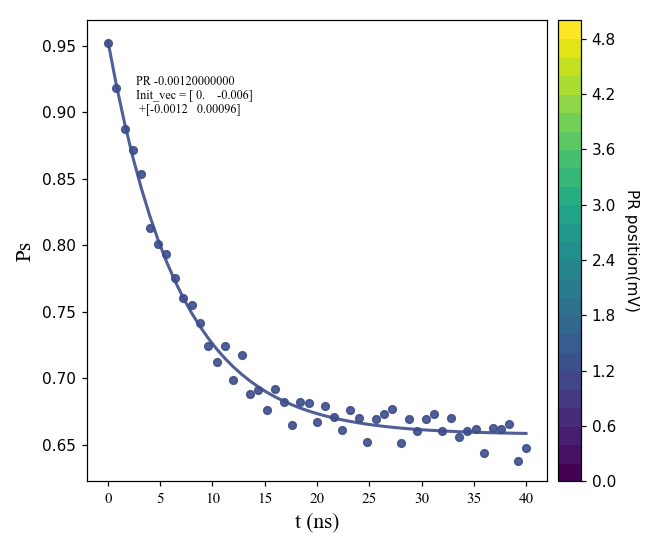

190828170837 ,
fitted_rel_time = np. array([2.90440689e-316, 1.59483126e-316, 3.15922728e-316, 2.99313901e-316,
       2.14522355e-316, 3.15457832e-316, 6.81700000e+000, 3.15923439e-316,
       3.15919645e-316, 3.15922491e-316, 1.60197940e-316, 1.60207426e-316,
       1.59469608e-316, 3.15922016e-316, 3.07674836e-316, 3.15923914e-316,
       3.15922965e-316, 3.15921305e-316, 1.60197545e-316, 1.59510082e-316,
       2.38029959e-316, 2.12375738e-316, 3.15919882e-316, 3.15920831e-316,
       3.15460203e-316, 1.59513837e-316])
fitted_rel_err = np. array([8.40e-322, 2.00e-001, 4.00e-001, 6.00e-001, 8.00e-001, 1.00e+000,
       2.51e-001, 1.40e+000, 1.60e+000, 1.80e+000, 2.00e+000, 2.20e+000,
       2.40e+000, 2.60e+000, 2.80e+000, 3.00e+000, 3.20e+000, 3.40e+000,
       3.60e+000, 3.80e+000, 4.00e+000, 4.20e+000, 4.40e+000, 4.60e+000,
       4.80e+000, 5.00e+000])


In [773]:
####  Average fitting of PSave in a array, following 'Single trace' chapter of ps calculation

#temp_data = ex.load_data(h5files()[-2], load_now = True) #170404230959
#filenames = [170724142000,170724151428,170724153035,170724154403]   ## CL = -1.12V
#filenames = [170725141152,170725143007,170725150128,170725151456]    #  CL = -1.10V
#filenames = [170725173646,170725175727,170725180958,170725183132]    #  CL = -1.08V
#filenames = [170725205611,170725210829,170725211935,170725213332]    #  CL = -1.06V

#filenames = [170816153353,170816154534,170816161422,170816162146]    #  CL = -1.10V after change to AWG7122C

PR_array = temp_data['det_PR'].values*0.001  # mV to V
indexs =  np.flipud(np.arange(1,len(PR_array)+1) )    # np.arange(1,n) = [1,2,.. n-1 ]    to specify the filenames from last
#indexs = np.array([10,9,8,7,6,5,4,3,2,1])
total_num = indexs[0]
init_num = 0
ahead_num = 0                        # how many files are after the series
#indexs = np.arange([0,1,2,3])
#plt.figure(figsize=(10, 8))
n_rows, n_cols = 1,1 #4, 7
fig, axarr = plt.subplots(n_rows, n_cols,figsize=(6,5))  #14,10 dpi=300  # subplots(nrows, ncols, sharex=False, sharey=False, squeeze=True, subplot_kw=None, gridspec_kw=None, **fig_kw)
#f = [[],[],[],[]]
cmap = plt.cm.viridis #plasma
para_store2 = np.empty(total_num-init_num)
## new arrays to store all the calculated Ps and fittings
#data_test1 = ex.load_data(h5files()[-(total_num+ahead_num)], load_now = True)
evol_points = len(temp_data['dwell time'])
Ps_ave_array = np.empty([total_num-init_num,evol_points])
Ps_fit_array = np.empty([total_num-init_num,evol_points])
name_array = np.empty(total_num-init_num, dtype = 'S14')
stderr_array = np.empty(total_num-init_num)
#PR_array = np.empty(total_num-init_num)

vec0, slope_vec = np.array([0.00,-0.006]), np.array([-1.0, 0.8])
slope_array = slope_vec * PR_array.reshape(len(PR_array),1) # which is Init_vec in pulse
Initvec_array = vec0 + slope_array

#temp_data = ex.load_data(h5files()[- 1], load_now = True)     # - (4*(index+ahead_num)-3)
#temp_data['hist'] = tk.hist(temp_data.Vrf, axis = -2, range = (-0.008, 0.004))

for index in [20]:  # indexs
    #fn = (index+ahead_num)

#     threshold_candits = np.linspace(0,-0.01,51)
#     dps = []
#     for threshold in threshold_candits:
#         ps = 1. - tk.probability_lower(temp_data.Vrf, threshold, 'rec')   # when the T peak bins is negative
#         ps = tk.probability_lower(temp_data.Vrf, threshold, 'rec')       # when the T peak bins is positive
#         dps.append(np.max(ps.values, axis = -1)- np.min(ps.values, axis = -1))

#     best_candits = threshold_candits[np.argmax(dps, axis = -2)]
    if True: #common threshold
        #thresholds = np.mean(best_candits)
        thresholds =  -0.018  #+ 0.00003*(total_num -index)
    else:
        print best_candits
        thresholds = np.stack([best_candits[idx[0]] for idx in np.ndindex(temp_data.Vrf.shape)])
        thresholds = thresholds.reshape(temp_data.Vrf.shape)

    #temp_data['ps'] = 1. - tk.probability_lower(temp_data.Vrf, thresholds, 'rec')    # when the T peak bins is negative
    #temp_data['ps'] = tk.probability_lower(temp_data.Vrf, thresholds, 'rec')        # when the T peak bins is positive

    #print best_candits, np.max(temp_data['ps'].values, axis = -1)-np.min(temp_data['ps'].values, axis = -1)," %d PS" %(total_num-index)


    #tk.plot(temp_data, name='ps')
    #tk.plot(temp_data['ps'][1])

    tick_spacing = 0.2
    ## plt.autoscale(enable=True, axis='both', tight=None)
    x = temp_data['dwell time'].values
    y1 = temp_data['psave'].values[total_num-index]
    #print x,y1
    aa = x[0]
    bb = y1[0]
    #print aa,bb

    # plt.figure(figsize = (5.5, 4))

    from lmfit import minimize, Parameters, Parameter, report_fit

    def exp_decay(t, decay_time, offset, amp):
        #bb == amp * np.exp(-aa/decay_time) + offset
        return amp * np.exp(-t/decay_time) + offset

    def exp_decay_start_fixed(t, decay_time, start, amp):
        return amp * np.exp(-t/decay_time) + (start - amp)

    indeces = [int(r*len(y1)) for r in (0., 0.1, 0.8, 0.9)]
    amp = np.mean(y1[indeces[0]:indeces[1]]) - np.mean(y1[indeces[2]:indeces[3]])
    #amp = 0.1

    #nn = len(temp_data['block'])
    #mm = len(y1)
    #nums = np.arange(0,len(temp_data['block']),1)
    #para_store = np.empty(nn)
    #ps_blocks = np.empty([nn,mm])
    # for num in nums:
    #     x = temp_data['dwell time'].values
    #     y1 = temp_data['ps'][num].values
    #     model  = lmfit.Model(exp_decay_start_fixed, independent_vars=['t'])
    #     result = model.fit(y1, t = x,
    #                    decay_time = lmfit.Parameter(value = 0.5*max(x)),
    #                    start     = lmfit.Parameter(value = y1[0], vary = False),
    #                    amp     = lmfit.Parameter(value = amp),                  
    #                    )
    #     decay_time, start, signal = (result.best_values[key] for key in model.param_names)
    #     para_store[num] = decay_time
#     for num in nums:
#         x = temp_data['dwell time'].values #/1000  # as 'us'
#         y1 = temp_data['ps'][num].values
#         ps_blocks[num] = y1

#    y2 =y1  # averaged Ps(t) of 5 blocks
#    jump = round(y2[0]- y2[1], 3 )
#    y3 = y2 # + (0.9 - y2[0])
    
    model  = lmfit.Model(exp_decay, independent_vars=['t'])
    result = model.fit(y1[0:], t = x[0:],
                   decay_time = lmfit.Parameter(value = 0.5*max(x),), # min = 1.6,max =8.
                   offset     = lmfit.Parameter(value = np.mean(y1)),
                   amp     = lmfit.Parameter(value = amp))

    decay_time, offset, amp = (result.best_values[key] for key in model.param_names)
    
    #params =  { 'decay_time':decay_time, 'offset': offset, 'amp': amp}
    fitting_curve = model.func(x, **result.best_values)
    
    para_store2[total_num - index] = round(decay_time,3) 
    #Ps_ave_array[total_num-index,:] = y3
    #Ps_fit_array[total_num-index,:] = fitting_curve
    name_array[total_num-index] = PR_array[total_num - index] * -1.0 
    stderr_array[total_num-index] = round(result.params['decay_time'].stderr,3)
    #PR_array[total_num-index] = temp_data.psave['det_PR'].values[total_num - index]
    #name_array.astype(numpy.int64)
    #print(result.fit_report(min_correl=0.25))
    #plt.plot(x, result.best_fit, color = 'darkorange') # 'dodgerblue'  'midnightblue' darkturquoise
    #plt.errorbar(x, y2, yerr= np.std(ps_blocks, axis = 0), fmt = 'o', markersize = 8, markerfacecolor='none') # color = 'skyblue',

    x_expanded = np.linspace(0, 10, 51)
    #colors = ['C0','C1','C2','C4','C5','C6','C7','C8']
    #ax1 = fig.add_subplot(221)
    
    xx = (total_num - index)//n_cols
    yy = (total_num - index)% n_cols
    
    #axarr[0, 0].plot(x, y)
    color_n = (total_num - index)/(total_num*1.0)      # (total_num - index)/(total_num*1.5)+0.2
    f1, = axarr.plot(x, y1, 'o', markersize = 5,  alpha = 0.9, color = cmap(color_n)  ,label = '')
    #f1, = axarr[xx, yy].plot(x, y1, 'o', markersize = 5,  color = cmap(color_n), alpha = 0.9) # color =  'C0',  'skyblue',
    #plt.plot(x, result.best_fit, 's',markersize = 8, color = 'C0')                 # color = 'dodgerblue'
    #x_expanded = np.linspace(0, 50000, np.abs(x[1]-x[0]))       #x_expanded = np.arange(x.min(), 2.*x.max(), np.abs(x[1]-x[0]))
    axarr.plot(x, fitting_curve, linewidth = 2, color = cmap(color_n), alpha =0.9) # 'C1'
    #axarr[xx,yy].plot(x, fitting_curve, linewidth = 2, color = cmap(color_n), alpha =0.9) # 'C1'
   
    plt.xlabel('t (ns)', size = 14, fontname = 'Times New Roman') # style = 'italic'
    #plt.xlabel('(ns)', size = 20, fontname = 'Century')
    plt.ylabel('Ps', size = 14, fontname = 'Times New Roman')
    plt.sca(axarr)  #axarr[xx,yy]          ## plt.sca()  to set current axes of a subplot
    plt.xticks( fontsize=10, rotation=0, fontname = 'Times New Roman')
    #plt.yticks(np.arange(0.6, 1.001, 0.1), fontsize=10, rotation=0, fontname = 'Times New Roman')

    axarr.text(0.1, 0.8, " PR %s\n Init_vec = %s \n  +%s" %(name_array[total_num-index], vec0, slope_array[total_num-index]), 
                       fontsize = 8, fontname = 'Times New Roman',transform=axarr.transAxes)
    #axarr[xx, yy].set(title = temp_data.attrs['filename'])
    #plt.xlim((0,20))
    #plt.ylim((0.3,1.001))
    #plt.autoscale(enable = False, axis='both', tight = True)
    #fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
    #plt.yticks(np.arange(min(y), max(y)+0.01, 0.02)) [f1],
    #leg = axarr[xx, yy].legend( [f1],[" %d PS, jump=%s" %(total_num-index,jump)],prop={'size':8, 'family': 'Times New Roman'}, loc = 0)
    #leg.set_title('%s'%(temp_data.attrs['filename']),prop={'size':8, 'family': 'Times New Roman'})

# for a colorbar legend
norm= mpl.colors.BoundaryNorm(PR_array*1000, 256) #len(PR_array)-1
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm) 
sm.set_array([])
cb = plt.colorbar(sm, pad = 0.02) # , ticks=PR_array
cb.set_label('PR position(mV)', rotation=270, labelpad = 15)

#fig.text(0.45,0.95, 'CL = -1.10 V', size =14)
#leg = plt.legend([f[0], f[1], f[2],f[3]], [" 0 mV", "20mV", "30mV", "40mV"],prop={'size':14, 'family': 'Times New Roman'}, loc = 0)
#leg.set_title('Pulse Amp',prop={'size':14, 'family': 'Times New Roman'})

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w') #;plt.tight_layout(pad = 3.0, w_pad = 0.9, h_pad = 0.8)
fig.tight_layout()
#print para_store 
plt.show()

#print x
#print y2
print temp_data.attrs['filename'],','
print 'fitted_rel_time = np.',repr(para_store2)
print 'fitted_rel_err = np.',repr(stderr_array) #fitting_curve

### power-law fit

In [272]:
#indexs
#len(PR_array)
ddd = np.empty((3,4))
ddd[0,0]=777
print ddd#[1,2]
para_store2 = np.empty((total_num,4))

[[7.77000000e+002 3.16202013e-322 0.00000000e+000 0.00000000e+000]
 [0.00000000e+000 1.59997667e-047 6.82038744e-038 9.58729824e-043]
 [4.04754324e-037 3.12002473e-033 9.91421939e+164 2.67701035e+184]]


<IPython.core.display.Javascript object>


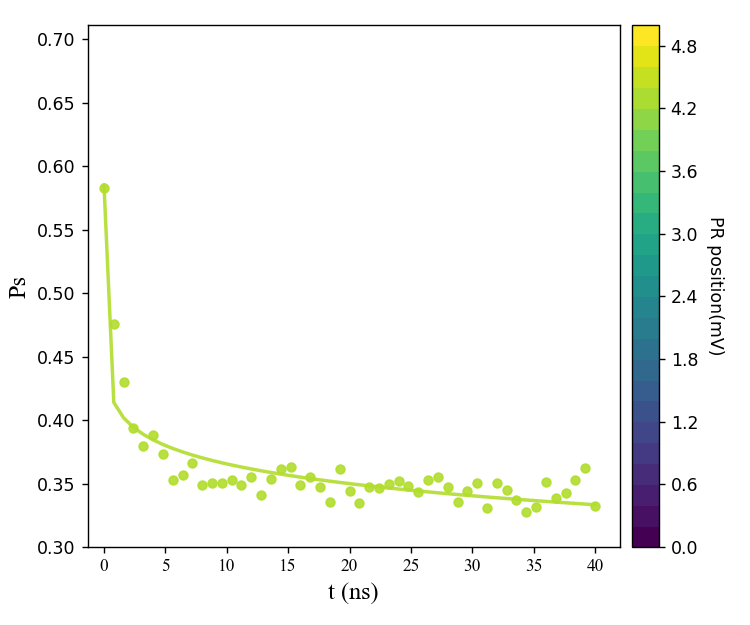

0.5851944613820227 0.12395019516151448 0.09843374335947197 33.46046483807748
190828170837 ,
fitted_rel_time = np. array([[ 9.90000000e-001,  1.50000000e-002,  3.57000000e-001,
         4.23000000e+000],
       [ 9.83000000e-001,  2.10000000e-002,  2.73000000e-001,
         4.87670000e+001],
       [ 9.91000000e-001,  3.90000000e-002,  2.49000000e-001,
         1.87530000e+001],
       [ 6.10591610e-309,  4.95311812e+173,  1.44988341e-308,
         5.54115028e-254],
       [ 1.10645696e+217,  4.62220038e-273,  4.96393995e+173,
         2.13489753e-308],
       [ 1.30078895e-258,  2.13097886e+183,  6.69890623e-230,
         3.25478461e+178],
       [ 2.10230420e-309,  2.03609255e+236,  2.83620881e-308,
         3.04589145e-215],
       [ 2.69719458e-308,  2.10300600e-309,  7.40423276e-278,
         2.88294163e-188],
       [ 3.05496506e-149,  3.25949963e+178,  2.14087326e-308,
         6.70790965e-302],
       [ 3.26108227e+178,  8.89269231e-309,  3.25557335e+178,
         4.45312380e-22

In [299]:
####  Average fitting of PSave in a array, following 'Single trace' chapter of ps calculation

#temp_data = ex.load_data(190828170837) #170404230959 , h5files()[-1]
#filenames = [170724142000,170724151428,170724153035,170724154403]   ## CL = -1.12V
#filenames = [170725141152,170725143007,170725150128,170725151456]    #  CL = -1.10V
#filenames = [170725173646,170725175727,170725180958,170725183132]    #  CL = -1.08V
#filenames = [170725205611,170725210829,170725211935,170725213332]    #  CL = -1.06V

#filenames = [170816153353,170816154534,170816161422,170816162146]    #  CL = -1.10V after change to AWG7122C

PR_array = temp_data['det_PR'].values*0.001  # mV to V
indexs =  np.flipud(np.arange(1,len(PR_array)+1) )    # np.arange(1,n) = [1,2,.. n-1 ]    to specify the filenames from last
#indexs = np.array([10,9,8,7,6,5,4,3,2,1])
total_num = indexs[0]
init_num = 0
ahead_num = 0                        # how many files are after the series
#indexs = np.arange([0,1,2,3])
#plt.figure(figsize=(10, 8))
n_rows, n_cols = 1,1 #4, 7
fig, axarr = plt.subplots(n_rows, n_cols,figsize=(6,5))  #14,10 dpi=300  # subplots(nrows, ncols, sharex=False, sharey=False, squeeze=True, subplot_kw=None, gridspec_kw=None, **fig_kw)
#f = [[],[],[],[]]
cmap = plt.cm.viridis #plasma
#para_store2 = np.empty((total_num,4))
## new arrays to store all the calculated Ps and fittings
#data_test1 = ex.load_data(h5files()[-(total_num+ahead_num)], load_now = True)
evol_points = len(temp_data['dwell time'])
Ps_ave_array = np.empty([total_num-init_num,evol_points])
Ps_fit_array = np.empty([total_num-init_num,evol_points])
name_array = np.empty(total_num-init_num, dtype = 'S14')
stderr_array = np.empty(total_num-init_num)
#PR_array = np.empty(total_num-init_num)

vec0, slope_vec = np.array([0.00,-0.006]), np.array([-1.0, 0.8])
slope_array = slope_vec * PR_array.reshape(len(PR_array),1) # which is Init_vec in pulse
Initvec_array = vec0 + slope_array

#temp_data = ex.load_data(h5files()[- 1], load_now = True)     # - (4*(index+ahead_num)-3)
#temp_data['hist'] = tk.hist(temp_data.Vrf, axis = -2, range = (-0.008, 0.004))

for index in [3]:        # indexs, np.array([26,25,24,23,22,21,20,15,10,7,5,3,2,1])
    #fn = (index+ahead_num)

    tick_spacing = 0.2
    ## plt.autoscale(enable=True, axis='both', tight=None)
    x = temp_data['dwell time'].values
    y1 = temp_data['psave'].values[total_num-index]
    #print x,y1
    aa = x[0]
    bb = y1[0]
    #print aa,bb

    # plt.figure(figsize = (5.5, 4))

    from lmfit import minimize, Parameters, Parameter, report_fit

    def exp_decay(t, decay_time, offset, amp):
        #bb == amp * np.exp(-aa/decay_time) + offset
        return amp * np.exp(-t/decay_time) + offset

#     def exp_decay_start_fixed(t, decay_time, start, amp):
#         return amp * np.exp(-t/decay_time) + (start - amp)
    
    def Sz_ani(t, b, a, c, Tk):
        return b - a*(t*Tk)**c

    indeces = [int(r*len(y1)) for r in (0., 0.1, 0.8, 0.9)]
    amp = np.mean(y1[indeces[0]:indeces[1]]) - np.mean(y1[indeces[2]:indeces[3]])
    #amp = 0.1


    model  = lmfit.Model(Sz_ani, independent_vars=['t'])
    result = model.fit(y1[0:], t = x[0:],
                   #S = lmfit.Parameter(value = 1.0), # min = 1.6,max =8.
                   b  = lmfit.Parameter(value = 1.0),
                   a  = lmfit.Parameter(value = 0.01),
                   c  = lmfit.Parameter(value = 0.32, min =0.0001),
                   Tk = lmfit.Parameter(value = 1, max = 2000, min =0.00001 ) )  # Tk in units of 1/ns i.e. GHz, tk in units of ns

    b, a, c, Tk = (result.best_values[key] for key in model.param_names)
    print b, a, c, Tk
    #params =  { 'decay_time':decay_time, 'offset': offset, 'amp': amp}
    
    fitting_curve = model.func(x, **result.best_values)
    
    para_store2[total_num - index] = (round(b,3), round(a,3), round(c,3), round(Tk,3) ) 
    #Ps_ave_array[total_num-index,:] = y3
    #Ps_fit_array[total_num-index,:] = fitting_curve
    name_array[total_num-index] = PR_array[total_num - index] * -1.0 
    #stderr_array[total_num-index] = round(result.params['decay_time'].stderr,3)
    #PR_array[total_num-index] = temp_data.psave['det_PR'].values[total_num - index]
    #name_array.astype(numpy.int64)
    #print(result.fit_report(min_correl=0.25))
    #plt.plot(x, result.best_fit, color = 'darkorange') # 'dodgerblue'  'midnightblue' darkturquoise
    #plt.errorbar(x, y2, yerr= np.std(ps_blocks, axis = 0), fmt = 'o', markersize = 8, markerfacecolor='none') # color = 'skyblue',

    x_expanded = np.linspace(0, 10, 51)
    #colors = ['C0','C1','C2','C4','C5','C6','C7','C8']
    #ax1 = fig.add_subplot(221)
    
    xx = (total_num - index)//n_cols
    yy = (total_num - index)% n_cols
    
    #axarr[0, 0].plot(x, y)
    color_n = (total_num - index)/(total_num*1.0)      # (total_num - index)/(total_num*1.5)+0.2
    f1, = axarr.plot(x, y1, 'o', markersize = 5,  alpha = 0.9, color = cmap(color_n)  ,label = '')
    #f1, = axarr[xx, yy].plot(x, y1, 'o', markersize = 5,  color = cmap(color_n), alpha = 0.9) # color =  'C0',  'skyblue',
    #plt.plot(x, result.best_fit, 's',markersize = 8, color = 'C0')                 # color = 'dodgerblue'
    #x_expanded = np.linspace(0, 50000, np.abs(x[1]-x[0]))       #x_expanded = np.arange(x.min(), 2.*x.max(), np.abs(x[1]-x[0]))
    axarr.plot(x, fitting_curve, linewidth = 2, color = cmap(color_n), alpha =0.9) # 'C1'
    #axarr[xx,yy].plot(x, fitting_curve, linewidth = 2, color = cmap(color_n), alpha =0.9) # 'C1'
   
    plt.xlabel('t (ns)', size = 14, fontname = 'Times New Roman') # style = 'italic'
    #plt.xlabel('(ns)', size = 20, fontname = 'Century')
    plt.ylabel('Ps', size = 14, fontname = 'Times New Roman')
    plt.sca(axarr)  #axarr[xx,yy]          ## plt.sca()  to set current axes of a subplot
    plt.xticks( fontsize=10, rotation=0, fontname = 'Times New Roman')
    #plt.yticks(np.arange(0.6, 1.001, 0.1), fontsize=10, rotation=0, fontname = 'Times New Roman')

    #axarr.text(0.1, 0.8, " PR %s\n Init_vec = %s \n  +%s" %(name_array[total_num-index], vec0, slope_array[total_num-index]), 
    #                   fontsize = 8, fontname = 'Times New Roman',transform=axarr.transAxes)
    #axarr[xx, yy].set(title = temp_data.attrs['filename'])
    #plt.xlim((0,20))
    plt.ylim((0.3,1.001))
    #plt.autoscale(enable = False, axis='both', tight = True)
    #fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
    #plt.yticks(np.arange(min(y), max(y)+0.01, 0.02)) [f1],
    #leg = axarr[xx, yy].legend( [f1],[" %d PS, jump=%s" %(total_num-index,jump)],prop={'size':8, 'family': 'Times New Roman'}, loc = 0)
    #leg.set_title('%s'%(temp_data.attrs['filename']),prop={'size':8, 'family': 'Times New Roman'})

# for a colorbar legend
norm= mpl.colors.BoundaryNorm(PR_array*1000, 256) #len(PR_array)-1
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm) 
sm.set_array([])
cb = plt.colorbar(sm, pad = 0.02) # , ticks=PR_array
cb.set_label('PR position(mV)', rotation=270, labelpad = 15)

#fig.text(0.45,0.95, 'CL = -1.10 V', size =14)
#leg = plt.legend([f[0], f[1], f[2],f[3]], [" 0 mV", "20mV", "30mV", "40mV"],prop={'size':14, 'family': 'Times New Roman'}, loc = 0)
#leg.set_title('Pulse Amp',prop={'size':14, 'family': 'Times New Roman'})

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w') #;plt.tight_layout(pad = 3.0, w_pad = 0.9, h_pad = 0.8)
fig.tight_layout()
#print para_store 
plt.show()

#print x
#print y2
print temp_data.attrs['filename'],','
print 'fitted_rel_time = np.',repr(para_store2)
print 'fitted_rel_err = np.',repr(stderr_array) #fitting_curve

In [789]:
# fit result of Power law

# with Tk max = 10,  para:  b, a ,c ,Tk
fitted_rel_time = np. array([[ 0.99 ,  0.016,  0.357,  3.86 ],
       [ 0.983,  0.035,  0.273,  7.651],
       [ 0.991,  0.047,  0.249,  9.029],
       [ 0.987,  0.07 ,  0.212,  9.808],
       [ 0.999,  0.052,  0.295,  8.512],
       [ 0.994,  0.051,  0.298,  9.5  ],
       [ 0.985,  0.081,  0.284,  4.553],
       [ 0.99 ,  0.093,  0.252,  9.983],
       [ 0.97 ,  0.11 ,  0.231, 10.   ],
       [ 0.966,  0.13 ,  0.207,  9.997],
       [ 0.949,  0.139,  0.203,  9.912],
       [ 0.947,  0.174,  0.176, 10.   ],
       [ 0.912,  0.163,  0.184,  9.952],
       [ 0.902,  0.187,  0.163,  9.749],
       [ 0.861,  0.185,  0.157,  9.979],
       [ 0.829,  0.188,  0.145,  9.999],
       [ 0.816,  0.184,  0.147,  9.987],
       [ 0.757,  0.157,  0.155,  9.982],
       [ 0.675,  0.133,  0.148,  9.974],
       [ 0.56 ,  0.139,  0.07 ,  9.93 ],
       [ 0.59 ,  0.148,  0.085,  9.997],
       [ 0.573,  0.127,  0.098, 10.   ],
       [ 0.65 ,  0.192,  0.082,  9.955],
       [ 0.585,  0.14 ,  0.098,  9.999],
       [ 0.515,  0.111,  0.083,  9.99 ],
       [ 0.425,  0.047,  0.128,  7.459]])

# with Tk max =1000, but c min =0.2

fitted_rel_time = np. array([[9.9000e-01, 1.6000e-02, 3.5700e-01, 3.4980e+00],
       [9.8300e-01, 5.1000e-02, 2.7300e-01, 1.7890e+00],
       [9.9100e-01, 4.0000e-02, 2.4900e-01, 1.6996e+01],
       [9.8700e-01, 4.9000e-02, 2.1200e-01, 5.3005e+01],
       [9.9900e-01, 3.9000e-02, 2.9500e-01, 2.4065e+01],
       [9.9400e-01, 4.3000e-02, 2.9800e-01, 1.6472e+01],
       [9.8500e-01, 4.9000e-02, 2.8400e-01, 2.6389e+01],
       [9.9000e-01, 6.4000e-02, 2.5200e-01, 4.4403e+01],
       [9.7000e-01, 7.5000e-02, 2.3100e-01, 5.1371e+01],
       [9.6600e-01, 8.3000e-02, 2.0700e-01, 8.7882e+01],
       [9.4900e-01, 9.4000e-02, 2.0300e-01, 6.6547e+01],
       [9.2100e-01, 9.8000e-02, 2.0000e-01, 7.0087e+01],
       [8.9600e-01, 9.8000e-02, 2.0000e-01, 7.0030e+01],
       [8.6200e-01, 9.6000e-02, 2.0000e-01, 6.6709e+01],
       [8.1600e-01, 9.2000e-02, 2.0000e-01, 6.1875e+01],
       [7.7300e-01, 8.6000e-02, 2.0000e-01, 5.5033e+01],
       [7.6300e-01, 8.6000e-02, 2.0000e-01, 5.5034e+01],
       [7.1800e-01, 8.0000e-02, 2.0000e-01, 4.8527e+01],
       [6.3800e-01, 6.6000e-02, 2.0000e-01, 3.9453e+01],
       [4.9100e-01, 4.1000e-02, 2.0000e-01, 1.7309e+01],
       [5.2100e-01, 4.8000e-02, 2.0000e-01, 2.1739e+01],
       [5.1700e-01, 4.7000e-02, 2.0000e-01, 2.1209e+01],
       [5.5900e-01, 5.7000e-02, 2.0000e-01, 2.8528e+01],
       [5.2400e-01, 5.1000e-02, 2.0000e-01, 2.3919e+01],
       [4.6200e-01, 3.8000e-02, 2.0000e-01, 1.6011e+01],
       [4.0900e-01, 5.3000e-02, 2.0000e-01, 2.3100e-01]])

#                   b  = lmfit.Parameter(value = 1.0),
#                    a  = lmfit.Parameter(value = 0.01),
#                    c  = lmfit.Parameter(value = 0.32, min =0.001),
#                    Tk = lmfit.Parameter(value = 1, max = 2000, min =0.00001 ) 

# fitted_rel_time = np. array([[9.90000e-01, 1.50000e-02, 3.57000e-01, 4.15700e+00],
#        [9.83000e-01, 2.10000e-02, 2.73000e-01, 4.92750e+01],
#        [9.91000e-01, 3.90000e-02, 2.49000e-01, 1.92530e+01],
#        [9.87000e-01, 4.90000e-02, 2.12000e-01, 4.97460e+01],
#        [9.99000e-01, 4.40000e-02, 2.95000e-01, 1.57570e+01],
#        [9.94000e-01, 4.10000e-02, 2.98000e-01, 2.00350e+01],
#        [9.85000e-01, 3.40000e-02, 2.84000e-01, 9.95080e+01],
#        [9.90000e-01, 6.90000e-02, 2.52000e-01, 3.34530e+01],
#        [9.70000e-01, 7.20000e-02, 2.31000e-01, 6.08800e+01],
#        [9.66000e-01, 8.50000e-02, 2.07000e-01, 7.73590e+01],
#        [9.49000e-01, 1.01000e-01, 2.03000e-01, 4.86840e+01],
#        [9.47000e-01, 1.18000e-01, 1.76000e-01, 8.81820e+01],
#        [9.12000e-01, 1.24000e-01, 1.84000e-01, 4.44180e+01],
#        [9.02000e-01, 1.14000e-01, 1.63000e-01, 2.02285e+02],
#        [8.61000e-01, 1.42000e-01, 1.57000e-01, 5.38440e+01],
#        [8.29000e-01, 1.32000e-01, 1.45000e-01, 1.12547e+02],
#        [8.16000e-01, 1.29000e-01, 1.47000e-01, 1.15393e+02],
#        [7.57000e-01, 1.24000e-01, 1.55000e-01, 4.43260e+01],
#        [6.75000e-01, 8.30000e-02, 1.48000e-01, 2.34754e+02],
#        [5.60000e-01, 1.21000e-01, 7.00000e-02, 6.72130e+01],
#        [5.90000e-01, 1.35000e-01, 8.50000e-02, 2.93500e+01],
#        [5.73000e-01, 1.06000e-01, 9.80000e-02, 6.07840e+01],
#        [6.50000e-01, 1.61000e-01, 8.20000e-02, 8.80940e+01],
#        [5.85000e-01, 1.20000e-01, 9.80000e-02, 4.67400e+01],
#        [5.15000e-01, 9.70000e-02, 8.30000e-02, 5.44780e+01],
#        [4.25000e-01, 5.10000e-02, 1.28000e-01, 3.47700e+00]])

# c  = lmfit.Parameter(value = 0.32, min =0.0001),
# fitted_rel_time = np. array([[9.90000e-01, 1.50000e-02, 3.57000e-01, 4.23000e+00],
#        [9.83000e-01, 2.10000e-02, 2.73000e-01, 4.87670e+01],
#        [9.91000e-01, 3.90000e-02, 2.49000e-01, 1.87530e+01],
#        [9.87000e-01, 4.90000e-02, 2.12000e-01, 4.94610e+01],
#        [9.99000e-01, 3.90000e-02, 2.95000e-01, 2.34710e+01],
#        [9.94000e-01, 4.00000e-02, 2.98000e-01, 2.03940e+01],
#        [9.85000e-01, 3.20000e-02, 2.84000e-01, 1.23808e+02],
#        [9.90000e-01, 6.70000e-02, 2.52000e-01, 3.73140e+01],
#        [9.70000e-01, 8.00000e-02, 2.31000e-01, 3.91810e+01],
#        [9.66000e-01, 9.00000e-02, 2.07000e-01, 5.83510e+01],
#        [9.49000e-01, 1.05000e-01, 2.03000e-01, 3.94290e+01],
#        [9.47000e-01, 1.21000e-01, 1.76000e-01, 7.72080e+01],
#        [9.12000e-01, 9.80000e-02, 1.84000e-01, 1.55600e+02],
#        [9.02000e-01, 1.10000e-01, 1.63000e-01, 2.56022e+02],
#        [8.61000e-01, 1.27000e-01, 1.57000e-01, 1.12251e+02],
#        [8.29000e-01, 1.33000e-01, 1.45000e-01, 1.10110e+02],
#        [8.16000e-01, 1.42000e-01, 1.47000e-01, 5.74100e+01],
#        [7.57000e-01, 1.06000e-01, 1.55000e-01, 1.25699e+02],
#        [6.75000e-01, 1.06000e-01, 1.48000e-01, 4.43710e+01],
#        [5.60000e-01, 1.32000e-01, 7.00000e-02, 2.07900e+01],
#        [5.90000e-01, 1.17000e-01, 8.50000e-02, 1.51160e+02],
#        [5.73000e-01, 1.07000e-01, 9.80000e-02, 5.69540e+01],
#        [6.50000e-01, 1.67000e-01, 8.20000e-02, 5.59900e+01],
#        [5.85000e-01, 1.24000e-01, 9.80000e-02, 3.34600e+01],
#        [5.15000e-01, 1.08000e-01, 8.30000e-02, 1.45760e+01],
#        [4.25000e-01, 3.40000e-02, 1.28000e-01, 8.31290e+01]])

In [716]:
fitted_rel_time[:,3]

array([ 3.86 ,  7.651,  9.029,  9.808,  8.512,  9.5  ,  4.553,  9.983,
       10.   ,  9.997,  9.912, 10.   ,  9.952,  9.749,  9.979,  9.999,
        9.987,  9.982,  9.974,  9.93 ,  9.997, 10.   ,  9.955,  9.999,
        9.99 ,  7.459])

<IPython.core.display.Javascript object>


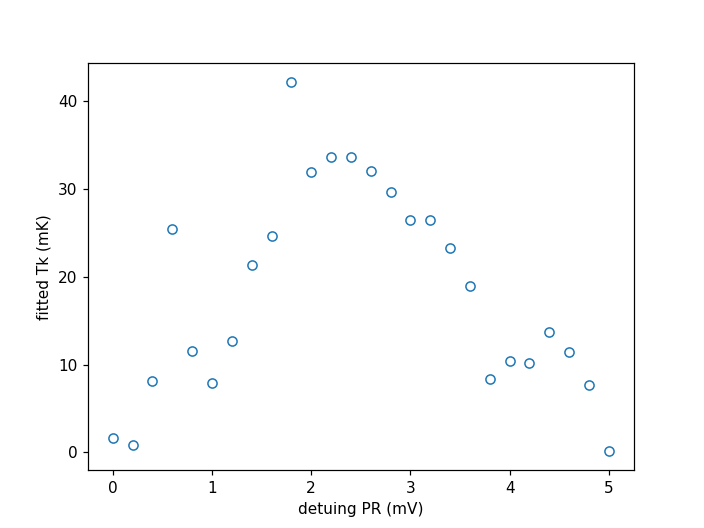

Text(0,0.5,'fitted Tk (mK)')

In [790]:
fig, ax =plt.subplots()

x = PR_array
y = fitted_rel_time[:,3]  # Tk from fitted result

ax.plot(x*1000, y*4.8/10 ,'o',mfc='w')  # x mV, y : Tk convert from GHz to mK
ax.set_xlabel('detuing PR (mV)')
ax.set_ylabel('fitted Tk (mK)')
#ax.set_ylim((0.9,1))

<IPython.core.display.Javascript object>


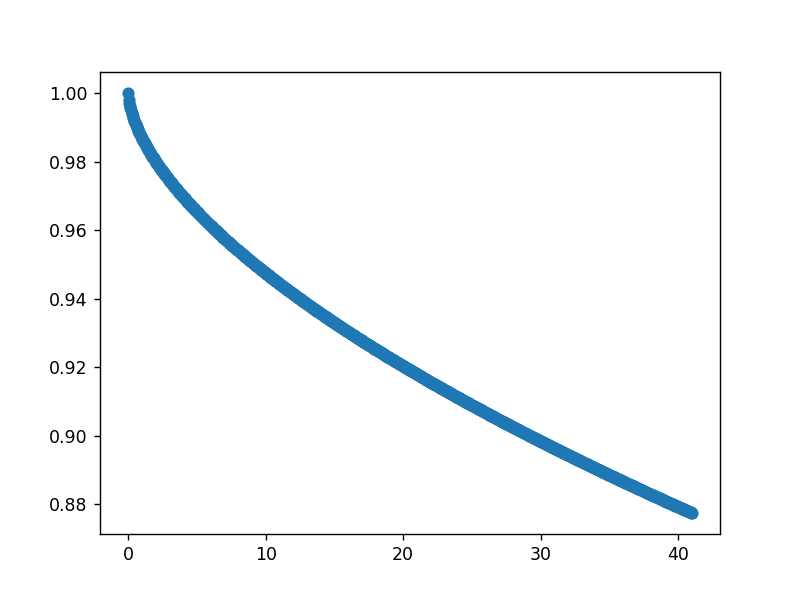

In [673]:
fig, ax =plt.subplots()
def Sz_ani(t, b, a, c, Tk):
    return b - a*(t*Tk)**c
t = np.linspace(0,41,1001)
y = Sz_ani(t, 1, 0.02, 0.6, 0.5)  # Tk is 2GHz

ax.plot(t,y,'o')
#ax.set_ylim((0.9,1))

In [507]:
fitted_rel_time = np. array([6.23800000e+02, 1.08510000e+02, 3.00680000e+02, 6.61609354e+2,
       1.91920000e+2, 1.63630000e+02, 2.93400000e+02, 3.12340000e+02,
       2.73300000e+01, 2.40010000e+01, 3.08500000e+01, 2.79220000e+01,
       2.58480000e+01, 2.84410000e+01, 2.33010000e+01, 2.27400000e+01,
       1.97310000e+01, 2.10410000e+01, 1.86050000e+01, 1.97820000e+01,
       2.26990000e+01, 2.25740000e+01, 2.36270000e+01, 2.07130000e+01,
       1.98910000e+01, 2.03560000e+01, 1.79620000e+01, 1.21850000e+01,
       1.48330000e+01, 1.67890000e+01, 1.28350000e+01, 1.52150000e+01,
       1.47750000e+01, 1.24500000e+01, 1.43080000e+01, 1.29730000e+01,
       1.19400000e+01, 9.67100000e+00, 9.50500000e+00, 8.46400000e+00,
       1.03300000e+00])
fitted_rel_err = np. array([ 5.231,  6.492, 17.327,    4,  5.676,  3.494,  5.897,  6.133,
        3.084,  3.05 ,  3.771,  3.187,  2.509,  2.69 ,  1.644,  1.715,
        1.695,  1.665,  1.219,  1.254,  1.103,  0.956,  1.118,  0.794,
        0.936,  0.83 ,  0.871,  1.041,  0.832,  0.612,  0.688,  0.669,
        0.837,  0.762,  0.793,  0.772,  0.683,  0.85 ,  0.779,  0.774,
        0.134])

### long_t pre-power fit


In [818]:
para_store3 = np.empty((total_num,4))

In [808]:
temp_data['dwell time'].values

array([ 0. ,  0.8,  1.6,  2.4,  3.2,  4. ,  4.8,  5.6,  6.4,  7.2,  8. ,
        8.8,  9.6, 10.4, 11.2, 12. , 12.8, 13.6, 14.4, 15.2, 16. , 16.8,
       17.6, 18.4, 19.2, 20. , 20.8, 21.6, 22.4, 23.2, 24. , 24.8, 25.6,
       26.4, 27.2, 28. , 28.8, 29.6, 30.4, 31.2, 32. , 32.8, 33.6, 34.4,
       35.2, 36. , 36.8, 37.6, 38.4, 39.2, 40. ])

In [826]:
#am, g, off, Tk = (result.best_values[key] for key in model.param_names)
# for key in model.param_names:
#     print result.best_values[key]

result.best_values

{'Tk': 0.1417673460841056,
 'am': 0.1388399452134222,
 'g': 3.648031132730267e-08,
 'off': 0.8316861576354093}

<IPython.core.display.Javascript object>


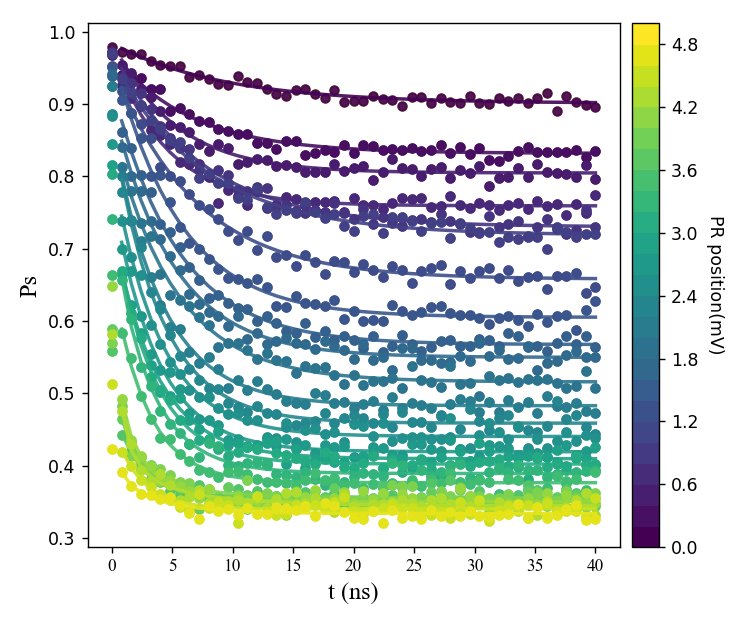

0.08280333902471237 4.804570341576664e-08 0.9007610989674375 0.09876720570022515
0.1388400078932711 3.169293377736082e-08 0.8316861781954328 0.14176755212817527
0.18262483616554748 1.4807310932951623e-09 0.8045627814653009 0.1780454917620957
0.21374275077194693 6.676128538884996e-10 0.7591534706672822 0.20068902078804382
0.24421761795797303 2.7072238006908833e-08 0.7300119964591714 0.12608176533654758
0.2416618542019705 0.0049896379956021475 0.7185123347359529 0.11677790605166698
0.2964674039644716 3.9286760622481154e-08 0.6577615448634342 0.13390193626478983
0.3684775632555315 1.5189284274796933e-09 0.6050581331781224 0.16854040675391566
0.35895759265755 2.459084047501392e-10 0.5674174798871062 0.16968858030718165
0.3506666043661516 9.096327024948891e-10 0.5497350425871715 0.1819657334098934
0.34982530104779586 0.01476315945683565 0.5158047113369986 0.17317349094536164
0.38425576659246063 0.006606446970861546 0.48289311801880613 0.21897568648379215
0.41475061882228104 5.55111512312578

In [859]:
####  Average fitting of PSave in a array, following 'Single trace' chapter of ps calculation

#temp_data = ex.load_data(190828170837) #170404230959 , h5files()[-1]
#filenames = [170724142000,170724151428,170724153035,170724154403]   ## CL = -1.12V
#filenames = [170725141152,170725143007,170725150128,170725151456]    #  CL = -1.10V
#filenames = [170725173646,170725175727,170725180958,170725183132]    #  CL = -1.08V
#filenames = [170725205611,170725210829,170725211935,170725213332]    #  CL = -1.06V

#filenames = [170816153353,170816154534,170816161422,170816162146]    #  CL = -1.10V after change to AWG7122C

PR_array = temp_data['det_PR'].values*0.001  # mV to V
indexs =  np.flipud(np.arange(1,len(PR_array)+1) )    # np.arange(1,n) = [1,2,.. n-1 ]    to specify the filenames from last
#indexs = np.array([10,9,8,7,6,5,4,3,2,1])
total_num = indexs[0]
init_num = 0
ahead_num = 0                        # how many files are after the series
#indexs = np.arange([0,1,2,3])
#plt.figure(figsize=(10, 8))
n_rows, n_cols = 1,1 #4, 7
fig, axarr = plt.subplots(n_rows, n_cols,figsize=(6,5))  #14,10 dpi=300  # subplots(nrows, ncols, sharex=False, sharey=False, squeeze=True, subplot_kw=None, gridspec_kw=None, **fig_kw)
#f = [[],[],[],[]]
cmap = plt.cm.viridis #plasma
#para_store2 = np.empty((total_num,4))
## new arrays to store all the calculated Ps and fittings
#data_test1 = ex.load_data(h5files()[-(total_num+ahead_num)], load_now = True)
evol_points = len(temp_data['dwell time'])
Ps_ave_array = np.empty([total_num-init_num,evol_points])
Ps_fit_array = np.empty([total_num-init_num,evol_points])
name_array = np.empty(total_num-init_num, dtype = 'S14')
stderr_array = np.empty(total_num-init_num)
#PR_array = np.empty(total_num-init_num)

vec0, slope_vec = np.array([0.00,-0.006]), np.array([-1.0, 0.8])
slope_array = slope_vec * PR_array.reshape(len(PR_array),1) # which is Init_vec in pulse
Initvec_array = vec0 + slope_array

#temp_data = ex.load_data(h5files()[- 1], load_now = True)     # - (4*(index+ahead_num)-3)
#temp_data['hist'] = tk.hist(temp_data.Vrf, axis = -2, range = (-0.008, 0.004))

for index in indexs:        # indexs, np.array([26,25,24,23,22,21,20,15,10,7,5,3,2,1])
    #fn = (index+ahead_num)

    tick_spacing = 0.2
    ## plt.autoscale(enable=True, axis='both', tight=None)
    x = temp_data['dwell time'].values
    y1 = temp_data['psave'].values[total_num-index]
    #print x,y1
    aa = x[0]
    bb = y1[0]
    #print aa,bb

    # plt.figure(figsize = (5.5, 4))

    from lmfit import minimize, Parameters, Parameter, report_fit

    def exp_decay(t, decay_time, offset, amp):
        #bb == amp * np.exp(-aa/decay_time) + offset
        return amp * np.exp(-t/decay_time) + offset

#     def exp_decay_start_fixed(t, decay_time, start, amp):
#         return amp * np.exp(-t/decay_time) + (start - amp)
    
#     def Sz_ani(t, b, a, c, Tk):   # power-law model
#         return b - a*(t*Tk)**c

    def Sz_longt(am, g, off, Tk, t):  # for t >> 1/Tk  long time limit , from Herbert Schoeller, 2012  PRL 108,260601
        return am/(t**g) * np.exp(-t*(1.1*Tk)) + off  # Tk normed by h as freq

    #g = 1/2. # g can be 1/2 or 4/5 depending on truncation order

    
    #Tk = 1. # GHz ,normed by Plank const
    #t = np.linspace(0.,2.1,1001) # ns


    indeces = [int(r*len(y1)) for r in (0., 0.1, 0.8, 0.9)]
    amp = np.mean(y1[indeces[0]:indeces[1]]) - np.mean(y1[indeces[2]:indeces[3]])
    #amp = 0.1
    
    f1, = axarr.plot(x, y1, 'o', markersize = 5,  alpha = 0.9, color = cmap(color_n)  ,label = '')


    model  = lmfit.Model(Sz_longt, independent_vars=['t'])
    result = model.fit(y1[1:], t = x[1:],
                   #S = lmfit.Parameter(value = 1.0), # min = 1.6,max =8.
                   am  = lmfit.Parameter(value = 0.3, max =10., min =0.),
                   g  = lmfit.Parameter(value = 0.2, max = 1.0, min =0.),
                   off = lmfit.Parameter(value = 0.6, max = 1.0,min =0.),
                   Tk = lmfit.Parameter(value = 0.1, max = 2000, min =0.00001 ) )  # Tk in units of 1/ns i.e. GHz, tk in units of ns

    am, g, off, Tk = (result.best_values[key] for key in model.param_names)
    print am, g, off, Tk
    #params =  { 'decay_time':decay_time, 'offset': offset, 'amp': amp}
    
    #fitting_curve = model.func(x[0:], **{'am': 0.13,'g':g, 'off':off,'Tk':Tk})  # **result.best_values
    fitting_curve = Sz_longt(am,g,off,Tk,x)
    
    para_store3[total_num - index] = (round(am,3), round(g,3), round(off,3),round(Tk,3) ) 
    #Ps_ave_array[total_num-index,:] = y3
    #Ps_fit_array[total_num-index,:] = fitting_curve
    name_array[total_num-index] = PR_array[total_num - index] * -1.0 
    #stderr_array[total_num-index] = round(result.params['decay_time'].stderr,3)
    #PR_array[total_num-index] = temp_data.psave['det_PR'].values[total_num - index]
    #name_array.astype(numpy.int64)
    #print(result.fit_report(min_correl=0.25))
    #plt.plot(x, result.best_fit, color = 'darkorange') # 'dodgerblue'  'midnightblue' darkturquoise
    #plt.errorbar(x, y2, yerr= np.std(ps_blocks, axis = 0), fmt = 'o', markersize = 8, markerfacecolor='none') # color = 'skyblue',

    x_expanded = np.linspace(0, 10, 51)
    #colors = ['C0','C1','C2','C4','C5','C6','C7','C8']
    #ax1 = fig.add_subplot(221)
    
    xx = (total_num - index)//n_cols
    yy = (total_num - index)% n_cols
    
    #axarr[0, 0].plot(x, y)
    color_n = (total_num - index)/(total_num*1.0)      # (total_num - index)/(total_num*1.5)+0.2
    f1, = axarr.plot(x, y1, 'o', markersize = 5,  alpha = 0.9, color = cmap(color_n)  ,label = '')
    #f1, = axarr[xx, yy].plot(x, y1, 'o', markersize = 5,  color = cmap(color_n), alpha = 0.9) # color =  'C0',  'skyblue',
    #plt.plot(x, result.best_fit, 's',markersize = 8, color = 'C0')                 # color = 'dodgerblue'
    #x_expanded = np.linspace(0, 50000, np.abs(x[1]-x[0]))       #x_expanded = np.arange(x.min(), 2.*x.max(), np.abs(x[1]-x[0]))
    axarr.plot(x, fitting_curve, linewidth = 2, color = cmap(color_n), alpha =0.9) # 'C1'
    #axarr[xx,yy].plot(x, fitting_curve, linewidth = 2, color = cmap(color_n), alpha =0.9) # 'C1'
   
    plt.xlabel('t (ns)', size = 14, fontname = 'Times New Roman') # style = 'italic'
    #plt.xlabel('(ns)', size = 20, fontname = 'Century')
    plt.ylabel('Ps', size = 14, fontname = 'Times New Roman')
    plt.sca(axarr)  #axarr[xx,yy]          ## plt.sca()  to set current axes of a subplot
    plt.xticks( fontsize=10, rotation=0, fontname = 'Times New Roman')
    #plt.yticks(np.arange(0.6, 1.001, 0.1), fontsize=10, rotation=0, fontname = 'Times New Roman')

    #axarr.text(0.1, 0.8, " PR %s\n Init_vec = %s \n  +%s" %(name_array[total_num-index], vec0, slope_array[total_num-index]), 
    #                   fontsize = 8, fontname = 'Times New Roman',transform=axarr.transAxes)
    #axarr[xx, yy].set(title = temp_data.attrs['filename'])
    #plt.xlim((0,20))
    #plt.ylim((0.3,1.001))
    #plt.autoscale(enable = False, axis='both', tight = True)
    #fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
    #plt.yticks(np.arange(min(y), max(y)+0.01, 0.02)) [f1],
    #leg = axarr[xx, yy].legend( [f1],[" %d PS, jump=%s" %(total_num-index,jump)],prop={'size':8, 'family': 'Times New Roman'}, loc = 0)
    #leg.set_title('%s'%(temp_data.attrs['filename']),prop={'size':8, 'family': 'Times New Roman'})

# for a colorbar legend
norm= mpl.colors.BoundaryNorm(PR_array*1000, 256) #len(PR_array)-1
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm) 
sm.set_array([])
cb = plt.colorbar(sm, pad = 0.02) # , ticks=PR_array
cb.set_label('PR position(mV)', rotation=270, labelpad = 15)

#fig.text(0.45,0.95, 'CL = -1.10 V', size =14)
#leg = plt.legend([f[0], f[1], f[2],f[3]], [" 0 mV", "20mV", "30mV", "40mV"],prop={'size':14, 'family': 'Times New Roman'}, loc = 0)
#leg.set_title('Pulse Amp',prop={'size':14, 'family': 'Times New Roman'})

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w') #;plt.tight_layout(pad = 3.0, w_pad = 0.9, h_pad = 0.8)
fig.tight_layout()
#print para_store 
plt.show()

#print x
#print y2
print temp_data.attrs['filename'],','
print 'fitted_rel_time = np.',repr(para_store3)
print 'fitted_rel_err = np.',repr(stderr_array) #fitting_curve

In [847]:
indexs

array([26, 25, 24, 23, 22, 21, 20, 19, 18, 17, 16, 15, 14, 13, 12, 11, 10,
        9,  8,  7,  6,  5,  4,  3,  2,  1])

In [293]:
# fit result of exp with pre-Power   1/t**g * exp(-t*1.1Tk)

# Sz_longt:  am/(t**g) * np.exp(-t*(1.1*Tk)) + off
# am  = lmfit.Parameter(value = 0.3, max =10., min =0.),
# g  = lmfit.Parameter(value = 0.2, max = 1.0, min =0.),
# off = lmfit.Parameter(value = 0.6, max = 1.0,min =0.),
# Tk = lmfit.Parameter(value = 0.1, max = 2000, min =0.00001 )   # Tk in units of 1/ns i.e. GHz, tk in units of ns

# para: am, g, off, Tk    ,  file , 190828170837 ,
fitted_rel_time = np. array([[0.083, 0.   , 0.901, 0.099],
       [0.139, 0.   , 0.832, 0.142],
       [0.183, 0.   , 0.805, 0.178],
       [0.214, 0.   , 0.759, 0.201],
       [0.244, 0.   , 0.73 , 0.126],
       [0.242, 0.005, 0.719, 0.117],
       [0.296, 0.   , 0.658, 0.134],
       [0.368, 0.   , 0.605, 0.169],
       [0.359, 0.   , 0.567, 0.17 ],
       [0.351, 0.   , 0.55 , 0.182],
       [0.35 , 0.015, 0.516, 0.173],
       [0.384, 0.007, 0.483, 0.219],
       [0.415, 0.   , 0.459, 0.235],
       [0.375, 0.   , 0.44 , 0.237],
       [0.361, 0.   , 0.419, 0.251],
       [0.321, 0.   , 0.41 , 0.25 ],
       [0.343, 0.   , 0.402, 0.279],
       [0.339, 0.07 , 0.389, 0.274],
       [0.281, 0.   , 0.376, 0.318],
       [0.131, 0.   , 0.356, 0.438],
       [0.148, 0.112, 0.355, 0.367],
       [0.127, 0.514, 0.355, 0.172],
       [0.169, 0.281, 0.35 , 0.285],
       [0.125, 0.683, 0.344, 0.094],
       [0.116, 0.   , 0.34 , 0.407],
       [0.063, 0.306, 0.334, 0.191]])

In [716]:
fitted_rel_time[:,3]

array([ 3.86 ,  7.651,  9.029,  9.808,  8.512,  9.5  ,  4.553,  9.983,
       10.   ,  9.997,  9.912, 10.   ,  9.952,  9.749,  9.979,  9.999,
        9.987,  9.982,  9.974,  9.93 ,  9.997, 10.   ,  9.955,  9.999,
        9.99 ,  7.459])

<IPython.core.display.Javascript object>


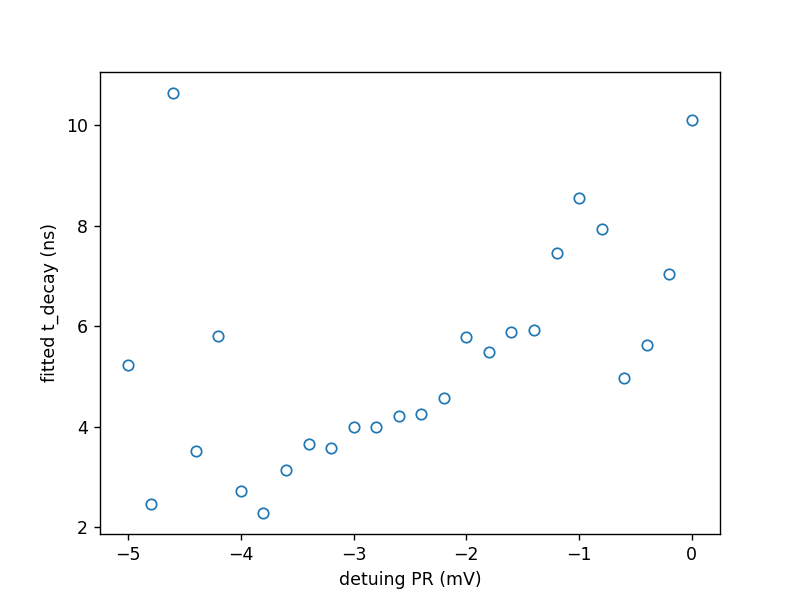

Text(0,0.5,'fitted t_decay (ns)')

In [294]:
fig, ax =plt.subplots()

x = -1.*PR_array
y = fitted_rel_time[:,3]  # Tk from fitted result

ax.plot(x*1000, 1./y ,'o',c= 'C0', mfc='w')  # x mV, y : Tk convert from GHz to mK
ax.set_xlabel('detuing PR (mV)')
ax.set_ylabel('fitted t_decay (ns)')  #fitted Tk (mK)
#ax.set_ylim((0.9,1))

### logarith fit

In [860]:
para_store4 = np.empty((total_num,3))

In [808]:
temp_data['dwell time'].values

array([ 0. ,  0.8,  1.6,  2.4,  3.2,  4. ,  4.8,  5.6,  6.4,  7.2,  8. ,
        8.8,  9.6, 10.4, 11.2, 12. , 12.8, 13.6, 14.4, 15.2, 16. , 16.8,
       17.6, 18.4, 19.2, 20. , 20.8, 21.6, 22.4, 23.2, 24. , 24.8, 25.6,
       26.4, 27.2, 28. , 28.8, 29.6, 30.4, 31.2, 32. , 32.8, 33.6, 34.4,
       35.2, 36. , 36.8, 37.6, 38.4, 39.2, 40. ])

In [826]:
#am, g, off, Tk = (result.best_values[key] for key in model.param_names)
# for key in model.param_names:
#     print result.best_values[key]

result.best_values

{'Tk': 0.1417673460841056,
 'am': 0.1388399452134222,
 'g': 3.648031132730267e-08,
 'off': 0.8316861576354093}

In [433]:
def twoout(a,b):
    aa ,bb = a**2, b**2
    return aa,bb
(c,d) = twoout(3,5)
print d

25


In [438]:
aa = np.array([[1,2,3],[4,5,6]])
bb = np.array([[0.1,0.2],[0.3,0.4],[0.5,0.6]])
np.matmul(aa,bb)

array([[2.2, 2.8],
       [4.9, 6.4]])

In [443]:
aa = np.array([3,4,5,6])
bb = np.array([7,8,9,0])
np.matmul(aa,bb)

98

<IPython.core.display.Javascript object>


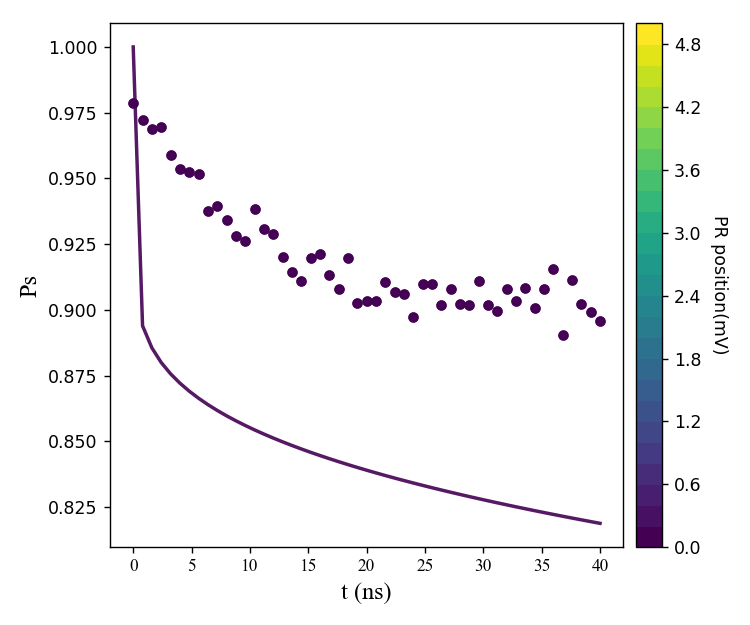

1.0000000021377338 -2.3593993425663484e-10 0.00010000007401853204
190828170837 ,
fitted_rel_time = np. array([[ 1.00000000e+00, -0.00000000e+00,  0.00000000e+00],
       [ 1.00000000e+00, -0.00000000e+00,  0.00000000e+00],
       [-1.12360590e-05, -7.04085814e-05, -1.61268418e-05],
       [-5.36597704e-05,  1.98170202e-05,  8.65808534e-05],
       [ 7.90924018e-05,  8.44632752e-05,  7.63708730e-05],
       [ 5.32260410e-05,  1.73076178e-04,  1.30995520e-04],
       [ 1.40943871e-04,  4.63905215e-05,  9.09209147e-05],
       [ 5.80293049e-05,  7.67536737e-05,  1.75590708e-04],
       [ 1.40989573e-04,  1.05476782e-04, -3.47675358e-07],
       [ 2.19868413e-05,  4.84577923e-05, -5.37286541e-05],
       [ 1.26800000e+00, -1.52000000e-01,  1.00000000e-03],
       [ 3.90450246e-06,  2.33299430e-05,  1.21747877e-04],
       [ 6.22470502e-05, -2.18189144e-05,  1.16904278e-04],
       [ 9.10874673e-05,  2.19480430e-04,  2.87678255e-04],
       [ 1.96743429e-04,  9.10415317e-05,  2.24043623e-04

In [894]:
####  Average fitting of PSave in a array, following 'Single trace' chapter of ps calculation

#temp_data = ex.load_data(190828170837) #170404230959 , h5files()[-1]
#filenames = [170724142000,170724151428,170724153035,170724154403]   ## CL = -1.12V
#filenames = [170725141152,170725143007,170725150128,170725151456]    #  CL = -1.10V
#filenames = [170725173646,170725175727,170725180958,170725183132]    #  CL = -1.08V
#filenames = [170725205611,170725210829,170725211935,170725213332]    #  CL = -1.06V

#filenames = [170816153353,170816154534,170816161422,170816162146]    #  CL = -1.10V after change to AWG7122C

PR_array = temp_data['det_PR'].values*0.001  # mV to V
indexs =  np.flipud(np.arange(1,len(PR_array)+1) )    # np.arange(1,n) = [1,2,.. n-1 ]    to specify the filenames from last
#indexs = np.array([10,9,8,7,6,5,4,3,2,1])
total_num = indexs[0]
init_num = 0
ahead_num = 0                        # how many files are after the series
#indexs = np.arange([0,1,2,3])
#plt.figure(figsize=(10, 8))
n_rows, n_cols = 1,1 #4, 7
fig, axarr = plt.subplots(n_rows, n_cols,figsize=(6,5))  #14,10 dpi=300  # subplots(nrows, ncols, sharex=False, sharey=False, squeeze=True, subplot_kw=None, gridspec_kw=None, **fig_kw)
#f = [[],[],[],[]]
cmap = plt.cm.viridis #plasma
#para_store2 = np.empty((total_num,4))
## new arrays to store all the calculated Ps and fittings
#data_test1 = ex.load_data(h5files()[-(total_num+ahead_num)], load_now = True)
evol_points = len(temp_data['dwell time'])
Ps_ave_array = np.empty([total_num-init_num,evol_points])
Ps_fit_array = np.empty([total_num-init_num,evol_points])
name_array = np.empty(total_num-init_num, dtype = 'S14')
stderr_array = np.empty(total_num-init_num)
#PR_array = np.empty(total_num-init_num)

vec0, slope_vec = np.array([0.00,-0.006]), np.array([-1.0, 0.8])
slope_array = slope_vec * PR_array.reshape(len(PR_array),1) # which is Init_vec in pulse
Initvec_array = vec0 + slope_array

#temp_data = ex.load_data(h5files()[- 1], load_now = True)     # - (4*(index+ahead_num)-3)
#temp_data['hist'] = tk.hist(temp_data.Vrf, axis = -2, range = (-0.008, 0.004))

for index in [26]:        # indexs, np.array([26,25,24,23,22,21,20,15,10,7,5,3,2,1])
    #fn = (index+ahead_num)

    tick_spacing = 0.2
    ## plt.autoscale(enable=True, axis='both', tight=None)
    x = temp_data['dwell time'].values
    y1 = temp_data['psave'].values[total_num-index]
    #print x,y1
    aa = x[0]
    bb = y1[0]
    #print aa,bb

    # plt.figure(figsize = (5.5, 4))

    from lmfit import minimize, Parameters, Parameter, report_fit

    def exp_decay(t, decay_time, offset, amp):
        #bb == amp * np.exp(-aa/decay_time) + offset
        return amp * np.exp(-t/decay_time) + offset

#     def exp_decay_start_fixed(t, decay_time, start, amp):
#         return amp * np.exp(-t/decay_time) + (start - amp)
    
#     def Sz_ani(t, b, a, c, Tk):   # power-law model
#         return b - a*(t*Tk)**c

#     def Sz_longt(am, g, off, Tk, t):  # for t >> 1/Tk  long time limit , from Herbert Schoeller, 2012  PRL 108,260601
#         return am/(t**g) * np.exp(-t*(1.1*Tk)) + off  # Tk normed by h as freq
    #g = 1/2. # g can be 1/2 or 4/5 depending on truncation order

    def Sz_iso(amm, Jz, Tk, t):    # isotropic of AFM case (c =0) is used  from H. Schoeller paper,  short time, 2010 PRL 104,106801
        return amm*(1.0+2*Jz + 1./np.log(Tk*t) )   # logarithmic for short time limit only


    indeces = [int(r*len(y1)) for r in (0., 0.1, 0.8, 0.9)]
    amp = np.mean(y1[indeces[0]:indeces[1]]) - np.mean(y1[indeces[2]:indeces[3]])
    #amp = 0.1
    
    f1, = axarr.plot(x, y1, 'o', markersize = 5,  alpha = 0.9, color = cmap(color_n)  ,label = '')


    model  = lmfit.Model(Sz_iso, independent_vars=['t'])
    result = model.fit(y1[1:], t = x[1:],
                   #S = lmfit.Parameter(value = 1.0), # min = 1.6,max =8.
                   amm = lmfit.Parameter(value = 0.9, max =1./(1.+2*Jz), min =0.1),  #  max: Ps(t=0)  = 1
                   Jz  = lmfit.Parameter(value = -0.1,  max = 0., ),                 #  max = 0.5*(1./amm-1.)
                   Tk =  lmfit.Parameter(value = 0.019, max = 200, min =0.0001 ) )  # Tk in units of 1/ns i.e. GHz, tk in units of ns

    amm, Jz, Tk = (result.best_values[key] for key in model.param_names)  # params in the defined scaling model
    print amm, Jz, Tk
    #params =  { 'decay_time':decay_time, 'offset': offset, 'amp': amp} # motto from Angel, youtube that can be a sigiture sign the offset of the amplitude
    
    #fitting_curve = model.func(x[0:], **{'am': 0.13,'g':g, 'off':off,'Tk':Tk})  # **result.best_values , 
    fitting_curve = Sz_iso(amm, Jz, Tk,x) # 
    
    para_store4[total_num - index] = (round(amm,3), round(Jz,3), round(Tk,3) ) 
    #Ps_ave_array[total_num-index,:] = y3
    #Ps_fit_array[total_num-index,:] = fitting_curve
    name_array[total_num-index] = PR_array[total_num - index] * -1.0 
    #stderr_array[total_num-index] = round(result.params['decay_time'].stderr,3)
    #PR_array[total_num-index] = temp_data.psave['det_PR'].values[total_num - index]
    #name_array.astype(numpy.int64)
    #print(result.fit_report(min_correl=0.25))
    #plt.plot(x, result.best_fit, color = 'darkorange') # 'dodgerblue'  'midnightblue' darkturquoise
    #plt.errorbar(x, y2, yerr= np.std(ps_blocks, axis = 0), fmt = 'o', markersize = 8, markerfacecolor='none') # color = 'skyblue',

    x_expanded = np.linspace(0, 10, 51)
    #colors = ['C0','C1','C2','C4','C5','C6','C7','C8']
    #ax1 = fig.add_subplot(221)
    
    xx = (total_num - index)//n_cols
    yy = (total_num - index)% n_cols
    
    #axarr[0, 0].plot(x, y)
    color_n = (total_num - index)/(total_num*1.0)      # (total_num - index)/(total_num*1.5)+0.2
    f1, = axarr.plot(x, y1, 'o', markersize = 5,  alpha = 0.9, color = cmap(color_n)  ,label = '')
    #f1, = axarr[xx, yy].plot(x, y1, 'o', markersize = 5,  color = cmap(color_n), alpha = 0.9) # color =  'C0',  'skyblue',
    #plt.plot(x, result.best_fit, 's',markersize = 8, color = 'C0')                 # color = 'dodgerblue'
    #x_expanded = np.linspace(0, 50000, np.abs(x[1]-x[0]))       #x_expanded = np.arange(x.min(), 2.*x.max(), np.abs(x[1]-x[0]))
    axarr.plot(x, fitting_curve, linewidth = 2, color = cmap(color_n), alpha =0.9) # 'C1'
    #axarr[xx,yy].plot(x, fitting_curve, linewidth = 2, color = cmap(color_n), alpha =0.9) # 'C1'
   
    plt.xlabel('t (ns)', size = 14, fontname = 'Times New Roman') # style = 'italic'
    #plt.xlabel('(ns)', size = 20, fontname = 'Century')
    plt.ylabel('Ps', size = 14, fontname = 'Times New Roman')
    plt.sca(axarr)  #axarr[xx,yy]          ## plt.sca()  to set current axes of a subplot
    plt.xticks( fontsize=10, rotation=0, fontname = 'Times New Roman')
    #plt.yticks(np.arange(0.6, 1.001, 0.1), fontsize=10, rotation=0, fontname = 'Times New Roman')

    #axarr.text(0.1, 0.8, " PR %s\n Init_vec = %s \n  +%s" %(name_array[total_num-index], vec0, slope_array[total_num-index]), 
    #                   fontsize = 8, fontname = 'Times New Roman',transform=axarr.transAxes)
    #axarr[xx, yy].set(title = temp_data.attrs['filename'])
    #plt.xlim((0,20))
    #plt.ylim((0.3,1.001))
    #plt.autoscale(enable = False, axis='both', tight = True)
    #fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
    #plt.yticks(np.arange(min(y), max(y)+0.01, 0.02)) [f1],
    #leg = axarr[xx, yy].legend( [f1],[" %d PS, jump=%s" %(total_num-index,jump)],prop={'size':8, 'family': 'Times New Roman'}, loc = 0)
    #leg.set_title('%s'%(temp_data.attrs['filename']),prop={'size':8, 'family': 'Times New Roman'})

# for a colorbar legend
norm= mpl.colors.BoundaryNorm(PR_array*1000, 256) #len(PR_array)-1
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm) 
sm.set_array([])
cb = plt.colorbar(sm, pad = 0.02) # , ticks=PR_array
cb.set_label('PR position(mV)', rotation=270, labelpad = 15)

#fig.text(0.45,0.95, 'CL = -1.10 V', size =14)
#leg = plt.legend([f[0], f[1], f[2],f[3]], [" 0 mV", "20mV", "30mV", "40mV"],prop={'size':14, 'family': 'Times New Roman'}, loc = 0)
#leg.set_title('Pulse Amp',prop={'size':14, 'family': 'Times New Roman'})

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w') #;plt.tight_layout(pad = 3.0, w_pad = 0.9, h_pad = 0.8)
fig.tight_layout()
#print para_store 
plt.show()

#print x
#print y2
print temp_data.attrs['filename'],','
print 'fitted_rel_time = np.',repr(para_store4)
print 'fitted_rel_err = np.',repr(stderr_array) #fitting_curve

<IPython.core.display.Javascript object>


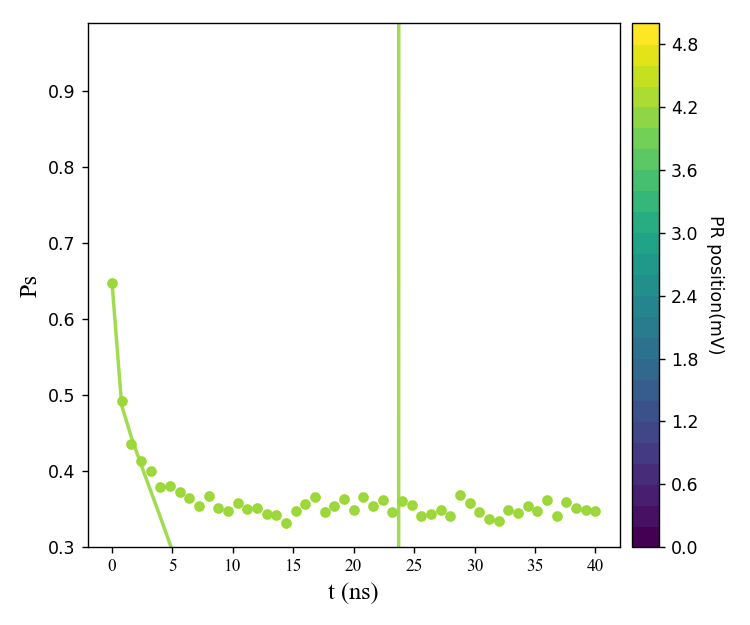

0.5462423999892755 0.6481698722811009 0.04259809438727848
190828170837 ,
fitted_rel_time = np. array([[0.102    , 0.989    , 0.015554 ],
       [0.264    , 0.985    , 0.0101616],
       [0.354    , 0.995    , 0.0096289],
       [0.565    , 0.994    , 0.0055397],
       [0.448    , 1.002    , 0.0099714],
       [0.459    , 0.996    , 0.0098387],
       [0.519    , 0.986    , 0.0116811],
       [0.728    , 0.997    , 0.0093292],
       [0.725    , 0.97     , 0.0109363],
       [0.793    , 0.965    , 0.0107796],
       [0.843    , 0.946    , 0.0102616],
       [0.94     , 0.945    , 0.0112373],
       [0.807    , 0.912    , 0.0151532],
       [0.844    , 0.897    , 0.0160184],
       [0.828    , 0.857    , 0.0157697],
       [0.83     , 0.824    , 0.0146417],
       [0.782    , 0.814    , 0.0173004],
       [0.658    , 0.758    , 0.0188642],
       [0.524    , 0.676    , 0.0211837],
       [0.453    , 0.558    , 0.0239757],
       [0.531    , 0.589    , 0.0212393],
       [0.351    , 0.57

In [997]:
####  Average fitting of PSave in a array, following 'Single trace' chapter of ps calculation

#temp_data = ex.load_data(190828170837) #170404230959 , h5files()[-1]
#filenames = [170724142000,170724151428,170724153035,170724154403]   ## CL = -1.12V
#filenames = [170725141152,170725143007,170725150128,170725151456]    #  CL = -1.10V
#filenames = [170725173646,170725175727,170725180958,170725183132]    #  CL = -1.08V
#filenames = [170725205611,170725210829,170725211935,170725213332]    #  CL = -1.06V

#filenames = [170816153353,170816154534,170816161422,170816162146]    #  CL = -1.10V after change to AWG7122C

PR_array = temp_data['det_PR'].values*0.001  # mV to V
indexs =  np.flipud(np.arange(1,len(PR_array)+1) )    # np.arange(1,n) = [1,2,.. n-1 ]    to specify the filenames from last
#indexs = np.array([10,9,8,7,6,5,4,3,2,1])
total_num = indexs[0]
init_num = 0
ahead_num = 0                        # how many files are after the series
#indexs = np.arange([0,1,2,3])
#plt.figure(figsize=(10, 8))
n_rows, n_cols = 1,1 #4, 7
fig, axarr = plt.subplots(n_rows, n_cols,figsize=(6,5))  #14,10 dpi=300  # subplots(nrows, ncols, sharex=False, sharey=False, squeeze=True, subplot_kw=None, gridspec_kw=None, **fig_kw)
#f = [[],[],[],[]]
cmap = plt.cm.viridis #plasma
#para_store2 = np.empty((total_num,4))
## new arrays to store all the calculated Ps and fittings
#data_test1 = ex.load_data(h5files()[-(total_num+ahead_num)], load_now = True)
evol_points = len(temp_data['dwell time'])
Ps_ave_array = np.empty([total_num-init_num,evol_points])
Ps_fit_array = np.empty([total_num-init_num,evol_points])
name_array = np.empty(total_num-init_num, dtype = 'S14')
stderr_array = np.empty(total_num-init_num)
#PR_array = np.empty(total_num-init_num)

vec0, slope_vec = np.array([0.00,-0.006]), np.array([-1.0, 0.8])
slope_array = slope_vec * PR_array.reshape(len(PR_array),1) # which is Init_vec in pulse
Initvec_array = vec0 + slope_array

#temp_data = ex.load_data(h5files()[- 1], load_now = True)     # - (4*(index+ahead_num)-3)
#temp_data['hist'] = tk.hist(temp_data.Vrf, axis = -2, range = (-0.008, 0.004))




for index in [4]:        # indexs, np.array([26,25,24,23,22,21,20,15,10,7,5,3,2,1])
    end = 4
    #fn = (index+ahead_num)

    tick_spacing = 0.2
    ## plt.autoscale(enable=True, axis='both', tight=None)
    x = temp_data['dwell time'].values
    y1 = temp_data['psave'].values[total_num-index]
    #print x,y1
    aa = x[0]
    bb = y1[0]
    #print aa,bb

    # plt.figure(figsize = (5.5, 4))

    from lmfit import minimize, Parameters, Parameter, report_fit

    def exp_decay(t, decay_time, offset, amp):
        #bb == amp * np.exp(-aa/decay_time) + offset
        return amp * np.exp(-t/decay_time) + offset

#     def exp_decay_start_fixed(t, decay_time, start, amp):
#         return amp * np.exp(-t/decay_time) + (start - amp)
    
#     def Sz_ani(t, b, a, c, Tk):   # power-law model
#         return b - a*(t*Tk)**c

#     def Sz_longt(am, g, off, Tk, t):  # for t >> 1/Tk  long time limit , from Herbert Schoeller, 2012  PRL 108,260601
#         return am/(t**g) * np.exp(-t*(1.1*Tk)) + off  # Tk normed by h as freq
    #g = 1/2. # g can be 1/2 or 4/5 depending on truncation order

    def Sz_iso(amm, Jz, Tk, t):    # isotropic of AFM case (c =0) is used  from H. Schoeller paper,  short time, 2010 PRL 104,106801
        return amm/np.log(Tk*t) + Jz   # logarithmic for short time limit only


    indeces = [int(r*len(y1)) for r in (0., 0.1, 0.8, 0.9)]
    amp = np.mean(y1[indeces[0]:indeces[1]]) - np.mean(y1[indeces[2]:indeces[3]])
    #amp = 0.1
    
    f1, = axarr.plot(x, y1, 'o', markersize = 5,  alpha = 0.9, color = cmap(color_n)  ,label = '')

    model  = lmfit.Model(Sz_iso, independent_vars=['t'])
    result = model.fit(y1[0:end], t = x[0:end],
                   #S = lmfit.Parameter(value = 1.0), # min = 1.6,max =8.
                   amm = lmfit.Parameter(value = 0.9,  min =0.1),  #  max: Ps(t=0)  = 1
                   Jz  = lmfit.Parameter(value = 0.9,  min = 0., ),                         #  max = 0.5*(1./amm-1.)
                   Tk =  lmfit.Parameter(value = 0.01, max = 200, min =0.0000001 ) )  # Tk in units of 1/ns i.e. GHz, tk in units of ns

    amm, Jz, Tk = (result.best_values[key] for key in model.param_names)
    print amm, Jz, Tk
    #params =  { 'decay_time':decay_time, 'offset': offset, 'amp': amp}
    
    #fitting_curve = model.func(x[0:], **{'am': 0.13,'g':g, 'off':off,'Tk':Tk})  # **result.best_values
    fitting_curve = Sz_iso(amm, Jz, Tk,x)
    
    para_store4[total_num - index] = (round(amm,3), round(Jz,3), round(Tk,7) ) 
    #Ps_ave_array[total_num-index,:] = y3
    #Ps_fit_array[total_num-index,:] = fitting_curve
    name_array[total_num-index] = PR_array[total_num - index] * -1.0 
    #stderr_array[total_num-index] = round(result.params['decay_time'].stderr,3)
    #PR_array[total_num-index] = temp_data.psave['det_PR'].values[total_num - index]
    #name_array.astype(numpy.int64)
    #print(result.fit_report(min_correl=0.25))
    #plt.plot(x, result.best_fit, color = 'darkorange') # 'dodgerblue'  'midnightblue' darkturquoise
    #plt.errorbar(x, y2, yerr= np.std(ps_blocks, axis = 0), fmt = 'o', markersize = 8, markerfacecolor='none') # color = 'skyblue',

    x_expanded = np.linspace(0, 10, 51)
    #colors = ['C0','C1','C2','C4','C5','C6','C7','C8']
    #ax1 = fig.add_subplot(221)
    
    xx = (total_num - index)//n_cols
    yy = (total_num - index)% n_cols
    
    #axarr[0, 0].plot(x, y)
    color_n = (total_num - index)/(total_num*1.0)      # (total_num - index)/(total_num*1.5)+0.2
    f1, = axarr.plot(x, y1, 'o', markersize = 5,  alpha = 0.9, color = cmap(color_n)  ,label = '')
    #f1, = axarr[xx, yy].plot(x, y1, 'o', markersize = 5,  color = cmap(color_n), alpha = 0.9) # color =  'C0',  'skyblue',
    #plt.plot(x, result.best_fit, 's',markersize = 8, color = 'C0')                 # color = 'dodgerblue'
    #x_expanded = np.linspace(0, 50000, np.abs(x[1]-x[0]))       #x_expanded = np.arange(x.min(), 2.*x.max(), np.abs(x[1]-x[0]))
    axarr.plot(x, fitting_curve, linewidth = 2, color = cmap(color_n), alpha =0.9) # 'C1'
    #axarr[xx,yy].plot(x, fitting_curve, linewidth = 2, color = cmap(color_n), alpha =0.9) # 'C1'
   
    plt.xlabel('t (ns)', size = 14, fontname = 'Times New Roman') # style = 'italic'
    #plt.xlabel('(ns)', size = 20, fontname = 'Century')
    plt.ylabel('Ps', size = 14, fontname = 'Times New Roman')
    plt.sca(axarr)  #axarr[xx,yy]          ## plt.sca()  to set current axes of a subplot
    plt.xticks( fontsize=10, rotation=0, fontname = 'Times New Roman')
    #plt.yticks(np.arange(0.6, 1.001, 0.1), fontsize=10, rotation=0, fontname = 'Times New Roman')

    #axarr.text(0.1, 0.8, " PR %s\n Init_vec = %s \n  +%s" %(name_array[total_num-index], vec0, slope_array[total_num-index]), 
    #                   fontsize = 8, fontname = 'Times New Roman',transform=axarr.transAxes)
    #axarr[xx, yy].set(title = temp_data.attrs['filename'])
    #plt.xlim((0,20))
    plt.ylim((0.3,0.99))
    #plt.autoscale(enable = False, axis='both', tight = True)
    #fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
    #plt.yticks(np.arange(min(y), max(y)+0.01, 0.02)) [f1],
    #leg = axarr[xx, yy].legend( [f1],[" %d PS, jump=%s" %(total_num-index,jump)],prop={'size':8, 'family': 'Times New Roman'}, loc = 0)
    #leg.set_title('%s'%(temp_data.attrs['filename']),prop={'size':8, 'family': 'Times New Roman'})

# for a colorbar legend
norm= mpl.colors.BoundaryNorm(PR_array*1000, 256) #len(PR_array)-1
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm) 
sm.set_array([])
cb = plt.colorbar(sm, pad = 0.02) # , ticks=PR_array
cb.set_label('PR position(mV)', rotation=270, labelpad = 15)

#fig.text(0.45,0.95, 'CL = -1.10 V', size =14)
#leg = plt.legend([f[0], f[1], f[2],f[3]], [" 0 mV", "20mV", "30mV", "40mV"],prop={'size':14, 'family': 'Times New Roman'}, loc = 0)
#leg.set_title('Pulse Amp',prop={'size':14, 'family': 'Times New Roman'})

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w') #;plt.tight_layout(pad = 3.0, w_pad = 0.9, h_pad = 0.8)
fig.tight_layout()
#print para_store 
plt.show()

#print x
#print y2
print temp_data.attrs['filename'],','
print 'fitted_rel_time = np.',repr(para_store4)
print 'fitted_rel_err = np.',repr(stderr_array) #fitting_curve

In [847]:
indexs

array([26, 25, 24, 23, 22, 21, 20, 19, 18, 17, 16, 15, 14, 13, 12, 11, 10,
        9,  8,  7,  6,  5,  4,  3,  2,  1])

In [998]:
# fit result of logarithmic    amm/np.log(Tk*t) + Jz

# amm = lmfit.Parameter(value = 0.9,  min =0.1),  #  max: Ps(t=0)  = 1
# Jz  = lmfit.Parameter(value = 0.9,  min = 0., ),                         #  max = 0.5*(1./amm-1.)
# Tk =  lmfit.Parameter(value = 0.01, max = 200, min =0.0000001 ) )  # Tk in units of 1/ns i.e. GHz, tk in units of ns

# para: amm, Jz,  Tk

# fit from x[0] to x[-1],   file , 190828170837 ,
fitted_rel_time = np. array([[1.0000e-01, 9.7100e-01, 7.2523e-03],
       [5.5600e-01, 9.9200e-01, 1.0333e-03],
       [7.5400e-01, 1.0000e+00, 7.4000e-04],
       [1.0860e+00, 9.9600e-01, 3.6830e-04],
       [9.0200e-01, 1.0160e+00, 1.3831e-03],
       [8.9700e-01, 1.0110e+00, 1.4896e-03],
       [1.1370e+00, 1.0040e+00, 1.2339e-03],
       [1.5400e+00, 1.0100e+00, 7.7230e-04],
       [1.7430e+00, 9.8800e-01, 5.5100e-04],
       [1.9960e+00, 9.8100e-01, 3.4850e-04],
       [2.1030e+00, 9.6400e-01, 3.2410e-04],
       [2.6180e+00, 9.5900e-01, 1.5230e-04],
       [2.4870e+00, 9.2600e-01, 1.8100e-04],
       [2.8100e+00, 9.1300e-01, 9.8100e-05],
       [2.8010e+00, 8.7100e-01, 7.7000e-05],
       [2.8930e+00, 8.3700e-01, 4.3500e-05],
       [2.8210e+00, 8.2400e-01, 4.8500e-05],
       [2.4150e+00, 7.6600e-01, 6.2900e-05],
       [2.0520e+00, 6.8100e-01, 4.7000e-05],
       [2.6060e+00, 5.5800e-01, 1.0000e-07],
       [2.7350e+00, 5.9200e-01, 4.0000e-07],
       [2.2090e+00, 5.7500e-01, 1.7000e-06],
       [3.6680e+00, 6.5200e-01, 2.0000e-07],
       [2.4050e+00, 5.8700e-01, 1.9000e-06],
       [2.1170e+00, 5.1600e-01, 2.0000e-07],
       [7.0300e-01, 4.2600e-01, 1.9100e-05]])

# fit from x[0] to  (last trace )x[6], .. (1st trace)x[26] , ie. only short time,    file , 190828170837 ,
fitted_rel_time = np. array([[0.102    , 0.989    , 0.015554 ],
       [0.264    , 0.985    , 0.0101616],
       [0.354    , 0.995    , 0.0096289],
       [0.565    , 0.994    , 0.0055397],
       [0.448    , 1.002    , 0.0099714],
       [0.459    , 0.996    , 0.0098387],
       [0.519    , 0.986    , 0.0116811],
       [0.728    , 0.997    , 0.0093292],
       [0.725    , 0.97     , 0.0109363],
       [0.793    , 0.965    , 0.0107796],
       [0.843    , 0.946    , 0.0102616],
       [0.94     , 0.945    , 0.0112373],
       [0.807    , 0.912    , 0.0151532],
       [0.844    , 0.897    , 0.0160184],
       [0.828    , 0.857    , 0.0157697],
       [0.83     , 0.824    , 0.0146417],
       [0.782    , 0.814    , 0.0173004],
       [0.658    , 0.758    , 0.0188642],
       [0.524    , 0.676    , 0.0211837],
       [0.641    , 0.559    , 0.0069175],
       [0.732    , 0.59     , 0.0066212],
       [0.606    , 0.572    , 0.008119 ],
       [0.903    , 0.649    , 0.007738 ],
       [0.558    , 0.585    , 0.0163477],
       [0.404    , 0.514    , 0.0185119],
       [0.137    , 0.424    , 0.0378672]])

# x[0] to from x[4], x[5]  to x[26],  ie. only short time range 
fitted_rel_time = np. array([[0.102    , 0.989    , 0.015554 ],
       [0.264    , 0.985    , 0.0101616],
       [0.354    , 0.995    , 0.0096289],
       [0.565    , 0.994    , 0.0055397],
       [0.448    , 1.002    , 0.0099714],
       [0.459    , 0.996    , 0.0098387],
       [0.519    , 0.986    , 0.0116811],
       [0.728    , 0.997    , 0.0093292],
       [0.725    , 0.97     , 0.0109363],
       [0.793    , 0.965    , 0.0107796],
       [0.843    , 0.946    , 0.0102616],
       [0.94     , 0.945    , 0.0112373],
       [0.807    , 0.912    , 0.0151532],
       [0.844    , 0.897    , 0.0160184],
       [0.828    , 0.857    , 0.0157697],
       [0.83     , 0.824    , 0.0146417],
       [0.782    , 0.814    , 0.0173004],
       [0.658    , 0.758    , 0.0188642],
       [0.524    , 0.676    , 0.0211837],
       [0.453    , 0.558    , 0.0239757],
       [0.531    , 0.589    , 0.0212393],
       [0.351    , 0.572    , 0.0466019],
       [0.546    , 0.648    , 0.0425981],
       [0.357    , 0.584    , 0.0574142],
       [0.353    , 0.513    , 0.0289065],
       [0.118    , 0.423    , 0.0547685]])



In [716]:
fitted_rel_time[:,3]

array([ 3.86 ,  7.651,  9.029,  9.808,  8.512,  9.5  ,  4.553,  9.983,
       10.   ,  9.997,  9.912, 10.   ,  9.952,  9.749,  9.979,  9.999,
        9.987,  9.982,  9.974,  9.93 ,  9.997, 10.   ,  9.955,  9.999,
        9.99 ,  7.459])

<IPython.core.display.Javascript object>


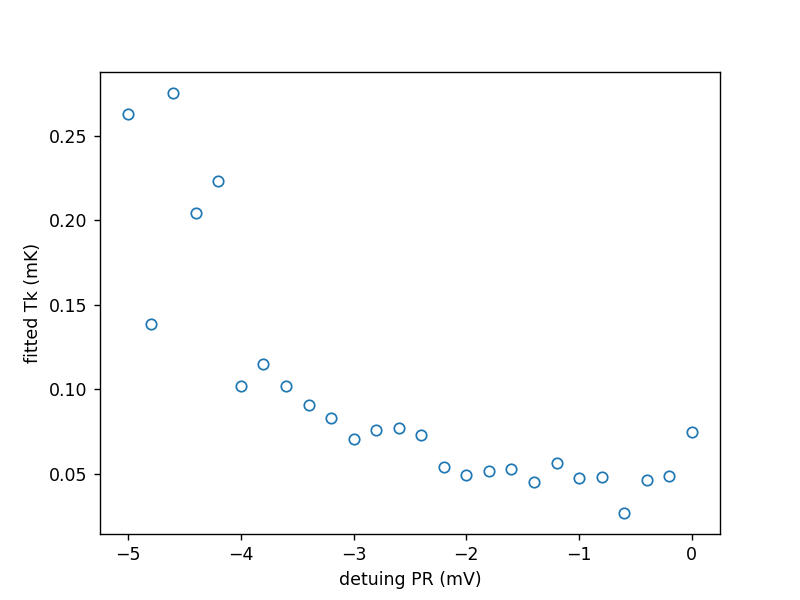

Text(0,0.5,'fitted Tk (mK)')

In [999]:
fig, ax =plt.subplots()

x = -1.*PR_array
y = fitted_rel_time[:,2]  # Tk from fitted result

ax.plot(x*1000, y*4.8 ,'o',c= 'C0', mfc='w')  # x mV, y : Tk convert from GHz to mK
ax.set_xlabel('detuing PR (mV)')
ax.set_ylabel('fitted Tk (mK)')  #fitted Tk (mK)
#ax.set_ylim((0.9,1))

### fitted_time store

In [436]:
'''  0508
fitted_rel_time =  np.array([  1.01010000e+04,   6.93310000e+03,   3.98770000e+03,
         1.52490000e+03,   1.94000000e+02,   4.84000000e+01,
         9.00000000e+00])
fitted_rel_err =  np.array([  5.11600000e+02,   8.20200000e+02,   5.82600000e+02,
         2.26900000e+02,   1.20000000e+01,   2.40000000e+00,
         6.00000000e-01])
'''
### 180608193648 - 194246    in clockade 2nd order
# fitted_rel_time = np.array([ 15840.6,  15806.8,  11221.1,   4529.9,   5537.8,   3808.4,   4103.2])
# fitted_rel_err =  np.array([ 715.6,  770.5,  263.4,  187.5,  226.6,  175.1,  213.2])

### 180608201823 - 202314    on transition line, 1st order
#fitted_rel_time = np. array([ 1.67,  0.98,  0.6 ,  0.46,  0.43,  0.35,  0.27]) 
#fitted_rel_err = np. array([ 0.148,  0.119,  0.05 ,  0.043,  0.027,  0.029,  0.03 ])

# 180611162700 - 163415    2nd order vs detuning, Init_vec = (0.006,-0.010) + 
#fitted_rel_time = np. array([ 13818.15,   9249.17,  10910.16,   8612.69,   4052.84,   5211.02, 3403.  ]) 
#fitted_rel_err = np. array([ 765.842,  470.359,  567.919,  339.561,  135.068,  232.538,  140.97 ])

# 180611170616 - 171329    2nd order vs detuning, repeat of last  
#fitted_rel_time = np. array([ 14935.95,   8757.16,  11672.19,   7534.2 ,   3780.4 ,   4969.08, 3651.84]) 
#fitted_rel_err = np. array([ 675.311,  570.865,  714.867,  278.252,  145.504,  243.992,  273.364])

# 180611173619 - 174218, 2nd order vs detuning, Init_vec = (0.004,-0.010) + np.lin(0,0.012,7)*(1,-2.1)
#fitted_rel_time = np. array([ 4171.55,  1776.94,  1143.38,  1672.17,   457.6 ,   390.63,   540.05]) 
#fitted_rel_err = np. array([ 206.731,  180.084,   94.606,   81.75 ,   44.562,   66.728,   59.098])

# 180611182146 - 182844  ,2nd order vs detuning, Init_vec = (0.004,-0.010) + np.lin(0,0.014,8)*(1,-2.1)
# fitted_rel_time = np. array([ 3767.64,  2232.97,  3095.96,  1728.92,   571.64,  1246.9 ,   653.97, 183.66]) 
# fitted_rel_err = np. array([ 172.602,  202.79 ,  266.054,  111.579,   55.976,  175.214,   93.137, 100])

# repeat 
#fitted_rel_time = np. array([ 4269.54,  2034.26,  2886.9 ,  1627.05,   438.11,  1487.47, 459.66,    58.87]) 
#fitted_rel_err = np. array([ 276.199,  135.433,  223.829,  119.344,   47.879,  458.376, 116.434,   24.665])

## 180611205629 - 210525  ,2nd order vs detuning, Init_vec = (0.004,-0.010) + np.lin(0,0.014,8)*(1,-2.1)
#fitted_rel_time = np. array([ 4015.35,  2089.35,  3354.15,  1817.77,   435.05,  1096.58,  511.23,  50.17])
#fitted_rel_err = np. array([ 162.187,   88.115,  191.493,  120.722,   54.881,  225.249, 67.848,  19.006])


## 180815212049, 2nd order vs detuning near 0, Init_vec = (0., 0.) +[1.,-2.]*np.linspace(0.00, 0.008, 21).reshape(21,1)
# fitted_rel_time = np. array([ 326.05,  173.54,  103.74,  288.87,  340.87,  296.06,  352.19,
#         321.89,  337.71,  291.77,  345.97,  268.64,  168.16,  218.79,
#         148.42,  205.11,  142.18,  202.72,  137.34,  193.81,   96.  ]) 
# fitted_rel_err = np. array([ 22.157,   6.258,   8.952,  19.105,  30.201,  19.848,  19.992,
#         18.924,  26.614,  14.964,  24.018,  14.804,  10.376,  12.579,
#          8.906,  11.072,   7.232,   9.724,   7.114,  14.131,   7.03 ])

## 180816154233, 2nd order vs detuning near 0, Init_vec = (0., 0.) +[1.,-2.]*np.linspace(0.00, 0.008, 21).reshape(21,1) repeat of last one
# fitted_rel_time = np. array([ 842.68,  310.67,  387.28,  118.05,  234.68,  233.31,  339.99,
#         224.49,  391.16,  244.46,  316.86,  196.29,  167.63,  168.05,
#         127.  ,  172.72,   98.19,  144.23,   84.81,  122.73,   35.  ]) 
# fitted_rel_err = np. array([ 215.524,   19.684,   26.024,    6.833,   14.703,   17.683,
#          27.887,   14.055,   36.203,   11.682,   19.73 ,    6.162,
#           7.155,    8.198,    6.713,    8.434,    4.785,    9.15 ,
#           7.326,    7.409,    3.38 ])

## 180816171242, 2nd order vs detuning near 0, Init_vec = (0., 0.) +[1.,-2.]*np.linspace(0.00, 0.008, 21).reshape(21,1) repeat of last one
# fitted_rel_time = np. array([ 535.9 ,  397.15,  171.71,  155.69,  711.22,  393.68,  630.83,
#         395.68,  556.11,  387.26,  391.19,  348.79,  201.67,  274.12,
#         216.09,  296.46,  238.08,  289.44,  206.36,  219.95,  118.76]) 
# fitted_rel_err = np. array([ 47.418,  13.231,   9.508,   9.006,  50.655,  14.585,  31.113,
#         13.619,  30.575,  18.985,  20.739,  13.782,   7.174,  13.691,
#          8.088,  14.219,   6.446,  13.455,   7.929,   8.545,   8.254])

# 180816172631, 2nd order vs detuning near 0, Init_vec = (0., 0.) +[1.,-2.]*np.linspace(0.00, 0.008, 21).reshape(21,1) repeat of last one
# fitted_rel_time = np. array([  2.05879000e+03,   2.86890000e+02,   3.91390000e+02,
#          1.64340000e+02,   8.69800000e+01,   6.62600000e+01,
#          1.68290000e+02,   1.04040000e+02,   1.25850000e+02,
#          7.66400000e+01,   1.38280000e+02,   5.49200000e+01,
#          4.10100000e+01,   6.32200000e+01,   3.83500000e+01,
#          5.31000000e+01,   3.86000000e+01,   4.88400000e+01,
#          1.94800000e+01,   1.71000000e+00,   2.02800000e+01]) 
# fitted_rel_err = np. array([  3.54312800e+03,   2.27430000e+01,   3.90800000e+01,
#          8.39900000e+00,   1.08200000e+01,   6.27400000e+00,
#          9.58500000e+00,   8.62200000e+00,   1.34190000e+01,
#          3.33400000e+00,   1.05290000e+01,   3.80600000e+00,
#          5.04200000e+00,   6.69300000e+00,   4.70500000e+00,
#          5.46000000e+00,   4.25600000e+00,   5.03900000e+00,
#          7.93200000e+00,   0.00000000e+00,   4.90300000e+00])


# 180816204253, 2nd order vs detuning near 0, Init_vec = (0., 0.) +[1.,-2.]*np.linspace(0.00, 0.008, 21).reshape(21,1) repeat of last one

# fitted_rel_time = np. array([ 306.07,  297.91,  265.68,  235.77,  466.11,  369.68,  399.13,
#         320.6 ,  421.01,  290.31,  423.87,  260.66,  216.57,  277.47,
#         181.97,  265.53,  181.15,  218.64,  153.75,  209.04,  119.96]) 
# fitted_rel_err = np. array([ 26.756,  13.602,  18.23 ,  13.07 ,  36.015,  17.023,  25.167,
#         17.591,  24.156,  10.955,  17.676,  17.238,  10.046,  15.433,
#          6.314,  10.059,   8.247,  12.402,   7.055,   8.417,   6.474])



# 180816204253, 2nd order vs detuning near 0, Init_vec = (0., 0.) +[1.,-2.]*np.linspace(0.00, 0.008, 21).reshape(21,1) repeat of last one
fitted_rel_time = np. array([ 316.36,  300.61,  264.89,  233.99,  468.57,  371.02,  400.86,
        316.23,  420.41,  287.44,  422.63,  261.81,  218.82,  273.74,
        180.5 ,  265.39,  184.98,  217.96,  151.96,  209.25,  119.68]) 
fitted_rel_err = np. array([ 28.696,  14.27 ,  17.645,  12.85 ,  35.636,  16.991,  26.526,
        17.293,  23.551,  11.192,  17.478,  17.181,  10.282,  15.49 ,
         6.449,  10.584,   8.069,  11.68 ,   7.28 ,   8.016,   6.986])

# 180816205641 ,
fitted_rel_time = np. array([ 501.07,  305.3 ,  284.35,  247.62,  505.91,  373.59,  494.57,
        349.33,  677.81,  340.  ,  403.38,  307.02,  244.56,  299.97,
        219.66,  223.85,  215.49,  240.61,  163.67,  221.73,   99.53]) 
fitted_rel_err = np. array([  78.871,   13.171,   18.81 ,   20.797,   22.496,   11.671,
         22.442,   14.02 ,  108.323,   14.227,   20.116,   14.994,
          9.418,   12.66 ,    9.011,   13.207,    6.033,   13.645,
          9.022,   12.26 ,    7.198])


#180816210637 ,
fitted_rel_time = np. array([ 341.34,  343.66,  237.27,  208.15,  472.47,  421.37,  512.31,
        420.72,  512.29,  439.7 ,  418.14,  299.43,  225.75,  258.89,
        225.46,  257.03,  197.07,  241.5 ,  164.94,  182.22,   81.01]) 
fitted_rel_err = np. array([ 31.431,  20.688,  12.139,  15.874,  19.199,  25.891,  39.068,
        19.115,  36.698,  25.266,  18.509,  15.594,   8.634,  13.836,
         9.316,  15.933,   9.509,  14.858,   7.195,  10.8  ,   5.12 ])


#180816211632 ,  Init_vec = (-0.00, -0.00) +[1.,-2.]*np.linspace(0.00, 0.008, 21).reshape(21,1) 
fitted_rel_time = np. array([ 423.51,  267.63,  256.  ,  196.37,  459.67,  452.39,  499.29,
        407.25,  538.27,  401.31,  410.63,  326.96,  192.43,  306.48,
        187.49,    0.69,  182.08,  222.5 ,  146.45,  183.43,   80.11]) 
fitted_rel_err = np. array([ 53.157,  13.404,  15.576,  13.812,  32.148,  27.497,  31.809,
        15.807,  56.247,  19.634,  20.454,  16.361,   8.59 ,  15.339,
         6.841,   0.   ,  10.263,  16.151,   8.821,  11.908,   7.25 ])


#180817155051 ,2nd order vs detuning near 0, Init_vec = (-0.0012, -0.0004) +[1.,-2.]*np.linspace(0.00, 0.008, 21).reshape(21,1) repeat of last one
fitted_rel_time = np. array([ 993.53,  233.49,   76.48,  217.5 ,  156.94,  201.13,  135.18,
        188.93,  150.16,  199.37,  128.11,  178.42,  116.44,  134.32,
         99.12,  107.61,  148.29,   88.57,  141.46,   96.09,   64.55])
fitted_rel_err = np. array([ 837.356,   15.193,    3.721,   23.196,   11.684,   16.718,
          9.066,   12.793,    8.003,   13.216,    6.615,   14.562,
          6.344,    6.347,    4.72 ,    4.717,    8.397,    5.152,  8.129,    5.828,    6.517])

#180817160047 , Init_vec = (-0.0012, -0.0004) +[1.,-2.]*np.linspace(0.00, 0.008, 21).
fitted_rel_time = np. array([ 776.81,  259.34,  101.37,  277.73,  192.57,  267.14,  205.41,
        252.59,  160.14,  225.85,  142.3 ,  196.55,  133.39,  152.48,
        109.93,  107.76,  130.2 ,  100.96,  132.86,   78.59,   70.98])
fitted_rel_err = np. array([ 681.271,   22.26 ,    4.727,   29.833,   10.692,   26.584,
         12.526,   22.774,    8.32 ,   15.541,    5.538,   15.548,
          6.604,    7.429,    6.915,    5.029,    6.417,    4.468,    8.178,    4.101,    5.855])

#180817161043 , as above
fitted_rel_time = np. array([ 1494.59,   232.88,    92.48,   246.93,   223.98,   269.21,
         200.32,   242.38,   195.15,   193.22,   149.07,   189.62,
         143.28,   178.58,    97.23,   102.18,   135.47,    79.15,
         137.51,    82.27,    81.38])
fitted_rel_err = np. array([ 1942.007,    17.7  ,     3.954,    29.721,    21.33 ,    26.622,
          14.31 ,    21.535,    12.039,    14.018,     7.618,    10.82 ,
           8.578,    13.673,     4.16 ,     4.88 ,     7.959,     4.076,   9.213,     4.062,     6.512])


# 180817173025 , Init_vec = (-0.0020, -0.0008) +[1.,-2.]*np.linspace(0.00, 0.008, 21).
fitted_rel_time = np. array([ 186.4 ,  121.34,   18.51,   77.85,   33.33,   68.49,   23.74,
         57.99,   22.98,   53.79,   45.18,   86.39,   44.52,   88.17,
         41.02,   59.59,   29.29,   10.87,   26.22,    7.97,   14.85])
fitted_rel_err = np. array([ 24.378,   6.066,   1.351,   4.09 ,   1.886,   3.754,   1.774,
         2.208,   1.585,   3.318,   2.116,   5.923,   1.962,   5.853,
         2.899,   3.509,   2.603,   1.653,   2.464,   1.675,   2.833])

#180817174021 , Init_vec = (-0.0020, -0.0008) +[1.,-2.]*np.linspace(0.00, 0.008, 21).
fitted_rel_time = np. array([ 247.28,  136.64,   20.63,   75.43,   39.61,   67.35,   28.11,
         56.28,   29.  ,   55.32,   54.62,   92.7 ,   46.8 ,   86.23,
         40.54,   66.96,   32.47,   11.7 ,   22.41,    0.52,   24.47])
fitted_rel_err = np. array([ 36.725,   5.617,   2.021,   2.734,   1.943,   3.532,   1.094,
         2.192,   1.26 ,   1.951,   2.409,   6.94 ,   2.646,   5.705,
         2.562,   4.432,   2.751,   1.277,   1.612,   0.   ,   4.355])

# 180817175018 , Init_vec = (-0.0020, -0.0008) +[1.,-2.]*np.linspace(0.00, 0.008, 21)
fitted_rel_time = np. array([ 248.18,  123.43,   21.01,   77.61,   45.64,   82.95,   31.93,
         61.85,   31.84,   54.97,   52.8 ,   99.73,   68.75,  131.03,
         71.7 ,  107.94,   55.84,   30.21,   51.07,   10.03,   43.95])
fitted_rel_err = np. array([ 30.999,   2.875,   1.683,   3.539,   1.637,   3.108,   1.944,
         2.47 ,   1.816,   2.441,   2.446,   5.69 ,   2.75 ,   7.66 ,
         2.461,   7.733,   3.255,   1.285,   2.235,   1.446,   3.595])

# 181107201659  , 1st order on R transi line (1, -1.40), to estimate Gamma_R, 
# PR_array = np.linspace(0.0, 0.008, 17)
# Tran_vec = np.array([-0.0038, -0.0040]) + np.array([1., -1.40])*PR_array.reshape(17,1)
# Tran_array = Cent_po - Me_po + Tran_vec

fitted_rel_time = np. array([17.91, 10.42,  6.45,  4.87,  5.32,  4.75,  3.83,  3.57,  3.75,
        3.77,  3.45,  3.51,  3.33,  3.59,  3.36,  3.65,  3.49]) 
fitted_rel_err = np. array([3.484, 1.333, 0.533, 0.382, 0.412, 0.36 , 0.243, 0.182, 0.186,
       0.168, 0.162, 0.161, 0.133, 0.179, 0.154, 0.185, 0.169])


# 181108165619 , similar as above, large PR range, 1st order on R transi line (1, -1.50), to estimate Gamma_R, 
# PR_array = np.linspace(0.0, 0.020, 51)
# Tran_vec = np.array([-0.0040, -0.0040]) + np.array([1., -1.50])*PR_array.reshape(51,1)
# Tran_array = Cent_po - Me_po + Tran_vec
fitted_rel_time = np. array([5.91, 4.71, 3.81, 2.99, 2.68, 2.63, 2.5 , 2.36, 2.43, 2.23, 2.07,
       2.19, 2.05, 2.02, 2.09, 1.96, 1.95, 1.86, 1.87, 1.87, 1.81, 1.8 ,
       1.76, 1.78, 1.67, 1.72, 1.72, 1.66, 1.71, 1.62, 1.69, 1.65, 1.55,
       1.5 , 1.64, 1.57, 1.6 , 1.45, 1.43, 1.47, 1.44, 1.44, 1.46, 1.43,
       1.42, 1.38, 1.39, 1.41, 1.37, 1.3 , 1.37]) 
fitted_rel_err = np. array([0.464, 0.282, 0.239, 0.152, 0.133, 0.127, 0.118, 0.094, 0.104,
       0.089, 0.072, 0.074, 0.078, 0.07 , 0.082, 0.068, 0.076, 0.067,
       0.065, 0.069, 0.07 , 0.063, 0.059, 0.064, 0.065, 0.068, 0.067,
       0.064, 0.068, 0.074, 0.059, 0.062, 0.07 , 0.056, 0.068, 0.062,
       0.062, 0.061, 0.052, 0.051, 0.06 , 0.064, 0.059, 0.052, 0.054,
       0.055, 0.065, 0.057, 0.055, 0.052, 0.051])

# 181108183242, 2nd order with vec0 (from center)=[-0.0025,-0.0025], then slope_vec parallel to R line 
# slope_vec = np.array([1, -1.50])*np.linspace(0.00, 0.016, 41).reshape(41,1)
# Init_vec = vec0 + slope_vec
# Init = Cent_po - Me_po + Init_vec

fitted_rel_time = np. array([ 881.54, 1056.75,  900.8 ,  401.6 ,  461.96,  534.99,  519.44,
        597.65,  506.01,  504.39,  366.39,  190.59,  162.29,  191.32,
        241.43,  195.09,  310.32,  398.62,  280.86,  269.25,  172.7 ,
        184.14,  206.53,  149.64,  154.15,  133.51,   96.37,   97.36,
        102.32,   76.68,   91.18,   70.5 ,   50.65,   68.9 ,  136.52,
        127.26,  106.98,   93.92,   93.64,   46.62,   79.33]) 
fitted_rel_err = np. array([ 76.286, 100.362,  57.095,  14.499,  14.778,  31.381,  23.706,
        24.82 ,  36.523,  39.446,  22.283,   4.111,   4.15 ,   5.603,
         8.82 ,   6.535,  12.992,  18.56 ,   9.897,  10.606,   7.069,
         8.335,   9.999,   5.963,   8.022,   6.294,   4.193,   4.244,
         4.718,   2.697,   3.964,   3.279,   2.359,   4.134,  11.08 ,
         9.346,   8.17 ,   5.893,   7.785,   2.481,   5.179])

#181108210452 (repeat1 of last), 2nd order with vec0 (from center)=[-0.0025,-0.0025], then slope_vec parallel to R line 
# slope_vec = np.array([1, -1.50])*np.linspace(0.00, 0.016, 41).reshape(41,1)
# Init_vec = vec0 + slope_vec
# Init = Cent_po - Me_po + Init_vec

fitted_rel_time = np. array([514.22, 782.79, 418.56, 420.41, 639.91, 544.93, 418.74, 425.52,
       223.49, 399.6 , 123.77,  89.59, 251.99,  89.21, 102.18, 155.79,
        94.78, 197.03, 177.98,  74.63, 114.49,  83.23,  82.98,  83.14,
        76.81,  70.97,  53.92,  53.32,  49.3 ,  38.54,  35.12,  34.38,
        22.27,  38.81,  42.04,  40.5 ,  39.08,  27.82,  25.51,  27.81,  24.72]) 
fitted_rel_err = np. array([32.644, 54.717, 18.   , 21.657, 33.786, 29.119, 18.641, 17.935,
        5.662, 25.064,  2.982,  2.242,  9.348,  2.184,  2.636,  5.403,
        2.535,  7.863,  6.532,  2.329,  4.692,  2.53 ,  3.33 ,  3.221,
        2.772,  2.391,  1.837,  1.958,  1.63 ,  1.458,  1.061,  1.541,
        0.89 ,  1.847,  2.484,  2.134,  2.28 ,  1.489,  1.436,  1.534,  1.476])

#181108213943(repeat2 of last), 2nd order with vec0 (from center)=[-0.0025,-0.0025], then slope_vec parallel to R line 
# slope_vec = np.array([1, -1.50])*np.linspace(0.00, 0.016, 41).reshape(41,1)
# Init_vec = vec0 + slope_vec
# Init = Cent_po - Me_po + Init_vec

fitted_rel_time = np. array([ 5.97080000e+02,  6.31900000e+02,  2.86180000e+02,  1.61280000e+02,
        1.76430000e+02,  2.15810000e+02,  2.66580000e+02,  1.35860000e+02,
        8.76200000e+01,  2.73440000e+02,  6.46700000e+01,  7.79800000e+01,
        5.77000000e+01,  5.86700000e+01,  6.21800000e+01,  7.00100000e+01,
        5.60900000e+01,  7.60300000e+01,  5.48300000e+01,  4.60400000e+01,
        5.03900000e+01,  4.14300000e+01,  5.60500000e+01,  6.78300000e+01,
        4.67600000e+01,  3.67700000e+01,  2.31400000e+01,  3.25000000e+01,
        2.47300000e+01,  2.00500000e+01,  2.40900000e+01,  2.46900000e+01,
        1.32600000e+01,  2.21400000e+01,  2.14900000e+01,  1.73900000e+01,
        2.24200000e+01,  1.62300000e+01,  1.48100000e+01,  1.43600000e+01,  -2.42251678e+07]) 
fitted_rel_err = np. array([5.78750000e+01, 6.49870000e+01, 1.53840000e+01, 5.83700000e+00,
       6.95000000e+00, 8.44500000e+00, 8.24500000e+00, 4.55100000e+00,
       4.05200000e+00, 1.60510000e+01, 2.39300000e+00, 3.29700000e+00,
       2.84800000e+00, 2.37600000e+00, 2.40800000e+00, 3.25400000e+00,
       2.27900000e+00, 3.41200000e+00, 2.45000000e+00, 2.04100000e+00,
       2.16500000e+00, 1.78800000e+00, 2.53300000e+00, 2.89600000e+00,
       2.36200000e+00, 1.56000000e+00, 1.59600000e+00, 1.51800000e+00,
       1.68700000e+00, 1.21000000e+00, 1.58000000e+00, 1.49000000e+00,
       1.44700000e+00, 1.60300000e+00, 1.90800000e+00, 1.42500000e+00,
       1.81100000e+00, 1.51400000e+00, 1.47900000e+00, 1.86800000e+00,   1.22821922e+10])

#181109180624, 2nd order with vec0 (from center)=[-0.0020,-0.0020], then slope_vec parallel to R line 
# slope_vec = np.array([1, -1.50])*np.linspace(0.00, 0.016, 17).reshape(17,1)
# Init_vec = vec0 + slope_vec

fitted_rel_time = np. array([ 9222.95,  7635.46,  6099.69, 14452.97,  8646.33,  4683.94,
        6167.16,  5699.75,  5517.46,  4035.9 ,  3626.53,  2854.02,
         984.89,   434.27,   475.08,  1044.44,  2799.49]) 
fitted_rel_err = np. array([2909.134, 1308.683,  700.371, 6592.989, 1577.354,  420.057,
        962.642,  781.849,  803.014,  345.27 ,  290.396,  244.997,
         66.091,   28.945,   34.421,   58.143,  509.057])

#181109182805, sameas above, vec0 (from center)=[-0.0020,-0.0020], then slope_vec step smaller than above
# slope_vec = np.array([1, -1.50])*np.linspace(0.00, 0.016, 41).reshape(41,1)
# Init_vec = vec0 + slope_vec 

fitted_rel_time = np. array([19885.97, 10003.96,  9581.43, 11418.64, 13105.86, 11290.33,
        8527.21,  9414.42, 16313.5 , 21253.19, 12617.63,  6074.42,
        4434.41, 12608.45, 10715.98,  8589.27, 10554.1 ,  6355.24,
        3124.44,  6270.21,  5460.24,  4774.59,  4000.16,  5386.26,
        9362.72,  4279.41,  5830.48,  6176.23,  6137.6 ,  3949.12,
        3751.69,  1106.88,   902.29,  1726.47,  2120.84,  1368.75,  1369.51,  1453.56,  2136.02,  2075.08,  4772.45]) 
fitted_rel_err = np. array([17921.71 ,  1911.977,  2341.921,  4000.974,  4672.766,  2975.397,
        1496.2  ,  1852.765,  6008.468, 14218.815,  4839.27 ,   773.937,
         283.504,  3365.138,  2203.131,  1424.696,  3034.084,   946.851,
         334.286,   871.046,   781.282,   477.667,   348.087,   789.505,
        2542.421,   356.873,   748.55 ,   665.924,  1192.554,   405.015,
         391.593,    45.753,    48.096,    94.068,   174.159,    87.253,  94.671,   102.663,   228.161,   207.727,   998.288])

# 190110170650, 2nd vs detuning but parallel to L tran_line, vec0 (from center)=[-0.000,-0.000], 
# slope_vec = np.array([-1.0, 0.80])*np.linspace(0.00, 0.005, 11).reshape(11,1)
# Init_vec = vec0 + slope_vec 
fitted_rel_time = np. array([63.96, 56.8 , 37.92, 38.82, 37.48, 34.23, 27.83, 27.43, 32.65,      27.74, 28.5 ])
fitted_rel_err = np. array([2.119, 3.066, 2.058, 1.459, 1.747, 1.571, 2.099, 1.672, 1.984,       2.299, 1.577])
# 190110175008 , repeat , same as above, more blocks
fitted_rel_time = np. array([61.16, 45.04, 38.62, 33.1 , 26.42, 29.04, 26.51, 20.43, 23.22,      21.6 , 24.26])
fitted_rel_err = np. array([1.395, 1.148, 1.202, 1.184, 0.857, 1.063, 0.752, 1.274, 0.929,       0.723, 1.096])

# 190110214000, 2nd vs detuning but parallel to L tran_line,from cent_po: vec0 = np.array([-0.0003,-0.0021]),1/4 of detuning base line length 
# slope_array = np.array([-1.0, 0.8])*PR_array.reshape(len(PR_array),1) # which is Init_vec in pulse, PR_step =0.5
# Initvec_array = vec0 + slope_array
fitted_rel_time = np. array([25.98, 17.04, 13.49, 11.97, 12.09, 11.  , 11.  , 11.  , 10.2 ,       11.28,  9.35])
fitted_rel_err = np. array([0.881, 0.699, 0.818, 0.598, 0.473, 0.565, 0.649, 0.563, 0.656,       0.681, 0.584])
# 190110213232 , repeat , same as above, less evol points
fitted_rel_time = np. array([34.73, 18.81, 14.89, 15.03, 13.65, 12.88, 12.1 , 11.18, 10.83,      10.36, 10.7 ])
fitted_rel_err = np. array([1.702, 0.762, 0.632, 0.265, 0.291, 0.382, 0.34 , 0.373, 0.301,      0.368, 0.363])
# 190111211005 ,  repeat , same as above, more evol points
fitted_rel_time = np. array([35.9 , 21.22, 17.71, 13.59, 11.22, 12.09, 10.2 , 10.78,  9.62,   8.13,  8.62])
fitted_rel_err = np. array([1.94 , 0.518, 0.358, 0.344, 0.216, 0.28 , 0.291, 0.289, 0.281,   0.271, 0.291])

# 190111212124 ,same vec0 as above, but slope_vec = [-1.0, 1.0] (not exactly parallel), det_PR step = 0.2
fitted_rel_time = np. array([31.51, 28.26, 23.14, 23.22, 17.58, 15.44, 14.72, 14.66, 14.85, 14.71, 15.33, 13.65, 12.91, 14.43, 15.29, 13.28, 14.39, 14.54,
       14.14, 13.88, 15.78, 15.35, 16.24, 14.67, 13.25, 13.33])
fitted_rel_err = np. array([1.41 , 0.901, 0.564, 0.773, 0.435, 0.471, 0.377, 0.303, 0.262, 0.275, 0.293, 0.293, 0.313, 0.342, 0.32 , 0.175, 0.275, 0.371,
       0.362, 0.373, 0.429, 0.361, 0.439, 0.343, 0.342, 0.552])

#190116015119 ,L =-0.385, T =-0.55, slope_vec = [-1.0, 1.0] ,vec0 = np.array([-0.0003,-0.0021]), L tran slop =[-1.15, 1]
fitted_rel_time = np. array([63.13, 69.48, 60.06, 58.24, 44.38, 48.22, 33.76, 31.85, 34.08,
       34.04, 26.95, 25.19, 26.68, 25.1 , 24.03, 23.45, 22.1 , 24.48,     21.13, 12.19, 18.32])
fitted_rel_err = np. array([8.711, 9.73 , 6.263, 4.365, 2.163, 2.892, 1.155, 1.197, 0.935,
       1.323, 0.704, 0.798, 0.878, 0.672, 0.64 , 0.63 , 0.555, 0.636,    0.637, 0.608, 0.829])

#190116205122 , L =-0.375, T =-0.55, slope_vec = [-1.0, 1.0] ,vec0 = np.array([-0.0004,-0.0046]), L tran slop =[-1.15, 1]
fitted_rel_time = np. array([17.22, 15.11, 12.35,  9.33, 17.76, 15.11, 13.32, 12.67, 13.58,
       11.92, 11.85, 10.53,  9.91,  8.88,  8.35,  9.21,  9.44,  8.96,  10.01,  9.87, 10.3 ,  9.13,  8.14,  8.01,  8.62,  8.28])
fitted_rel_err = np. array([1.347, 0.856, 0.493, 0.312, 0.661, 0.626, 0.434, 0.375, 0.437,
       0.414, 0.304, 0.243, 0.307, 0.242, 0.292, 0.25 , 0.3  , 0.252,  0.271, 0.308, 0.258, 0.264, 0.218, 0.169, 0.272, 0.213])

#190118181144 ,L =-0.345, T =-0.53, slope_vec = [-1.0, 1.0] ,vec0 = np.array([-0.00,-0.00]), L tran slop =[-1.15, 1]
fitted_rel_time = np. array([49.34, 47.46, 50.46, 36.44, 33.88, 28.7 , 28.65, 27.8 , 26.87,
       21.75, 19.2 , 19.6 , 18.79, 15.97, 16.29, 14.7 , 15.72, 15.32,       12.1 ,  9.92, 11.25, 12.47, 12.92, 11.77, 12.  , 11.22])
fitted_rel_err = np. array([8.136, 6.112, 7.783, 2.393, 2.4  , 1.735, 1.594, 1.246, 1.112,
       0.904, 0.546, 0.586, 0.846, 0.486, 0.572, 0.507, 0.424, 0.452,       0.267, 0.352, 0.551, 0.428, 0.429, 0.319, 0.424, 0.32 ])

#190118190630 , L =-0.345, T =-0.53, slope_vec = [-1.0, 1.0] ,vec0 = np.array([-0.0003,-0.0044]), L tran slop =[-1.15, 1]
fitted_rel_time = np. array([8.48, 7.62, 6.01, 5.35, 4.29, 4.22, 3.76, 3.54, 3.51, 3.57, 3.63,
       3.06, 2.85, 2.43, 2.36, 2.58, 2.27, 2.23, 2.06, 2.04, 2.2 , 2.06,      1.9 , 1.84, 1.69, 0.93])
fitted_rel_err = np. array([0.535, 0.354, 0.263, 0.185, 0.154, 0.119, 0.133, 0.132, 0.138,
       0.094, 0.113, 0.103, 0.091, 0.116, 0.095, 0.118, 0.106, 0.118,    0.139, 0.133, 0.11 , 0.12 , 0.141, 0.102, 0.14 , 0.146])

#190122142948 ,L =-0.340, T =-0.53, slope_vec = [-1.0, 1.0] ,vec0 = np.array([-0.000,-0.0032]), L tran slop =[-1.15, 1],ramp 4ns
fitted_rel_time = np. array([8.09, 8.09, 7.8 , 6.59, 6.08, 6.18, 5.49, 4.51, 3.78, 3.75, 3.75,
       3.42, 3.08, 3.02, 3.16, 2.82, 2.63, 2.38, 2.45, 2.44, 2.32, 2.37,       1.9 , 1.93, 2.21, 2.18])
fitted_rel_err = np. array([0.466, 0.448, 0.392, 0.268, 0.187, 0.263, 0.191, 0.149, 0.133,
       0.123, 0.147, 0.122, 0.099, 0.123, 0.123, 0.09 , 0.104, 0.085,    0.088, 0.092, 0.127, 0.114, 0.278, 0.114, 0.174, 0.138])

#190122165522 ,L =-0.340, T =-0.53, slope_vec = [-1.0, 1.0] ,vec0 = np.array([-0.000,-0.0032]), L tran slop =[-1.15, 1],ramp 4ns
fitted_rel_time = np. array([ 8.3700000e+00,  6.8800000e+00,  4.7000000e+00,  4.5900000e+00,
        3.3200000e+00,  2.9100000e+00,  2.6500000e+00,  2.4700000e+00,
        1.8200000e+00,  1.7200000e+00,  1.9000000e+00,  1.8500000e+00,
        1.5100000e+00,  1.0700000e+00,  1.6000000e+00, -2.0682865e+05,
        1.2400000e+00,  9.6200000e+00,  1.9039744e+05,  1.2600000e+00,
        1.3300000e+00,  1.9000000e+00,  1.0000000e+00,  1.8800000e+00,
        1.3900000e+00,  1.6600000e+00])
fitted_rel_err = np. array([3.89000000e-01, 1.87000000e-01, 1.25000000e-01, 1.03000000e-01,
       8.50000000e-02, 1.01000000e-01, 8.00000000e-02, 7.30000000e-02,
       5.70000000e-02, 6.20000000e-02, 7.90000000e-02, 1.35000000e-01,
       8.70000000e-02, 1.00000000e-01, 1.56000000e-01, 3.13104938e+08,
       1.61000000e-01, 4.90800000e+00, 1.34443928e+09, 1.66000000e-01,
       2.27000000e-01, 4.50000000e-01, 2.05000000e-01, 1.53000000e-01,
       2.38000000e-01, 1.83000000e-01])

#190123160356 ,L =-0.340, T =-0.53, slope_vec = [-1.0, 1.0] ,vec0 = np.array([-0.000,-0.0032]), L tran slop =[-1.15, 1],ramp 1.2ns
fitted_rel_time = np. array([ 9.5500000e+00,  6.4600000e+00,  5.3700000e+00,  4.5600000e+00,
        7.1700000e+00,  7.6100000e+00,  6.7100000e+00,  5.5800000e+00,
        5.2500000e+00,  4.6600000e+00,  4.6500000e+00,  3.7300000e+00,
        3.8100000e+00,  3.4200000e+00,  3.2100000e+00,  3.0600000e+00,
        2.9300000e+00,  3.0000000e+00,  2.8100000e+00, -2.3344754e+05,
        1.4800000e+00,  1.7700000e+00,  1.4500000e+00,  1.6500000e+00,
        1.5800000e+00,  2.3900000e+00])
fitted_rel_err = np. array([8.39000000e-01, 3.61000000e-01, 2.68000000e-01, 2.39000000e-01,
       3.03000000e-01, 3.54000000e-01, 2.39000000e-01, 1.90000000e-01,
       1.44000000e-01, 1.56000000e-01, 1.68000000e-01, 1.15000000e-01,
       1.24000000e-01, 1.37000000e-01, 1.19000000e-01, 1.36000000e-01,
       1.09000000e-01, 1.05000000e-01, 9.90000000e-02, 4.06788147e+08,
       1.03000000e-01, 1.60000000e-01, 9.40000000e-02, 1.20000000e-01,
       1.51000000e-01, 3.17000000e-01])

#190814000820 , vec0 = [0.0006, -0.006] ,slop =[-1.0,0.5]
fitted_rel_time = np. array([0.923, 0.779, 1.066, 0.787, 1.006, 0.647, 0.717, 0.786, 0.912,
       0.129, 0.223, 0.139, 0.116, 0.179, 0.199, 0.229, 0.23 , 0.328,
       0.276, 0.379, 0.333])
fitted_rel_err = np. array([0.156, 0.123, 0.146, 0.121, 0.173, 0.101, 0.076, 0.067, 0.076,
       0.044, 0.028, 0.035, 0.044, 0.023, 0.033, 0.044, 0.042, 0.049,
       0.046, 0.055, 0.044])
#190814004033 ,vec0 = [0.0006, -0.0056] ,slop =[-1.0,0.5]
fitted_rel_time = np. array([8.7780000e+00, 1.2593000e+01, 1.4829000e+01, 1.1458998e+04,
       5.2969294e+04, 7.9397040e+03, 2.4270000e+01, 6.5720000e+00,
       6.5770000e+00, 1.2536000e+01, 7.5950000e+00, 8.7630000e+00,
       8.1470000e+00, 3.0930000e+00, 7.0380000e+00, 7.3710000e+00,
       2.0570000e+00, 3.8740000e+00, 3.4500000e+00, 3.0250000e+00,
       1.8260000e+00])
fitted_rel_err = np. array([2.28090000e+01, 5.88580000e+01, 3.67420000e+01, 1.88572927e+07,
       2.53685091e+07, 3.79871360e+06, 4.39350000e+01, 4.28300000e+00,
       2.41700000e+00, 8.55400000e+00, 4.21200000e+00, 5.21700000e+00,
       4.13400000e+00, 4.49000000e-01, 3.06000000e+00, 4.06800000e+00,
       3.20000000e-01, 1.32500000e+00, 9.10000000e-01, 5.10000000e-01,
       3.43000000e-01])
# same data but fit with [1:]
fitted_rel_time = np. array([1.6  , 1.6  , 1.6  , 1.6  , 1.6  , 2.518, 4.828, 2.552, 3.156,
       4.097, 3.734, 3.432, 3.344, 2.047, 2.689, 3.053, 1.6  , 1.6  ,
       1.737, 1.718, 1.6  ])
fitted_rel_err = np. array([1.028, 0.832, 0.   , 0.594, 0.011, 0.782, 2.026, 0.702, 0.708,
       1.263, 1.065, 0.983, 0.878, 0.266, 0.638, 0.862, 0.02 , 0.006,
       0.297, 0.249, 0.   ])

#190814165749 ,vec0 = [0.00, -0.0056] ,slop =[-1.0,0.5]
fitted_rel_time = np. array([1.04 , 0.858, 0.86 , 1.033, 0.948, 0.598, 0.541, 0.772, 0.673,
       0.696, 0.749, 0.588, 0.686, 0.704, 0.644, 0.58 , 0.545, 0.585,
       0.464, 0.498, 0.51 ])
fitted_rel_err = np. array([0.247, 0.184, 0.157, 0.152, 0.138, 0.106, 0.091, 0.1  , 0.074,
       0.066, 0.074, 0.052, 0.056, 0.052, 0.06 , 0.06 , 0.039, 0.048,
       0.052, 0.038, 0.052])

#190814183423 ,vec0 = [0.00, -0.006] ,slop =[-1.0,0.5]
fitted_rel_time = np. array([0.351, 0.383, 0.466, 0.463, 0.499, 0.551, 0.515, 0.735, 0.758,
       0.551, 0.81 , 0.678, 0.815, 0.712, 0.698, 0.577, 0.752, 0.85 ,
       0.656, 0.627, 0.649])
fitted_rel_err = np. array([0.074, 0.074, 0.067, 0.051, 0.065, 0.069, 0.068, 0.113, 0.113,
       0.075, 0.119, 0.081, 0.101, 0.097, 0.072, 0.055, 0.098, 0.094,
       0.084, 0.051, 0.061])

In [60]:
fitted_rel_time = np. array([61.16, 45.04, 38.62, 33.1 , 26.42, 29.04, 26.51, 20.43, 23.22,      21.6 , 24.26])
fitted_rel_err = np. array([1.395, 1.148, 1.202, 1.184, 0.857, 1.063, 0.752, 1.274, 0.929,       0.723, 1.096])

<IPython.core.display.Javascript object>


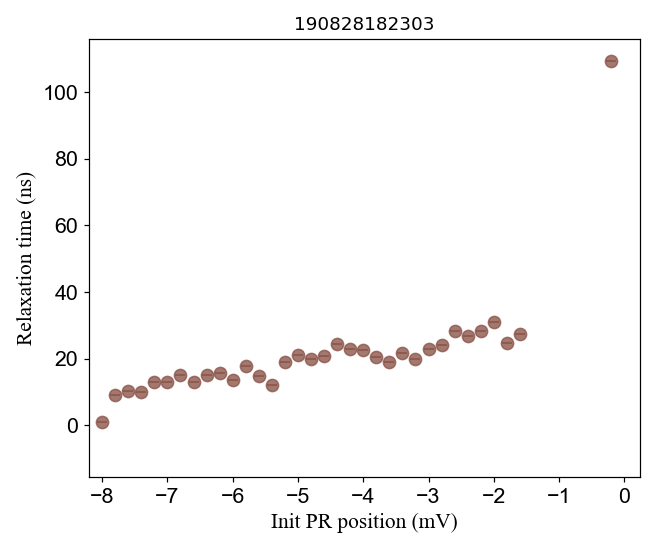

In [515]:
## plot relaxation times as a function of Init_vec or Tran_vec # 1107 2018

## plot relaxation times as a function of magnetic fields # 0508 2018

## 180611205629 - 210525  ,2nd order vs detuning, Init_vec = (0.004,-0.010) + np.lin(0,0.014,8)*(1,-2.1)
# fitted_rel_time = np. array([ 4015.35,  2089.35,  3354.15,  1817.77,   435.05,  1096.58,  511.23,  50.17])
# fitted_rel_err = np. array([ 162.187,   88.115,  191.493,  120.722,   54.881,  225.249, 67.848,  19.006])

## 180611211801 - 213552 ,2nd order vs detuning, Init_vec = (0.004,-0.010) + np.lin(0,0.014,15)*(1,-2.1)
#fitted_rel_time = np. array([ 4061.89,  2122.95,2209.12,1261.47,3334.4, 1893.41, 1771.08, 347.67,534.89, 1385.26, 1275.77, 784.89, 494.82, 216.42,24.64]) 
#fitted_rel_err = np. array([ 165.217, 110.71, 103.486, 65.77, 196.908,109.576, 110.337, 25.282,44.842, 134.446,204.714, 122.443,109.61,45.07, 8.287])

fig, ax = plt.subplots(figsize = (6,5))
amp_array = np.array([0,30,40,50,60,70,80])
#Init_array = (0., 0.) +[1.,-2.]*np.linspace(0.00, 0.008, 21).reshape(21,1)

#x_mag = slope_vec[:,0]*1000 # Init_array[:,0]  #field_array , distance_array 
x_mag = slope_array[:,0]*1000
y_rel = fitted_rel_time #para_store2  #array([5.03957076, 4.9434537 , 4.74426708, 4.62374358, 4.50906465, 4.43373029, 4.36392793, 4.27381951, 3.92595451, 3.45251801])
y_err = fitted_rel_err

#smo = interp1d(x_de, y_ju, kind='cubic')
#x_interpo = np.linspace(1,98,201)
#verts = [(1,0.7),(2,0.7),(3,0.8),(4,0.8),(5,0.8),(6,0.8),(7,0.8),(8,0.8)]
cmap = plt.cm.plasma
#x_mag2 =  np.ma.masked_where(-7.4<x_mag < -6.5 , x_mag)
#ax.plot(x_interpo, smo(x_interpo), linewidth =1 , color = 'C0',alpha=0.7) # color = 'skyblue', c = np.random.rand(19), mfc = 'C4'
ax.errorbar(x_mag, y_rel +1*np.random.rand(len(x_mag)), y_err/1000000, fmt = 'o' ,capsize = 3, markersize = 8  ,color = 'C5',alpha= 0.80) # color = cmap(0.2),'skyblue', mfc='C0',C4
#ax.errorbar(x_mag, y_rel+2, y_err, fmt = 's' ,capsize = 3, markersize = 16,  mfc = 'slateblue',color = 'darkslategrey') # crimson C3 ,plt.cm.cool(i)
#ax.plot(x_mag, y_rel, ':s', ms = 10, mfc = 'w', c = cmap(0.2) )   
#ax.plot(x_mag, y_rel-200, linewidth = 5 , color = 'slateblue',alpha=2)
#ax.plot(x_mag, y_rel-4, linewidth = 8 , color = 'C0',alpha=2)
#ax.plot(x_mag, y_rel-6, linewidth = 8 , color = 'C2',alpha=2) 
#ax.plot(x_mag, y_rel-8, linewidth = 8 , color = plt.cm.viridis(0.97))
#plt.plot(x, result.best_fit, 's',markersize = 8, color = 'C0')                 # color = 'dodgerblue'
#x_expanded = np.linspace(0, 50000, np.abs(x[1]-x[0]))       #x_expanded = np.arange(x.min(), 2.*x.max(), np.abs(x[1]-x[0]))

plt.xlabel('Init PR position (mV)', size = 14,fontname = 'Times New Roman') # , style = 'italic', fontname = 'Times New Roman'
#plt.xlabel('(ns)', size = 20, fontname = 'Century')
plt.ylabel('Relaxation time (ns)', size =14,fontname = 'Times New Roman')  # Arial Unicode MS, , fontname = 'Helvetica'
plt.sca(ax)           ## plt.sca()  to set current axes of a subplot
plt.xticks( fontsize=14, rotation=0, fontname = 'Arial')      #np.arange(50, 101, 5), fontname = 'cmr10'
plt.yticks( fontsize=14, rotation=0, fontname = 'Arial')     # np.arange(0.05, 0.26, 0.05),

#ax.axvspan( -7.4 , -6.6, facecolor='r', alpha=1)
#ax.axvline( -7.,  color='r', linewidth =28) # zorder
#ax.axhspan( 12000 , 15000, facecolor='C9', alpha=0.5)
#ax.axvspan(0.0017, 0.017, facecolor='C2', alpha=0.)
#ax.text(0.2, 0.7, " (1,0)", fontsize = 14,transform=ax.transAxes )
#ax.text(0.6, 0.7, " (1,1)", fontsize = 14,transform=ax.transAxes )
#axarr[xx, yy].set(title = temp_data.attrs['filename'])

#ax.text(0.1, 0.9, "Init_vec=%s+%s *x"%(vec0,slope_vec) , fontsize = 14, fontname = 'Helvetica', transform=ax.transAxes )

plt.title(temp_data.attrs['filename'])  # temp_data.attrs
#plt.xlim((-0.5,16.5))
#plt.ylim((0,1.5))
#plt.yscale('log')
#plt.autoscale(enable = False, axis='both', tight = True)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02)) [f1],
#leg = axarr[xx, yy].legend( [f1],[" %d PS, jump=%s" %(total_num-index,jump)],prop={'size':8, 'family': 'Times New Roman'}, loc = 0)
#leg.set_title('%s'%(temp_data.attrs['filename']),prop={'size':8, 'family': 'Times New Roman'})

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w') #;plt.tight_layout(pad = 3.0, w_pad = 0.9, h_pad = 0.8)
fig.tight_layout()
#print para_store python
plt.show()

In [348]:
arra = np.array([[1, -2.30]])*np.array([[0],[0.004],[0.008]])  # + np.array([0.006,-0.010])
for arr_ in arra:
    a00 = arr_
    print repr(a00)

array([ 0., -0.])
array([ 0.004 , -0.0092])
array([ 0.008 , -0.0184])


In [614]:
re1 = repr(slope_vec)
sss = '%s'%(re1)
print sss

array([-1. ,  0.8])


In [351]:
print np.array([[1, -2.30]]).shape
print np.array([1, -2.30]).shape

(1L, 2L)
(2L,)


In [455]:
for key in model.param_names:
    print key, result.best_values[key], result.params[key].stderr/result.best_values[key]

decay_time 16.4659563466 0.0602536990654
offset 0.484215769132 0.00743535955088
amp 0.310592866604 0.0281536973689


In [460]:
print result.params['decay_time'].value, result.params['decay_time'].stderr/result.params['decay_time'].value

16.4659563466 0.0602536990654


In [462]:
print result.best_values
print result.params

{'amp': 0.3105928666038324, 'decay_time': 16.465956346565967, 'offset': 0.48421576913241721}
Parameters([('decay_time', <Parameter 'decay_time', value=16.465956346565967 +/- 0.992, bounds=[-inf:inf]>), ('offset', <Parameter 'offset', value=0.48421576913241721 +/- 0.0036, bounds=[-inf:inf]>), ('amp', <Parameter 'amp', value=0.3105928666038324 +/- 0.00874, bounds=[-inf:inf]>)])


In [231]:
temp_data['Vrf'][0,0]

<xarray.DataArray 'Vrf' (dwell time (us): 21)>
array([ -6.52994786e-05,   6.74772135e-04,   4.60807292e-04,
        -3.08727217e-03,  -2.32291670e-04,   6.79687510e-05,
        -1.81341148e-03,  -5.93587232e-04,  -3.77763668e-03,
        -2.01399744e-04,  -3.19905602e-03,  -2.11318349e-03,
        -1.04511715e-03,  -1.42786454e-03,  -3.30888666e-03,
        -2.67871097e-03,  -2.14345707e-03,  -2.83925771e-03,
        -5.04296855e-04,  -5.65885392e-04,  -2.61546229e-03], dtype=float32)
Coordinates:
    block            int32 0
    rec              int32 0
    dwell time       (dwell time (us)) float64 0.0 10.0 20.0 30.0 40.0 50.0 ...
  * dwell time (us)  (dwell time (us)) float64 0.0 10.0 20.0 30.0 40.0 50.0 ...

In [224]:
temp_data.dims.items() #[-2]   items()  values()  keys()

[('bins', 100), (u'block', 3), ('dwell time (us)', 21), (u'rec', 1000)]

In [116]:
x_mag = np.array([-0.30, -0.20, -0.15, -0.10, 0.0,  0.10, 0.20, 0.25,  0.30])  # R voltage
y_rel = np.array([9,20,  2.30,  1.86, 1.24,  0.50, 0.21, 0.11, 0.132, 0.098])  # 1./R time(ns), GHz
y_err = np.array([1.10,  0.20,  0.08, 0.05,  0.02, 0.01, 0.008,0.006, 0.007])
print x_mag.shape, y_rel.shape, y_err.shape

(9L,) (10L,) (9L,)


<IPython.core.display.Javascript object>


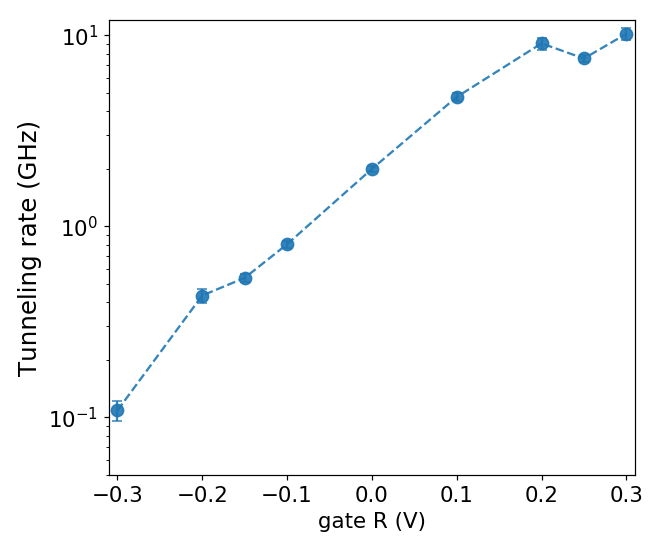

In [127]:
## plot relaxation times as a function of Init_vec or Tran_vec # 1107 2018

## plot relaxation times as a function of magnetic fields # 0508 2018

## 180611205629 - 210525  ,2nd order vs detuning, Init_vec = (0.004,-0.010) + np.lin(0,0.014,8)*(1,-2.1)
# fitted_rel_time = np. array([ 4015.35,  2089.35,  3354.15,  1817.77,   435.05,  1096.58,  511.23,  50.17])
# fitted_rel_err = np. array([ 162.187,   88.115,  191.493,  120.722,   54.881,  225.249, 67.848,  19.006])

## 180611211801 - 213552 ,2nd order vs detuning, Init_vec = (0.004,-0.010) + np.lin(0,0.014,15)*(1,-2.1)
#fitted_rel_time = np. array([ 4061.89,  2122.95,2209.12,1261.47,3334.4, 1893.41, 1771.08, 347.67,534.89, 1385.26, 1275.77, 784.89, 494.82, 216.42,24.64]) 
#fitted_rel_err = np. array([ 165.217, 110.71, 103.486, 65.77, 196.908,109.576, 110.337, 25.282,44.842, 134.446,204.714, 122.443,109.61,45.07, 8.287])

fig, ax = plt.subplots(figsize = (6,5))
amp_array = np.array([0,30,40,50,60,70,80])
Init_array = (0., 0.) +[1.,-2.]*np.linspace(0.00, 0.008, 21).reshape(21,1)

x_mag = np.array([-0.30, -0.20, -0.15, -0.10, 0.0,  0.10, 0.20, 0.25,  0.30])  # R voltage
y_rel = np.array([9.20,  2.30,  1.86, 1.24,  0.50, 0.21, 0.11, 0.132, 0.098])  # 1./R time(ns), GHz
y_err = np.array([1.10,  0.20,  0.08, 0.05,  0.02, 0.01, 0.008,0.006, 0.007])

#smo = interp1d(x_de, y_ju, kind='cubic')
#x_interpo = np.linspace(1,98,201)
#verts = [(1,0.7),(2,0.7),(3,0.8),(4,0.8),(5,0.8),(6,0.8),(7,0.8),(8,0.8)]
cmap = plt.cm.plasma

#ax.plot(x_interpo, smo(x_interpo), linewidth =1 , color = 'C0',alpha=0.7) # color = 'skyblue', c = np.random.rand(19), mfc = 'C4'
ax.errorbar(x_mag, 1./y_rel, 1./y_rel*(y_err/y_rel), fmt = '--o' ,capsize = 3, markersize = 8  ,color = 'C0',alpha= 0.90) # color = cmap(0.2),'skyblue', mfc='C0',C4
#ax.errorbar(x_mag, y_rel+2, y_err, fmt = 's' ,capsize = 3, markersize = 16,  mfc = 'slateblue',color = 'darkslategrey') # crimson C3 ,plt.cm.cool(i)
#ax.plot(x_mag, y_rel, ':s', ms = 10, mfc = 'w', c = cmap(0.2) )   
#ax.plot(x_mag, y_rel-200, linewidth = 5 , color = 'slateblue',alpha=2)
#ax.plot(x_mag, y_rel-4, linewidth = 8 , color = 'C0',alpha=2)
#ax.plot(x_mag, y_rel-6, linewidth = 8 , color = 'C2',alpha=2) 
#ax.plot(x_mag, y_rel-8, linewidth = 8 , color = plt.cm.viridis(0.97))
#plt.plot(x, result.best_fit, 's',markersize = 8, color = 'C0')                 # color = 'dodgerblue'
#x_expanded = np.linspace(0, 50000, np.abs(x[1]-x[0]))       #x_expanded = np.arange(x.min(), 2.*x.max(), np.abs(x[1]-x[0]))

plt.xlabel('gate R (V)', size = 14, fontname = 'Helvetica') # , style = 'italic', fontname = 'Times New Roman'
#plt.xlabel('(ns)', size = 20, fontname = 'Century')
plt.ylabel('Tunneling rate (GHz)', size =16, fontname = 'Helvetica')  # Arial Unicode MS
plt.sca(ax)           ## plt.sca()  to set current axes of a subplot
plt.xticks( fontsize=14, rotation=0, fontname = 'Helvetica')      #np.arange(50, 101, 5),
plt.yticks( fontsize=14, rotation=0, fontname = 'Helvetica')     # np.arange(0.05, 0.26, 0.05),

#ax.axvspan( 2.0 , 5.0, facecolor='C1', alpha=0.3)
#ax.axhspan( 12000 , 15000, facecolor='C9', alpha=0.5)
#ax.axvspan(0.0017, 0.017, facecolor='C2', alpha=0.)
#ax.text(0.2, 0.7, " (1,0)", fontsize = 14,transform=ax.transAxes )
#ax.text(0.6, 0.7, " (1,1)", fontsize = 14,transform=ax.transAxes )
#axarr[xx, yy].set(title = temp_data.attrs['filename'])

#ax.text(0.45, 0.9, "Init slope_vec = (x, -1.5*x)" , fontsize = 14, fontname = 'Helvetica', transform=ax.transAxes )
#ax.text(0.45, 0.7, "Is this really Ubuntu" , fontsize = 14, fontname = 'Verdana', transform=ax.transAxes )  # 'Ubuntu'
#plt.title(temp.attrs['filename'])  # temp_data.attrs
plt.xlim((-0.31, 0.31))
plt.ylim((0.05,12))
plt.yscale('log')
#plt.autoscale(enable = False, axis='both', tight = True)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02)) [f1],
#leg = axarr[xx, yy].legend( [f1],[" %d PS, jump=%s" %(total_num-index,jump)],prop={'size':8, 'family': 'Times New Roman'}, loc = 0)
#leg.set_title('%s'%(temp_data.attrs['filename']),prop={'size':8, 'family': 'Times New Roman'})

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w') #;plt.tight_layout(pad = 3.0, w_pad = 0.9, h_pad = 0.8)
fig.tight_layout()
#print para_store python
plt.show()

[-0.0016 -0.0028 -0.0008 -0.0012 -0.0008] [ 0.02600002  0.02200001  0.02899998  0.023       0.03200001]


<IPython.core.display.Javascript object>


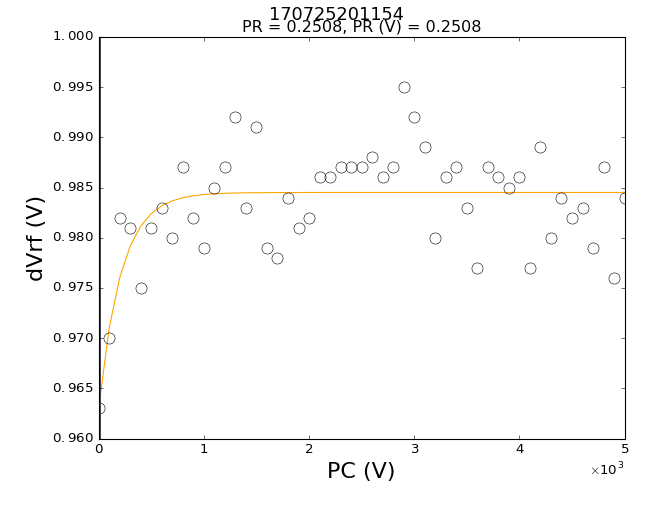

[[Model]]
    Model(exp_decay_start_fixed)
[[Fit Statistics]]
    # function evals   = 35
    # data points      = 51
    # variables        = 2
    chi-square         = 0.001
    reduced chi-square = 0.000
    Akaike info crit   = -555.422
    Bayesian info crit = -551.559
[[Variables]]
    decay_time:   215.171366 +/- 61.04928 (28.37%) (init= 2500)
    start:        0.963 (fixed)
    amp:         -0.02150794 +/- 0.000650 (3.02%) (init=-0.009000123)
[[Correlations]] (unreported correlations are <  0.250)
    C(decay_time, amp)           = -0.320 

[ 517.57674899  704.89231449  143.89458508   67.52550284  215.17136653] 329.812103585


In [147]:
#Fix start point
temp_data = ex.load_data(h5files()[-1], load_now = True) #170404230959
#temp_data = ex.load_data(170411122046, load_now = True)
temp_data['hist'] = tk.hist(temp_data.Vrf, axis = -2, range = (-0.007, 0.003))

threshold_candits = np.linspace(0,-0.01,51)
dps = []
for threshold in threshold_candits:
    ps = tk.probability_lower(temp_data.Vrf, threshold, 'rec')
    dps.append(np.max(ps.values, axis = -1)-np.min(ps.values, axis = -1))

best_candits = threshold_candits[np.argmax(dps, axis = -2)]
if True: #common threshold
    #thresholds = np.mean(best_candits)
    thresholds = 0.002
else:
    print best_candits
    thresholds = np.stack([best_candits[idx[0]] for idx in np.ndindex(temp_data.Vrf.shape)])
    thresholds = thresholds.reshape(temp_data.Vrf.shape)

temp_data['ps'] = tk.probability_lower(temp_data.Vrf, thresholds, 'rec')
print best_candits, np.max(temp_data['ps'].values, axis = -1)-np.min(temp_data['ps'].values, axis = -1)

temp_data['delta ps'] = temp_data['ps'].copy()
ps_avg = np.average(temp_data['ps'], axis = -1)
for idx in np.ndindex(ps_avg.shape):
    temp_data['delta ps'][idx] -= ps_avg[idx]

#tk.plot(temp_data, name='ps')
#tk.plot(temp_data['ps'][1])

tick_spacing = 0.2
## plt.autoscale(enable=True, axis='both', tight=None)
x = temp_data['dwell time'].values
y1 = temp_data['ps'][-1].values
#print x,y1
aa = x[0]
bb = y1[0]
#print aa,bb

fig = plt.figure()
from lmfit import minimize, Parameters, Parameter, report_fit

def exp_decay(t, decay_time, offset, amp):
    bb == amp * np.exp(-aa/decay_time) + offset
    return amp * np.exp(-t/decay_time) + offset

def exp_decay_start_fixed(t, decay_time, start, amp):
    return amp * np.exp(-t/decay_time) + (start - amp)

indeces = [int(r*len(y1)) for r in (0., 0.1, 0.8, 0.9)]
amp = np.mean(y1[indeces[0]:indeces[1]]) - np.mean(y1[indeces[2]:indeces[3]])

# model  = lmfit.Model(exp_decay, independent_vars=['t'])
# # model = Model(exp_decay)

# pars = Parameters()
# #pars.add('delta', expr = 0.95 - (amp + offset), value=0.001, min=0, max=0.01)


# result = model.fit(y1, t = x,
#                    decay_time = lmfit.Parameter(value = 0.5*max(x)),
#                    offset     = lmfit.Parameter(value = np.mean(y1)),
#                    amp     = lmfit.Parameter(value = amp),
                   
#                    )
nn = len(temp_data['block'])
nums = np.arange(0,len(temp_data['block']),1)
para_store = np.empty(nn)
for num in nums:
    x = temp_data['dwell time'].values
    y1 = temp_data['ps'][num].values
    model  = lmfit.Model(exp_decay_start_fixed, independent_vars=['t'])
    result = model.fit(y1, t = x,
                   decay_time = lmfit.Parameter(value = 0.5*max(x)),
                   start     = lmfit.Parameter(value = y1[0], vary = False),
                   amp     = lmfit.Parameter(value = amp),                  
                   )
    decay_time, offset, signal = (result.best_values[key] for key in model.param_names)
    para_store[num] = decay_time


# model  = lmfit.Model(exp_decay_start_fixed, independent_vars=['t'])
# result = model.fit(y1, t = x,
#                    decay_time = lmfit.Parameter(value = 0.5*max(x)),
#                    start     = lmfit.Parameter(value = y1[0], vary = False),
#                    amp     = lmfit.Parameter(value = amp),                  
#                    )


print(result.fit_report(min_correl=0.25))
plt.plot(x, result.best_fit, color = 'orange')
plt.plot(x, y1, 'o', mfc='none', markersize=10)

plt.xlabel('t (ns)', size = 20)
plt.ylabel('Ps', size = 20)
#plt.xlim((0.0,2.0))
#plt.ylim((0.4,0.9))
plt.autoscale(enable=False, axis='both', tight=None)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02))

plt.show()

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
##
#print x,y1
#print aa,bb
print para_store, np.average(para_store,axis = 0)


## detuning _ relaxation

<IPython.core.display.Javascript object>


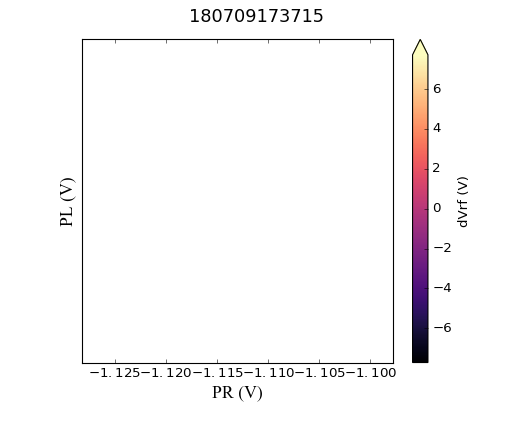

In [41]:
# detuning _ relaxation

detu_array = np.array([0.60, 0.85, 1.1, 1.35, 1.60, 1.85, 2.10, 2.35])  # meV
rel_array  = np.array([3373, 2379, 1075, 381,  270, 78.7, 22.1, 11.7]) 

fig, ax = plt.subplots(figsize = (6,5))

ax.plot(detu_array, rel_array, 'o',mfc = 'w',mew = 2,mec = 'darkblue', ms = 10)
#ax.plot(x, y1, 'o', mfc='none', markersize=10)

plt.xlabel('detuning (meV)', size = 16,fontname = 'Times New Roman')
plt.ylabel('Relaxation (ns)', size = 16,fontname = 'Times New Roman')
#plt.xlim((0.0,2.0))
#plt.ylim((0.4,0.9))
plt.yscale('log')
plt.autoscale(enable=False, axis='both', tight=None)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02))

plt.show()

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

In [411]:

try:
    print 'good'
except:
    print 'meet an error'
else:
    print 'finished'

good
finished


In [412]:
np.log(2.718)

0.999896315728952

<IPython.core.display.Javascript object>


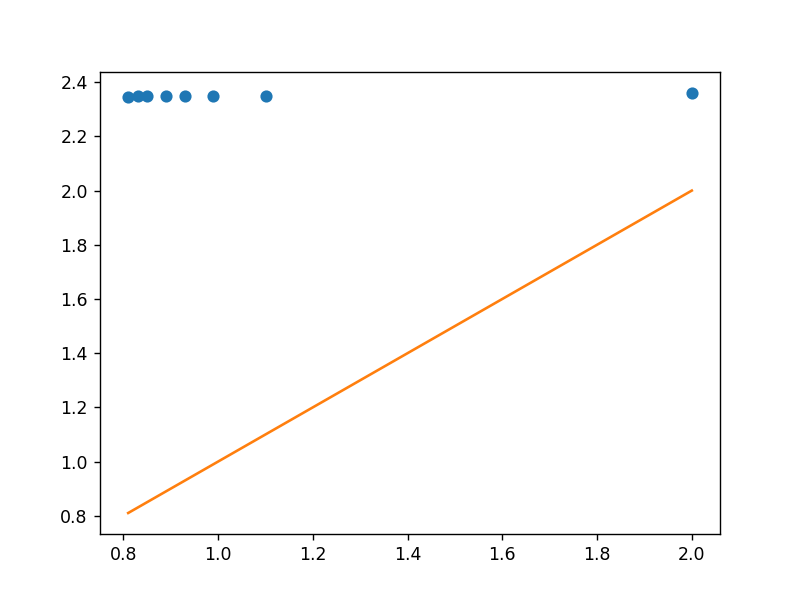

In [427]:
# Logsumexp
#ma_arr = [8.1,9,11,13,15,19,25]
ma_arr = [0.81,0.83,0.85,0.89,0.93,0.99,1.1,2]
#ma = 0
#xi = np.array([1,3,5,7,ma,8,6,4,2,0])
LSE_arr = []
for ma in ma_arr:
    #xi = np.array([1,3,5,7,ma,8,6,4,2,0])
    xi = np.array([0.1,0.3,0.5,0.7,ma,0.8,0.6,0.4,0.2,0])* 0.1
    LSE = np.log(sum(np.exp(xi)))
    LSE_arr.append(LSE)

#LSE = np.log(np.sum(np.exp(x) for x in xi))
fig, ax = plt.subplots()
ax.plot(ma_arr,LSE_arr,'o')
ax.plot(ma_arr,ma_arr)
#print LSE

In [428]:
sum(np.exp(xi))

10.591822465267558

## Tunneling _ Gate change

[[Model]]
    Model(linefit)
[[Fit Statistics]]
    # function evals   = 25
    # data points      = 6
    # variables        = 2
    chi-square         = 0.002
    reduced chi-square = 0.000
    Akaike info crit   = -45.073
    Bayesian info crit = -45.490
[[Variables]]
    a:   14.5937519 +/- 0.245174 (1.68%) (init= 1)
    b:   4.05557165 +/- 0.052163 (1.29%) (init= 1)
[[Correlations]] (unreported correlations are <  0.250)
    C(a, b)                      =  0.987 



<IPython.core.display.Javascript object>


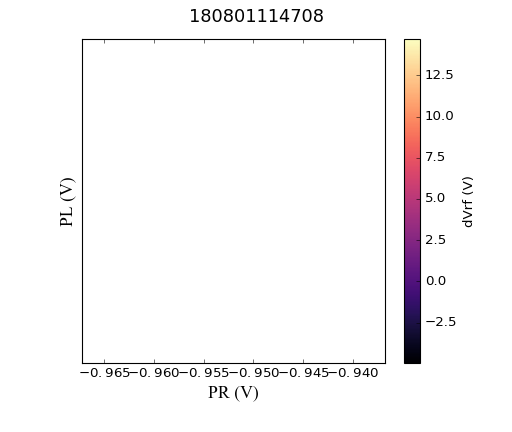

<IPython.core.display.Javascript object>


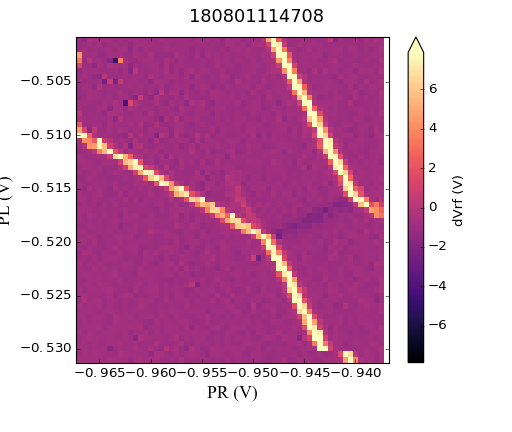

In [110]:
# R gate _ tunneling rate

R_array1 =  np.array([-0.31, -0.30, -0.28, -0.26])  #  real value, V unit
tun_out_times1  = np.array([1806, 1309, 556, 264])  # ns, tunnel out time fitted from pulse measurement
tun_in_times1   = np.array([1103, 922,  425, 102])

R_array2 = np.array([-0.26, -0.24, -0.22, -0.20, -0.18, -0.16])
tun_out_times2  = np.array([579, 268, 141, 72, 36, 20])  # ns, tunnel out time fitted from pulse measurement
tun_in_times2   = np.array([217, 117, 88,  65, 33])

gamma_out1 = (10**9. / tun_out_times1 ) / 10**6.
gamma_in1 = (10**9. / tun_in_times1 ) / 10**6.
gamma_out2 = (10**9. / tun_out_times2 ) / 10**6.   ## in MHz
gamma_in2 = (10**9. / tun_in_times2 ) / 10**6.

x = R_array2
y = gamma_out2
y2 = np.log10(gamma_out2)

def linefit(x,a,b):
    return a*x + b

model  = lmfit.Model(linefit, independent_vars=['x'])
result = model.fit(y2, x = x,
                   a     = lmfit.Parameter(value = 1., min = 0., max = 200.),
                   b     = lmfit.Parameter(value = 1., min = -100., max = 100.),)

a,b = (result.best_values[key] for key in model.param_names)
x2= np.linspace( -0.32, 0.0, 321) 
#params =  { 'decay_time':decay_time, 'offset': offset, 'amp': amp}
fitting_curve = model.func(x2, **result.best_values)
print(result.fit_report(min_correl=0.25))


fig, ax = plt.subplots(figsize = (6,5))

ax.plot(x, y, 'o',mfc = 'w',mew = 2,mec = 'darkblue', ms = 10)
#ax.plot(x, y1, 'o', mfc='none', markersize=10)
plt.xlabel('R (V)', size = 16,fontname = 'Times New Roman')
plt.ylabel('tunnel out rate (MHz)', size = 16,fontname = 'Times New Roman')
#plt.xlim((0.0,2.0))
plt.ylim((0.5,100))
plt.yscale('log')
plt.autoscale(enable=False, axis='both', tight=None)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02))

plt.show()

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
#print gamma_out2


fig, ax = plt.subplots(figsize = (6,5))

ax.plot(x, y2, 'o',mfc = 'lightblue',mew = 2,mec = 'darkblue', ms = 12)
#ax.plot(x, y2*2.5, 'o',mfc = 'lightyellow',mew = 2,mec = 'darkgreen', ms = 12)
ax.plot(x2, fitting_curve, lw = 4, c=cmap(0.8))
#ax.plot(x, y1, 'o', mfc='none', markersize=10)
plt.xlabel('R (V)', size = 16,fontname = 'Times New Roman')
plt.ylabel('log (rate) (10^ MHz)', size = 16,fontname = 'Times New Roman')
#plt.xlim((0.0,2.0))
#plt.ylim((0.5,100))
#plt.yscale('log')
plt.autoscale(enable=False, axis='both', tight=None)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02))

plt.show()

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

In [ ]:
# detuning _ relaxation
edgePR_array = np.array([0.60, 0.85, 1.1, 1.35, 1.60, 1.85, 2.10, 2.35])  # meV
time_array  = np.linspace(0,120,121)

fig, ax = plt.subplots(figsize = (6,5))

ax.plot(detu_array, rel_array, 'o',mfc = 'w',mew = 2,mec = 'darkblue', ms = 10)
#ax.plot(x, y1, 'o', mfc='none', markersize=10)

plt.xlabel('detuning (meV)', size = 16,fontname = 'Times New Roman')
plt.ylabel('Relaxation (ns)', size = 16,fontname = 'Times New Roman')
#plt.xlim((0.0,2.0))
#plt.ylim((0.4,0.9))
plt.yscale('log')
plt.autoscale(enable=False, axis='both', tight=None)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02))

plt.show()

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

In [153]:
import matplotlib
matplotlib.__version__

'1.5.3'

In [40]:
xr.__version__

'0.8.2'

In [41]:
np.__version__

'1.11.1'

In [121]:
#### single block fit
#temp_data = ex.load_data(h5files()[-1], load_now = True) #170404230959
temp_data = ex.load_data(170710202510, load_now = True)
temp_data['hist'] = tk.hist(temp_data.Vrf, axis = -2, range = (-0.010, 0.004))

threshold_candits = np.linspace(0,-0.01,51)
dps = []
for threshold in threshold_candits:
    ps = 1 - tk.probability_lower(temp_data.Vrf, threshold, 'rec')
    dps.append(np.max(ps.values, axis = -1)-np.min(ps.values, axis = -1))

best_candits = threshold_candits[np.argmax(dps, axis = -2)]
if True: #common threshold
    #thresholds = np.mean(best_candits)
    thresholds = -0.003
else:
    print best_candits
    thresholds = np.stack([best_candits[idx[0]] for idx in np.ndindex(temp_data.Vrf.shape)])
    thresholds = thresholds.reshape(temp_data.Vrf.shape)

temp_data['ps'] = 1 - tk.probability_lower(temp_data.Vrf, thresholds, 'rec')
print best_candits, np.max(temp_data['ps'].values, axis = -1)-np.min(temp_data['ps'].values, axis = -1)

temp_data['delta ps'] = temp_data['ps'].copy()
ps_avg = np.average(temp_data['ps'], axis = -1)
for idx in np.ndindex(ps_avg.shape):
    temp_data['delta ps'][idx] -= ps_avg[idx]

#tk.plot(temp_data, name='ps')
#tk.plot(temp_data['ps'][1])

tick_spacing = 0.2
## plt.autoscale(enable=True, axis='both', tight=None)
x = temp_data['dwell time'].values
y1 = temp_data['ps'][0].values
#print x,y1
aa = x[0]
bb = y1[0]
#print aa,bb

fig = plt.figure()
from lmfit import minimize, Parameters, Parameter, report_fit

def exp_decay(t, decay_time, offset, amp):
    bb == amp * np.exp(-aa/decay_time) + offset
    return amp * np.exp(-t/decay_time) + offset

def exp_decay_start_fixed(t, decay_time, start, amp):
    return amp * np.exp(-t/decay_time) + (start - amp)

indeces = [int(r*len(y1)) for r in (0., 0.1, 0.8, 0.9)]
#amp = np.mean(y1[indeces[0]:indeces[1]]) - np.mean(y1[indeces[2]:indeces[3]])
amp = 0.2

nn = len(temp_data['block'])
nums = np.arange(0,len(temp_data['block']),1)
para_store = np.empty(nn)


x = temp_data['dwell time'].values
y1 = temp_data['ps'][2].values
model  = lmfit.Model(exp_decay, independent_vars=['t'])
result = model.fit(y1, t = x,
                   decay_time = lmfit.Parameter(value = 0.5*max(x)),
                   offset     = lmfit.Parameter(value = np.mean(y1)),
                   amp     = lmfit.Parameter(value = amp),                  
                   )
decay_time, offset, amp = (result.best_values[key] for key in model.param_names)
para_store[0] = decay_time


print(result.fit_report(min_correl=0.25))
plt.plot(x, y1, 'o', color = 'skyblue',markersize=10)
plt.plot(x, result.best_fit, color = 'dodgerblue')

plt.xlabel('t (ns)', size = 20)
plt.ylabel('Ps', size = 20)
#plt.xlim((0.0,2.0))
plt.ylim((0.5,1.0))
plt.autoscale(enable=False, axis='both', tight=None)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02))

plt.show()
plt.xticks(fontsize=16, rotation=0)
plt.yticks(fontsize=16, rotation=0)
fig.text(0.45,0.95,temp_data.attrs['filename'], size =14)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout(pad=2.0, w_pad=0.9, h_pad=0.9)
##
print para_store, np.average(para_store,axis = 0)
print repr(result.best_fit)

IOError: No such file or directory

<IPython.core.display.Javascript object>


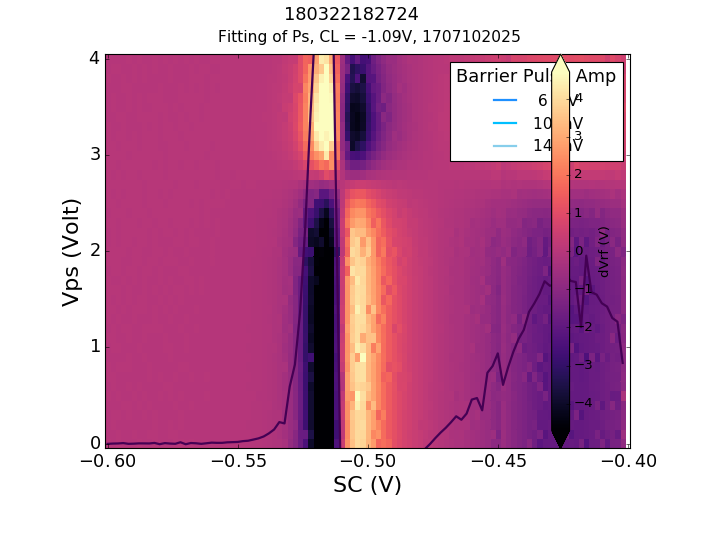

In [80]:
x = np.linspace(0,10e3,101)
fit1 = np.array([ 0.82995329,  0.82057118,  0.8115196 ,  0.8027869 ,  0.79436185,
        0.78623361,  0.77839172,  0.7708261 ,  0.76352701,  0.75648507,
        0.74969121,  0.74313669,  0.73681309,  0.73071227,  0.72482637,
        0.71914783,  0.71366935,  0.70838387,  0.70328459,  0.69836496,
        0.69361864,  0.68903954,  0.68462176,  0.68035961,  0.67624761,
        0.67228048,  0.66845311,  0.66476058,  0.66119813,  0.65776119,
        0.65444532,  0.65124628,  0.64815993,  0.64518232,  0.6423096 ,
        0.63953809,  0.63686422,  0.63428455,  0.63179576,  0.62939465,
        0.62707812,  0.62484321,  0.62268703,  0.62060682,  0.61859989,
        0.61666366,  0.61479564,  0.61299344,  0.61125472,  0.60957726,
        0.6079589 ,  0.60639754,  0.6048912 ,  0.60343792,  0.60203584,
        0.60068316,  0.59937813,  0.59811908,  0.59690438,  0.59573247,
        0.59460185,  0.59351106,  0.5924587 ,  0.59144342,  0.5904639 ,
        0.58951889,  0.58860717,  0.58772757,  0.58687896,  0.58606025,
        0.58527038,  0.58450833,  0.58377314,  0.58306384,  0.58237953,
        0.58171933,  0.58108238,  0.58046788,  0.57987503,  0.57930306,
        0.57875124,  0.57821886,  0.57770524,  0.57720971,  0.57673164,
        0.57627041,  0.57582543,  0.57539613,  0.57498195,  0.57458236,
        0.57419685,  0.57382492,  0.57346609,  0.57311991,  0.57278592,
        0.5724637 ,  0.57215282,  0.5718529 ,  0.57156355,  0.57128439,
        0.57101507])
fit2 = np.array([ 0.77416092,  0.76308019,  0.75253435,  0.74249757,  0.73294528,
        0.7238541 ,  0.71520177,  0.70696709,  0.69912992,  0.69167107,
        0.68457226,  0.67781613,  0.67138612,  0.6652665 ,  0.65944229,
        0.65389922,  0.64862373,  0.64360289,  0.63882441,  0.63427661,
        0.62994833,  0.62582898,  0.62190848,  0.61817723,  0.6146261 ,
        0.61124638,  0.60802981,  0.60496851,  0.60205498,  0.5992821 ,
        0.59664306,  0.59413142,  0.59174101,  0.589466  ,  0.5873008 ,
        0.58524013,  0.58327892,  0.58141238,  0.57963595,  0.57794527,
        0.5763362 ,  0.5748048 ,  0.57334732,  0.5719602 ,  0.57064004,
        0.56938361,  0.56818782,  0.56704976,  0.56596663,  0.56493579,
        0.56395471,  0.56302099,  0.56213234,  0.56128658,  0.56048166,
        0.55971558,  0.55898649,  0.55829259,  0.55763219,  0.55700366,
        0.55640548,  0.55583617,  0.55529434,  0.55477867,  0.55428789,
        0.5538208 ,  0.55337626,  0.55295318,  0.55255052,  0.55216729,
        0.55180257,  0.55145545,  0.55112509,  0.55081067,  0.55051143,
        0.55022664,  0.54995559,  0.54969763,  0.54945212,  0.54921846,
        0.54899608,  0.54878444,  0.54858301,  0.54839131,  0.54820885,
        0.54803521,  0.54786995,  0.54771266,  0.54756297,  0.54742051,
        0.54728492,  0.54715587,  0.54703306,  0.54691617,  0.54680493,
        0.54669905,  0.54659829,  0.54650239,  0.54641112,  0.54632426,
        0.54624159])
fit3 = np.array([ 0.68862367,  0.67041795,  0.65411378,  0.63951254,  0.62643636,
        0.61472596,  0.60423868,  0.59484677,  0.58643582,  0.57890337,
        0.57215767,  0.56611654,  0.56070639,  0.55586132,  0.55152231,
        0.54763649,  0.54415654,  0.54104006,  0.53824909,  0.53574963,
        0.53351123,  0.53150663,  0.5297114 ,  0.52810368,  0.52666388,
        0.52537447,  0.52421973,  0.5231856 ,  0.52225948,  0.5214301 ,
        0.52068734,  0.52002216,  0.51942645,  0.51889297,  0.51841521,
        0.51798735,  0.51760417,  0.51726102,  0.51695371,  0.5166785 ,
        0.51643204,  0.51621131,  0.51601364,  0.51583662,  0.51567808,
        0.51553611,  0.51540896,  0.5152951 ,  0.51519312,  0.5151018 ,
        0.51502002,  0.51494677,  0.51488118,  0.51482244,  0.51476984,
        0.51472272,  0.51468053,  0.51464275,  0.51460891,  0.51457861,
        0.51455147,  0.51452717,  0.5145054 ,  0.51448591,  0.51446846,
        0.51445282,  0.51443882,  0.51442629,  0.51441506,  0.514405  ,
        0.514396  ,  0.51438793,  0.51438071,  0.51437424,  0.51436845,
        0.51436326,  0.51435862,  0.51435446,  0.51435073,  0.51434739,
        0.51434441,  0.51434173,  0.51433933,  0.51433719,  0.51433527,
        0.51433354,  0.514332  ,  0.51433062,  0.51432939,  0.51432828,
        0.51432729,  0.5143264 ,  0.5143256 ,  0.51432489,  0.51432425,
        0.51432368,  0.51432317,  0.51432271,  0.5143223 ,  0.51432194,
        0.51432161])

fig = plt.figure()
f1, = plt.plot(x, fit1, color = 'dodgerblue',linewidth = 2)
f2, = plt.plot(x, fit2, color = 'deepskyblue',linewidth = 2)
f3, = plt.plot(x, fit3, color = 'skyblue',linewidth = 2)

plt.xlabel('t (ns)', size = 20)
plt.ylabel('Ps', size = 20)
#plt.xlim((0.0,2.0))
plt.ylim((0.4,0.9))
plt.autoscale(enable=False, axis='both', tight=None)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02))

plt.show()
plt.xticks(fontsize=16, rotation=0)
plt.yticks(fontsize=16, rotation=0)
#plt.rc('legend',**{'fontsize':10})
leg = plt.legend([f1, f2, f3], [" 6 mV", "10 mV",  "14 mV"],prop={'size':14}, loc = 0)

leg.set_title('Barrier Pulse Amp',prop={'size':16})

fig.text(0.3,0.95,'Fitting of Ps, CL = -1.09V, 1707102025', size =14)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout(pad=2.0, w_pad=0.9, h_pad=0.9)

## tableau colors

In [11]:
# Tableau  Colors
import matplotlib as mpl

# Tableau 20 Colors
tableau20 = [(31, 119, 180), (174, 199, 232), (255, 127, 14), (255, 187, 120),  
             (44, 160, 44), (152, 223, 138), (214, 39, 40), (255, 152, 150),  
             (148, 103, 189), (197, 176, 213), (140, 86, 75), (196, 156, 148),  
             (227, 119, 194), (247, 182, 210), (127, 127, 127), (199, 199, 199),  
             (188, 189, 34), (219, 219, 141), (23, 190, 207), (158, 218, 229)]
             
# Tableau Color Blind 10
tableau10blind = [(0, 107, 164), (255, 128, 14), (171, 171, 171), (89, 89, 89),
             (95, 158, 209), (200, 82, 0), (137, 137, 137), (163, 200, 236),
             (255, 188, 121), (207, 207, 207)]

# Tableau 10 Colors
tableau10 = [(31, 119, 180),(255, 127, 14),  
             (44, 160, 44), (214, 39, 40),   
             (148, 103, 189), (140, 86, 75),
             (227, 119, 194), (127, 127, 127),
             (188, 189, 34),  (23, 190, 207)]

# Tableau Blue-red 12
BlueRed = [(44,105,176),(181,200,226), (240,39,32), (255,182,176), (172,97,60),
             (233,195,155), (107,163,214), (181,223,253), (172,135,99),
             (221,201,180),(189,10,54), (244,115,122)]
# Rescale to values between 0 and 1 
for i in range(len(tableau20)):  
    r, g, b = tableau20[i]  
    tableau20[i] = (r / 255., g / 255., b / 255.)
for i in range(len(tableau10)):  
    r, g, b = tableau10[i]  
    tableau10[i] = (r / 255., g / 255., b / 255.)
for i in range(len(tableau10blind)):  
    r, g, b = tableau10blind[i]  
    tableau10blind[i] = (r / 255., g / 255., b / 255.)
for i in range(len(BlueRed)):  
    r, g, b = BlueRed[i]  
    BlueRed[i] = (r / 255., g / 255., b / 255.)

from cycler import cycler
#mpl.rcParams['axes.prop_cycle'] = cycler(color= BlueRed)
mpl.rcParams['axes.prop_cycle'] = cycler(color= tableau10)

# Use with plt.plot(…, color=tableau[0],…)

# From http://tableaufriction.blogspot.ro/2012/11/finally-you-can-use-tableau-data-colors.html
# With code from http://www.randalolson.com/2014/06/28/how-to-make-beautiful-data-visualizations-in-python-with-matplotlib/

<IPython.core.display.Javascript object>


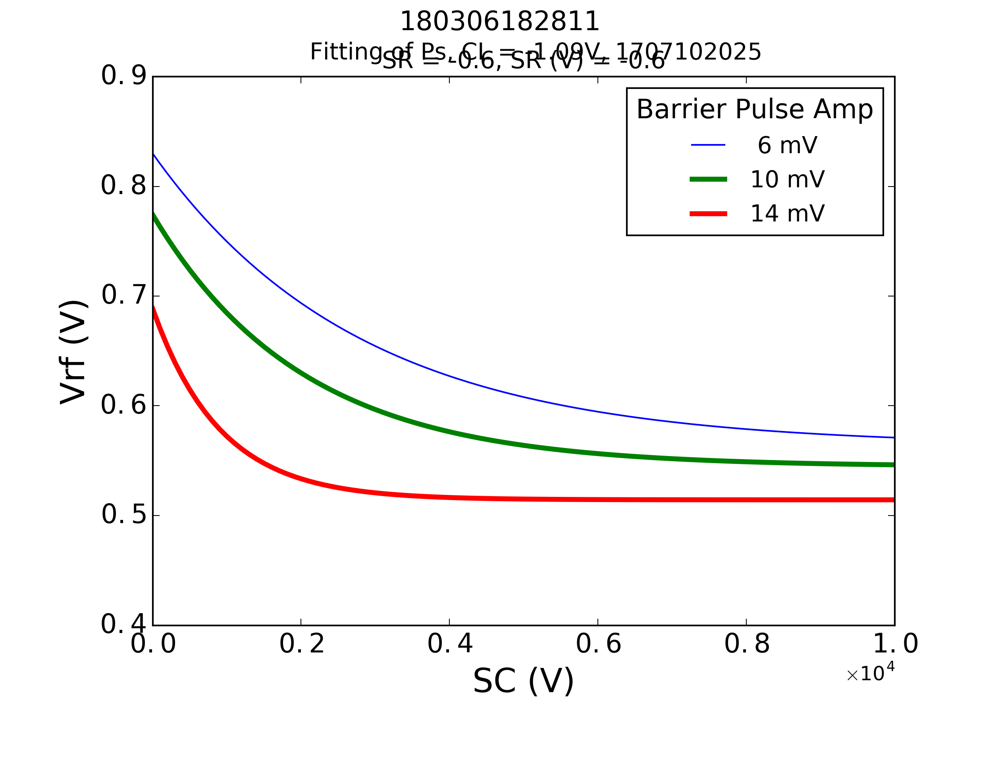

In [143]:
x = np.linspace(0,10e3,101)
fit1 = np.array([ 0.82995329,  0.82057118,  0.8115196 ,  0.8027869 ,  0.79436185,
        0.78623361,  0.77839172,  0.7708261 ,  0.76352701,  0.75648507,
        0.74969121,  0.74313669,  0.73681309,  0.73071227,  0.72482637,
        0.71914783,  0.71366935,  0.70838387,  0.70328459,  0.69836496,
        0.69361864,  0.68903954,  0.68462176,  0.68035961,  0.67624761,
        0.67228048,  0.66845311,  0.66476058,  0.66119813,  0.65776119,
        0.65444532,  0.65124628,  0.64815993,  0.64518232,  0.6423096 ,
        0.63953809,  0.63686422,  0.63428455,  0.63179576,  0.62939465,
        0.62707812,  0.62484321,  0.62268703,  0.62060682,  0.61859989,
        0.61666366,  0.61479564,  0.61299344,  0.61125472,  0.60957726,
        0.6079589 ,  0.60639754,  0.6048912 ,  0.60343792,  0.60203584,
        0.60068316,  0.59937813,  0.59811908,  0.59690438,  0.59573247,
        0.59460185,  0.59351106,  0.5924587 ,  0.59144342,  0.5904639 ,
        0.58951889,  0.58860717,  0.58772757,  0.58687896,  0.58606025,
        0.58527038,  0.58450833,  0.58377314,  0.58306384,  0.58237953,
        0.58171933,  0.58108238,  0.58046788,  0.57987503,  0.57930306,
        0.57875124,  0.57821886,  0.57770524,  0.57720971,  0.57673164,
        0.57627041,  0.57582543,  0.57539613,  0.57498195,  0.57458236,
        0.57419685,  0.57382492,  0.57346609,  0.57311991,  0.57278592,
        0.5724637 ,  0.57215282,  0.5718529 ,  0.57156355,  0.57128439,
        0.57101507])
fit2 = np.array([ 0.77416092,  0.76308019,  0.75253435,  0.74249757,  0.73294528,
        0.7238541 ,  0.71520177,  0.70696709,  0.69912992,  0.69167107,
        0.68457226,  0.67781613,  0.67138612,  0.6652665 ,  0.65944229,
        0.65389922,  0.64862373,  0.64360289,  0.63882441,  0.63427661,
        0.62994833,  0.62582898,  0.62190848,  0.61817723,  0.6146261 ,
        0.61124638,  0.60802981,  0.60496851,  0.60205498,  0.5992821 ,
        0.59664306,  0.59413142,  0.59174101,  0.589466  ,  0.5873008 ,
        0.58524013,  0.58327892,  0.58141238,  0.57963595,  0.57794527,
        0.5763362 ,  0.5748048 ,  0.57334732,  0.5719602 ,  0.57064004,
        0.56938361,  0.56818782,  0.56704976,  0.56596663,  0.56493579,
        0.56395471,  0.56302099,  0.56213234,  0.56128658,  0.56048166,
        0.55971558,  0.55898649,  0.55829259,  0.55763219,  0.55700366,
        0.55640548,  0.55583617,  0.55529434,  0.55477867,  0.55428789,
        0.5538208 ,  0.55337626,  0.55295318,  0.55255052,  0.55216729,
        0.55180257,  0.55145545,  0.55112509,  0.55081067,  0.55051143,
        0.55022664,  0.54995559,  0.54969763,  0.54945212,  0.54921846,
        0.54899608,  0.54878444,  0.54858301,  0.54839131,  0.54820885,
        0.54803521,  0.54786995,  0.54771266,  0.54756297,  0.54742051,
        0.54728492,  0.54715587,  0.54703306,  0.54691617,  0.54680493,
        0.54669905,  0.54659829,  0.54650239,  0.54641112,  0.54632426,
        0.54624159])
fit3 = np.array([ 0.68862367,  0.67041795,  0.65411378,  0.63951254,  0.62643636,
        0.61472596,  0.60423868,  0.59484677,  0.58643582,  0.57890337,
        0.57215767,  0.56611654,  0.56070639,  0.55586132,  0.55152231,
        0.54763649,  0.54415654,  0.54104006,  0.53824909,  0.53574963,
        0.53351123,  0.53150663,  0.5297114 ,  0.52810368,  0.52666388,
        0.52537447,  0.52421973,  0.5231856 ,  0.52225948,  0.5214301 ,
        0.52068734,  0.52002216,  0.51942645,  0.51889297,  0.51841521,
        0.51798735,  0.51760417,  0.51726102,  0.51695371,  0.5166785 ,
        0.51643204,  0.51621131,  0.51601364,  0.51583662,  0.51567808,
        0.51553611,  0.51540896,  0.5152951 ,  0.51519312,  0.5151018 ,
        0.51502002,  0.51494677,  0.51488118,  0.51482244,  0.51476984,
        0.51472272,  0.51468053,  0.51464275,  0.51460891,  0.51457861,
        0.51455147,  0.51452717,  0.5145054 ,  0.51448591,  0.51446846,
        0.51445282,  0.51443882,  0.51442629,  0.51441506,  0.514405  ,
        0.514396  ,  0.51438793,  0.51438071,  0.51437424,  0.51436845,
        0.51436326,  0.51435862,  0.51435446,  0.51435073,  0.51434739,
        0.51434441,  0.51434173,  0.51433933,  0.51433719,  0.51433527,
        0.51433354,  0.514332  ,  0.51433062,  0.51432939,  0.51432828,
        0.51432729,  0.5143264 ,  0.5143256 ,  0.51432489,  0.51432425,
        0.51432368,  0.51432317,  0.51432271,  0.5143223 ,  0.51432194,
        0.51432161])

fig = plt.figure(dpi = 300)
# f1, = plt.plot(x, fit1, '8', color = 'midnightblue',linewidth = 10, markersize = 15)
# f2, = plt.plot(x, fit2, 's', color = 'darkslateblue',linewidth = 2, markersize = 15)
# f3, = plt.plot(x, fit3, 'o', color = tableau20[0], linewidth = 2, markersize = 15)
f1, = plt.plot(x, fit1, linewidth = 1, markersize = 15)
f2, = plt.plot(x, fit2, linewidth = 3, markersize = 15)
f3, = plt.plot(x, fit3, linewidth = 3, markersize = 15)

plt.xlabel('t (ns)', size = 20)
plt.ylabel('Ps', size = 20)
#plt.xlim((0.0,2.0))
plt.ylim((0.4,0.9))
plt.autoscale(enable=False, axis='both', tight=None)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02))

plt.show()
plt.xticks(fontsize=16, rotation=0)
plt.yticks(fontsize=16, rotation=0)
#plt.rc('legend',**{'fontsize':10})
leg = plt.legend([f1, f2, f3], [" 6 mV", "10 mV",  "14 mV"],prop={'size':14}, loc = 0)

leg.set_title('Barrier Pulse Amp',prop={'size':16})

fig.text(0.3,0.95,'Fitting of Ps, CL = -1.09V, 1707102025', size =14)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout(pad=2.0, w_pad=0.9, h_pad=0.9)

[-0.0034 -0.002  -0.003 ] [ 0.28200001  0.27600002  0.28600001]


<IPython.core.display.Javascript object>


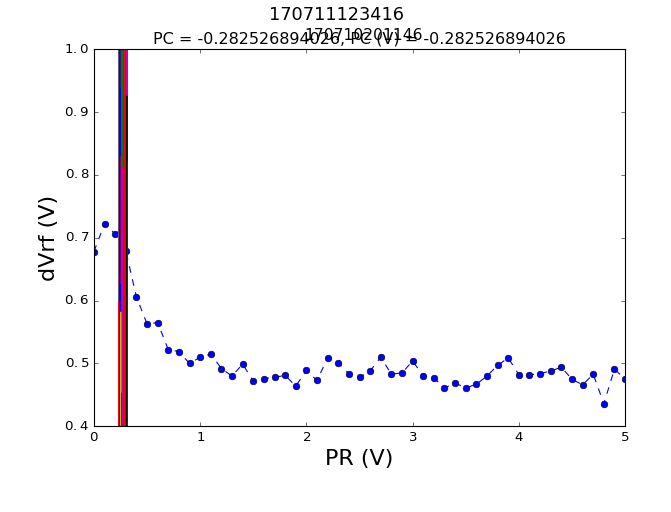

<xarray.DataArray 'ps' (dwell time (ns): 51)>
array([ 0.67799997,  0.722     ,  0.70599997,  0.67900002,  0.60600001,
        0.56299996,  0.565     ,  0.52200001,  0.51899999,  0.5       ,
        0.50999999,  0.51499999,  0.49199998,  0.48000002,  0.49900001,
        0.472     ,  0.47600001,  0.47799999,  0.48100001,  0.46399999,
        0.48900002,  0.47299999,  0.509     ,  0.50099999,  0.48400003,
        0.47799999,  0.48799998,  0.50999999,  0.48299998,  0.48500001,
        0.50400001,  0.48000002,  0.477     ,  0.46100003,  0.46899998,
        0.46100003,  0.46700001,  0.48000002,  0.49699998,  0.509     ,
        0.48199999,  0.48199999,  0.48400003,  0.48799998,  0.49400002,
        0.47500002,  0.46600002,  0.48299998,  0.43599999,  0.491     ,
        0.47500002], dtype=float32)
Coordinates:
    block            int32 2
    dwell time       (dwell time (ns)) float64 0.0 0.1 0.2 0.3 0.4 0.5 0.6 ...
  * dwell time (ns)  (dwell time (ns)) float64 0.0 0.1 0.2 0.3 0.4 0.5 0.6 ..

In [35]:
# plot scatter
temp_data = ex.load_data(h5files()[-1], load_now = True) #170411122046
#temp_data = ex.load_data(170411122046)
temp_data['hist'] = tk.hist(temp_data.Vrf, axis = -2, range = (-0.010, 0.003))

threshold_candits = np.linspace(0,-0.01,51)
dps = []
for threshold in threshold_candits:
    ps = 1. - tk.probability_lower(temp_data.Vrf, threshold, 'rec')   # when the T peak bins is negative
    #ps = tk.probability_lower(temp_data.Vrf, threshold, 'rec')       # when the T peak bins is positive
    dps.append(np.max(ps.values, axis = -1)-np.min(ps.values, axis = -1))

best_candits = threshold_candits[np.argmax(dps, axis = -2)]
if True: #common threshold
    #thresholds = np.mean(best_candits)
    thresholds = -0.003
else:
    print best_candits
    thresholds = np.stack([best_candits[idx[0]] for idx in np.ndindex(temp_data.Vrf.shape)])
    thresholds = thresholds.reshape(temp_data.Vrf.shape)

temp_data['ps'] = 1. - tk.probability_lower(temp_data.Vrf, thresholds, 'rec')    # when the T peak bins is negative
#temp_data['ps'] = tk.probability_lower(temp_data.Vrf, thresholds, 'rec')        # when the T peak bins is positive

print best_candits, np.max(temp_data['ps'].values, axis = -1)-np.min(temp_data['ps'].values, axis = -1)

temp_data['delta ps'] = temp_data['ps'].copy()
ps_avg = np.average(temp_data['ps'], axis = -1)
for idx in np.ndindex(ps_avg.shape):
    temp_data['delta ps'][idx] -= ps_avg[idx]

fig = plt.figure()
#tk.plot(temp_data, name='ps')
#tk.plot(temp_data['ps'][1])

tick_spacing = 0.2
## plt.autoscale(enable=True, axis='both', tight=None)
x = temp_data['dwell time'].values
y = temp_data['ps'][2]
plt.plot(x, y, '--o', mfc='blue')
plt.xlabel('t (ns)', size = 20)
plt.ylabel('Ps', size = 20)
plt.ylim(0.4, 1)
plt.autoscale(enable=True, axis='x', tight=None)
fig.text(0.45,0.95,temp_data.attrs['filename'], size =14)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02))

plt.show()

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout(pad=2.0, w_pad=0.9, h_pad=0.9)
##
print temp_data['ps'][-1], temp_data.attrs['filename']

In [332]:
temp_data# = ex.load_data(170405162857)
#tk.axis(temp_data['dwell time'],-1)
temp_data['Vrf']

<xarray.DataArray 'Vrf' (block: 2, rec: 1000, dwell time (ns): 101)>
array([[[  5.28906239e-05,   9.60989564e-04,   9.44335945e-04, ...,
           5.94804704e-04,   5.07838558e-04,   2.44507822e-03],
        [  1.28893225e-04,   5.99583320e-04,   5.66028641e-04, ...,
          -2.92221364e-03,   3.26167978e-03,   5.51888021e-04],
        [ -1.45429687e-04,  -6.12213567e-04,  -2.72028637e-03, ...,
           1.52899744e-03,   2.62630201e-04,   2.02986971e-03],
        ..., 
        [  3.09075520e-04,  -3.98437493e-03,   7.27213555e-05, ...,
           4.20729164e-04,   5.53880236e-04,   4.08638036e-03],
        [  4.08072927e-04,  -2.90209637e-03,  -3.70610668e-03, ...,
          -3.26848961e-03,   1.39322913e-06,   6.74713519e-04],
        [  4.94791675e-05,   4.08333326e-05,  -2.49960925e-04, ...,
           1.62386720e-03,   5.13878884e-03,  -3.07333330e-03]],

       [[  1.08072913e-06,  -3.55217443e-03,   6.58177072e-04, ...,
           1.03252602e-03,   5.89010422e-04,   1.067161

In [333]:
temp_data['ps']

<xarray.DataArray 'ps' (block: 2, dwell time (ns): 101)>
array([[ 0.98699999,  0.97600001,  0.96600002,  0.96399999,  0.95300001,
         0.949     ,  0.93199998,  0.94599998,  0.91900003,  0.92299998,
         0.91799998,  0.921     ,  0.91500002,  0.889     ,  0.898     ,
         0.89600003,  0.88800001,  0.88700002,  0.89099997,  0.89200002,
         0.86199999,  0.86500001,  0.86500001,  0.86699998,  0.83899999,
         0.85100001,  0.85600001,  0.86199999,  0.85000002,  0.85299999,
         0.83499998,  0.82999998,  0.82599998,  0.829     ,  0.82099998,
         0.82099998,  0.815     ,  0.82700002,  0.82700002,  0.80199999,
         0.801     ,  0.78399998,  0.80699998,  0.79900002,  0.80199999,
         0.80000001,  0.80400002,  0.79299998,  0.77899998,  0.80199999,
         0.815     ,  0.77999997,  0.79500002,  0.77399999,  0.759     ,
         0.74800003,  0.79500002,  0.75      ,  0.77999997,  0.78399998,
         0.76599997,  0.76099998,  0.77899998,  0.76300001,  0.7530

In [370]:
num = np.arange(0,len(temp_data['block']),1)
nn = np.arange(0, 3.,1.)
mm = np.array([1.,2.,3.])
oo = (nn,mm)
pp = np.append([np.arange(0, 3.,1.)],[np.array([1.,2.,3.])],axis=0)
#pp =[nn,mm]
print num,nn,mm,oo,pp, np.average(oo,0), np.average(pp,axis=0)

[0 1] [ 0.  1.  2.] [ 1.  2.  3.] (array([ 0.,  1.,  2.]), array([ 1.,  2.,  3.])) [[ 0.  1.  2.]
 [ 1.  2.  3.]] [ 0.5  1.5  2.5] [ 0.5  1.5  2.5]


In [389]:
a1 = np.array([1.,2.,3.])
b1 = np.array([7.,8.,9.])
print  np.append([[1, 2, 3]], [[7, 8, 9]], axis=0)
c1 = np.append([a1], [b1], axis=0)
print  c1
print  np.average(c1, axis =1),  np.average(a1,axis=0)

 [[1 2 3]
 [7 8 9]]
[[ 1.  2.  3.]
 [ 7.  8.  9.]]
[ 2.  8.] 2.0


In [371]:
len(temp_data['block'])

2

In [380]:
test1 = np.empty(2)
test1[0] = 2.0
test1[1] = 1.0
print test1

[ 2.  1.]


<IPython.core.display.Javascript object>


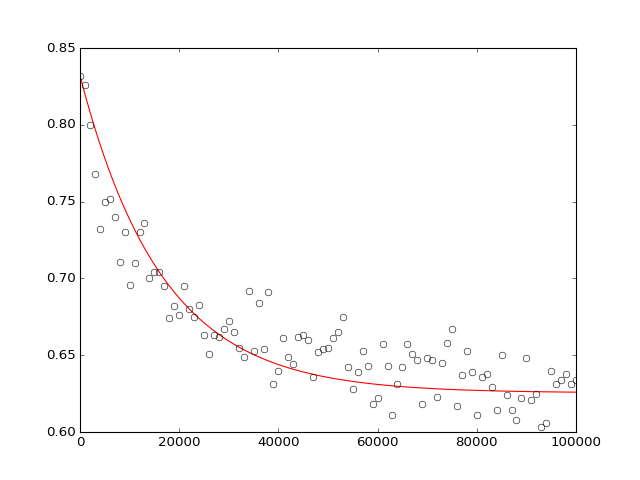

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # function evals   = 19
    # data points      = 101
    # variables        = 1
    chi-square         = 0.035
    reduced chi-square = 0.000
    Akaike info crit   = -801.603
    Bayesian info crit = -798.988
[[Variables]]
    decay_time:   16566.7337 +/- 741.5406 (4.48%) (init= 50000)
[[Correlations]] (unreported correlations are <  0.250)



In [41]:
#lmfit with self defined function
x = temp_data['dwell time'].values
y1 = temp_data['ps'][-1].values
#print x,y1
#from lmfit.models import ExponentialModel
#from lmfit import minimize, Minimizer, Parameters, Parameter, report_fit

#data = loadtxt('test_peak.dat')
#x = data[:, 0]
#y = data[:, 1]
fig = plt.figure()
def exp_decay(t, decay_time):
    amp = y1[0] - np.mean(y1[-10:-1])
    offset = np.mean(y1[-10:-1])
    return amp * np.exp(-t/decay_time) + offset

indeces = [int(r*len(y1)) for r in (0.0, 0.1, 0.9, 0.98)]
amp1 = y1[0]- y1[-1]

model  = lmfit.Model(exp_decay, independent_vars=['t'])
result = model.fit(y1, t = x,
                    decay_time = lmfit.Parameter(value = 0.5*max(x)),
                   )

decay_time = (result.best_values[key] for key in model.param_names)

print(result.fit_report(min_correl=0.25))
plt.plot(x, result.best_fit, 'r-')
plt.plot(x, y1, 'o', mfc='none')


In [38]:
import numpy as np
x = temp_data['dwell time'].values
y1 = temp_data['ps'][-1].values
#print x,y1
#from lmfit.models import ExponentialModel
#from lmfit import minimize, Minimizer, Parameters, Parameter, report_fit

#data = loadtxt('test_peak.dat')
#x = data[:, 0]
#y = data[:, 1]
relax = np.mean(y1[-10:-1])
amp = y1[0] - np.mean(y1[-10:-1])

def exp_decay(t, decay_time, offset):
    
    return amp * np.exp(-t/decay_time) + offset

indeces = [int(r*len(y1)) for r in (0.0, 0.1, 0.9, 0.98)]
amp1 = y1[0]- y1[-1]
print amp,y1[0],relax

0.206556 0.832 0.625444


In [ ]:
temp_data = ex.load_data(170411122046)

fig = plt.figure()

x = temp_data['dwell time'].values
y = temp_data['ps'][1]
plt.plot(x, temp_data['ps'][1], '--o', mfc='none')
plt.xlabel('t (ns)', size = 20)
plt.ylabel('Ps', size = 20)
plt.autoscale(enable=True, axis='both', tight=None)

<IPython.core.display.Javascript object>


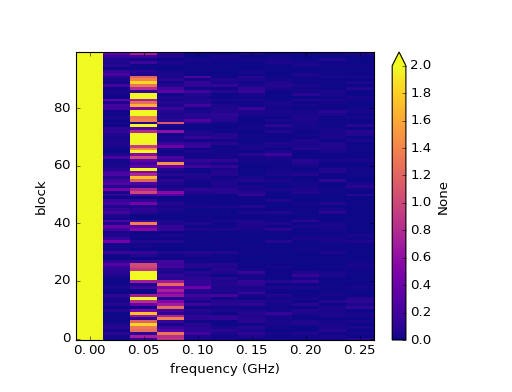

In [200]:
import xarray as xr
xarr_t = temp_data['ps']
t_arr  = xarr_t[xarr_t.coords.keys()[-1]].values
freq_label = 'frequency (GHz)'
coords = {}
for dim in xarr_t.dims[:-1]:
    coords.update({dim: xarr_t.coords[dim]})
coords[freq_label] = np.fft.rfftfreq(len(t_arr), d = t_arr[1] - t_arr[0])
dims = list(xarr_t.dims[:-1]) + [freq_label,]
spectrum = xr.DataArray(np.abs(np.fft.rfft(xarr_t.values))**2,
                        coords = coords, dims = dims)

tk.plot(spectrum)

In [ ]:
temp_data[]
t_wait       = d['wait time'].values
spin_signal  = d['spin signal'].values[cycle_rng]
ffted_signal = np.fft.rfft(spin_signal, norm = 'ortho')
freq         = np.fft.rfftfreq(len(t_wait), d = t_wait[1] - t_wait[0])

if len(t_lab)%block != 0:
    raise Exception('invalid block size')
ffted_sigal_trimed = ffted_signal[:-len(ffted_signal)%block]
blocked_fft  = ffted_signal.reshape(-1, block, ffted_signal.shape[-1]).mean(axis = -2)
peak_indeces = 1+np.argmax(np.abs(blocked_fft[:,1:]), axis = -1)
fft_peak     = freq[peak_indeces]
blocked_time = t_lab.reshape(-1, block).mean(axis = -1)

if False:
    z = spin_signal.reshape(-1, block, spin_signal.shape[-1]).mean(axis = -2)
    x = t_wait
    y = blocked_time

    fig, ax = plt.subplots(figsize = (4.,3.5))
    if True:
        dx, dy = abs(x[0]-x[1]), abs(y[0]-y[1])
        extent = [min(x)-dx/2., max(x)+dx/2., min(y) -dy/2., max(y) + dy/2.]
        cax = ax.imshow(z, cmap = 'gray', vmin = 0., vmax = 1., origin='lower',extent = extent,
                        aspect = (min(x)-max(x))/(min(y) - max(y)))
    else:
        cax = ax.pcolor(x, y, z, cmap = 'inferno', vmin = 0., vmax = 1.)
        plt.axis([x[0], x[-1], y[0], y[-1]])
    ax.tick_params(direction = 'out')
    plt.xlabel('evolution time (us)'); plt.ylabel('laboratory time (sec)')
    cbar = fig.colorbar(cax); cbar.set_label('spin-up probability')
    fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

if False:
    fig, ax = plt.subplots(figsize = (5.,3))
    plt.plot(blocked_time, fft_peak)
    plt.xlabel(r'time (sec)'); plt.ylabel('detuning (MHz)')
    fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()



<IPython.core.display.Javascript object>


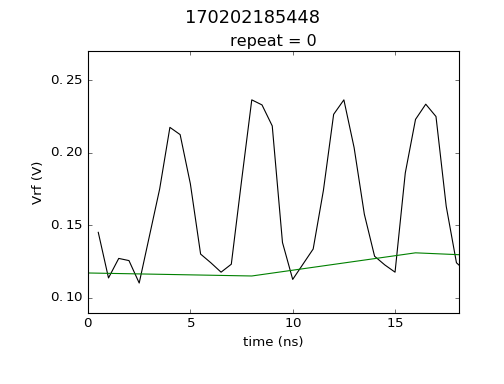

In [32]:
d = ex.load_data(h5files()[-1], load_now = True)
threshold = -0.02

block      = d.Vrf[d.coords.keys()[0]].values
rec        = d.Vrf['rec'].values
time_label = d.coords.keys()[-1]
time       = d.Vrf[time_label].values

Vrf = d.Vrf
if True:
    P_T = Vrf.values < threshold if threshold < 0 else Vrf.values >  threshold

    P_T_rec = np.average(P_T.reshape(len(block), len(rec), len(time)), axis = 1)

    fig = plt.figure(figsize = (5.5, 4))
    if True: #1d
        for b, P_T_block in enumerate(P_T_rec):
            c = plt.cm.nipy_spectral(b/float(len(block)))
            plt.plot(time, P_T_block + 0.*b, '-', color = c)
        plt.xlabel(time_label);plt.ylabel('Triplet prob.'); plt.title(d.filename)
    else:
        im  = plt.gca().pcolormesh(time, block, P_T_rec, cmap = 'viridis')
        fig.colorbar(im, label = 'Triplet probability')
        plt.xlabel(time_label); plt.ylabel(d.coords.keys()[0]); plt.title(d.filename)
    fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
else:
    tk.plot(tk.hist(Vrf, axis = -2))

<IPython.core.display.Javascript object>


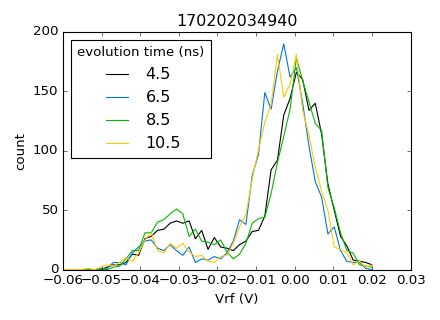

In [33]:
d = ex.load_data()
xarr = tk.hist(d.Vrf, axis = -2, range = (-0.06, 0.02), bins = 50)
t_evol = xarr['evolution time (ns)'].values
bins   = xarr['bins'].values

choices = 8, 12, 16, 20
fig = plt.figure(figsize = (5.5, 4))
for n, index in enumerate(np.array(choices)):
    c = plt.cm.nipy_spectral(n/float(len(choices)))
    plt.plot(bins, xarr.values[0][:,index], '-', color = c, label = t_evol[index])
plt.xlabel('Vrf (V)');plt.ylabel('count'); plt.title(d.filename)
plt.legend(loc = 'best', title = 'evolution time (ns)')
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

In [21]:
#visibility
VT = bins_centers[::]
integ2_nS,integ2_nT = (np.zeros((len(time_calc_stepped),len(VT))) for i in range(2))

for idx, t_int in enumerate(time_calc_stepped):
    t, TR, d_bins = t_int, decay_time, np.abs(bins_centers[0]-bins_centers[1])
    def n_Vrf(Vrf, sigma, P_T, Vrf_T, Vrf_S):
        dVrf = Vrf_T - Vrf_S
        g_coeff = 1./(np.sqrt(2*np.pi)*sigma)
        n_S  = g_coeff*np.exp(-(Vrf-Vrf_S)**2/(2*(sigma**2)))
        n_TT = g_coeff*np.exp(-t/TR)*np.exp(-(Vrf-Vrf_T)**2/(2*(sigma**2)))
        def relax(v_avg, v_bin):
            return np.exp(-(t/TR)*((v_avg-Vrf_S)/dVrf)-(v_bin-v_avg)**2/(2*(sigma**2)))
        n_TS = (g_coeff/dVrf)*(t/TR)*np.array(integrate.quad(relax, Vrf_S, Vrf_T, (Vrf,)))[0]
        return ((1.-P_T)*n_S + P_T*(n_TT+n_TS))*len(repeat)*d_bins

    integ2_nS[idx] = [integrate.quad(n_Vrf, VT.min(), VT[m], (sigma[idx], 0., Vrf_T[idx], Vrf_S[idx]))[0] for m in range(len(VT))]
    integ2_nT[idx] = [integrate.quad(n_Vrf, VT[m], VT.max(), (sigma[idx], 1., Vrf_T[idx], Vrf_S[idx]))[0] for m in range(len(VT))]
#    integ2_nS[idx] = integrate.quad(n_Vrf, VT, VT.max(), (sigma[idx], 0., Vrf_T[idx], Vrf_S[idx]))[0]
#    integ2_nT[idx] = integrate.quad(n_Vrf, VT.min(), VT, (sigma[idx], 1., Vrf_T[idx], Vrf_S[idx]))[0]

FS  = np.ones_like(integ2_nS) - integ2_nS #fidelities
FT  = np.ones_like(integ2_nT) - integ2_nT

vis = FS + FT -np.ones_like(FS)

vis_max = [np.max(vis[m]) for m in range(len(vis))]
best_VT = [VT[np.argmax(vis[m])] for m in range(len(vis))]

#plot
fig, host = plt.subplots()
plt.xscale("log" )
par1 = host.twinx()

p1 = host.plot(time_calc_stepped, vis_max, "b-", label = "Visibility_max")
p2 = par1.plot(time_calc_stepped, best_VT, "r-", label = "best_VT")

#host.set_xlim(0.1,)
#par1.set_xlim(0.1,)
#par1.set_ylim(-0.034,-0.024)
host.set_xlabel("time(ns)")
host.set_ylabel("Visibility_max")
par1.set_ylabel("best_VT(V)")

host.yaxis.label.set_color(p1[0].get_color())
par1.yaxis.label.set_color(p2[0].get_color())

tkw = dict(size = 5.5, width = 4)
host.tick_params(axis='y', colors = p1[0].get_color(), **tkw)
host.tick_params(axis='x', **tkw)
par1.tick_params(axis='y', colors=p2[0].get_color(), **tkw)

lines = [p1[0], p2[0]]

host.legend(lines, [l.get_label() for l in lines], loc = "lower right")
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
plt.show()

maximize_time = time_calc_stepped[np.argmax(vis_max)]
print maximize_time

fig = plt.figure()
plt.plot(VT, FS[np.argmax(vis_max)])
plt.plot(VT, FT[np.argmax(vis_max)])
plt.plot(VT, FS[np.argmax(vis_max)]+FT[np.argmax(vis_max)]-1)
#plt.axvline(-0.030700000000000109)
#ylim(0.,)
plt.xlabel('VT(V)');plt.ylabel('Visibility')
plt.legend((r'FS', 'FT'), loc = 'lower right')
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
plt.show()

<IPython.core.display.Javascript object>

2896.0


<IPython.core.display.Javascript object>

NameError: name 'ylim' is not defined

<IPython.core.display.Javascript object>


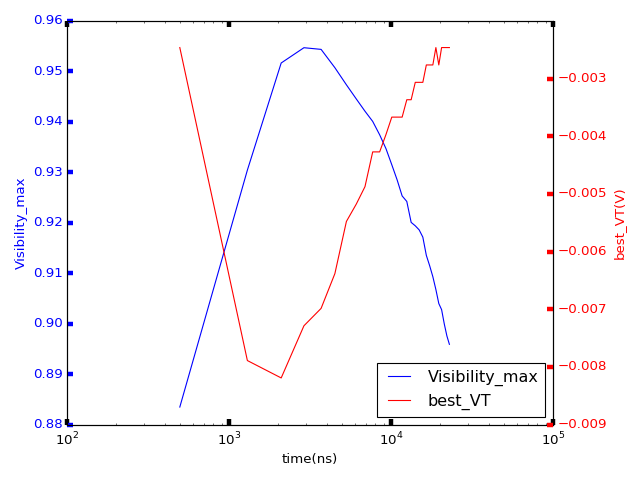

2896.0 0.954686547497


<IPython.core.display.Javascript object>


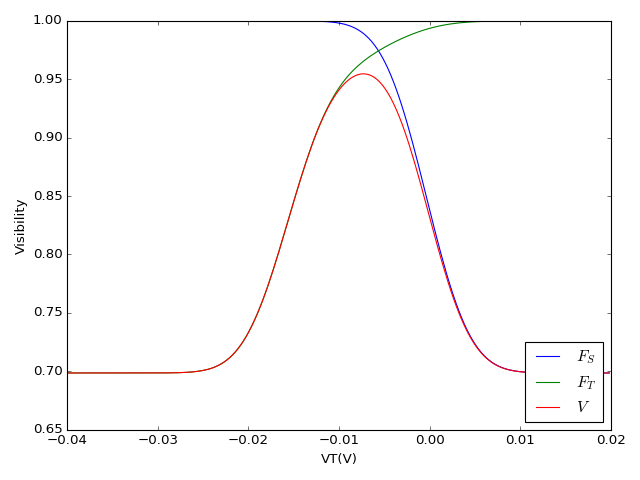

In [26]:
fig, host = plt.subplots()
plt.xscale("log" )
par1 = host.twinx()

p1 = host.plot(time_calc_stepped, vis_max, "b-", label = "Visibility_max")
p2 = par1.plot(time_calc_stepped, best_VT, "r-", label = "best_VT")

#host.set_xlim(0.1,)
#par1.set_xlim(0.1,)
#par1.set_ylim(-0.034,-0.024)
host.set_xlabel("time(ns)")
host.set_ylabel("Visibility_max")
par1.set_ylabel("best_VT(V)")

host.yaxis.label.set_color(p1[0].get_color())
par1.yaxis.label.set_color(p2[0].get_color())

tkw = dict(size = 5.5, width = 4)
host.tick_params(axis='y', colors = p1[0].get_color(), **tkw)
host.tick_params(axis='x', **tkw)
par1.tick_params(axis='y', colors=p2[0].get_color(), **tkw)

lines = [p1[0], p2[0]]

host.legend(lines, [l.get_label() for l in lines], loc = "lower right")
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
plt.show()

maximize_time = time_calc_stepped[np.argmax(vis_max)]
print maximize_time, np.max(vis_max)

fig = plt.figure()
plt.plot(VT, FS[np.argmax(vis_max)])
plt.plot(VT, FT[np.argmax(vis_max)])
plt.plot(VT, FS[np.argmax(vis_max)]+FT[np.argmax(vis_max)]-1)
#plt.axvline(-0.030700000000000109)
#ylim(0.,)
plt.xlabel('VT(V)');plt.ylabel('Visibility')
plt.legend((r'$F_S$', '$F_T$','$V$'), loc = 'lower right')
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
plt.show()

<IPython.core.display.Javascript object>


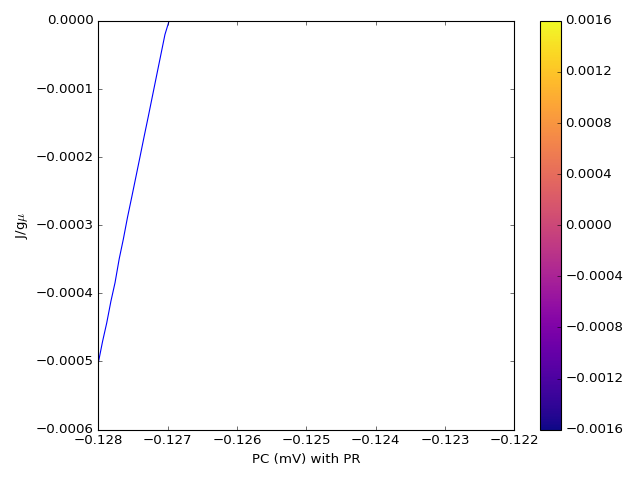

In [77]:
#spin funnel
d  = ex.load_data(170131115543)
d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)
#tk.plot(d, name = 'dVrf')#, ylog = True)

ep = d['PC (mV) with PR'].values
B  = d['Bext (T)'].values
t_s =100000e-4
t_t = 0.5e-10
ep_t = -0.127

def J(ep, t_couple, ep_t):
    t= t_couple
    return -(t_t**2/(np.sqrt(4*t_t**2+(ep-ep_t)**2)-(ep_t-ep)))

fig = plt.figure()
ax = plt.subplot(111)
#im =plt.gca().pcolormesh(B, ep, d['diff'].values, vmin = -0.0016, vmax = 0.0016, cmap = 'plasma')
plt.gca().plot(ep, J(ep, t_couple, ep_t))
fig.colorbar(im)
plt.xlabel('PC (mV) with PR');plt.ylabel('J/g$\mu$')
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
fig.canvas.draw()

## Calculate Init etc.

In [776]:
# With Center as ref, calculate meas,Init,, in (PR,PC) manner

center_position = np.array([0.0897,0.0941])         #
meas_position = np.array([0.0936,0.0911])  
#center_Meas = (0.0159, -0.0131)   # Fixed  used for CL < -1.20V
#center_Meas = (0.0168, -0.0117)   # Fixed  used for CL >= -1.20V & CL < -1.16V
#center_Meas = (0.0144, -0.0096)   # Fixed  used for CL >= -1.16V& CL < -1.14V
#center_Meas = (0.0126, -0.007)    # Fixed  used for CL >= -1.14V& CL < -1.12V
#center_Meas = (0.0106, -0.0059)   # Fixed  used for CL = -1.12V 0704
#center_Meas = (0.0120, -0.0062)    # Fixed  used for CL = -1.12V 0705
#center_Meas = (0.0112, -0.0053)    # Fixed  used for CL = -1.10V 0706
#center_Meas = (0.0079, -0.0023)    # Fixed  used for CL = -1.10V 0707
#center_Meas = (0.0092, -0.0032)    # Fixed  used for CL = -1.10V 0710
#center_Meas = (0.0084, -0.0031)    # Fixed  used for CL = -1.09V 0710
#center_Meas = (0.0097, -0.0045)    # Fixed  used for CL = -1.08V 0711
#center_Meas = (0.0093, -0.0041)    # Fixed  used for CL = -1.07V 0711
#center_Meas = (0.0091, -0.0055)    # Fixed  used for CL = -1.06V 0712
#center_Meas = (0.0107, -0.0049)    # Fixed  used for CL = -1.10V 0714
#center_Meas = (0.0107, -0.0049)    # Fixed  used for CL = -1.11V 0718
#center_Meas = (0.0129, -0.0075)    # Fixed  used for CL = -1.12V 0719
center_Meas = meas_position - center_position    # Fixed  used for CL = -1.12V 0719
#center_Medi = (-0.0052, 0.0042)   # Fixed
#center_Medi = (-0.0042, 0.0032)   # Fixed reduce 1mV,1mV since 0718
#center_Medi = (-0.0046, 0.0080)   # Fixed reduce since 0719
center_Medi = (-0.004, 0.004)   # Fixed reduce since 0719
#center_Init = (-0.0302, 0.0264)   # Fixed  before 2017.08.21
center_Init = (-0.0400, 0.0400)    # new , smaller to test if the asynchronization is from (1,1)-(2,1)
center_Tran = (-0.0302, 0.0144)

#fixed
Init_position = (center_position[0]+center_Init[0], center_position[1]+center_Init[1])
Medi_position = (center_position[0]+center_Medi[0], center_position[1]+center_Medi[1])
Meas_position = (center_position[0]+center_Meas[0], center_position[1]+center_Meas[1])
#Meas_position =

Medi = (Medi_position[0]- Meas_position[0], Medi_position[1]- Meas_position[1])
Init = (Init_position[0]- Meas_position[0], Init_position[1]- Meas_position[1])


print 'Init_position =', Init_position,'Init =', Init, 'Medi_position =', Medi_position,'Medi =', Medi,  'Meas_position =', Meas_position

Init_position = (0.049700000000000001, 0.1341) Init = (-0.043900000000000002, 0.042999999999999997) Medi_position = (0.085699999999999998, 0.098100000000000007) Medi = (-0.0079000000000000042, 0.0070000000000000062) Meas_position = (0.093600000000000003, 0.0911)


In [415]:
# meas_position - center_position , to get center_meas value
print np.array([0.1911, 0.211])-np.array([0.181, 0.2185])

[ 0.0101 -0.0075]


In [11]:
mee = (0.1, 0.2)
vec = (-0.03, 0.03)
inii = mee + vec
iniii = tuple(v1 + v2 for v1, v2 in zip(mee, vec))
P11, P22 = (0.11, 0.22)
print inii
print zip(mee,vec)
print iniii

(0.1, 0.2, -0.03, 0.03)
[(0.1, -0.03), (0.2, 0.03)]
(0.07, 0.23)


In [20]:
meee = np.array((1,2.))
veccc = np.array((-0.3, 0.3))
iniii = veccc + meee
(P111,P222) = iniii
print P111,P222,iniii

0.7 2.3 [ 0.7  2.3]


In [88]:
# calculate Init,coordi as (PR,PC) 
#center = (0.2213, -0.1425)       #CL =-1.23 0509
center = (0.2140, -0.1247)        #CL =-1.21 0510   (0.2296,-0.1735)     (0.2296,-0.1744)    (0.2296,-0.1750)
Meas_position = (0.2317, -0.1338)
#fixed
center_Init = (-0.0275, 0.0286)   # Fixed
Init_position = (center[0]+center_Init[0], center[1]+center_Init[1])
print Init_position
Init = (Init_position[0]- Meas_position[0], Init_position[1]- Meas_position[1])
print Init

(0.1865, -0.0961)
(-0.04519999999999999, 0.0377)


In [573]:
# calculate Init,coordi as (PR,PC) 
#center = (0.2213, -0.1425)       #CL =-1.23 0509
center = (0.2290, -0.1744)        #CL =-1.21 0510   (0.2296,-0.1735)     (0.2296,-0.1744)    (0.2296,-0.1750)
Meas = (0.0079,-0.0014)
#fixed
#center_Init = (-0.0275, 0.0286)   # Fixed
Meas_position = (Meas[0]+center[0], Meas[1]+center[1])
print Meas_position
#Init = (Init_position[0]- Meas_position[0], Init_position[1]- Meas_position[1])
#print Init

(0.2369, -0.1758)


## J_detuning fiting

<IPython.core.display.Javascript object>


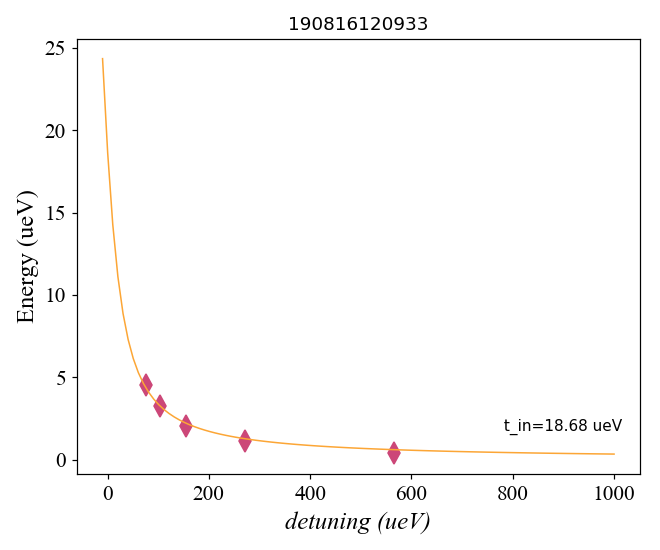

18.675792729954455
[[Model]]
    Model(J_ex)
[[Fit Statistics]]
    # function evals   = 13
    # data points      = 5
    # variables        = 1
    chi-square         = 0.114
    reduced chi-square = 0.029
    Akaike info crit   = -16.889
    Bayesian info crit = -17.280
[[Variables]]
    t_in:   18.6757927 +/- 0.270874 (1.45%) (init= 30)
[[Correlations]] (unreported correlations are <  0.250)



In [47]:
## 2018 0626 - 0720 -0726 -0730 -0927 -1004
#d1= ex.load_data(181129214110) # funnel 181204160510
d1= ex.load_data(190816120933)


def J_ex(epsilon, t_in):
    #return 0.5*(np.sqrt(epsilon**2 + 16*t_in**2)-epsilon)          # from Hubbard, U -> epsi
    return  0.5*(np.sqrt(epsilon**2 + 4*t_in**2)-epsilon)         # from M Simmons
    #return  np.sqrt(epsilon**2 + 4*t_in**2)-epsilon                # from TK
    #return  np.sqrt(epsilon**2 + 8*t_in**2)-epsilon                # from Jun
    #return  0.5*(np.sqrt(epsilon**2 + t_in**2)-epsilon)         # from Petta one-electron  
    #return   t_in**2/epsilon                                    # 4t**2/approximation when epsilon>> t, or: D Loss t**2/epsilon
    #return  t_in**2/(2*epsilon )                               # from Johnson thesis 

def exp_decay(t, decay_time, offset, amp):
    #bb == amp * np.exp(-aa/decay_time) + offset
    return amp * np.exp(-t/decay_time) + offset

# data ----------------------------------------------------------
B_array = np.array([0.13,0.1,0.05])   # from spin-funnel data   181129214110
PR_dip_array = np.array([1.2, 1.6, 2.4]) # detuning PR mV, data 0625, detuning PC/PR =1.4
epsi_dip_array = PR_dip_array * np.sqrt(1+1.4**2) * (1000/27)  # detuning energy in ueV, detuning eta 27mV/meV.

Ez = 0.4* 57.88 * B_array  #  Zeeman Energy in ueV, 57.88 is u_B in ueV/T, 0.4 is g factor

#det_arr  = np.array([80, 200, 300, 500])          # ueV  
#freq_arr = np.array([0.11,0.045,0.024, 0.011])  # GHz ,SWAP freq from 180718155749
#E_freq = 4.1* freq_arr                           # 4.1ueV/ GHz

# det_arr  = np.array([ 70, 98, 209, 293, 377, 432, 544])          # ueV  
# freq_arr = np.array([0.70,0.48,0.175, 0.118, 0.078, 0.058, 0.039])  # GHz ,SWAP freq from 180726123043
# E_freq = 4.1* freq_arr                           # 4.1ueV/ GHz

# det_arr  = np.array([ 101.4, 121.6, 182, 223,  263.6, 324])          # ueV,   40.5,  
# freq_arr = np.array([  0.63, 0.438,0.242,0.190, 0.141, 0.097])   # GHz ,SWAP freq from 180730204208 (orig 180727205614)  1.53,
# E_freq = 4.1* freq_arr                             # 4.1ueV/ GHz

# det_arr  = np.array([ 80,  120, 180,  260,  340])          # ueV,   40.5,  
# freq_arr = np.array([0.295,0.195,0.121, 0.071, 0.046])    # GHz ,SWAP freq from 180806162105 (orig 180803185416)  PL/PR =-2.2,
# E_freq = 4.1* freq_arr                              # 4.1ueV/ GHz

# det_arr  = np.array([   180,    255,   314,  432])    # 43,  60,  80,  100,  136,      # ueV,   40.5,  
# freq_arr = np.array([ 0.073, 0.045, 0.031, 0.021])    # 0.397,0.294, 0.227, 0.18, 0.12,   GHz ,SWAP freq from 180927160628 (orig 180926213328)  PL/PR =-2.5, sweep direc (1,-1.0)
# E_freq = 4.1* freq_arr                              # 4.1ueV/ GHz

# det_arr  = np.array([  40, 117,   154,    213,   270,  350])   # 39,   95,     # ueV,   40.5,  
# freq_arr = np.array([  0.537,0.188, 0.147, 0.098, 0.072, 0.047])   # 0.440, 0.225,  # GHz ,SWAP freq from 181004182944 (orig 181004154355)  PL/PR =-2.7, sweep direc (1,-1.0)
# E_freq = 4.1* freq_arr                              # 4.1ueV/ GHz

PR_sweep  = np.array([  9.6,  8.0,   6.8,    5.2,   4.0,  ])  # 2.85,    # mV of PR, not converted to energy  
freq_arr = np.array([ 0.075, 0.097, 0.131, 0.195, 0.290, ])   # 0.428,  # GHz ,SWAP freq from 181204160510 , det PR/PL = -2.6, sweep direc (-1.0,1.0)
E_freq = 4.1* freq_arr                              # 4.1ueV/ GHz

# det_vec, sweep_vec = np.array([-2.6, 1.0]), np.array([-1.0, 1.0])
# det_eta = PR_sweep*( np.abs(det_vec[0])/np.sqrt(det_vec[0]**2+det_vec[1]**2) + (np.abs(det_vec[1])/np.sqrt(det_vec[0]**2+det_vec[1]**2)) * np.abs(sweep_vec[1]/sweep_vec[0]) )
# det_E = det_eta / 30. * 1000 # ueV, 27mV /meV lever along detuing

inter_vec, sweep_vec = np.array([-2.6, 1.0]), np.array([-1.0, 1.0])
det_eta = PR_sweep* inter_vec[0]/np.sqrt(inter_vec[0]**2+inter_vec[1]**2) *(inter_vec[1]/inter_vec[0] - sweep_vec[1]/sweep_vec[0])
det_E = det_eta / 30. * 1000 # ueV, 27mV /meV lever along detuing


# ------ Converting det_PR to detuning energy scale  ( Spin funnel new)--------------------


PR_sweep_dip = np.array([2.34, 3.20,  4.78,  8.40, 17.5 ])   # mV, spin _funnel, 190816120933
B_array_dip =  np.array([0.20, 0.145, 0.092, 0.05, 0.0178  ])
inter_vec,sweep_vec = np.array([-0.03, 1.]), np.array([-1.0, 1.0])    # actual interdot direc from stability 190816120016


# PR_sweep_dip = np.array([3.8,   4.4,   5.4,   6.85 , 7.90 , 10.5, ])   # mV, spin _funnel, 181106121714
# B_array_dip =  np.array([0.185, 0.140, 0.104, 0.064, 0.050, 0.030, ])
# det_vec = np.array([1., 0.02])    # actual detuing direc from stability

# PR_sweep_dip = np.array([3.8,   4.4,   5.4,   6.85 , 7.90 , 10.5, ])   # mV, spin _funnel, 181106121714
# B_array_dip =  np.array([0.185, 0.140, 0.104, 0.064, 0.050, 0.030, ])
# det_vec = np.array([1,-1.20])    # actual detuing direc from stability,  

# PR_sweep_dip = np.array([1.4,  1.56,  2.02,  2.56])   # mV, spin _funnel, 181114190513, R =+0.2V
# B_array_dip =  np.array([0.2, 0.150, 0.100, 0.075])
# det_vec = np.array([1,-1.80])    # actual detuing direc from stability,  

#PR_sweep_dip = np.array([0.6,  1.00,  1.40,  1.80])   # mV, spin _funnel, 181114190513, R =+0.2V
#B_array_dip =  np.array([0.15, 0.116, 0.086, 0.066])  # negtive B side
# PR_sweep_dip = np.array([0.88,  1.14,  1.50,  1.93])
# B_array_dip =  np.array([0.15, 0.116, 0.086, 0.066])   # positive B side
# det_vec  = np.array([-2.6, 1.0])
#det_vec = np.array([-2.6, 1.0])    # actual detuing direc from stability,  


# sweep_vec = np.array([-1.0, 1.0])  # sweep direction in pulse
# det_eta = PR_sweep_dip*( np.abs(det_vec[0])/np.sqrt(det_vec[0]**2+det_vec[1]**2) + (np.abs(det_vec[1])/np.sqrt(det_vec[0]**2+det_vec[1]**2)) * np.abs(sweep_vec[1]/sweep_vec[0]) )
# det_E_f = det_eta / 30.0 * 1000 # ueV, 27mV /meV lever along detuing 7thcool, 30mV/meV for 8thcool

#inter_vec , sweep_vec = np.array([]), np.array([-1.0, 1.0])

E_funnel = 0.39 * 57.88 * B_array_dip  # g-facotr as 0.38, or 0.4 ?
det_eta = PR_sweep_dip* inter_vec[0]/np.sqrt(inter_vec[0]**2+inter_vec[1]**2) *(inter_vec[1]/inter_vec[0] - sweep_vec[1]/sweep_vec[0])
det_E_fun = det_eta / 30.0 * 1000  # ueV,  eta lever 30mV/meV

# end of data ------------------------------------------------------

fig, ax = plt.subplots(figsize = (6,5))

x_mag =   det_E_fun # det_arr  # epsi_dip_array  #field_array , distance_array  
y_rel =   E_funnel  # E_freq, E_funnel #Ez  #para_store2  
#y_err = fitted_rel_err
model  = lmfit.Model(J_ex, independent_vars=['epsilon'])
result = model.fit(y_rel, epsilon = x_mag,
                   t_in     = lmfit.Parameter(value = 30., min = 0., max = 200.))

# t_in = (result.best_values[key] for key in model.param_names)
t_inter = result.best_values['t_in']  #values[key]for key in result.var_names)

print t_in #result.var_names#t_int

x1= np.linspace(-10.,1000.,101) 
#params =  { 'decay_time':decay_time, 'offset': offset, 'amp': amp}
fitting_curve = model.func(x1, **result.best_values)
print(result.fit_report(min_correl=0.25))

# model  = lmfit.Model(J_ex, independent_vars=['epsilon'])
# result = model.fit(y_rel, epsilon = x_mag,
#                   t_in     = lmfit.Parameter(value = 4))

# t_in = (result.best_values[key] for key in model.param_names)

# params =  { 't_in':t_in }
# x1= np.linspace(0,2.,21)
# fitting_curve = model.func(x1, **result.best_values)

cmap = plt.cm.plasma
#ax.plot(x_interpo, smo(x_interpo), linewidth =1 , color = 'C0',alpha=0.7) # color = 'skyblue', c = np.random.rand(19)
#ax.errorbar(x_mag, y_rel, y_err, fmt = 's' ,capsize = 3, markersize = 10,  mfc = cmap(0.4),color = 'darkslategrey') # color = 'skyblue', mfc='C0',C4
#ax.errorbar(x_mag, y_rel+2, y_err, fmt = 's' ,capsize = 3, markersize = 16,  mfc = 'slateblue',color = 'darkslategrey') # crimson C3 ,plt.cm.cool(i)
ax.plot(x_mag, y_rel, 'd', ms = 10, c= cmap(0.5)  )#,  c = cmap(0.3)   
#ax.plot(det_E, E_freq, 'o', ms = 10, c= 'C0' )#,  c = cmap(0.3) 

ax.plot(x1, fitting_curve, linewidth = 1 ,c=cmap(0.8) )#, c = cmap(0.7))       #'slateblue',  alpha =2
#ax.plot(x_mag, y_rel-4, linewidth = 8 , color = 'C0',alpha=2)
#ax.plot(x_mag, y_rel-6, linewidth = 8 , color = 'C2',alpha=2) 
#ax.plot(x_mag, y_rel-8, linewidth = 8 , color = plt.cm.viridis(0.97))
#plt.plot(x, result.best_fit, 's',markersize = 8, color = 'C0')                 # color = 'dodgerblue'
#x_expanded = np.linspace(0, 50000, np.abs(x[1]-x[0]))       #x_expanded = np.arange(x.min(), 2.*x.max(), np.abs(x[1]-x[0]))

plt.xlabel('detuning (ueV)', size = 16, fontname = 'Times New Roman', style = 'italic')
#plt.xlabel('(ns)', size = 20, fontname = 'Century')
plt.ylabel('Energy (ueV)', size =16, fontname = 'Times New Roman')
plt.sca(ax)           ## plt.sca()  to set current axes of a subplot
plt.xticks( fontsize=14, rotation=0, fontname = 'Times New Roman')      # np.arange(50, 101, 5),
plt.yticks( fontsize=14, rotation=0, fontname = 'Times New Roman')      # np.arange(0.05, 0.26, 0.05),

#ax.text(0.2, 0.92, " Init = (0.006,-0.010) + (1,-2.20)* 0.012", fontsize = 14,transform=ax.transAxes )
ax.text(0.75, 0.1, " t_in=%.2f ueV"%(t_inter), fontsize = 10,transform=ax.transAxes )
#axarr[xx, yy].set(title = temp_data.attrs['filename'])
#plt.xlim((-1000,1000))
#plt.ylim((0,100))
plt.title(d1.attrs['filename'])
#plt.autoscale(enable = False, axis='both', tight = True)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02)) [f1],
#leg = axarr[xx, yy].legend( [f1],[" %d PS, jump=%s" %(total_num-index,jump)],prop={'size':8, 'family': 'Times New Roman'}, loc = 0)
#leg.set_title('%s'%(temp_data.attrs['filename']),prop={'size':8, 'family': 'Times New Roman'})

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w') #;plt.tight_layout(pad = 3.0, w_pad = 0.9, h_pad = 0.8)
fig.tight_layout()
#print para_store python
plt.show()
#J_ex_name??

## Tk decay scaling

<IPython.core.display.Javascript object>


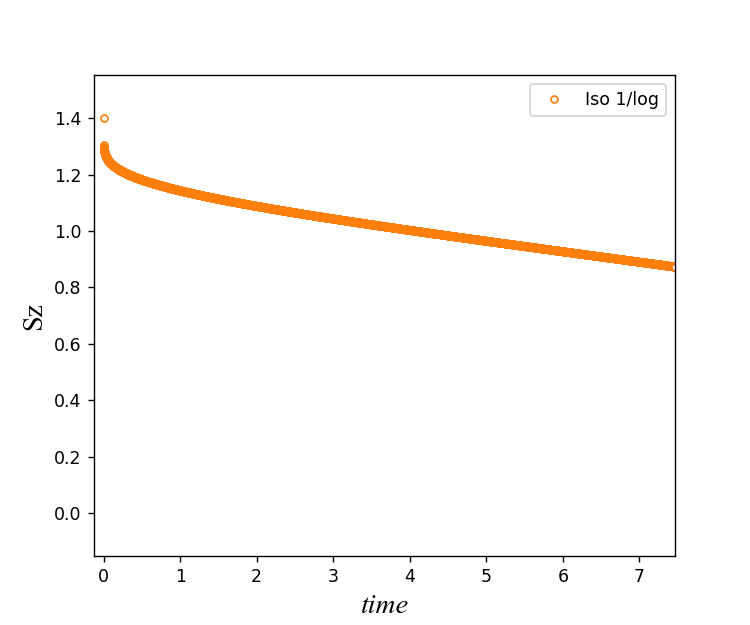

In [862]:
def Sz_aniso(Jz, c, Tk, t):    # here Anisotropic of AFM case is used  from H. Schoeller paper,  short time, 2010 PRL 104,106801
    return 1.0+2*Jz -2.*c -4.*c*(Tk*t)**(4.*c)

def Sz_iso(Jz, Tk, t):    # isotropic of AFM case (c =0) is used  from H. Schoeller paper,  short time, 2010 PRL 104,106801
    return 1.0+2*Jz + 1./np.log(Tk*t)   # logarithmic for short time limit only

c =  0.1 #  sqrt(Jz**2 - Jver**2), here Jver is 0 ?.
Jz = 0.2  # how is Jz normed ? to a dimentionless const
Tk = 0.02 # GHz ,normed by Plank const
t = np.linspace(0.,122.2, 100001) # ns (in correspondance to Tk GHz)

fig, ax = plt.subplots(figsize = (6,5))

#ax.plot(t, Sz_aniso(Jz,c, Tk, t), 'o', ms = 4, c= 'C0' ,mfc='w',label= 'Aniso powerlaw')#,  c = cmap(0.3)
ax.plot(t, Sz_iso(Jz, Tk, t), 'o', ms = 4, c= 'C1' ,mfc='w', label = 'Iso 1/log')#,  c = cmap(0.3)

#ax.axhline(y = 20., color= 'r', linestyle = '--', label = '20 ueV')

plt.xlabel('time', size = 16, fontname = 'Times New Roman', style = 'italic') #color = 'C1',
plt.ylabel('Sz', size =16, fontname = 'Times New Roman')
plt.legend()

<IPython.core.display.Javascript object>


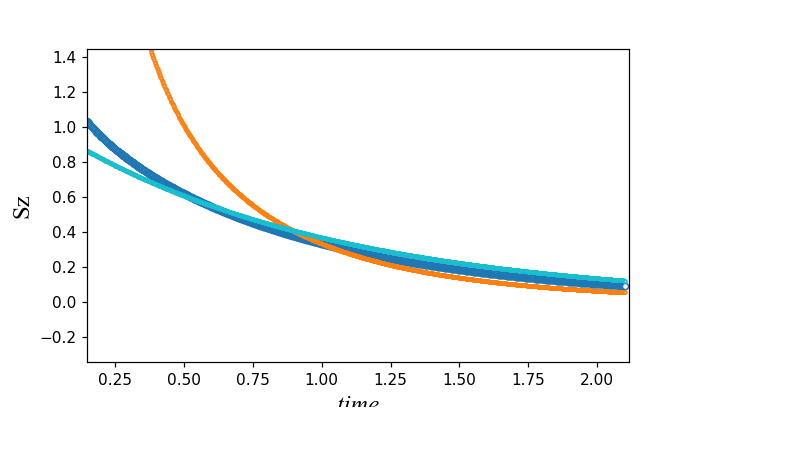

Text(0,0.5,'Sz')

In [799]:
#  Sz relaxation of Kondo regime, long time limit

def Sz_longt(g,Tk, t):  # for t >> 1/Tk  long time limit , from Herbert Schoeller, 2012  PRL 108,260601
    return 1/(t**g) * np.exp(-t*(1.1*Tk))  # Tk normed by h as freq

#g = 1/2. # g can be 1/2 or 4/5 depending on truncation order

Tk = 1. # GHz ,normed by Plank const
t = np.linspace(0.,2.1,1001) # ns

fig, ax = plt.subplots(figsize = (6,5))

ax.plot(t, Sz_longt(1./10., Tk, t), 'o', ms = 4, c= 'C0' ,mfc='w') #,  c = cmap(0.3)
ax.plot(t, Sz_longt(4./5., Tk, t), 'o', ms = 2, c= 'C1' ,mfc='w') #,  c = cmap(0.3)
ax.plot(t, np.exp(-t*Tk), 'o', ms = 2, c= 'C9' ,mfc='w') #,  c = cmap(0.3)
#ax.axhline(y = 20., color= 'r', linestyle = '--', label = '20 ueV')

plt.xlabel('time', size = 16, fontname = 'Times New Roman', style = 'italic') #color = 'C1',
plt.ylabel('Sz', size =16, fontname = 'Times New Roman')


<IPython.core.display.Javascript object>


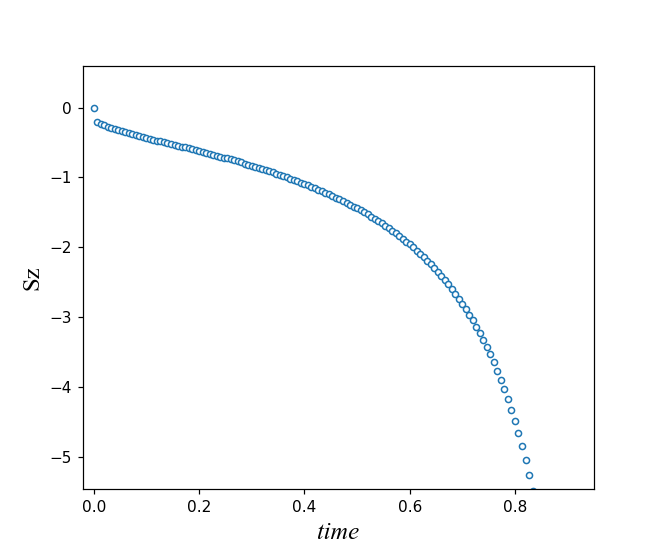

C:\Users\taruchalab\Anaconda2\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in log
  """
C:\Users\taruchalab\Anaconda2\lib\site-packages\ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in divide
  """


Text(0,0.5,'Sz')

In [83]:
t = np.linspace(0.,2.,301) # ns

fig, ax = plt.subplots(figsize = (6,5))

ax.plot(t, 1/np.log(t), 'o', ms = 4, c= 'C0', mfc='w')#,  c = cmap(0.3)
#ax.axhline(y = 20., color= 'r', linestyle = '--', label = '20 ueV')

plt.xlabel('time', size = 16, fontname = 'Times New Roman', style = 'italic') #color = 'C1',
plt.ylabel('Sz', size =16, fontname = 'Times New Roman')


<IPython.core.display.Javascript object>


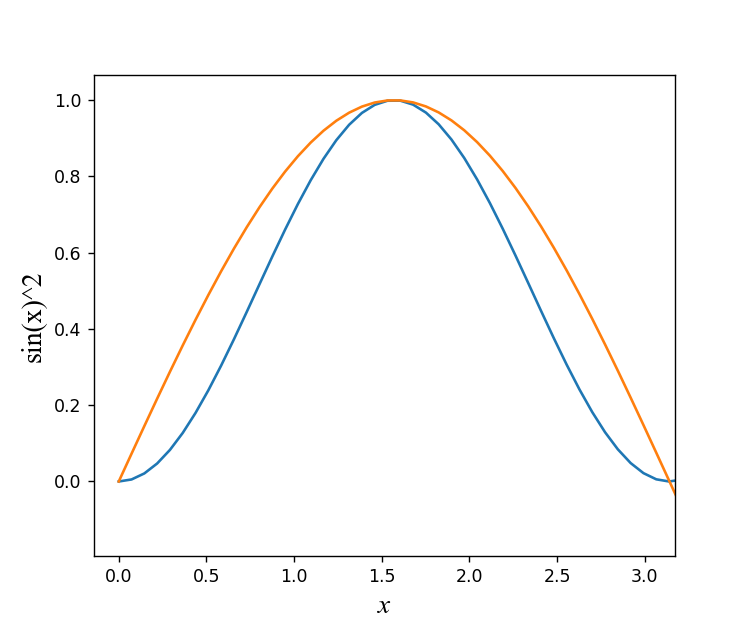

Text(0,0.5,'sin(x)^2')

In [2]:
x = np.linspace(0,7.3, 101)
y = np.sin(x)**2
ya = np.sin(x)
fig, ax = plt.subplots(figsize = (6,5))

ax.plot(x, y,x,ya, )#,  c = cmap(0.3)
#ax.axhline(y = 20., color= 'r', linestyle = '--', label = '20 ueV')

plt.xlabel('x', size = 16, fontname = 'Times New Roman', style = 'italic') #color = 'C1',
plt.ylabel('sin(x)^2', size =16, fontname = 'Times New Roman')

In [1016]:
## steps from X to Y

# def solution(X, Y, D):
#     if (Y-X)%D ==0:
#         return (Y-X)//D
#     else:
#         return (Y-X)//D +1
# solution(10,98,30)

# rectilinear , area of two rectangles

def area(K,L,M,N,P,Q,R,S):
    #
    def area0(K,L,M,N,P,Q,R,S):   
        total_a =  abs((M-K)*(N-L)) + abs((R-P)*(S-Q))
        if M<P or R<K or L>S or Q>N:
            
            return total_a
        else:
            inter_xL = max(K,P)
            inter_yL = max(Q,L)
            inter_xR = min(M,R)
            inter_yR = min(N,S)
            inter_a = abs( (inter_xR-inter_xL)* (inter_yR-inter_yL) )
            return total_a - inter_a
    area00 = area0(K,L,M,N,P,Q,R,S)
    return area00 if area00< 2190 else -1

area(2,0,4,3,1,1,5,2)
#print area00
        



8

In [38]:
# steps from X to Y, or 'frogjump'

def solution(X, Y, D):
    if (Y-X)%D ==0:
        return (Y-X)//D
    else:
        return (Y-X)//D +1
solution(10,98,30)

3

In [508]:
90//30

3

In [1066]:
x =5,y=1
# x = x | 3
# print x
xc = lambda x,y: x+y
print xc(x,y)

SyntaxError: can't assign to literal (<ipython-input-1066-218eb5c421ab>, line 1)

In [1084]:
stack = [1,2]
stack.pop()
print stack

[1]


In [1093]:
bb = list('ghi')
cc = list(reversed(bb))
print cc

['i', 'h', 'g']


In [6]:
def solve(parenthesis):
    stack = []
    cur = 0
    ret = 0
    for i, e in enumerate(parenthesis):
        if e == '(':
            stack.append(cur)   #stack.append(0)
            cur = 0
        elif e == ')' and len(stack) > 0:
            cur += stack.pop() + 2
            ret = max(ret, cur)
        elif e == ')' and len(stack) == 0:
            cur = 0
    return ret
paren = '()()((())))'
solve(paren)

6

In [17]:
# pair sum 
def pair(arr, X):
    j=0
    for i in arr:
        sub = X -i
        if sub in arr:
            print 'yes'
            j+=1
            break
    if j==0:
        print 'no'
#         else:
#             continue
            
pair(np.array([1,2,3,8,9]), 12)

yes


In [14]:
import itertools
m,n = 2,3
aa = [(x,y) for x in xrange(m) for y in xrange(n)]
bb= list(itertools.combinations(aa,3))
print bb[0][1][1]

1


In [23]:
for i, a in enumerate(['a','b','c']):
    print i,a

0 a
1 b
2 c


In [47]:
# meeting room seats arrangement not using numpy
import itertools   #

#aa = np.array([ [[0,0],[0,1],[0,2]], [[1,0],[1,1],[1,2]], [[2,0],[2,1],[2,2]] ] )
#np.sum(aa[0,1]-aa[0,0])
#bb= np.ndarray.flatten(a,'C')
# bb =np.squeeze(aa, axis=0) #.shape
# print bb
#bb=np.reshape(aa, (9,2))
#it = np.asarray(list(itertools.combinations(range(9),6)) )
#print bb[[0,1,4]],bb[it[0]]#.shape#bb[it[0]]#.shape it,
#lis = []#np.empty()

def min_neiboughor(m,n,p):
    
    aa = [(x,y) for x in range(m) for y in range(n)]
    occus = list(itertools.combinations(aa,p))
    count = []
        
    for combi in occus:
        adj = 0
        for i,seat_a in enumerate(combi):
            for seat_b in combi[i+1:]:
                if seat_a[0] == seat_b[0] or seat_a[1] == seat_b[1]:
                    if abs(seat_a[0]-seat_b[0])<2 and abs(seat_a[1]-seat_b[1])<2:
                        adj += 1
        count.append(adj)
        
    return min(count) #, count

min_neiboughor(7,2,13)
    


16

In [113]:
# meeting room seats arrangement

import itertools
aa = np.array([ [[0,0],[0,1],[0,2]], [[1,0],[1,1],[1,2]], [[2,0],[2,1],[2,2]] ] )
#np.sum(aa[0,1]-aa[0,0])
#bb= np.ndarray.flatten(a,'C')
# bb =np.squeeze(aa, axis=0) #.shape
# print bb
bb=np.reshape(aa, (9,2))
it = np.asarray(list(itertools.combinations(range(9),6)) )
#print bb[[0,1,4]],bb[it[0]]#.shape#bb[it[0]]#.shape it,
lis = []#np.empty()

for co,ii in enumerate(it):
    #print ii

    ar =  bb[ii]
    inter = 0
    for cc,seat1 in enumerate(ar):
        for seat2 in ar[cc+1:]:
            if seat1[0]==seat2[0] or seat1[1]==seat2[1]:
                if abs(seat1[0]-seat2[0])<2 and abs(seat1[1]-seat2[1])<2:
                    inter+=1
    lis.append(inter)           
    #print ar,inter
lis = np.asarray(lis)
vv= np.where(lis==min(lis)) # indices where inters are min

print bb[it[vv]]  # result of seats positions

#tes =[]
#bb[it[1]] # for x in lis if x==min(lis)]#if x == min(lis)
#print lis               
        
        

[[[0 0]
  [0 1]
  [0 2]
  [1 1]
  [2 0]
  [2 2]]

 [[0 0]
  [0 2]
  [1 0]
  [1 1]
  [2 0]
  [2 2]]

 [[0 0]
  [0 2]
  [1 1]
  [1 2]
  [2 0]
  [2 2]]

 [[0 0]
  [0 2]
  [1 1]
  [2 0]
  [2 1]
  [2 2]]]


In [112]:
#print [ a for a in range(3)]
#print it[2]
vv= np.where(lis==min(lis))
#lis
#min(lis)
print bb[it[vv]]#,lis #repr(lis)

[[[0 0]
  [0 1]
  [0 2]
  [1 1]
  [2 0]
  [2 2]]

 [[0 0]
  [0 2]
  [1 0]
  [1 1]
  [2 0]
  [2 2]]

 [[0 0]
  [0 2]
  [1 1]
  [1 2]
  [2 0]
  [2 2]]

 [[0 0]
  [0 2]
  [1 1]
  [2 0]
  [2 1]
  [2 2]]]


In [60]:
# Fibonacci

# def fib(n):
#     if n < 2:
#         return n
#     return fib(n-2) + fib(n-1)

# print fib(35)

class Solution(object):
    def swapPairs(self, head):
        """
        :type head: ListNode
        :rtype: ListNode
        """
        if head is None or head.next is None:
            return head
        else:
            temp = head.next
            head.next = self.swapPairs(temp.next)
            temp.next =head
        return temp
    
aaa= Solution()
print aaa.swapPairs(xrange(5))

AttributeError: 'xrange' object has no attribute 'next'

In [73]:
aa = [1,2,3,4,5,6]
bb = [1,2,3,4,5]
print aa[1:len(aa):2],aa[:len(bb):2]

[2, 4, 6] [1, 3, 5]


In [509]:
def swapPair(A):
    le = len(A)
    if A ==[]:
        return 'None'
#     if le==1:
#         return A[0]
    
    else:
        end = le if le%2==0 else le-1
        A[1:end:2],A[:end:2] = A[0:end:2],A[1:end:2] 
    return A

swapPair([2,4,6,7])



[4, 2, 7, 6]

In [140]:
A = [1,2,4,7,8]
print A[:len(A):2]

# aa = range(5)
# aa.reverse()
# print aa, range(5)[::-1]
#A[-2:] + A[:-2]
list(reversed(A))
b = list(A) #A[:]
#print id(A),id(b)
#sum(A)
sum(A[:2])

[1, 4, 8]


3

In [504]:
# eat chocolates in a circle
def naive(N,M):
    eaten = [False] * N
    at = 0
    cnt = 0
    while eaten[at] != True:
        eaten[at] = True
        at = (at + M) % N
        cnt += 1
         
    return cnt

naive(5,2)

5

In [109]:
# cyclic rotation  a,b,c -> c,a,b

# def solution(A, K):
#     # write your code in Python 3.6
#     if len(A)==0:
#         return A
#     for _ in range(K):
#         temp = A[-1]
#         for i in range(1,len(A))[::-1]:
#             A[i] = A[i-1]
#         A[0]= temp
#     return A

# codesays simple solution
def solution(A, K):
    # write your code in Python 2.7
    if len(A) == 0:
        return A
    K = K % len(A)
    return A[-K:] + A[:-K]

AttributeError: 'list' object has no attribute 'copy'

In [507]:
# find a subarray with given sum, ouput the start and end point 
def subArraySum(arr, sum_): 
      
    # Pick a starting  
    # point 
    n =len(arr)
    for i in range(n): 
        curr_sum = arr[i] 
      
        # try all subarrays 
        # starting with 'i' 
        j = i+1
        while j <= n: 
          
            if curr_sum == sum_: 
                print ("Sum found between") 
                print("indexes %d and %d"%( i, j-1)) 
                  
                return 1
                  
            if curr_sum > sum_ or j == n: 
                break
              
            curr_sum = curr_sum + arr[j] 
            j += 1
  
    print "No subarray found"
    return 0

subArraySum([2,3,5,8,6],19)

Sum found between
indexes 2 and 4


1

In [477]:
np.log(0.00001)

-11.512925464970229

In [495]:
aa = [4,5,6,7,9]
print aa[:-3:-1] #aa[:1:-1]

[9, 7]


In [450]:
sizes = [2,3,1]
print zip(sizes[:-1], sizes[1:])

[(2, 3), (3, 1)]


In [510]:
# find the odd-time number
# using XOR :  X xor X = 0, 0 xor X = X
# result = 0
# for x in A:
#     result ^= x
# return result

def solution(A):
    # write your code in Python 2.7
    occurences = dict()
    for n in A:
        if occurences.get(n):
            occurences[n] += 1;
        else:
            occurences[n] = 1;
    for n in occurences:
        if occurences[n] % 2 <> 0:
            re = n
    return re, occurences
    pass
solution([2,3,2,4,3] )
# occ = {2: 2, 3: 2, 4: 1}
# print occ[5]

(4, {2: 2, 3: 2, 4: 1})

In [114]:
# jumping  self
tar = 9723
di = tar//10 
#int(str(operationTwo)[:-1])
print di
def jum(tar):
    if tar 

972


In [ ]:
# Jumping numbers, (probably within 100)
from collections import deque
def gen(n):
    yield 0
    lis=deque([1,2,3,4,5,6,7,8,9])
    while(len(lis)!=0):
        temp=lis.popleft()
        if(temp>n):
            continue
            yield temp
    lm = temp%10
    if(lm >0):
        lis.append(temp*10+(lm-1))
    if(lm <9):
        lis.append(temp*10+(lm+1))

#for _ in range(int(input())):
n=int(input())
result=gen(n)
for p in result:
    print(p) #end=" "
    print()

In [128]:
#np.arange(2+1,6+1)
#bin(2^3^4^5^6) # XOR

gg = ['0e','bf','3w','o4']
#gg.sort()
#print gh
gh= sorted(gg, reverse=False)
print gh

['0e', '3w', 'bf', 'o4']


In [131]:
sys.maxsize

9223372036854775807L

In [130]:
import sys   ##number Solitaire [0,6] step, dynamical programming
import itertools #  combination  , permutation
def solution(A):        
    dp = [0] * len(A)
    dp[0] = A[0]

    for i in range(1, len(A)):
        maxVal = -sys.maxsize - 1

        for k in range(1, 7):
            if i-k >= 0:
                maxVal = max(maxVal, dp[i-k] + A[i])

        dp[i] = maxVal
    return dp[len(A)-1]

A = [-1, -2, -3, -4, -3, -8, -5, -2, -3, -4, -5, -6, -1]
solution(A)

-6

In [133]:
# bitwise XOR  ^
def bitxor(a,b): 
    arr = np.arange(a+1,b+1)
    x = a
    for ele in arr:
        x ^= ele
    return x

bitxor(3,6)
#bitxor()

4

In [66]:
# binary gap
# def gap(A):
#     binA = bin(A)[2:]
#     wid = 0
#     count= []
#     for i in list(binA):
#         if i=='0':
#             wid += 1
#         else:
#             count.append(wid)
#             wid=0
#     return max(count), count

def gap(A):
    
    binA = bin(A)[2:]
    wid = 0
    max_w = 0
    for i in list(binA):
        if i=='0':
            wid += 1
        else:
            if max_w < wid:
                max_w = wid
            wid=0
    return max_w

gap(20580)


5

In [512]:
binA = bin(425)[2:]
print list(binA)

['1', '1', '0', '1', '0', '1', '0', '0', '1']


In [513]:
aa = iter(range(5))
bb = xrange(5)
print list(aa),type(aa)

[0, 1, 2, 3, 4] <type 'listiterator'>


In [517]:
bb = '10100010sdas0'
cc = bb.rstrip('0sad')
print cc
#print bb.split('0')

1010001


In [125]:
# a = [3,4,5]
# aa = list(enumerate(a))
# print aa

import itertools
a = [1,2,3,7]
b = list(itertools.combinations(a,3)) # a list of tuples (1,2,3) (2,3,7)

def triangle(A):
    sides = list(itertools.combinations(A,3))
    c = 0
    for side in sides:
        print side
        if side[0]+side[1] > side[2] and side[1]+side[2] > side[0] and side[0]+side[2] > side[1]:
            c=1
        else:
            pass
    return c


A = [1,2,3,5]
triangle(A)


(1, 2, 3)
(1, 2, 5)
(1, 3, 5)
(2, 3, 5)


0

In [ ]:
# triangle with sorted A,  giving: consecutive P ,Q, R,   R+Q>P, R+P>Q, so only need to check P+Q>R

def solution(A):
    triangle = 0
    A.sort(reverse=True)
    for j in xrange(len(A[:-2])):
        if A[j] < A[j+1] + A[j+2]:
            triangle = 1
            break
    return triangle

In [531]:
[0]*6

[0, 0, 0, 0, 0, 0]

In [528]:
aa = (x>2 for x in range(5))  ## generator comprehension
# for i in aa:
#     print i

#all(aa)
all([0,1,2])
#all(['False'])
print all([0]), all('0'),all('False'),all([False,1]),all([])

False True True False True


In [ ]:
# distinct numbers
def solution(A):
    if len(A) == 0:
        distinct = 0
    else:
        distinct = 1
        A.sort()
        for index in xrange(1, len(A)):
            if A[index] == A[index-1]:
                # The same element as the previous one
                continue
            else:
                # A new element
                distinct += 1
    return distinct

In [62]:
bin(20580)[2:]

'101000001100100'

In [53]:
a = list(bin(29)[2:])
type(a[1])


str

In [168]:
# nesting of parentheses

def solution(S):
    parentheses = 0
    for element in S:
        if element == "(":
            parentheses += 1
        else:
            parentheses -= 1
            if parentheses < 0:
                return 0
    if parentheses == 0:
        return 1
    else:
        return 0
S = ''
solution(S)

1

In [169]:
def solution(A):
    A_len = len(A)
    candidate = -1
    candidate_count = 0
    candidate_index = -1
    for index in xrange(A_len):
        if candidate_count == 0:
            candidate = A[index]
            candidate_index = index
            candidate_count += 1
        else:
            if A[index] == candidate:
                candidate_count += 1
            else:
                candidate_count -= 1
    if len([number for number in A if number == candidate]) <= A_len//2:
        return -1
    else:
        return candidate_index
    
solution([1,2,3,2,4,2,2])

6

In [174]:
# return any index of the dominator of an array
def solution(A):
    size = len(A) // 2
    counter = dict()
    for i in xrange(len(A)):
        n = A[i]
        counter.setdefault(n, [i, 0])  # setdefault only set key and value if this key is not yet in dict
        counter[n][1] += 1
        if counter[n][1] > size:
            return counter[n][0]
    return -1

solution([1,2,3,2,4,2,2])

{1: [0, 1], 2: [1, 4], 3: [2, 1], 4: [4, 1]}

In [184]:
# Min-Perimeter-Rectangle
# from math import sqrt
# a =sqrt(45)
# print a,int(a)

def solution(N):
    # write your code in Python 3.6
    from math import sqrt
    for i in range(int(sqrt(N)),0,-1):
        if N%i == 0:
            return (int(N/i) +i)*2
solution(45)

28

In [185]:
# Count-Factors, number of factors
def solution(N):
    # write your code in Python 3.6
    candi = 1
    count = 0
    while candi*candi < N:
        if N%candi==0:
            count+=2
        candi +=1
    if candi*candi ==N:
        count +=1
    return count

solution(80)

10

In [532]:
count = {'element':3}
#count['ele' ] =0
a = 5
a = a + count.get('element1',5)  # the value in get if the returned value if key is not found!
print a
# A =[4,5,6]
# for element in A:
#     count[element] = count.get(element,0)+1
#     print count 
print count.get('element'),count

10
3 {'element': 3}


In [534]:
S = '1A 2B 3C'
type(S.split())
print S.split()
#ord('F')

['1A', '2B', '3C']


In [341]:
# Rakuten code test 2019, max nails that can be hammered to the same height 

def solution(A, K):
    n = len(A)
    best = 0
    count = 1
    for i in range(n - K- 1 ):
        if (A[i] == A[i + 1]):
            count = count + 1
        else:
            count = 1
        best = max(best, count)
    result = best + K if K< n-1 else n

    return result ,best,count

A = [1,2,3,3,4,4,4,5]
#A = [1,2,4,5,5,5,5,5,5]
#A = [2,2,4,4,4,4,5,5,5]
#A = [1,1,3,3,3,4,5,5,5,5]
#A = range(10000)
#A =[1,1]
A = range(1000,-1,-1)#
A.append(0)
A = A[::-1]
solution(A,1002)

(1002, 0, 1)

In [538]:
BB = list(range(10,0,-1)) 
BB.append(0)
print BB

[10, 9, 8, 7, 6, 5, 4, 3, 2, 1, 0]


In [51]:
d=[]
for i in range(1,999):
    d.append(list(bin(i)[2:])[0] )
print d    

['1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1', '1',

In [16]:
# find minimum integer not in a list, missing integer

aa = np.array([-2,-1,0,-3,1,2,4])
bb =aa[np.where(np.sort(aa)>0)]
cc =np.arange(1,bb[-1]+2)
dd= np.setdiff1d(cc,bb)
print dd

[3]


In [540]:
# find minimum missing integer not in a list
aa = [-2,-1,0,0,2,2,3,3,4,4]

cc =  range(1, len(aa)+2 )     # instead of : bb = [i for i in sorted(A) if i>0 ]  ;cc = [1] if len(bb)==0 else range(1,bb[-1]+2)  , 
#dd =  min(list(set(cc) - set(aa)))
dd =  min(set(cc) - set(aa))
print dd,set(cc) - set(aa)

1 set([1, 5, 6, 7, 8, 9, 10, 11])


In [542]:
set([(1,2),(1,-2),(-1,2)])

{(-1, 2), (1, -2), (1, 2)}

In [544]:
0/0

ZeroDivisionError: integer division or modulo by zero

In [555]:
aa = [0,2]
aa.append([3,3])
print len(aa)

3


In [559]:
aa = (1,2)
print abs(aa[0])

1


In [577]:
# Rakuten test 2, count the different vector directions 

def solution(A):
    ray = 1
    direc = []
    for aa in A:
        if aa[0] == 0:
            dire = [ 0, aa[1]/abs(aa[1])]
            if dire not in direc:
                direc.append(dire)
        elif aa[1] ==0:
            dire = [ aa[0]/abs(aa[0]), 0]
            if dire not in direc:
                direc.append(dire)
        else:
            dire = [ aa[0]/abs(aa[0]), aa[1]*1.0/aa[0] ]
            
            if dire not in direc:
                print dire
                direc.append(dire)
                
    print repr(direc)
    return len(direc)


A = [(-1,-2), (1,2) ,(2,4), (-3,2),(2,-3),(-2,-4),(0,2),(0,-3)]

solution(A)


[-1, 2.0]
[1, 2.0]
[-1, -0.6666666666666666]
[1, -1.5]
[[-1, 2.0], [1, 2.0], [-1, -0.6666666666666666], [1, -1.5], [0, 1], [0, -1]]


6

In [585]:
A = [(-1,-2), (1,2) ,(2,4), (-3,2),(2,-3),(-2,-4),(0,2),(0,-3)]
print A.sort(key =sortSecond)

NameError: name 'sortSecond' is not defined

In [587]:
# A function that returns the length of the value:
def myFunc(e):
    
    return len(e)

cars = ['Ford', 'Mitsubishi', 'BMW', 'VW']

cars.sort(key=myFunc)
print cars

['VW', 'BMW', 'Ford', 'Mitsubishi']


In [570]:
aa = [ [1,2], [2,3]]
if [1,2] not in aa:
    aa.append([1,2])
    print 'y',aa,len(aa)

In [571]:
print aa

[[1, 2], [2, 3]]


In [ ]:
# frog river, with set O(n2)

def solution(X, A):
    # write your code in Python 3.6
    b = []
    T = set(range(1,X+1))
    for i,a in enumerate(A):
        b.append(a)
        if set(b) == T:
            return i
    return -1



In [157]:
# frog river with dict
# with dict
def solution(X, A):
    pos = {}
    for n,i in enumerate(range(len(A))):
        pos.update({A[i]:i})
        if len(pos)==X:
            return n
    return -1

solution(4,[2,2,3,4,5,1,1])

4

In [158]:
# cars pair
def solution(A):
    seen_going_east = 0
    n_pairs = 0
    for car in A:
        if car == 0: # the car is going east
            seen_going_east += 1
        else: # the car is going west
            n_pairs += seen_going_east
    return n_pairs if n_pairs <= 1000000000 else -1

solution([0,1,0,0,1])

4

In [155]:
A = [2,2,3,4,5,1,1]
pos = {}
for i in xrange(len(A)):
    pos.update({A[i]:i})
print pos

{1: 0, 2: 2, 3: 3}


In [35]:
bb= [0,1,1,1,2,2,2,3,3]
cc = range(1,bb[-1]+2)
print cc
#list(set(cc) - set(bb))
min(bb)

[1, 2, 3, 4]


0

In [154]:
set([1,2,3]) ==set([1,2,2,3,3])

True

In [20]:
aa = [-2,-1,-4,-3,]
bb = [i for i in aa if i>0]
print len(bb),sorted(aa)

0 [-4, -3, -2, -1]


In [148]:
a = range(1,5)
b = sorted([4,1,2,3])
#a == b

c = set(range(1,5))
d = set([2,1,3,4])
c == d

True

In [640]:
aa = np.array([[1,2,3,4]])
bb = np.array([4,5,6])
cc = np.array([[1,2],[3,4],[5,6]])

dd = np.array([[0.1,0.2,0.3]])

print np.matmul(aa.T,dd)
#print aa.T #.shape#*bb.T #aa.shape

[[0.1 0.2 0.3]
 [0.2 0.4 0.6]
 [0.3 0.6 0.9]
 [0.4 0.8 1.2]]


In [617]:
# class __init__ pratice

class point2d():
    def __init__(self,x=0,y=0):
        self.x = x
        self.y = y
    def euclead(self, d):
        dis = sqrt(self.x**d + self.y**d)
        return dis
    

dd = point2d(3,2)
dd.x
#dd.euclead(3)

3

In [612]:
# class attribute and instance attribute

class warehouse1:
    purpose = 'storage'
    region = 'west'
    
class warehouse2:
    def __init__(self):
        self.purpose = 'play'
        self.region = 'here'

aa = warehouse1()
bb = warehouse2()

aa.region = 'east';bb.region = 'nowhere'
aa.region,bb.region
#aa.__class__

('east', 'nowhere')

In [3]:
# pairs of even-sum 
ss = 'yuoow'
#ss[::-1]
import itertools
lis = [1,2,3,4,5]
o_li=[]
e_li=[]
for ii in lis:
    if ii%2 ==0:
        e_li.append(ii)
    else:
        o_li.append(ii)
    
pair_o = list(itertools.combinations(o_li,2))
coun_o = len(pair_o)
pair_e = list(itertools.combinations(e_li,2))
coun_e = len(pair_e)

count_sum = coun_o + coun_e
result = count_sum if count_sum<9000 else -1

print e_li,coun_e, o_li, coun_o, pair_o, pair_e, result


[2, 4] 1 [1, 3, 5] 3 [(1, 3), (1, 5), (3, 5)] [(2, 4)] 4


In [4]:
import itertools
ss = '1234'
dd = list(str(ss))
res = itertools.permutations(ss,3)
re = list(res)
print re[0],re[-1],len(re)

('1', '2', '3') ('4', '3', '2') 24


In [82]:
print np.log(1/0.9999) 

-0.00010000500033334732


In [20]:
t_inter

<generator object <genexpr> at 0x000000001C530510>

<IPython.core.display.Javascript object>


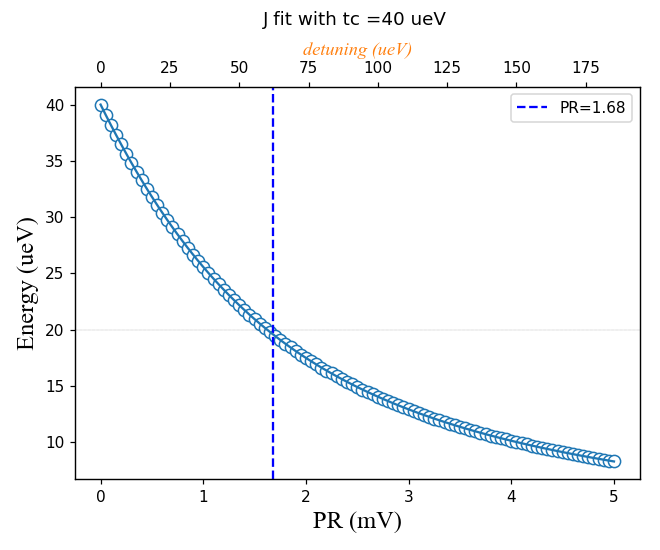

In [764]:

def J_ex(epsilon, t_in):
    #return 0.5*(np.sqrt(epsilon**2 + 16*t_in**2)-epsilon)          # from Hubbard, U -> epsi
    return  0.5*(np.sqrt(epsilon**2 + 4*t_in**2)-epsilon)         # from M Simmons
    #return  np.sqrt(epsilon**2 + 4*t_in**2)-epsilon                # from TK
    #return  np.sqrt(epsilon**2 + 8*t_in**2)-epsilon                # from Jun
    #return  0.5*(np.sqrt(epsilon**2 + t_in**2)-epsilon)         # from Petta one-electron  
    #return   t_in**2/epsilon                                    # 4t**2/approximation when epsilon>> t, or: D Loss t**2/epsilon
    #return  t_in**2/(2*epsilon )                               # from Johnson thesis 

def exp_decay(t, decay_time, offset, amp):
    #bb == amp * np.exp(-aa/decay_time) + offset
    return amp * np.exp(-t/decay_time) + offset

fig, ax = plt.subplots(figsize = (6,5))

slope_vec = np.array([-1.0, 1.0])
det_vec = np.array([1.0, 0.])
PR_sweep = np.linspace(0,5,101)   # PR along slope [-1.0, 1.0] in  mV
def PRtodet_E(PR):
    det_eta =  PR*( np.abs(det_vec[0])/np.sqrt(det_vec[0]**2+det_vec[1]**2) + (np.abs(det_vec[1])/np.sqrt(det_vec[0]**2+det_vec[1]**2)) * np.abs(sweep_vec[1]/sweep_vec[0]) )
    det_epsilon = det_eta/27. *1000  # ueV  (eta: 27mV/1000ueV, along detuning)
    return det_epsilon

t_in = 40 # ueV
det_epsilon = PRtodet_E(PR_sweep)
ax.plot(PR_sweep, J_ex(det_epsilon, t_in), 'o', ms = 8, c= 'C0' ,mfc='w')#,  c = cmap(0.3)
ax.axhline(y = 20., color= 'k', linestyle = '--',lw=0.1) #  label = '20 ueV'  or 2.3Tk
for x in np.linspace(0,10,1001):
    if np.abs(J_ex(PRtodet_E(x),t_in )-20.) <0.5:
        xc = x
ax.axvline(x = xc, color= 'b', linestyle = '--', label = 'PR=%s'%(xc)) #label = 'PR=%s with slope=%s'%(xc,slope_vec)

plt.sca(ax)
plt.xlabel('PR (mV)', size = 16, color = 'k', fontname = 'Times New Roman') #, style = 'italic'
plt.ylabel('Energy (ueV)', size =16, fontname = 'Times New Roman')
plt.legend()

ax2 = ax.twiny()
det_epsilon = PRtodet_E(PR_sweep)
ax2.plot(det_epsilon, J_ex(det_epsilon, t_in), '-' ,c= 'C0' )#, 

plt.sca(ax2)
plt.xlabel('detuning (ueV)', size = 12, color = 'C1',fontname = 'Times New Roman', style = 'italic')
plt.ylabel('Energy (ueV)', size =16, fontname = 'Times New Roman')

#ax.plot(x1, fitting_curve, linewidth = 1 ,c='C1')#, c = cmap(0.7))       #'slateblue',  alpha =2
#plt.plot(x, result.best_fit, 's',markersize = 8, color = 'C0')                 # color = 'dodgerblue'
#x_expanded = np.linspace(0, 50000, np.abs(x[1]-x[0]))       #x_expanded = np.arange(x.min(), 2.*x.max(), np.abs(x[1]-x[0]))

#plt.xlabel('detuning PR (meV)', size = 16, fontname = 'Times New Roman', style = 'italic')
#plt.ylabel('Energy (ueV)', size =16, fontname = 'Times New Roman')
#plt.sca(ax)           ## plt.sca()  to set current axes of a subplot
#plt.xticks( fontsize=14, rotation=0, fontname = 'Times New Roman')      # np.arange(50, 101, 5),
#plt.yticks( fontsize=14, rotation=0, fontname = 'Times New Roman')      # np.arange(0.05, 0.26, 0.05),

#ax.text(0.2, 0.92, " Init = (0.006,-0.010) + (1,-2.20)* 0.012", fontsize = 14,transform=ax.transAxes )
#plt.xlim((-1000,1000))
#plt.ylim((0,100))
#plt.title(d1.attrs['filename'])
plt.title('J fit with tc =%s ueV \n'%(t_in),y=1.08)

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w') ;plt.tight_layout(pad = 2.0, w_pad = 0.9, h_pad = 0.9)
fig.tight_layout()
#print para_store python
plt.show()

<IPython.core.display.Javascript object>


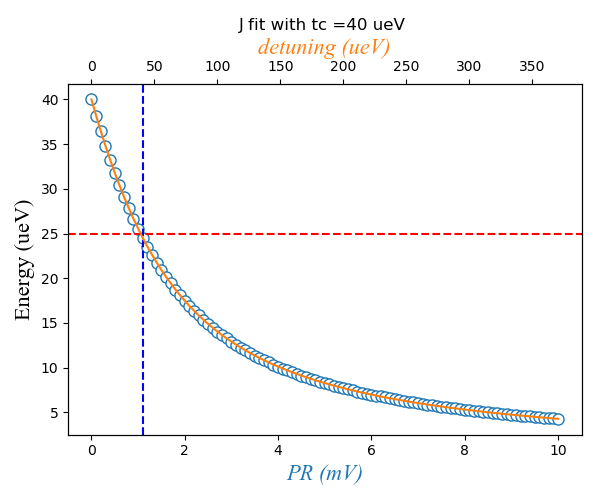

In [101]:

def J_ex(epsilon, t_in):
    #return 0.5*(np.sqrt(epsilon**2 + 16*t_in**2)-epsilon)          # from Hubbard, U -> epsi
    return  0.5*(np.sqrt(epsilon**2 + 4*t_in**2)-epsilon)         # from M Simmons
    #return  np.sqrt(epsilon**2 + 4*t_in**2)-epsilon                # from TK
    #return  np.sqrt(epsilon**2 + 8*t_in**2)-epsilon                # from Jun
    #return  0.5*(np.sqrt(epsilon**2 + t_in**2)-epsilon)         # from Petta one-electron  
    #return   t_in**2/epsilon                                    # 4t**2/approximation when epsilon>> t, or: D Loss t**2/epsilon
    #return  t_in**2/(2*epsilon )                               # from Johnson thesis 

def exp_decay(t, decay_time, offset, amp):
    #bb == amp * np.exp(-aa/decay_time) + offset
    return amp * np.exp(-t/decay_time) + offset

fig, ax = plt.subplots(figsize = (6,5))

slope_vec = np.array([-1.0, 1.0])
det_vec = np.array([1.0, 0.])
PR_sweep = np.linspace(0,10,101)   # PR along slope [-1.0, 1.0] in  mV
sweep_vec = np.array([-1.0, 1.0])

def PRtodet_E(PR):
    det_eta =  PR*( np.abs(det_vec[0])/np.sqrt(det_vec[0]**2+det_vec[1]**2) + (np.abs(det_vec[1])/np.sqrt(det_vec[0]**2+det_vec[1]**2)) * np.abs(sweep_vec[1]/sweep_vec[0]) )
    det_epsilon = det_eta/27. *1000  # ueV  (eta: 27mV/1000ueV, along detuning)
    return det_epsilon

t_in = 40 # ueV
det_epsilon = PRtodet_E(PR_sweep)

ax.plot(PR_sweep, J_ex(det_epsilon, t_in), 'o', ms = 8, c= 'C0' ,mfc='w')#,  c = cmap(0.3)
J_cri = 25.
ax.axhline(y = J_cri, color= 'r', linestyle = '--', label = '20 ueV')
for x in np.linspace(0,10,1001):
    if np.abs(J_ex(PRtodet_E(x),t_in )-J_cri) <0.5:
        xc = x
ax.axvline(x = xc, color= 'b', linestyle = '--', label = 'PR=%s with slope=%s'%(xc,slope_vec))

plt.sca(ax)
plt.xlabel('PR (mV)', size = 16, color = 'C0', fontname = 'Times New Roman', style = 'italic')
plt.ylabel('Energy (ueV)', size =16, fontname = 'Times New Roman')
#plt.legend()

ax2 = ax.twiny()
det_epsilon = PRtodet_E(PR_sweep)
ax2.plot(det_epsilon, J_ex(det_epsilon, t_in), '-' ,c= 'C1' )#, 

plt.sca(ax2)
plt.xlabel('detuning (ueV)', size = 16, color = 'C1',fontname = 'Times New Roman', style = 'italic')
plt.ylabel('Energy (ueV)', size =16, fontname = 'Times New Roman')

#ax.plot(x1, fitting_curve, linewidth = 1 ,c='C1')#, c = cmap(0.7))       #'slateblue',  alpha =2
#plt.plot(x, result.best_fit, 's',markersize = 8, color = 'C0')                 # color = 'dodgerblue'
#x_expanded = np.linspace(0, 50000, np.abs(x[1]-x[0]))       #x_expanded = np.arange(x.min(), 2.*x.max(), np.abs(x[1]-x[0]))

#plt.xlabel('detuning PR (meV)', size = 16, fontname = 'Times New Roman', style = 'italic')
#plt.ylabel('Energy (ueV)', size =16, fontname = 'Times New Roman')
#plt.sca(ax)           ## plt.sca()  to set current axes of a subplot
#plt.xticks( fontsize=14, rotation=0, fontname = 'Times New Roman')      # np.arange(50, 101, 5),
#plt.yticks( fontsize=14, rotation=0, fontname = 'Times New Roman')      # np.arange(0.05, 0.26, 0.05),

#ax.text(0.2, 0.92, " Init = (0.006,-0.010) + (1,-2.20)* 0.012", fontsize = 14,transform=ax.transAxes )
#plt.xlim((-1000,1000))
#plt.ylim((0,100))
#plt.title(d1.attrs['filename'])
plt.title('J fit with tc =%s ueV \n'%(t_in),y=1.08)

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w') #;plt.tight_layout(pad = 3.0, w_pad = 0.9, h_pad = 0.8)
fig.tight_layout()
#print para_store python
plt.show()

In [694]:
print xc


3.21


In [686]:
#J_ex(xc, 52) 
x0 = []
x0 = xc for xc in np.linspace(0,10,101)



SyntaxError: invalid syntax (<ipython-input-686-dadbb9784de5>, line 3)

# FFT

In [391]:
# dt  #len(tarr)
ffted

array([-0.62895289-2.60383522j,  0.67493779-0.5501451j ,
        0.15327158+1.09760762j, ...,  1.09303958-1.92469564j,
        2.66203591-0.22109098j, -4.13503410+0.j        ])

In [124]:
data = ex.load_data('170222212812') #170222212812
#xarr = ex.load_data(h5files()[-1])['Vrf'] # 'current'
#xarr0 = np.mean(d['Vrf'].values, axis =0)
#print repr(xarr0), d['Vrf']
data

<xarray.Dataset>
Dimensions:  (time: 6250000)
Coordinates:
  * time     (time) float64 0.0 8.0 16.0 24.0 32.0 ... 5e+07 5e+07 5e+07 5e+07
Data variables:
    Vrf      (time) float32 ...
Attributes:
    filename:  170222212812
    comment:   L = 0. V, PL = 0. V, CL = -1.4 V, PC = 0.075 V, CR = -0.92 V, ...

In [182]:
#len(data['repeat'].values)
len(tarr)
len(spectrum)

5000000

<IPython.core.display.Javascript object>


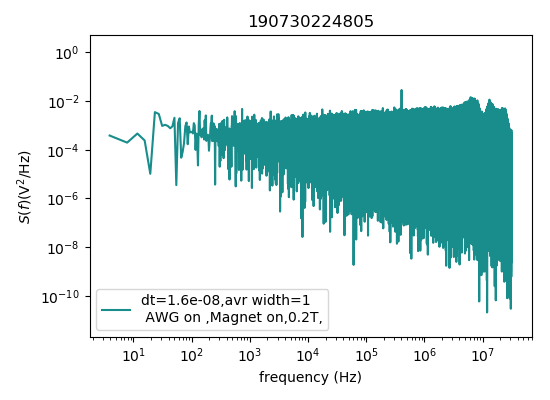

In [18]:
fig, ax = plt.subplots(figsize = (5.5,4))
data = ex.load_data(h5files()[-2]) #ex.load_data(h5files()[-1])   # '170222213835' chloe, 181220200336 in Azusa, 181205213631 in Mikasa
#xarr = ex.load_data('181226192228')['Vrf'][0,:]
#data = data.sel(**{'repeat':0})
xarr = data['Vrf'].values.flatten()            # 'current'
#xarr = np.mean(data['Vrf'].values, axis =0)
#xarr0 = np.mean(d['Vrf'].values, axis =0)

tarr = data['time'].values        # 'time (ns)'
dt   = tarr[1]-tarr[0]
tarr = np.arange(0,(max(data['time'].values)+dt)*len(data['repeat'].values), dt)      # *len(data['repeat'].values) ,'time (ns)'

dt   = dt*1e-9 # use unit s for Hz
#dt = 0.1 # 0.5
freq = np.fft.rfftfreq(len(tarr), d = dt)[1:]   # d is sample spacing (inverse of sampling rate)

ffted = np.fft.rfft(xarr, norm = None)[1:]
spectrum = dt*np.abs(ffted)**2

width = 1
spectrum_ave = spectrum.reshape(-1, width).mean(axis = -1)
freq_ave     = freq.reshape(-1, width).mean(axis = -1)
ax.plot(freq_ave, spectrum_ave, '-',linewidth=1.5, alpha = 0.9, c = 'teal',
        label = 'dt=%s,avr width=%s \n AWG on ,Magnet on,0.2T,'%(dt,width)) #alpha =0.2 ,remove Keithly gnd
#ax.plot(freq_ave, 1/freq_ave**2 * 10e7, '-',linewidth=1.5, label = '1/$f^2$') #alpha =0.2

ax.set_yscale('log')
ax.set_xscale('log')
plt.ylabel(r'$S(f) ({\rm V}^2/{\rm Hz})$'); plt.xlabel('frequency (Hz)')
#plt.xlim(1e5,1e8); 
plt.ylim(2e-12,5e0)
plt.legend(loc = 3)
plt.title(data.attrs['filename']);fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

In [232]:
#data['time'].values
np.mean(xarr)

0.035901513

In [82]:
np.random.rand()

0.6243061420178199

VGFiKGNoaWxkcmVuPShWQm94KGNoaWxkcmVuPShIQm94KGNoaWxkcmVuPShEcm9wZG93bihkZXNjcmlwdGlvbj11J25hbWUnLCBvcHRpb25zPSh1J1ZyZicsKSwgdmFsdWU9dSdWcmYnKSwgQ2jigKY=


<IPython.core.display.Javascript object>


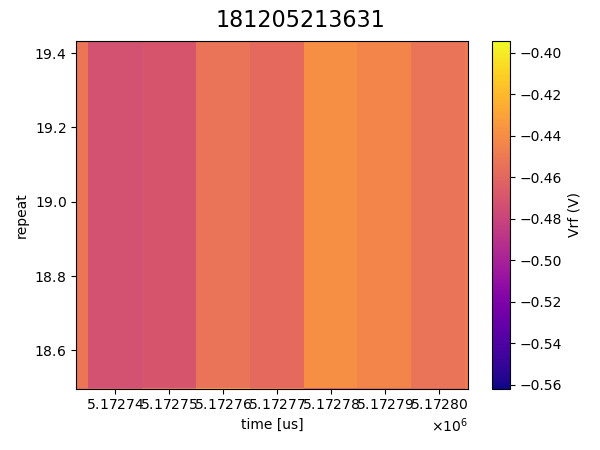

In [89]:
data = ex.load_data('181205213631')  # 181220200336 in Azusa,  181205213631 in Mikasa
tk.plot(data)

In [94]:
data.Vrf[0,:]

<xarray.DataArray 'Vrf' (time: 1000000)>
[1000000 values with dtype=float32]
Coordinates:
    repeat   int32 0
  * time     (time) float64 0.0 10.0 20.0 30.0 40.0 ... 1e+07 1e+07 1e+07 1e+07
Attributes:
    units:    V

In [15]:
np.mean(xarr)

0.05953369

<IPython.core.display.Javascript object>


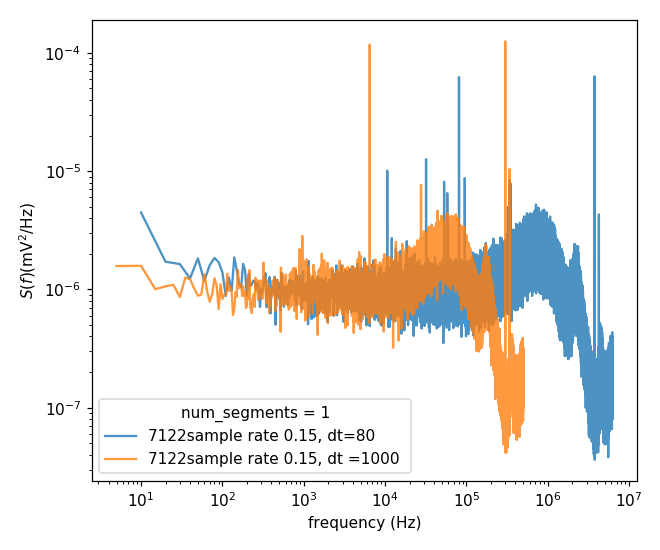

In [297]:
from collections import OrderedDict

condition_dict = OrderedDict([
                                ('7122sample rate 0.15, dt=80',               ('181226191324', True)),
                                ('7122sample rate 0.15, dt =1000 ',             ('181226192228', True)),
                             ])

num_segments = 1  # as in Bartlett's method

fig, ax = plt.subplots(figsize = (6,5))
for key in condition_dict.keys():
    filename, plot = condition_dict[key]
    if True:
        xarr = ex.load_data(filename = filename)['Vrf']
        tarr = xarr['time'].values*1e-9 # in sec
        dt   = tarr[1]-tarr[0]

        for idx in range(len((xarr))):
            pnts_per_segment = len(xarr[idx])/num_segments
            trace    = xarr[idx].values.reshape(num_segments, pnts_per_segment)*1e+3
            freq = np.fft.rfftfreq(pnts_per_segment, d = tarr[1]-tarr[0])
            ffted    = np.fft.rfft(trace, norm = None, axis = -1)
            if idx == 0:
                spectrum = 0.*np.average(np.abs(ffted)**2, axis = 0)
            spectrum += (dt/pnts_per_segment)*np.average(np.abs(ffted)**2, axis = 0)
        
        #calculate integrated voltage noise in finite frequency range
#         fmin = 8e2
#         fmax=1.2e3
#         spectrum_reduced=spectrum*np.where(freq>fmin, 1, 0)*np.where(freq<fmax, 1, 0)
#         slope = 1.8
#         print 'dV = '+ str(np.sqrt(2*np.trapz(spectrum_reduced, freq))/slope) + ' mV'
        
        ax.plot(freq[1:], spectrum[1:]/len(xarr), label = key, alpha = 0.8)

# ax.plot(freq[1:], 1./freq[1:], '--', color = 'black')

plt.legend(title= 'num_segments = %s'%(num_segments),loc = 'best')
ax.set_yscale('log')
ax.set_xscale('log')
plt.ylabel(r'$S(f) ({\rm mV}^2/{\rm Hz})$'); plt.xlabel('frequency (Hz)')
#fig.text(0.1,0.8, 'num_segments = %s'%(num_segments))
# plt.xlim(250.,2000.)
# plt.ylim(1e-5,0.025)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

In [305]:
dp = ex.load_data('181226192228')   # '181023201235' from mikasa
print dp #len(dp['Vrf'])
#print filename
#tk.plot(dp)

<xarray.Dataset>
Dimensions:  (repeat: 20, time: 200000)
Coordinates:
  * repeat   (repeat) int32 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19
  * time     (time) float64 0.0 1e+03 2e+03 3e+03 ... 2e+08 2e+08 2e+08 2e+08
Data variables:
    Vrf      (repeat, time) float32 ...
Attributes:
    filename:   181226192228
    status:     L = -0.435 V, PL = -0.895 V, T = -0.6 V, PR = -0.206 V, R = -...
    exec_code:  #1D_time\nn_repeat = 20\n#time_axis = np.arange(0, 50e+6, 8)#...
    comment:    L = -0.435 V, PL = -0.895 V, T = -0.6 V, PR = -0.206 V, R = -...


# Fittings (Te,  )

[[Model]]
    Model(sensor_current)
[[Fit Statistics]]
    # function evals   = 80
    # data points      = 301
    # variables        = 6
    chi-square         = 0.000
    reduced chi-square = 0.000
    Akaike info crit   = -4142.977
    Bayesian info crit = -4120.735
[[Variables]]
    T_e:          0.04413286 +/- 0        (0.00%) (init= 0.08)
    t_c:          0          +/- 0        (nan%) (init= 0)
    slope:        1.3204e-05 +/- 0        (0.00%) (init= 0.0001)
    det_offset:   2.75606407 +/- 0        (0.00%) (init= 1)
    c_offset:     0.96303000 +/- 0        (0.00%) (init= 3.75)
    d_current:   -0.00791281 +/- 0        (0.00%) (init=-0.11)
[[Correlations]] (unreported correlations are <  0.100)



<IPython.core.display.Javascript object>


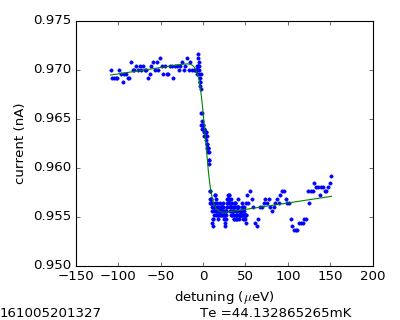

[-0.7773306  -0.77735936 -0.77738812 -0.77741688 -0.77744564 -0.7774744
 -0.77750316 -0.77753192 -0.77756068 -0.77758944 -0.7776182  -0.77764696
 -0.77767572 -0.77770448 -0.77773324 -0.777762   -0.77779076 -0.77781952
 -0.77784828 -0.77787704 -0.7779058  -0.77793456 -0.77796332 -0.77799208
 -0.77802084 -0.7780496  -0.77807836 -0.77810712 -0.77813588 -0.77816464
 -0.7781934  -0.77822216 -0.77825092 -0.77827968 -0.77830844 -0.7783372
 -0.77836596 -0.77839472 -0.77842348 -0.77845224 -0.778481   -0.77850976
 -0.77853852 -0.77856728 -0.77859604 -0.7786248  -0.77865356 -0.77868232
 -0.77871108 -0.77873984 -0.7787686  -0.77877291 -0.77877723 -0.77878154
 -0.77878586 -0.77879017 -0.77879448 -0.7787988  -0.77880311 -0.77880743
 -0.77881174 -0.77881605 -0.77882037 -0.77882468 -0.778829   -0.77883331
 -0.77883762 -0.77884194 -0.77884625 -0.77885057 -0.77885488 -0.77885919
 -0.77886351 -0.77886782 -0.77887214 -0.77887645 -0.77888076 -0.77888508
 -0.77888939 -0.77889371 -0.77889802 -0.77890233 -0.7

In [198]:
#d = ex.load_data('')
d = ex.load_data(r'Z:\Measurements\Chloe\20161005\161005201327.h5')
#d = ex.load_data(r'Z:\Measurements\Chloe\20161005\161005192638.h5')
def PR_to_detuning(PRval):
#     return (PRval-(0-0.3795))/0.01224*1000    #0.0082*1000
#     return (PRval-(0-0.6587))/0.01914*1000
    return (PRval-(0-0.467))/0.01884*1000


detuning = PR_to_detuning(d['PR'])
current = d['current']

def sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current):
    det = (detuning-det_offset)
    omega = np.sqrt(det**2+t_c**2)
    #print "omegae", t_c
    kB = 86 #ueV/K
    return c_offset + d_current*(det/omega)*np.tanh(omega/(2.*kB*T_e))+slope*det

T_e, t_c, slope, det_offset, c_offset, d_current = 0.08, 0., 10e-5, 1., 3.75, -0.11
model = lmfit.Model(sensor_current, independent_vars=['detuning'])
result = model.fit(current, detuning = detuning,
                   T_e        = lmfit.Parameter(value = T_e, min = 0.018, max = 0.5),
                   t_c        = lmfit.Parameter(value = t_c, min = 0., max = 1.),
                   slope      = lmfit.Parameter(value = slope, min = -1.e-4, max = 1.e-4),
                   det_offset = lmfit.Parameter(value = det_offset, min = -100, max = 100),
                   c_offset   = lmfit.Parameter(value = c_offset, min = 0.1, max = 16.),
                   d_current  = lmfit.Parameter(value = d_current, min = -0.2, max = 0.1))

T_e, t_c, slope, det_offset, c_offset, d_current = (result.best_values[key] for key in result.var_names)

tmp = "Te ="+str(1000*T_e)+"mK"

print result.fit_report()
fig = plt.figure(figsize = (5,4))
plt.plot(detuning, current, '.')
plt.plot(detuning, sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current), '-')
#plt.plot(detuning, sensor_current(detuning, 0.15, t_c, slope, det_offset, c_offset, d_current), '-')
plt.xlabel(r'detuning ($\mu$eV)'); plt.ylabel('current (nA)')
fig.text(0,0.01,d.attrs['filename'])
fig.text(0.5,0.01,tmp)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

#d1 = d['PR'].values

print d['PC'].values, d

[[Model]]
    Model(sensor_current)
[[Fit Statistics]]
    # function evals   = 604
    # data points      = 301
    # variables        = 6
    chi-square         = 0.007
    reduced chi-square = 0.000
    Akaike info crit   = -3210.803
    Bayesian info crit = -3188.560
[[Variables]]
    T_e:          0.01000006 +/- 0        (0.00%) (init= 0.08)
    t_c:          0          +/- 0        (nan%) (init= 0)
    slope:       -9.0838e-05 +/- 0        (0.00%) (init= 0.0001)
    det_offset:  -1.08502749 +/- 0        (0.00%) (init= 1)
    c_offset:     1.07895971 +/- 0        (0.00%) (init= 3.75)
    d_current:   -0.20000000 +/- 0        (0.00%) (init=-0.11)
[[Correlations]] (unreported correlations are <  0.100)



<IPython.core.display.Javascript object>


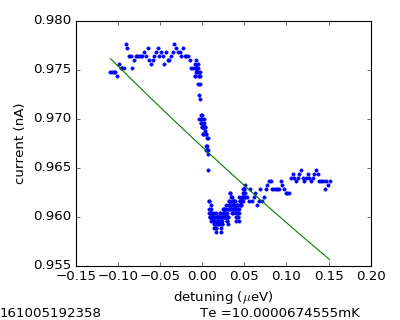

In [179]:
#d = ex.load_data('')
d = ex.load_data(r'Z:\Measurements\Chloe\20161005\161005192358.h5')
def PR_to_detuning(PRval):

    return (PRval-(0-0.467))/0.01884


detuning = PR_to_detuning(d['PR'])
current = d['current']

def sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current):
    det = (detuning-det_offset)
    omega = np.sqrt(det**2+t_c**2)
    #print "omegae", t_c
    kB = 86 #ueV/K
    return c_offset + d_current*(det/omega)*np.tanh(omega/(2.*kB*T_e))+slope*det

T_e, t_c, slope, det_offset, c_offset, d_current = 0.08, 0., 10e-5, 1., 3.75, -0.11
model = lmfit.Model(sensor_current, independent_vars=['detuning'])
result = model.fit(current, detuning = detuning,
                   T_e        = lmfit.Parameter(value = T_e, min = 0.01, max = 0.5),
                   t_c        = lmfit.Parameter(value = t_c, min = 0., max = 1.),
                   slope      = lmfit.Parameter(value = slope, min = -1.e-4, max = 1.e-4),
                   det_offset = lmfit.Parameter(value = det_offset, min = -100, max = 100),
                   c_offset   = lmfit.Parameter(value = c_offset, min = 0.1, max = 16.),
                   d_current  = lmfit.Parameter(value = d_current, min = -0.2, max = 0.1))

T_e, t_c, slope, det_offset, c_offset, d_current = (result.best_values[key] for key in result.var_names)

tmp = "Te ="+str(1000*T_e)+"mK"

print result.fit_report()
fig = plt.figure(figsize = (5,4))
plt.plot(detuning, current, '.')
plt.plot(detuning, sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current), '-')
#plt.plot(detuning, sensor_current(detuning, 0.15, t_c, slope, det_offset, c_offset, d_current), '-')
plt.xlabel(r'detuning ($\mu$eV)'); plt.ylabel('current (nA)')
fig.text(0,0.01,d.attrs['filename'])
fig.text(0.5,0.01,tmp)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

## coulomb peak fit

In [149]:
sss =  d1.dims.keys()[-1]
print d1['PL'].values  # type(sss)

-0.5629719996948195


VGFiKGNoaWxkcmVuPShWQm94KGNoaWxkcmVuPShIQm94KGNoaWxkcmVuPShEcm9wZG93bihkZXNjcmlwdGlvbj11J25hbWUnLCBpbmRleD0zLCBvcHRpb25zPSh1J1ZyZicsIHUnZFZyZicsICfigKY=


<IPython.core.display.Javascript object>


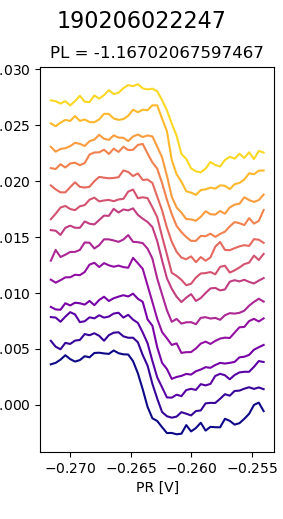

In [52]:
f =   190206022247         # 170810221453
d  = ex.load_data(f)
d['diff'] = tk.differentiate(d['Vrf'])
d['Vrf_sub'] = tk.remove_plane(d['Vrf'])
#d1 = (d.sel(method ='pad',**{'PL': -1.1625})).sel(**{'PR': slice(-0.273, -0.256)})
d1 = d.sel(**{'PL': slice(-1.162, -1.1672),'PR': slice(-0.272, -0.254)})
tk.plot(d1)

<IPython.core.display.Javascript object>


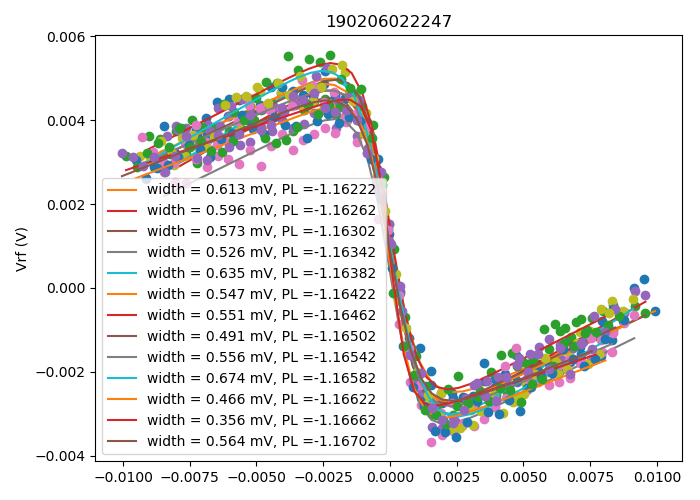

[0.00061277 0.00059641 0.00057255 0.00052557 0.00063525 0.00054745
 0.00055128 0.000491   0.0005563  0.00067373 0.00046633 0.00035566
 0.00056372] 0.0005498476992036572


In [55]:
#fitting for linear data
fig, ax = plt.subplots(figsize = (7., 5.))
wid_arr = np.empty(len(d1['PL'].values))

for ind in range(len(d1['PL'].values)):
    PL = d1['PL'].values[ind]
    raw = d1['Vrf_sub'][ind,:].values
    gates = d1['PR'].values
    diffabs = np.absolute(d1['diff'][ind,:].values) #[40:70]


    def Coulombpeak(gates, gateoffset, offset, width, factor):
        return factor*(np.cosh((gates-gateoffset)/(2*width)))**(-2)+offset

    def IntegratedCoulombPeak(gates, gateoffset, offset, width, factor, slope):
        return factor*np.tanh((gates-gateoffset)/(2*width))+slope*(gates-gateoffset)+offset

    model = lmfit.Model(IntegratedCoulombPeak, independent_vars=['gates'])
    result = model.fit(raw, gates = gates,
                       factor  = lmfit.Parameter(value = 1., min= -300., max = 300.),
                       gateoffset = lmfit.Parameter(value = -0.2623, min= -1., max = 1.),   # gates[np.argmin(diffabs)]
                       width = lmfit.Parameter(value = 0.0001, min= 0., max = 1.),
                       offset  = lmfit.Parameter(value = np.mean(raw), min= -1., max = 1.),
                       slope  = lmfit.Parameter(value = 0.5, min= -5, max = 5.))
    gateoffset, offset, width, factor, slope = (result.best_values[key] for key in result.var_names)
    #print 'gateoff=',gateoffset, factor, gateoffset, width, offset, slope
    # model = lmfit.Model(Coulombpeak, independent_vars=['gates'])
    # result = model.fit(diff, gates = gates,
    #                    factor  = lmfit.Parameter(value = -1., min= -3., max = 3.),
    #                    gateoffset = lmfit.Parameter(value = 0.253, min= -0.5, max = 0.5),
    #                    width = lmfit.Parameter(value = 0.001, min= 0., max = 1.),
    #                    offset  = lmfit.Parameter(value = np.mean(diff), min= -1., max = 1.))
    # factor, gateoffset, width, offset = (result.best_values[key] for key in result.var_names)

    #print 'line broadening = %s mV' %(width*1e3), factor , width,slope

    #print result.fit_report()
    #print gateoffset
    wid_arr[ind] = width

    plt.plot(gates-gateoffset, raw, 'o')
    plt.plot(gates-gateoffset, IntegratedCoulombPeak(gates, **result.best_values), label = 'width = %s mV, PL =%s ' %(round(width*1e3,3), round(PL,5)) )
    #plt.xlabel('%s'%(d1.dims.keys()))
    plt.ylabel('Vrf (V)')
    plt.legend(loc = 0)
plt.title(d.attrs['filename'])
fig.patch.set_facecolor('white');fig.patch.set_alpha(1.0);plt.tight_layout()
# plt.plot(gates, Coulombpeak(gates, **result.init_values))
print wid_arr,np.mean(wid_arr)


### single trace

In [96]:
d1.dims.items()[0]

(u'PL', 51)

gateoff= -0.9322526091748107 0.018927942176617307 -0.9322526091748107 9.961983056688828e-05 0.011056278081899462 -1.907155382543305
line broadening = 0.09961983056688828 mV 0.018927942176617307 9.961983056688828e-05 -1.907155382543305
[[Model]]
    Model(IntegratedCoulombPeak)
[[Fit Statistics]]
    # function evals   = 45
    # data points      = 51
    # variables        = 5
    chi-square         = 0.000
    reduced chi-square = 0.000
    Akaike info crit   = -805.432
    Bayesian info crit = -795.773
[[Variables]]
    gateoffset:  -0.93225260 +/- 2.45e-06 (0.00%) (init=-0.9324788)
    offset:       0.01105627 +/- 5.26e-05 (0.48%) (init= 0.009808553)
    width:        9.9620e-05 +/- 2.47e-06 (2.48%) (init= 0.0001)
    factor:       0.01892794 +/- 0.000142 (0.75%) (init= 1)
    slope:       -1.90715538 +/- 0.087670 (4.60%) (init= 0.5)
[[Correlations]] (unreported correlations are <  0.100)
    C(factor, slope)             = -0.922 
    C(width, factor)             =  0.572 
    C(wid

<IPython.core.display.Javascript object>


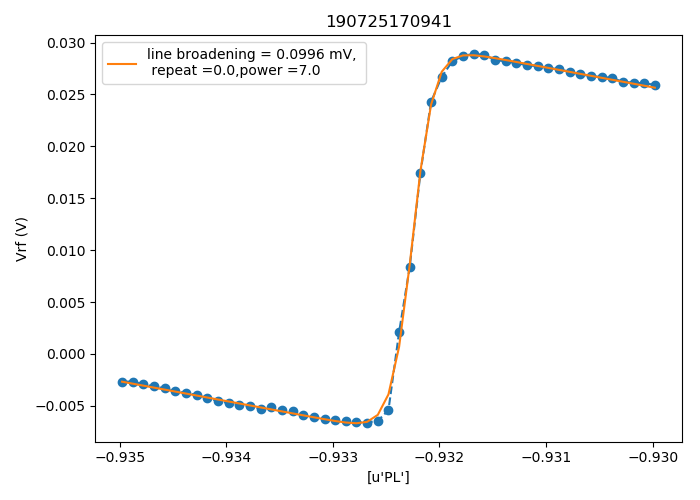

In [211]:
#fitting for linear data

# f = os.listdir(path)[-1]#170724161156
#f =   181029201845         # 170810221453
#d  = ex.load_data(f)
#d['Vrf_sub'] = tk.remove_plane(d['Vrf'])
#d['diff'] = tk.differentiate(d['Vrf'])

# cut =  0 #120 # 40
# end = 201  #201 # 90
# raw = d['Vrf'].values[cut:end]
# diff = d['diff'].values[cut:end]
# diffabs = np.absolute(d['diff'].values)[cut:end]
# gates = d['PC'].values[cut:end]

#d0 = ex.load_data(h5files()[-1], load_now = True)
#d1 = d.sel(**{'P2': 0.8258,'P1': slice(0.788,0.783)}) # sel(method='pad',
#slice1 = d.sel(method='pad', **{'PC (V)': 0.142})                      # d[{'PR (V)' : 100}]
#d1 = d.sel(method = 'pad',**{'PL': -0.3810})
#dtr = ex.load_data(190521222649)
dtr = ex.load_data(h5files()[-1], load_now = True)
d1= dtr.sel(method = 'pad',**{dtr.dims.keys()[-1]: 0})
#d1= dtr.sel(method = 'pad',**{'power': 12.5, 'repeat':3,})
raw = d1.Vrf.values#[20:60] # d1['Vrf'].values
gates = d1[d1.dims.keys()[0]].values#[20:60]
#diffabs = np.absolute(d1['diff'].values) #[40:70]


# raw0 = d1.Vrf.values#[0:100] # d1['Vrf'].values
# gates = d1['PR'].values#[0:100]
# raw = np.empty(len(gates))
# for n in range(len(gates)):
#     mid = (len(gates)-1)/2
#     if n < mid:
#         raw[n] = raw0[n]
#     else:
#         raw[n] = raw0[mid]-(raw0[mid-(n-mid)]-raw0[mid])

# print raw

def Coulombpeak(gates, gateoffset, offset, width, factor):
    return factor*(np.cosh((gates-gateoffset)/(2*width)))**(-2)+offset

def IntegratedCoulombPeak(gates, gateoffset, offset, width, factor, slope):
    return factor*np.tanh((gates-gateoffset)/(2*width))+slope*(gates-gateoffset)+offset

model = lmfit.Model(IntegratedCoulombPeak, independent_vars=['gates'])
result = model.fit(raw, gates = gates,
                   factor  = lmfit.Parameter(value = 1., min= -300., max = 300.),
                   gateoffset = lmfit.Parameter(value = np.mean(gates), min= -2., max = 2.),   # np.mean(gates) gates[np.argmin(diffabs)]
                   width = lmfit.Parameter(value = 0.0001, min= 0., max = 1.),
                   offset  = lmfit.Parameter(value = np.mean(raw), min= -1., max = 1.),
                   slope  = lmfit.Parameter(value = 0.5, min= -10, max = 10.))
gateoffset, offset, width, factor, slope = (result.best_values[key] for key in result.var_names)
print 'gateoff=',gateoffset, factor, gateoffset, width, offset, slope
# model = lmfit.Model(Coulombpeak, independent_vars=['gates'])
# result = model.fit(diff, gates = gates,
#                    factor  = lmfit.Parameter(value = -1., min= -3., max = 3.),
#                    gateoffset = lmfit.Parameter(value = 0.253, min= -0.5, max = 0.5),
#                    width = lmfit.Parameter(value = 0.001, min= 0., max = 1.),
#                    offset  = lmfit.Parameter(value = np.mean(diff), min= -1., max = 1.))
# factor, gateoffset, width, offset = (result.best_values[key] for key in result.var_names)

print 'line broadening = %s mV' %(width*1e3), factor, width, slope

print result.fit_report()
print gateoffset

fig, ax = plt.subplots(figsize = (7., 5.))
# plt.plot(gates-gateoffset, raw - slope*(gates-gateoffset), '--o')
# plt.plot(gates-gateoffset, IntegratedCoulombPeak(gates, **result.best_values) -slope*(gates-gateoffset), label = 'line broadening = %s mV, \n repeat =%s ' %(round(width*1e3,4), round(d1['repeat'].values,5)) )
plt.plot(gates, raw, '--o')
plt.plot(gates, IntegratedCoulombPeak(gates, **result.best_values), 
         label = 'line broadening = %s mV, \n repeat =%s,power =%s ' %(round(width*1e3,4), round(d1['repeat'].values,5),7.0) )

plt.xlabel('%s'%(d1.dims.keys()) )
plt.ylabel('Vrf (V)')
plt.legend(loc = 0)
plt.title(d1.attrs['filename'])
fig.patch.set_facecolor('white');fig.patch.set_alpha(1.0);plt.tight_layout()
# plt.plot(gates, Coulombpeak(gates, **result.init_values))



<IPython.core.display.Javascript object>


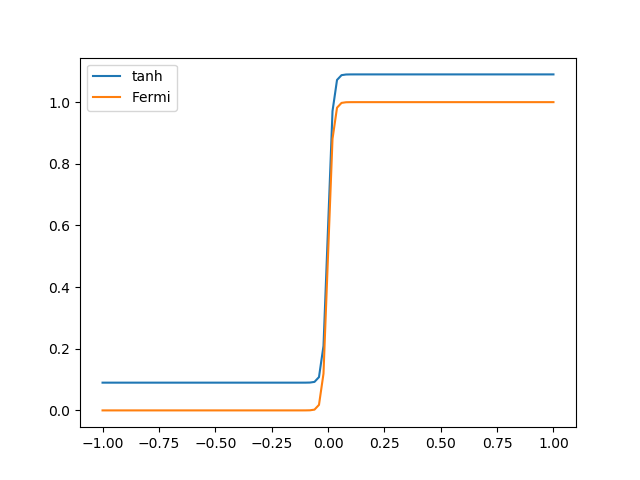

In [164]:

def tanh_T(miu,Te):
    return 0.5*np.tanh((miu)/(2.*Te))+0.59
def Fermi_T(miu,Te):
    return 1.-1./(1.+np.exp(miu/Te))

miu_arr = np.linspace(-1.,1., 101)
Te_ = 0.01
y01 = tanh_T(miu_arr, Te_)
y02 = Fermi_T(miu_arr, Te_)

fig,ax = plt.subplots()
ax.plot(miu_arr,y01, label = 'tanh',)
ax.plot(miu_arr,y02, label = 'Fermi')
plt.legend()
plt.show()


### loop

In [38]:
# dtr.dims.keys()#[-1]
gates

array([-0.64572881, -0.64562881, -0.64552881, -0.64542881, -0.64532881,
       -0.64522881, -0.64512881, -0.64502881, -0.64492881, -0.64482881,
       -0.64472881, -0.64462881, -0.64452881, -0.64442881, -0.64432881,
       -0.64422881, -0.64412881, -0.64402881, -0.64392881, -0.64382881,
       -0.64372881, -0.64362881, -0.64352881, -0.64342881, -0.64332881,
       -0.64322881, -0.64312881, -0.64302881, -0.64292881, -0.64282881,
       -0.64272881, -0.64262881, -0.64252881, -0.64242881, -0.64232881,
       -0.64222881, -0.64212881, -0.64202881, -0.64192881, -0.64182881,
       -0.64172881, -0.64162881, -0.64152881, -0.64142881, -0.64132881,
       -0.64122881, -0.64112881, -0.64102881, -0.64092881, -0.64082881,
       -0.64072881])

In [63]:
fit_wid = np.empty((10,27)) # (10,13)

<IPython.core.display.Javascript object>


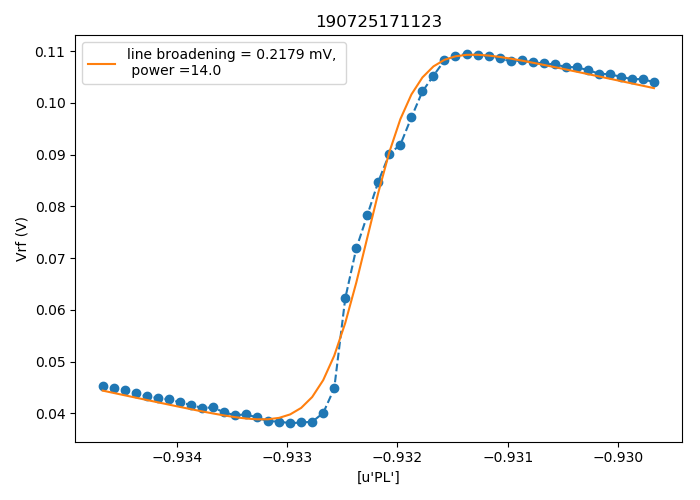

array([0.0621, 0.0683, 0.0675, 0.0709, 0.0741, 0.0701, 0.0788, 0.0837,
       0.0845, 0.0905, 0.0925, 0.0935, 0.0938, 0.1035, 0.1095, 0.1168,
       0.1159, 0.1293, 0.1326, 0.1407, 0.1533, 0.1606, 0.1679, 0.1747,
       0.1754, 0.1915, 0.2179]) 0.11555185185185185


In [216]:
#fitting for linear data

# f = os.listdir(path)[-1]#170724161156
#f =   181029201845         # 170810221453
#d  = ex.load_data(f)
#d['Vrf_sub'] = tk.remove_plane(d['Vrf'])
#d['diff'] = tk.differentiate(d['Vrf'])

# cut =  0 #120 # 40
# end = 201  #201 # 90
# raw = d['Vrf'].values[cut:end]
# diff = d['diff'].values[cut:end]
# diffabs = np.absolute(d['diff'].values)[cut:end]
# gates = d['PC'].values[cut:end]

#d0 = ex.load_data(h5files()[-1], load_now = True)
#d1 = d.sel(**{'P2': 0.8258,'P1': slice(0.788,0.783)}) # sel(method='pad',
#slice1 = d.sel(method='pad', **{'PC (V)': 0.142})                      # d[{'PR (V)' : 100}]
#d1 = d.sel(method = 'pad',**{'PL': -0.3810})
#dtr = ex.load_data(190603160704)
dtr = ex.load_data(h5files()[-1])  #h5files()[-1], load_now = True
#fit_wid = np.empty((10,13))
re = 0
#dtr = dtr.isel(**{dtr.dims.keys()[-1]: re}) # repeat
d1= dtr.isel(**{dtr.dims.keys()[-1]: 0}) #method = 'pad',
raw = d1.Vrf.values#[20:60] # d1['Vrf'].values
gates = d1[d1.dims.keys()[-1]].values#[20:60]
#diffabs = np.absolute(d1['diff'].values) #[40:70]


# raw0 = d1.Vrf.values#[0:100] # d1['Vrf'].values
# gates = d1['PR'].values#[0:100]
# raw = np.empty(len(gates))
# for n in range(len(gates)):
#     mid = (len(gates)-1)/2
#     if n < mid:
#         raw[n] = raw0[n]
#     else:
#         raw[n] = raw0[mid]-(raw0[mid-(n-mid)]-raw0[mid])

# print raw

reps = np.arange(0,27)
wid_arr = np.empty(len(reps))


def Coulombpeak(gates, gateoffset, offset, width, factor):
    return factor*(np.cosh((gates-gateoffset)/(2*width)))**(-2)+offset

def IntegratedCoulombPeak(gates, gateoffset, offset, width, factor, slope):
    return factor*np.tanh((gates-gateoffset)/(2*width))+slope*(gates-gateoffset)+offset

for idx,nn in enumerate(reps):

    #d1=dtr.sel(method = 'pad',**{dtr.dims.keys()[-1]: nn})
    d1= dtr.isel(**{dtr.dims.keys()[-1]: nn})
    raw = d1.Vrf.values

    model = lmfit.Model(IntegratedCoulombPeak, independent_vars=['gates'])
    result = model.fit(raw, gates = gates,
                       factor  = lmfit.Parameter(value = 1., min= -300., max = 300.),
                       gateoffset = lmfit.Parameter(value = np.mean(gates), min= -2., max = 2.),   # np.mean(gates) gates[np.argmin(diffabs)]
                       width = lmfit.Parameter(value = 0.0001, min= 0., max = 1.),
                       offset  = lmfit.Parameter(value = np.mean(raw), min= -1., max = 1.),
                       slope  = lmfit.Parameter(value = 0.5, min= -10, max = 10.))
    gateoffset, offset, width, factor, slope = (result.best_values[key] for key in result.var_names)
    #print 'gateoff=',gateoffset, factor, gateoffset, width, offset, slope
    
    # model = lmfit.Model(Coulombpeak, independent_vars=['gates'])
    # result = model.fit(diff, gates = gates,
    #                    factor  = lmfit.Parameter(value = -1., min= -3., max = 3.),
    #                    gateoffset = lmfit.Parameter(value = 0.253, min= -0.5, max = 0.5),
    #                    width = lmfit.Parameter(value = 0.001, min= 0., max = 1.),
    #                    offset  = lmfit.Parameter(value = np.mean(diff), min= -1., max = 1.))
    # factor, gateoffset, width, offset = (result.best_values[key] for key in result.var_names)

    #print 'line broadening = %s mV' %(width*1e3), factor, width, slope
    if idx == 1100:
        wid_arr[idx] = 0.045
    else:
        wid_arr[idx] = round(width*1e3,4)

#print result.fit_report()
#print gateoffset

fig, ax = plt.subplots(figsize = (7., 5.))
# plt.plot(gates-gateoffset, raw - slope*(gates-gateoffset), '--o')
# plt.plot(gates-gateoffset, IntegratedCoulombPeak(gates, **result.best_values) -slope*(gates-gateoffset), label = 'line broadening = %s mV, \n repeat =%s ' %(round(width*1e3,4), round(d1['repeat'].values,5)) )
plt.plot(gates, raw, '--o')
plt.plot(gates, IntegratedCoulombPeak(gates, **result.best_values), 
         label = 'line broadening = %s mV, \n power =%s ' %(round(width*1e3,4), round(d1['power'].values,5)) )


plt.xlabel('%s'%(d1.dims.keys()))
plt.ylabel('Vrf (V)')
plt.legend(loc = 0)
plt.title(d1.attrs['filename'])
fig.patch.set_facecolor('white');fig.patch.set_alpha(1.0);plt.tight_layout()
# plt.plot(gates, Coulombpeak(gates, **result.init_values))

#fit_wid[re,:] = wid_arr
print repr(wid_arr), np.mean(wid_arr)


In [200]:
np.std(wid_arr)

0.04321507224494485

<IPython.core.display.Javascript object>


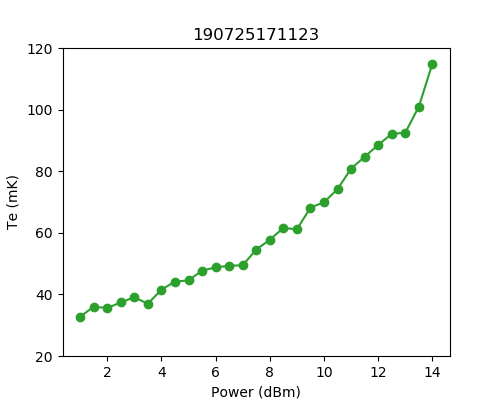

Text(0.5,1,u'190725171123')

In [221]:
#fit_wid
#fit_wid[re,:] = wid_arr
#print fit_wid
#dtr = ex.load_data(h5files()[-1])
fig, ax = plt.subplots(figsize = (5,4))

ax.plot(dtr['power'].values, wid_arr/22. * 11.6 * 1000, marker ='o', c='C2' )

#ax.errorbar(dtr['power'].values, np.mean(fit_wid, axis = 0)/19.5 * 11.6 * 1000,np.std(fit_wid,axis =0)/19.5 * 11.6 * 1000, marker ='o', c='C0' )


#time_in = 't_interval ='+ str(dtt)
#time_decay = gate0 +' decay_time ='+ str(round(t_decay*dtt*1e-3, 2)) +'us'
#aveTe = 'average ='+ str(round(Te_ave,2))

#fig.text(0.20,0.88,aveTe)
#fig.text(0.15,0.88,'%s'%(d1.dims.keys()[-1]))

#fig.text(0.65,0.5,d_raw0[gate0].values)
plt.xlabel('Power (dBm)')
plt.ylabel('Te (mK)')

plt.ylim((20,120))
#plt.xscale('log')
#plt.yscale('log')
plt.title(dtr.attrs['filename'])

<IPython.core.display.Javascript object>


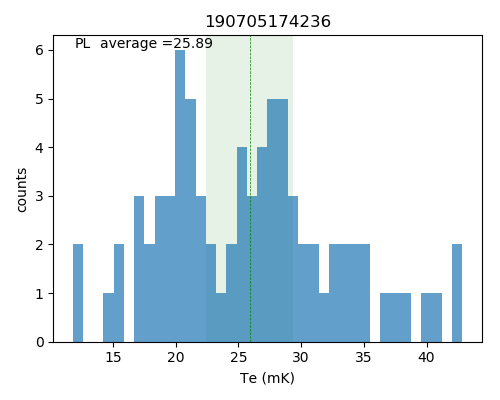

In [56]:

fig, ax = plt.subplots(figsize = (5,4))
#ax.plot(t_arr, trace_full, 'bo-', markersize = 2)    # fitted part
#ax.bar(bins_reduce, hist[1:],width = 1.0, color= 'C0' if gate0=='PR' else 'teal') # ,edgecolor = 'w'
#ax.plot(bins_reduce, model.func(bins_reduce, **result.best_values),'-', c='C1' )

lever = [17.5, 19.5][1]  # lever of PR, PL  mV/meV
Te_arr = wid_arr[0:]/lever * 11.6 * 1000   # lever of PR is 19mV/meV, PL is 17.5
n_bin = np.linspace(min(Te_arr),max(Te_arr),len(Te_arr)/2)
Te_ave, Te_std= np.mean(Te_arr),np.std(Te_arr)

cmap=cm.get_cmap('tab10') #tab20c
ax.axvspan(Te_ave-0.5*Te_std,Te_ave+ 0.5*Te_std,facecolor='g',alpha = 0.1 )
ax.hist( Te_arr, bins= n_bin, color= cmap(0.0), alpha =0.7)
ax.axvline(x = np.mean(Te_arr), linestyle= '--',lw=0.5, c='g' )


#time_in = 't_interval ='+ str(dtt)
#time_decay = gate0 +' decay_time ='+ str(round(t_decay*dtt*1e-3, 2)) +'us'
aveTe = 'average ='+ str(round(Te_ave,2))

fig.text(0.20,0.88,aveTe)
fig.text(0.15,0.88,'%s'%(d1.dims.keys()[-1]))

#fig.text(0.65,0.5,d_raw0[gate0].values)
plt.xlabel('Te (mK)')
plt.ylabel('counts')

#plt.xscale('log')
#plt.yscale('log')
plt.title(d1.attrs['filename'])
fig.tight_layout()

<IPython.core.display.Javascript object>


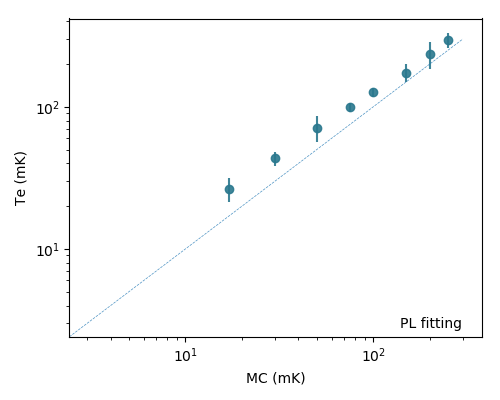

In [153]:

fig, ax = plt.subplots(figsize = (5,4))
#ax.plot(t_arr, trace_full, 'bo-', markersize = 2)    # fitted part
#ax.bar(bins_reduce, hist[1:],width = 1.0, color= 'C0' if gate0=='PR' else 'teal') # ,edgecolor = 'w'
#ax.plot(bins_reduce, model.func(bins_reduce, **result.best_values),'-', c='C1' )

# lever = [17.5, 16.5][0]  # lever of PR, PL  mV/meV
# Te_arr = wid_arr[0:]/lever * 11.6 * 1000   # lever of PR is 19mV/meV, PL is 17.5
# n_bin = np.linspace(min(Te_arr),max(Te_arr),len(Te_arr)/2)
# Te_ave, Te_std= np.mean(Te_arr),np.std(Te_arr)
Tmc_arr = np.array([17,  30,  50,   75,   100,   150,   200,  250])
# Te_arr =  np.array([26, 43.7, 70.1, 99.9, 124.2, 198.5, 251.8,337 ])   # PR fitting 19060318
# Te_err =  np.array([4,  10,   13,   16,   20,    27,    30,   50])      # PR fitting 19060318

Te_arr =  np.array([26.5,43.5, 71.5, 99.5, 126.2, 174, 234,  296])   # PR fitting 19060414
Te_err =  np.array([5,   5,    15,   7.5,   9,    25,    50,   35])      # PR fitting 19060414

#cmap=cm.get_cmap('plasma') #tab20c
cmap = cm.get_cmap('viridis')
#ax.axvspan(Te_ave-Te_std,Te_ave+Te_std,facecolor='g',alpha = 0.1 )
ax.plot(np.linspace(0,300,100),np.linspace(0,300,100), ls = '--',lw =0.5,alpha =0.8) 
ax.errorbar( Tmc_arr, Te_arr, yerr = Te_err, marker = 'o', color= cmap(0.4), linestyle  = '', alpha =0.9)
#ax.axvline(x = np.mean(Te_arr), linestyle= '--',lw=0.5, c='g' )


#time_in = 't_interval ='+ str(dtt)
#time_decay = gate0 +' decay_time ='+ str(round(t_decay*dtt*1e-3, 2)) +'us'
#aveTe = 'average ='+ str(round(Te_ave,2))
lab = 'PL fitting'

fig.text(0.80,0.18, lab )
#fig.text(0.15,0.88,'%s'%(d1.dims.keys()[-1]))

#fig.text(0.65,0.5,d_raw0[gate0].values)
plt.xlabel('MC (mK)')
plt.ylabel('Te (mK)')

plt.xscale('log')
plt.yscale('log')
#plt.title(d1.attrs['filename'])
fig.tight_layout()

In [950]:
slice1 = d.sel(method='pad', **{'PC (V)': 0.142})
slice_PR = slice1.sel(**{'PR (V)': slice(0.291, 0.286)})  # method='pad',
#print slice_PR['PR'].values
print slice_PR

<xarray.Dataset>
Dimensions:  (PR (V): 33)
Coordinates:
    PC       float64 0.142
    PR       (PR (V)) float64 0.2909 0.2908 0.2906 0.2905 0.2903 0.2902 0.29 ...
    PC (V)   float64 0.142
  * PR (V)   (PR (V)) float64 0.2909 0.2908 0.2906 0.2905 0.2903 0.2902 0.29 ...
Data variables:
    Vrf      (PR (V)) float32 -0.00824954 -0.00842872 -0.00855463 ...
    dVrf     (PR (V)) float32 0.865314 1.19454 0.839442 0.907986 0.954184 ...
    diff1    (PR (V)) float32 -0.000132822 -0.000131117 -0.000112843 ...
    diff2    (PR (V)) float32 2.87861e-08 2.84245e-08 2.442e-08 2.60236e-08 ...
    Vrf_sub  (PR (V)) float32 -4.71434 -4.75636 -4.74511 -4.74415 -4.75012 ...
Attributes:
    filename: 171024140604
    comment: L = 0. V, PL = 0. V, CL = -1.4 V, PC = 0.128 V, CR = -1.08 V, PR = 0.293 V, R = -1.6 V, S = -0.9 V, SL = -1.25 V, SC = 0. V, SR = -0.925 V, rf(rf.frequency=247.600000, rf.power=15.000000), Vps=3.000000, SMU(SMU.voltage=0.000000), AWG()

def scan(var_rng_list, nplc = 1, relative =

In [955]:
slice_PR2 = slice_PR.drop('PC')
slice_PR

<xarray.Dataset>
Dimensions:  (PR (V): 33)
Coordinates:
    PC       float64 0.142
    PR       (PR (V)) float64 0.2909 0.2908 0.2906 0.2905 0.2903 0.2902 0.29 ...
    PC (V)   float64 0.142
  * PR (V)   (PR (V)) float64 0.2909 0.2908 0.2906 0.2905 0.2903 0.2902 0.29 ...
Data variables:
    Vrf      (PR (V)) float32 -0.00824954 -0.00842872 -0.00855463 ...
    dVrf     (PR (V)) float32 0.865314 1.19454 0.839442 0.907986 0.954184 ...
    diff1    (PR (V)) float32 -0.000132822 -0.000131117 -0.000112843 ...
    diff2    (PR (V)) float32 2.87861e-08 2.84245e-08 2.442e-08 2.60236e-08 ...
    Vrf_sub  (PR (V)) float32 -4.71434 -4.75636 -4.74511 -4.74415 -4.75012 ...
Attributes:
    filename: 171024140604
    comment: L = 0. V, PL = 0. V, CL = -1.4 V, PC = 0.128 V, CR = -1.08 V, PR = 0.293 V, R = -1.6 V, S = -0.9 V, SL = -1.25 V, SC = 0. V, SR = -0.925 V, rf(rf.frequency=247.600000, rf.power=15.000000), Vps=3.000000, SMU(SMU.voltage=0.000000), AWG()

def scan(var_rng_list, nplc = 1, relative =

<IPython.core.display.Javascript object>


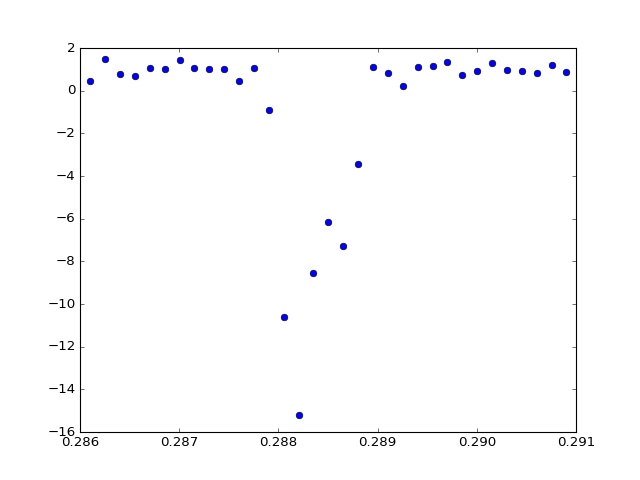

In [956]:
fig = plt.figure()
plt.plot(slice_PR['PR'].values,slice_PR['dVrf'].values,'o')
plt.show()

In [30]:
import re
str1 = "#3158.00e3 reviews"
print (re.findall('\d+', str1 ))

['3158', '00', '3']


In [33]:
int(filter(str.isdigit, str1))

3158003

## old fitting

[[Model]]
    Model(sensor_current)
[[Fit Statistics]]
    # function evals   = 66
    # data points      = 401
    # variables        = 6
    chi-square         = 0.000
    reduced chi-square = 0.000
    Akaike info crit   = -5489.738
    Bayesian info crit = -5465.774
[[Variables]]
    T_e:          0.01895206 +/- 0        (0.00%) (init= 0.08)
    t_c:          0          +/- 0        (nan%) (init= 0)
    slope:       -2.9230e-05 +/- 0        (0.00%) (init= 0.0001)
    det_offset:   0.45790999 +/- 0        (0.00%) (init= 1)
    c_offset:     0.09238289 +/- 0        (0.00%) (init= 3.75)
    d_current:   -0.00595908 +/- 0        (0.00%) (init=-0.11)
[[Correlations]] (unreported correlations are <  0.100)



<IPython.core.display.Javascript object>


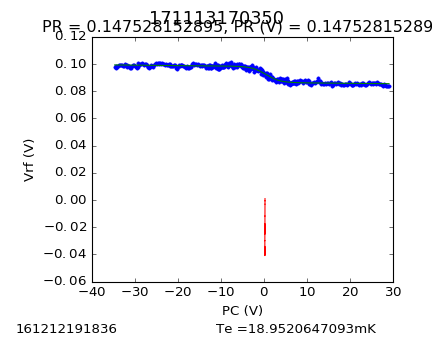

<xarray.Dataset>
Dimensions:  (PR (V): 401)
Coordinates:
    PR       (PR (V)) float64 -0.4696 -0.4696 -0.4696 -0.4696 -0.4696 ...
  * PR (V)   (PR (V)) float64 -0.4696 -0.4696 -0.4696 -0.4696 -0.4696 ...
Data variables:
    PC       (PR (V)) float64 -0.04779 -0.0478 -0.04781 -0.04782 -0.04783 ...
    current  (PR (V)) float32 0.0981058 0.0988311 0.0973152 0.0978663 ...
Attributes:
    filename: 161212191836
    comment: L = 0. V, PL = 0. V, CL = -1.1 V, PC = -0.0478 V, CR = -0.9 V, PR = -0.46964 V, R = -1. V, S = -1.1 V, SL = -0.924 V, SC = -0.8 V, SR = -0.558 V, ST = 0. V, SM = 0. V, SB = 0. V, Co = 0. V, DQDsd = 0. V, RFSG_power=14.500000, RFSG_frequency=247.400000, rf_shift=0.000000, SMU(SMU.voltage=0.000000)


# def PRandPC(PRvalues,PCvalues):
#     with ex.data_store(comment=w.status) as d:
#         #d.axis(np.arange(2), var = 'sweep direction')
#         w.PR = PRvalues[0]
#         w.PC = PCvalues[0]...


In [869]:
#d = ex.load_data('')
d = ex.load_data(r'Z:\Measurements\Chloe\20161005\161212191836.h5')
def PR_to_detuning(PRval):
#     return (PRval-(0-0.3795))/0.01224*1000    #0.0082*1000
#     return (PRval-(0-0.6587))/0.01914*1000
    return (PRval-(0-0.4684))/0.015*1000*0.42


detuning = PR_to_detuning(d['PR'])
current = d['current']

def sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current):
    det = (detuning-det_offset)
    omega = np.sqrt(det**2+t_c**2)
    #print "omegae", t_c
    kB = 86 #ueV/K
    return c_offset + d_current*(det/omega)*np.tanh(omega/(2.*kB*T_e))+slope*det

T_e, t_c, slope, det_offset, c_offset, d_current = 0.08, 0., 10e-5, 1., 3.75, -0.11
model = lmfit.Model(sensor_current, independent_vars=['detuning'])
result = model.fit(current, detuning = detuning,
                   T_e        = lmfit.Parameter(value = T_e, min = 0.01, max = 0.5),
                   t_c        = lmfit.Parameter(value = t_c, min = 0., max = 1.),
                   slope      = lmfit.Parameter(value = slope, min = -1.e-4, max = 1.e-4),
                   det_offset = lmfit.Parameter(value = det_offset, min = -100, max = 100),
                   c_offset   = lmfit.Parameter(value = c_offset, min = 0.01, max = 16.),
                   d_current  = lmfit.Parameter(value = d_current, min = -0.2, max = 0.1))

T_e, t_c, slope, det_offset, c_offset, d_current = (result.best_values[key] for key in result.var_names)

tmp = "Te ="+str(1000*T_e)+"mK"

print result.fit_report()
fig = plt.figure(figsize = (5,4))
plt.plot(detuning, current, '.')
plt.plot(detuning, sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current), '-')
#plt.plot(detuning, sensor_current(detuning, 0.15, t_c, slope, det_offset, c_offset, d_current), '-')
plt.xlabel(r'detuning ($\mu$eV)'); plt.ylabel('current (nA)')
fig.text(0,0.01,d.attrs['filename'])
fig.text(0.5,0.01,tmp)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
print d

## new Te&t fitting

[[Model]]
    Model(sensor_current)
[[Fit Statistics]]
    # function evals   = 196
    # data points      = 27
    # variables        = 6
    chi-square         = 0.000
    reduced chi-square = 0.000
    Akaike info crit   = -552.399
    Bayesian info crit = -544.624
[[Variables]]
    T_e:          0.02953663 +/- 0.002360 (7.99%) (init= 0.04)
    t_c:          0.00643404 +/- 1.31e+07 (204068522371.35%) (init= 0.1)
    slope:        2.3631e-05 +/- 1.06e-05 (44.82%) (init= 0.0001)
    det_offset:   0.41922548 +/- 0.073997 (17.65%) (init= 1)
    c_offset:    -0.00569927 +/- 8.70e-06 (0.15%) (init= 3.75)
    d_current:   -0.00131221 +/- 0.000128 (9.76%) (init=-0.11)
[[Correlations]] (unreported correlations are <  0.100)
    C(slope, d_current)          = -0.994 
    C(T_e, d_current)            = -0.959 
    C(T_e, slope)                =  0.934 
    C(det_offset, c_offset)      = -0.667 
    C(slope, c_offset)           = -0.149 
    C(c_offset, d_current)       =  0.137 
    C(t_c, c_o

<IPython.core.display.Javascript object>


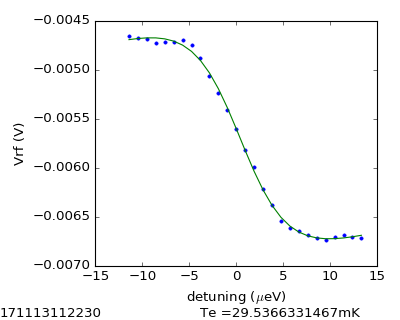

In [871]:
#d1 = ex.load_data(h5files()[-1], load_now = True)
# #d = ex.load_data(170623143447) # 0.18639328603
# #d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)
# # if True: #subtract plane
# #     try:
# #         d1['Vrf_sub'] = tk.remove_plane(d1['Vrf'])*1e3
# #         d1['Vrf_sub'].attrs['units'] = 'mV'
# #     except:
# #         pass

# # print d1['Vrf_sub'][58][28:70]

# #d = d1['Vrf'].values
# d2 = d1['Vrf'][0:22]
# d_ave = d2.values.mean(axis = 0)
# d_a = d_ave[81:160]
# d_b = np.flipud(d_ave)[0:80]
# d =  np.append(d_b,d_a)

#d = ex.load_data(r'Z:\Measurements\Chloe\20161005\161212191836.h5')
def PR_to_detuning(PRval):
    coef = 2.5
    det_ratio = coef/np.sqrt(coef**2+1)
    det_arm = det_ratio * 0.02* np.sqrt(2)
#     return (PRval-(0-0.3795))/0.01224*1000    #0.0082*1000
#     return (PRval-(0-0.6587))/0.01914*1000
    
    return (PRval-(0.08975))/det_arm*1000          # all energy parameters are in 'ueV' unit.


detuning = PR_to_detuning(d['PR'].values)#[60:87]  #[0:121]
Vrf = y#[60:87]

def sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current):
    det = (detuning-det_offset)
    omega = np.sqrt(det**2+t_c**2)
    #print "omegae", t_c
    kB = 86 #ueV/K
    return c_offset + d_current*(det/omega)*np.tanh(omega/(2.*kB*T_e))+slope*det

T_e, t_c, slope, det_offset, c_offset, d_current = 0.04, 0.1, 10e-5, 1., 3.75, -0.11
model = lmfit.Model(sensor_current, independent_vars=['detuning'])
result = model.fit(Vrf, detuning = detuning,
                   T_e        = lmfit.Parameter(value = T_e, min = 0.01, max = 0.5),
                   t_c        = lmfit.Parameter(value = t_c, min = 0., max = 1.e1),
                   slope      = lmfit.Parameter(value = slope, min = -1.e-4, max = 1.e-4),
                   det_offset = lmfit.Parameter(value = det_offset, min = -100, max = 100),
                   c_offset   = lmfit.Parameter(value = c_offset, min = - 10., max = 10.),
                   d_current  = lmfit.Parameter(value = d_current, min = -20, max = 20))

T_e, t_c, slope, det_offset, c_offset, d_current = (result.best_values[key] for key in result.var_names)

tmp = "Te ="+str(1000*T_e)+"mK"

print result.fit_report()
fig = plt.figure(figsize = (5,4))
plt.plot(detuning, Vrf, '.')
plt.plot(detuning, sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current), '-')
#plt.plot(detuning, sensor_current(detuning, 0.15, t_c, slope, det_offset, c_offset, d_current), '-')
plt.xlabel(r'detuning ($\mu$eV)'); plt.ylabel('Vrf (V)')
#fig.text(0,0.01,tmp)
fig.text(0,0.01,d1.attrs['filename'])
fig.text(0.5,0.01,tmp)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
#print d

## new Te-PL fitting

[[Model]]
    Model(sensor_current)
[[Fit Statistics]]
    # function evals   = 59
    # data points      = 40
    # variables        = 6
    chi-square         = 0.000
    reduced chi-square = 0.000
    Akaike info crit   = -707.997
    Bayesian info crit = -697.864
[[Variables]]
    T_e:          0.05000000 +/- 0        (0.00%) (init= 0.05)
    t_c:          18.4998188 +/- 0        (0.00%) (init= 1)
    slope:       -1.4614e-05 +/- 0        (0.00%) (init= 1e-05)
    det_offset:   3.70868063 +/- 0        (0.00%) (init= 1)
    c_offset:     0.00617211 +/- 0        (0.00%) (init= 3.75)
    d_current:    0.00174695 +/- 0        (0.00%) (init=-0.11)
[[Correlations]] (unreported correlations are <  0.100)



<IPython.core.display.Javascript object>


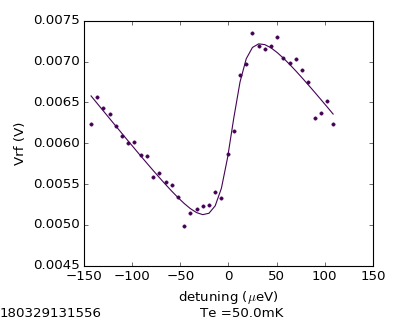

In [49]:
#d = ex.load_data(h5files()[-2], load_now = True)
d1 = ex.load_data(180329131556) # 0.18639328603
# #d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)
# # if True: #subtract plane
# #     try:
# #         d1['Vrf_sub'] = tk.remove_plane(d1['Vrf'])*1e3
# #         d1['Vrf_sub'].attrs['units'] = 'mV'
# #     except:
# #         pass

# # print d1['Vrf_sub'][58][28:70]

# #d = d1['Vrf'].values
# d2 = d1['Vrf'][0:22]
# d_ave = d2.values.mean(axis = 0)
# d_a = d_ave[81:160]
# d_b = np.flipud(d_ave)[0:80]
# d =  np.append(d_b,d_a)
d = d1.sel(method='pad', **{'PR (V)': -0.8905})   
#d = ex.load_data(r'Z:\Measurements\Chloe\20161005\161212191836.h5')
def PL_to_detuning(PLval):
#    coef = 2.5
#    det_ratio = coef/np.sqrt(coef**2+1)
    det_arm = 50   # modulus along detuning,  ueV/mV
#     return (PRval-(0-0.3795))/0.01224*1000    #0.0082*1000
#     return (PRval-(0-0.6587))/0.01914*1000
    
    return (PLval-(-0.3970))*0.86*1000*det_arm          # all energy parameters are in 'ueV' unit.


detuning = PL_to_detuning(d['PL'].values)[90:130]  #[0:121]
Vrf = d['Vrf'].values[90:130] #d['Vrf'].values[10:80]

def sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current):
    det = (detuning-det_offset)
    omega = np.sqrt(det**2+4*t_c**2)
    #print "omegae", t_c
    kB = 86 #ueV/K
    return c_offset + d_current*(det/omega)*np.tanh(omega/(2.*kB*T_e))+slope*det

T_e, t_c, slope, det_offset, c_offset, d_current = 0.05, 1., 1e-5, 1., 3.75, -0.11
model = lmfit.Model(sensor_current, independent_vars=['detuning'])
result = model.fit(Vrf, detuning = detuning,
                   T_e        = lmfit.Parameter(value = T_e, min = 0.05, max = 0.3),
                   t_c        = lmfit.Parameter(value = t_c, min = 0., max = 1000),
                   slope      = lmfit.Parameter(value = slope, min = -1.e-1, max = 1.e-1),
                   det_offset = lmfit.Parameter(value = det_offset, min = -100, max = 100),
                   c_offset   = lmfit.Parameter(value = c_offset, min = - 10., max = 10.),
                   d_current  = lmfit.Parameter(value = d_current, min = -20, max = 20))

T_e, t_c, slope, det_offset, c_offset, d_current = (result.best_values[key] for key in result.var_names)

tmp = "Te ="+str(1000*T_e)+"mK"

tup = result.best_values.items()[-1]

print result.fit_report() # result.best_values.items()[-1], tup[-1] #result.fit_report()
fig = plt.figure(figsize = (5,4))
plt.plot(detuning, Vrf, '.')
plt.plot(detuning, sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current), '-')
#plt.plot(detuning, sensor_current(detuning, 0.15, t_c, slope, det_offset, c_offset, d_current), '-')
plt.xlabel(r'detuning ($\mu$eV)'); plt.ylabel('Vrf (V)')
#fig.text(0,0.01,tmp)
fig.text(0,0.01,d.attrs['filename'])
fig.text(0.5,0.01,tmp)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
#print d

## new Te_PL detuning fit

[[Model]]
    Model(sensor_current)
[[Fit Statistics]]
    # function evals   = 73
    # data points      = 32
    # variables        = 6
    chi-square         = 0.000
    reduced chi-square = 0.000
    Akaike info crit   = -576.963
    Bayesian info crit = -568.169
[[Variables]]
    T_e:          0.05340956 +/- 0        (0.00%) (init= 0.06)
    t_c:          0.10000000 +/- 0        (0.00%) (init= 0.1)
    slope:       -2.3816e-06 +/- 0        (0.00%) (init= 1e-05)
    det_offset:   0.49933673 +/- 0        (0.00%) (init= 1)
    c_offset:    -0.02051780 +/- 0        (0.00%) (init= 3.75)
    d_current:    0.00043788 +/- 0        (0.00%) (init=-0.11)
[[Correlations]] (unreported correlations are <  0.100)


<IPython.core.display.Javascript object>


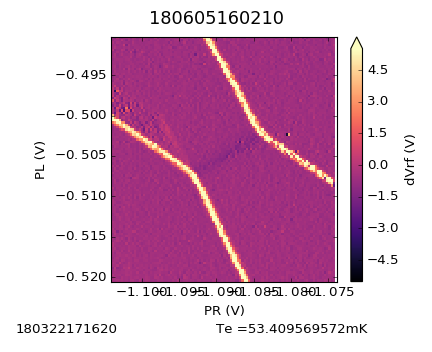

In [662]:
#d = ex.load_data(h5files()[-3], load_now = True)
d = ex.load_data(180605150721)
# #d = ex.load_data(170623143447) # 0.18639328603
# #d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)
# # if True: #subtract plane
# #     try:
# #         d1['Vrf_sub'] = tk.remove_plane(d1['Vrf'])*1e3
# #         d1['Vrf_sub'].attrs['units'] = 'mV'
# #     except:
# #         pass

# # print d1['Vrf_sub'][58][28:70]

#d = d1['Vrf'].values
# d2 = d1['Vrf'][0:22]
# d_ave = d2.values.mean(axis = 0)
# d_a = d_ave[81:160]
# d_b = np.flipud(d_ave)[0:80]
# d =  np.append(d_b,d_a)

#d = ex.load_data(r'Z:\Measurements\Chloe\20161005\161212191836.h5')
def PL_to_detuning(PLval):
#    coef = 2.5
#    det_ratio = coef/np.sqrt(coef**2+1)
    det_arm = 50   #  ueV/mV along detuning, eta 20mV / 1meV
#     return (PRval-(0-0.3795))/0.01224*1000    #0.0082*1000
#     return (PRval-(0-0.6587))/0.01914*1000
    
    return (PLval-(-1.089))*np.sqrt(1.65**2 +1) *1000 *det_arm          # all energy parameters are in 'ueV' unit.


detuning = PL_to_detuning(d['PL'].values) #[25:57]  #[0:121]
Vrf = d['Vrf'].values #[25:57]  #[10:90]

def sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current):
    det = (detuning-det_offset)
    omega = np.sqrt(det**2+t_c**2)
    #print "omegae", t_c
    kB = 86 #ueV/K
    return c_offset + d_current*(det/omega)*np.tanh(omega/(2.*kB*T_e))+slope*det

T_e, t_c, slope, det_offset, c_offset, d_current = 0.05, 1e-1, 1e-5, 1., 3.75, -0.11
model = lmfit.Model(sensor_current, independent_vars=['detuning'])
result = model.fit(Vrf, detuning = detuning,
                   T_e        = lmfit.Parameter(value = T_e, min = 0.03, max = 0.3),
                   t_c        = lmfit.Parameter(value = t_c, min = 0., max = 0.1),
                   slope      = lmfit.Parameter(value = slope, min = -1.e-1, max = 1.e-1),
                   det_offset = lmfit.Parameter(value = det_offset, min = -100, max = 100),
                   c_offset   = lmfit.Parameter(value = c_offset, min = - 10., max = 10.),
                   d_current  = lmfit.Parameter(value = d_current, min = -20, max = 20))

T_e, t_c, slope, det_offset, c_offset, d_current = (result.best_values[key] for key in result.var_names)

tmp = "Te ="+str(1000*T_e)+"mK"

tup = result.best_values.items()[-1]

print result.fit_report(),    # result.best_values.items()[-1], tup[-1] 
fig = plt.figure(figsize = (5,4))
plt.plot(detuning, Vrf, '.')
plt.plot(detuning, sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current), '-')
#plt.plot(detuning, sensor_current(detuning, 0.15, t_c, slope, det_offset, c_offset, d_current), '-')
plt.xlabel(r'detuning ($\mu$eV)'); plt.ylabel('Vrf (V)')
#fig.text(0,0.01,tmp)
fig.text(0,0.01,d.attrs['filename'])
fig.text(0.5,0.01,tmp)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
#print d

[[Model]]
    Model(sensor_current)
[[Fit Statistics]]
    # function evals   = 69
    # data points      = 101
    # variables        = 6
    chi-square         = 0.000
    reduced chi-square = 0.000
    Akaike info crit   = -2007.526
    Bayesian info crit = -1991.836
[[Variables]]
    T_e:          0.06000000 +/- 0        (0.00%) (init= 0.06)
    t_c:          25.4337630 +/- 0        (0.00%) (init= 1)
    slope:       -1.1339e-06 +/- 0        (0.00%) (init= 1e-05)
    det_offset:  -0.94708570 +/- 0        (0.00%) (init= 1)
    c_offset:     0.00425958 +/- 0        (0.00%) (init= 3.75)
    d_current:    0.00051156 +/- 0        (0.00%) (init=-0.11)
[[Correlations]] (unreported correlations are <  0.100)


<IPython.core.display.Javascript object>


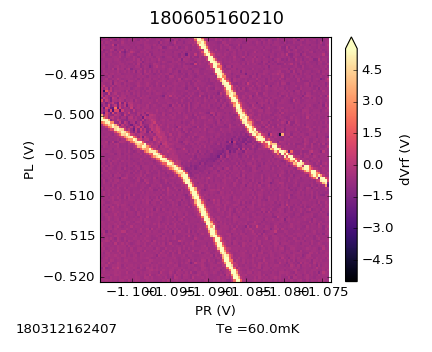

In [663]:
#d = ex.load_data(h5files()[-1], load_now = True)
d = ex.load_data(180312162407) 
#d = ex.load_data(170623143447) # 0.18639328603
# #d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)
# # if True: #subtract plane
# #     try:
# #         d1['Vrf_sub'] = tk.remove_plane(d1['Vrf'])*1e3
# #         d1['Vrf_sub'].attrs['units'] = 'mV'
# #     except:
# #         pass

# # print d1['Vrf_sub'][58][28:70]

#d = d1['Vrf'].values
# d2 = d1['Vrf'][0:22]
# d_ave = d2.values.mean(axis = 0)
# d_a = d_ave[81:160]
# d_b = np.flipud(d_ave)[0:80]
# d =  np.append(d_b,d_a)

#d = ex.load_data(r'Z:\Measurements\Chloe\20161005\161212191836.h5')
def PR_to_detuning(PRval):
#    coef = 2.5
#    det_ratio = coef/np.sqrt(coef**2+1)
    det_arm = 121   # 150ueV/mV
#     return (PRval-(0-0.3795))/0.01224*1000    #0.0082*1000
#     return (PRval-(0-0.6587))/0.01914*1000
    
    return (PRval-(-0.6946))*1000*det_arm          # all energy parameters are in 'ueV' unit.


detuning = PR_to_detuning(d['PR'].values)#[10:90]  #[0:121]
Vrf = d['Vrf'].values#[10:90]  #[10:90]

def sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current):
    det = (detuning-det_offset)
    omega = np.sqrt(det**2+t_c**2)
    #print "omegae", t_c
    kB = 86 #ueV/K
    return c_offset + d_current*(det/omega)*np.tanh(omega/(2.*kB*T_e))+slope*det

T_e, t_c, slope, det_offset, c_offset, d_current = 0.06, 1., 1e-5, 1., 3.75, -0.11
model = lmfit.Model(sensor_current, independent_vars=['detuning'])
result = model.fit(Vrf, detuning = detuning,
                   T_e        = lmfit.Parameter(value = T_e, min = 0.04, max = 0.06),
                   t_c        = lmfit.Parameter(value = t_c, min = 0., max = 1000.),
                   slope      = lmfit.Parameter(value = slope, min = -1.e-1, max = 1.e-1),
                   det_offset = lmfit.Parameter(value = det_offset, min = -100, max = 100),
                   c_offset   = lmfit.Parameter(value = c_offset, min = - 10., max = 10.),
                   d_current  = lmfit.Parameter(value = d_current, min = -20, max = 20))

T_e, t_c, slope, det_offset, c_offset, d_current = (result.best_values[key] for key in result.var_names)

tmp = "Te ="+str(1000*T_e)+"mK"

tup = result.best_values.items()[-1]

print result.fit_report(),    # result.best_values.items()[-1], tup[-1] 
fig = plt.figure(figsize = (5,4))
plt.plot(detuning, Vrf, '.')
plt.plot(detuning, sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current), '-')
#plt.plot(detuning, sensor_current(detuning, 0.15, t_c, slope, det_offset, c_offset, d_current), '-')
plt.xlabel(r'detuning ($\mu$eV)'); plt.ylabel('Vrf (V)')
#fig.text(0,0.01,tmp)
fig.text(0,0.01,d.attrs['filename'])
fig.text(0.5,0.01,tmp)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
#print d

<IPython.core.display.Javascript object>


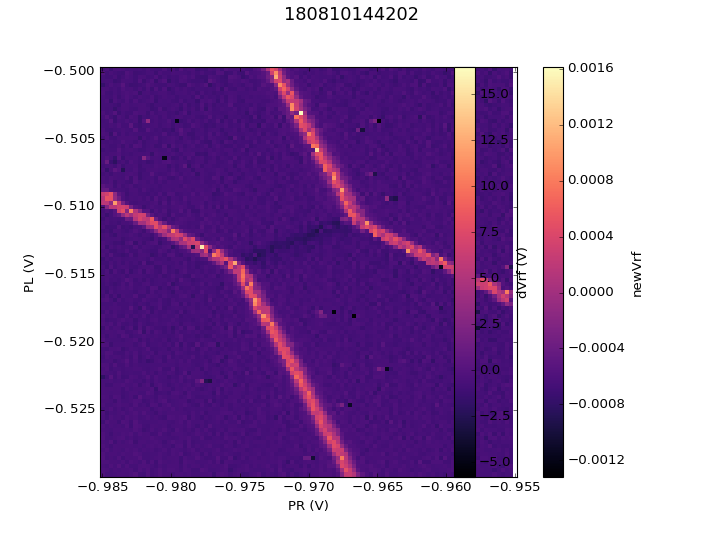

In [481]:
d = ex.load_data(h5files()[-1], load_now = True)

#d = ex.load_data(180625155502)
#d = ex.load_data(180329134302)
#d = ex.load_data(170410132638)170421155935.h5
#d = ex.load_data(180424170911)
#d = ex.load_data(170501122245)
#d = ex.load_data(170421155935)
# d['Vrf_trans'] = d['Vrf'].transpose()
# d['dVrf_trans'] = d['dVrf'].transpose()

# d['Vrf_sub_trans'] = d['Vrf_sub'].transpose()
#cmaps = cm.Spectral
#cmaps = parula_map
d['newVrf']= d['Vrf'] + 0.001
for nn in range(len(d['repeat'].values)):
    d['newVrf'][nn,:] = d['Vrf'][nn,:]- np.mean(d['Vrf'][nn,:].values)
fig1 = plt.figure()
#d1 = d[SMU.voltage = -0.0015]
tk.plot(d,  name = 'Vrf',cmap = 'magma', style = '-o') #  [{'PC (V)': 22}],interpolation = 'bicubic')#, ylog = True)
#tk.implot(d['dVrf'], d['PR'],d['PC'],vmax=8, vmin=-8, cmap ='magma',interpolation = 'None' )
#tk.implot(d['dVrf'], d['PR'],d['PC'],extent=[0.25, 0.29, -0.240, -0.2005],vmax=8, vmin=-8, cmap =parula_map,interpolation = 'None' )
#print d #d.attrs

In [613]:
d['Vrf'][0,:]
#np.mean(d['Vrf'].values, axis =0)

<xarray.DataArray 'Vrf' (PR (V): 81)>
array([ 0.01973314,  0.01981451,  0.0198124 ,  0.01958993,  0.01944764,
        0.01940621,  0.0193587 ,  0.0193983 ,  0.01933264,  0.01930919,
        0.01921242,  0.01920553,  0.019201  ,  0.01912003,  0.01906656,
        0.01894313,  0.01886347,  0.0188479 ,  0.01882233,  0.01879542,
        0.01879644,  0.01880938,  0.01867563,  0.01873163,  0.01869712,
        0.01874154,  0.01851703,  0.01852111,  0.01850899,  0.01859399,
        0.01865869,  0.01865517,  0.01867409,  0.01872853,  0.01870629,
        0.01886861,  0.01900866,  0.01902971,  0.01918651,  0.01928464,
        0.01946295,  0.01951257,  0.01954599,  0.01952126,  0.01957211,
        0.01954227,  0.01958918,  0.01955974,  0.01946508,  0.01942795,
        0.01924234,  0.01941632,  0.01931312,  0.01929178,  0.01925964,
        0.01916813,  0.01911085,  0.01902505,  0.01905799,  0.01897032,
        0.01890766,  0.01891024,  0.01888473,  0.01896957,  0.01892973,
        0.01868835,  0.018

## new tc~detuning fit

[[Model]]
    Model(sensor_current)
[[Fit Statistics]]
    # function evals   = 397
    # data points      = 80
    # variables        = 6
    chi-square         = 0.000
    reduced chi-square = 0.000
    Akaike info crit   = -1515.749
    Bayesian info crit = -1501.457
[[Variables]]
    T_e:          0.05000000 +/- 0        (0.00%) (init= 0.05)
    t_c:          45.1120449 +/- 0        (0.00%) (init= 1)
    slope:        1.6406e-05 +/- 0        (0.00%) (init= 1e-05)
    det_offset:   11.4912468 +/- 0        (0.00%) (init= 1)
    c_offset:     0.02734414 +/- 0        (0.00%) (init= 3.75)
    d_current:    0.00336866 +/- 0        (0.00%) (init=-0.11)
[[Correlations]] (unreported correlations are <  0.100)


<IPython.core.display.Javascript object>


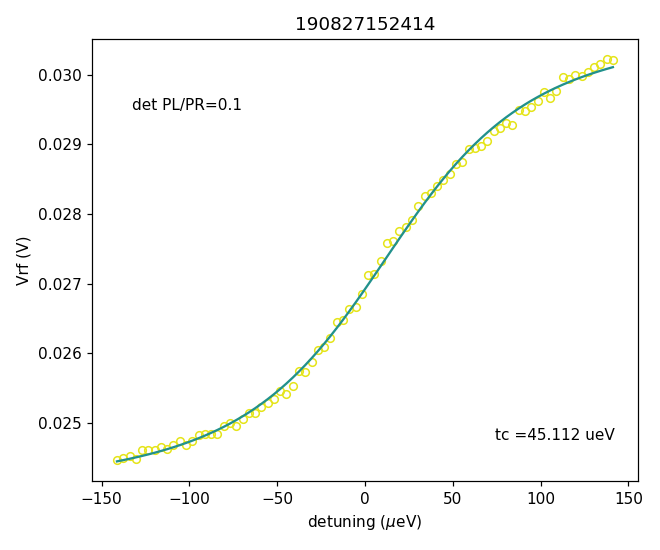

In [366]:
#d1 = ex.load_data(h5files()[-1], load_now = True)
#d1 = ex.load_data(190522002535)
#d1 = ex.load_data(181218211508)    # interdot sweep along detuning PL/PR =1/4, L =-0.46
#d1 = ex.load_data(181218175019)  # interdot sweep PR only, L =-0.46
#d1 = ex.load_data(181205152258) # interdot sweep PR, L =-0.46
#d1 = ex.load_data(180625155502)
#d1 = ex.load_data(180802165142)
dtr= ex.load_data(190827152414) # 190826140135
wh = 1
choice = [ 5, slice(0,19)][wh]
d = dtr.isel(**{'repeat':choice})  # slice(7,9) , not including last one
#d.isel(**{'repeat': slice(1,10)}) 
#d = ex.load_data(180606170630)
# #d = ex.load_data(170623143447) # 0.18639328603
# #d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)
# # if True: #subtract plane
# #     try:
# #         d1['Vrf_sub'] = tk.remove_plane(d1['Vrf'])*1e3
# #         d1['Vrf_sub'].attrs['units'] = 'mV'
# #     except:
# #         pass

# # print d1['Vrf_sub'][58][28:70]

#d = d1['Vrf'].values
# d2 = d1['Vrf'][0:22]
# d_ave = d2.values.mean(axis = 0)
# d_a = d_ave[81:160]
# d_b = np.flipud(d_ave)[0:80]
# d =  np.append(d_b,d_a)

#d = ex.load_data(r'Z:\Measurements\Chloe\20161005\161212191836.h5')

start, end  = 10, 90
PR_mid = np.mean(d['PR'].values[start:end])       # -0.23116
ratio = 0.1   #  1.75 is the PL/PR ratio of detuning 

sweep_vec = np.array([-1., 1.0])  # actual sweep direction 
det_vec = np.array([-1.0, 0.001])    #  detuing direc from stability


def PR_to_detuning(PRval):
#    coef = 2.5
#    det_ratio = coef/np.sqrt(coef**2+1)
    det_arm = 1000./28.   #  ueV/mV along detuning, eta 27mV / 1meV
    #ratio = 2.0       # PL/PR ratio along detuning
    #return (PRval-(PR_mid))*(1.0/np.sqrt(ratio**2 +1.)) *1000 *det_arm  # for sweeping along PR only   # all energy parameters are in 'ueV' unit.
    #return (PRval-(PR_mid))*(np.sqrt(ratio**2 +1.)/1.) *1000 *det_arm  # for sweeping along detuning   # all energy parameters are in 'ueV' unit.
    return (PRval-(PR_mid))*( np.abs(det_vec[0])/np.sqrt(det_vec[0]**2+det_vec[1]**2) + (np.abs(det_vec[1])/np.sqrt(det_vec[0]**2+det_vec[1]**2)) * np.abs(sweep_vec[1]/sweep_vec[0]) )*1000*det_arm

detuning = PR_to_detuning(d['PR'].values)[start:end] #[25:57]  #[0:121]
Vrf =  d['Vrf'].values[start:end] if wh ==0 else np.mean(d['Vrf'].values, axis =0)[start:end]  # np.mean(d['Vrf'].values, axis =0) #[25:57]  #[10:90]

def sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current):
    det = (detuning-det_offset)
    omega = np.sqrt(det**2 + 4.* t_c**2)
    #print "omegae", t_c
    kB = 86. #ueV/K
    return c_offset + d_current*(det/omega)*np.tanh(omega/(2.*kB*T_e))+slope*det

T_e, t_c, slope, det_offset, c_offset, d_current = 0.05, 1., 1e-5, 1., 3.75, -0.11
model = lmfit.Model(sensor_current, independent_vars=['detuning'])
result = model.fit(Vrf, detuning = detuning,
                   T_e        = lmfit.Parameter(value = T_e, min = 0.0, max =0.05),    # (0.01,0.06)   max = t_c/3./86.
                   t_c        = lmfit.Parameter(value = t_c, min = 0., max = 500),     # (0, 500)
                   slope      = lmfit.Parameter(value = slope, min = -1.e-1, max = 1.e-1),
                   det_offset = lmfit.Parameter(value = det_offset, min = -100, max = 100),
                   c_offset   = lmfit.Parameter(value = c_offset, min = - 10., max = 10.),
                   d_current  = lmfit.Parameter(value = d_current, min = -20, max = 20))

T_e, t_c, slope, det_offset, c_offset, d_current = (result.best_values[key] for key in result.var_names)

tmp = "Te ="+str(1000*T_e)+"mK"
tc = "tc ="+ '%.3f'%(t_c)+" ueV"
vect = 'det PL/PR='+ str(ratio)

tup = result.best_values.items()[-1]

print result.fit_report(),    # result.best_values.items()[-1], tup[-1] 
fig = plt.figure(figsize = (6,5))
cmap = cm.get_cmap('viridis')
plt.plot(detuning, Vrf - slope*(detuning-det_offset),  '.', ms = 10, mfc ='none' , c =cmap(0.96) )   # c = cmap(0.3), Vrf- slope*(detuning-det_offset)
plt.plot(detuning, sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current)- slope*(detuning-det_offset), '-', c=cmap(0.5))
#det_ex = np.linspace(2.*min(detuning)-max(detuning),2.*max(detuning)-min(detuning),201)
#plt.plot(det_ex, sensor_current(det_ex, 0.15, t_c, slope, det_offset, c_offset, d_current)- slope*(det_ex-det_offset), '-')
plt.xlabel(r'detuning ($\mu$eV)'); plt.ylabel('Vrf (V)')
#fig.text(0,0.01,tmp)
#fig.text(0,0.01,d.attrs['filename'])
plt.title(d.attrs['filename'])
# fig.text(0.8,0.01,tmp)
#fig.text(0.2,0.85, tc)
#fig.text(0.2,0.85,tmp)
fig.text(0.75,0.2, tc)
fig.text(0.2,0.80,vect)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
#print d

<IPython.core.display.Javascript object>


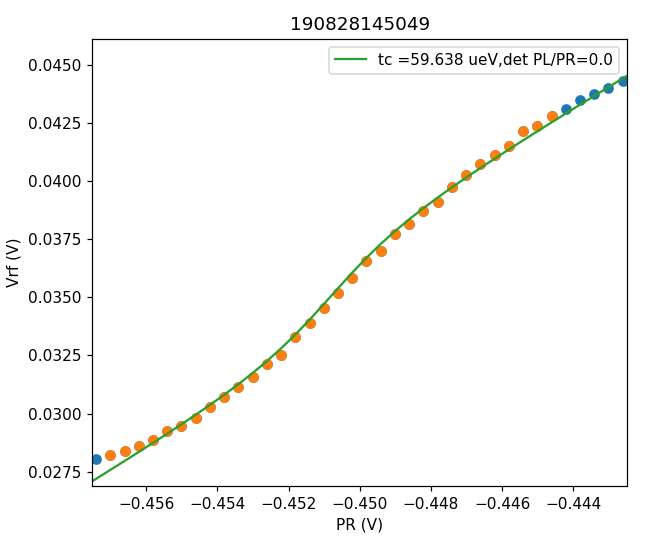

[[Model]]
    Model(sensor_current)
[[Fit Statistics]]
    # function evals   = 499
    # data points      = 32
    # variables        = 6
    chi-square         = 0.000
    reduced chi-square = 0.000
    Akaike info crit   = -526.641
    Bayesian info crit = -517.846
[[Variables]]
    T_e:          0.05000000 +/- 0        (0.00%) (init= 0.05)
    t_c:          59.6381774 +/- 0        (0.00%) (init= 80)
    slope:        1.8420e-05 +/- 0        (0.00%) (init= 1.860639e-05)
    det_offset:  -1.5632e-12 +/- 0        (0.00%) (init=-1.556089e-12)
    c_offset:     0.03504678 +/- 0        (0.00%) (init= 0.03629345)
    d_current:    0.00188852 +/- 0        (0.00%) (init= 0.1)
[[Correlations]] (unreported correlations are <  0.100)
slope0 =  1.860639419067983e-05


In [462]:
d1 = ex.load_data(h5files()[-1], load_now = True)
#d1 = ex.load_data(190828143346)
#d1 = ex.load_data(181218211508)    # interdot sweep along detuning PL/PR =1/4, L =-0.46
#d1 = ex.load_data(181218175019)  # interdot sweep PR only, L =-0.46
#d1 = ex.load_data(181205152258) # interdot sweep PR, L =-0.46
#d1 = ex.load_data(180625155502)
#d1 = ex.load_data(180802165142)
wh = 1
choice = [ 13, slice(0,12)][wh]   # slice(0,11) or [3,4,5,6,7]
d = d1.isel(**{'repeat':choice})  # slice(7,9) , not including last one
#d.isel(**{'repeat': slice(1,10)}) 
#d = ex.load_data(180606170630)
# #d = ex.load_data(170623143447) # 0.18639328603
# #d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)
# # if True: #subtract plane
# #     try:
# #         d1['Vrf_sub'] = tk.remove_plane(d1['Vrf'])*1e3
# #         d1['Vrf_sub'].attrs['units'] = 'mV'
# #     except:
# #         pass

# # print d1['Vrf_sub'][58][28:70]

#d = d1['Vrf'].values
# d2 = d1['Vrf'][0:22]
# d_ave = d2.values.mean(axis = 0)
# d_a = d_ave[81:160]
# d_b = np.flipud(d_ave)[0:80]
# d =  np.append(d_b,d_a)
fig = plt.figure(figsize = (6,5))
#d = ex.load_data(r'Z:\Measurements\Chloe\20161005\161212191836.h5')

plt.plot(d['PR'].values, np.mean(d['Vrf'].values, axis =0),  '.', ms = 12, )   #  mfc ='none' 

for nn,ran in enumerate(np.array([35])):  # [38,37,39]
    start, end  = ran, len(d['PR'].values)-ran+1

    PR_mid = np.mean(d['PR'].values[start:end])       # -0.23116
    ratio = 0.0   #  1.75 is the PL/PR ratio of detuning 

    sweep_vec = np.array([-1., 0.10])  # sweep direction in pulse
    det_vec = np.array([-1., 0.10])    # actual detuing direc from stability


    def PR_to_detuning(PRval):
    #    coef = 2.5
    #    det_ratio = coef/np.sqrt(coef**2+1)
        det_arm = 1000./20.   #  ueV/mV along detuning, eta 27mV / 1meV
        #ratio = 2.0       # PL/PR ratio along detuning
        #return (PRval-(PR_mid))*(1.0/np.sqrt(ratio**2 +1.)) *1000 *det_arm  # for sweeping along PR only   # all energy parameters are in 'ueV' unit.
        return (PRval-(PR_mid))*(np.sqrt(ratio**2 +1.)/1.) *1000 *det_arm  # for sweeping along detuning   # all energy parameters are in 'ueV' unit.
        #return (PRval-(PR_mid))*( np.abs(det_vec[0])/np.sqrt(det_vec[0]**2+det_vec[1]**2) + (np.abs(det_vec[1])/np.sqrt(det_vec[0]**2+det_vec[1]**2)) * np.abs(sweep_vec[1]/sweep_vec[0]) )*1000*det_arm
    detuning0 = PR_to_detuning(d['PR'].values)
    detuning = PR_to_detuning(d['PR'].values)[start:end] #[25:57]  #[0:121]
    Vrf0 =  d['Vrf'].values if wh ==0 else np.mean(d['Vrf'].values, axis =0)
    Vrf =  d['Vrf'].values[start:end] if wh ==0 else np.mean(d['Vrf'].values, axis =0)[start:end]  # np.mean(d['Vrf'].values, axis =0) #[25:57]  #[10:90]

    def sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current):
        det = (detuning-det_offset)
        omega = np.sqrt(det**2 + 4.* t_c**2)
        #print "omegae", t_c
        kB = 86. #ueV/K
        return c_offset + d_current*(det/omega)*np.tanh(omega/(2.*kB*T_e))+slope*det

    T_e, t_c = 0.05, 80.
    slope0 = (Vrf0[11] - Vrf0[0])/(detuning0[11]-detuning0[0])
    slope, det_offset =  slope0, np.mean(detuning) #1.
    c_offset, d_current = np.mean(Vrf0),   0.1# d_current is amplitude of S shape Vrf, c_offset is Vrf offset
    model = lmfit.Model(sensor_current, independent_vars=['detuning'])
    result = model.fit(Vrf, detuning = detuning,
                       T_e        = lmfit.Parameter(value = T_e, min = 0.04, max =0.06),    #  max = t_c/3./86.
                       t_c        = lmfit.Parameter(value = t_c, min = 0., max = 300.),
                       slope      = lmfit.Parameter(value = slope, min = 0.99*slope0, max = 3*slope0),
                       det_offset = lmfit.Parameter(value = det_offset, min = -100, max = 100),
                       c_offset   = lmfit.Parameter(value = c_offset, min = - 1., max = 1.),
                       d_current  = lmfit.Parameter(value = d_current, min = -10., max = 10.))

    T_e, t_c, slope, det_offset, c_offset, d_current = (result.best_values[key] for key in result.var_names)

    tmp = "Te ="+str(1000*T_e)+"mK"
    tc = "tc ="+ '%.3f'%(t_c)+" ueV"
    vect = 'det PL/PR='+ str(ratio)

    tup = result.best_values.items()[-1]
    #plt.plot(detuning, Vrf,  '.', ms = 10, mfc ='none' ,label = tc+','+vect )   # c = cmap(0.3), Vrf- slope*(detuning-det_offset)
    #if nn== 0:
    plt.plot(d['PR'].values[start:end], np.mean(d['Vrf'].values, axis =0)[start:end],  '.', ms = 12  ) #  mfc ='none' 
    #plt.plot(d['PR'].values, np.mean(d['Vrf'].values, axis =0),  '.', ms = 10, mfc ='none'  )   # c = cmap(0.3), Vrf- slope*(detuning-det_offset)
    plt.plot(d['PR'].values, sensor_current(detuning0, T_e, t_c, slope, det_offset, c_offset, d_current), '-',label = tc+','+vect)
    #det_ex = np.linspace(2.*min(detuning)-max(detuning),2.*max(detuning)-min(detuning),201)
    #plt.plot(det_ex, sensor_current(det_ex, 0.15, t_c, slope, det_offset, c_offset, d_current), '-')
    plt.legend()

print result.fit_report(),    # result.best_values.items()[-1], tup[-1] 
print 'slope0 = ',slope0


# plt.xlabel(r'detuning ($\mu$eV)'); plt.ylabel('Vrf (V)')
plt.xlabel(r'PR (V)'); plt.ylabel('Vrf (V)')
#fig.text(0,0.01,tmp)
#fig.text(0,0.01,d.attrs['filename'])
plt.title(d.attrs['filename'])
#fig.text(0.8,0.01,tmp)
#fig.text(0.2,0.85, tc)
#fig.text(0.2,0.80,vect)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
#print d

In [440]:
PR_mid

-0.2429

## loop fitting Te or tc

[[Model]]
    Model(sensor_current)
[[Fit Statistics]]
    # function evals   = 66
    # data points      = 100
    # variables        = 6
    chi-square         = 0.000
    reduced chi-square = 0.000
    Akaike info crit   = -2144.870
    Bayesian info crit = -2129.239
[[Variables]]
    T_e:          0.08932180 +/- 0        (0.00%) (init= 0.05)
    t_c:          0.10000000 +/- 0        (0.00%) (init= 0.1)
    slope:       -1.3395e-06 +/- 0        (0.00%) (init= 1e-05)
    det_offset:   36.1370369 +/- 0        (0.00%) (init= 1)
    c_offset:     0.12662917 +/- 0        (0.00%) (init= 3.75)
    d_current:    0.00031473 +/- 0        (0.00%) (init=-0.11)
[[Correlations]] (unreported correlations are <  0.100)


<IPython.core.display.Javascript object>


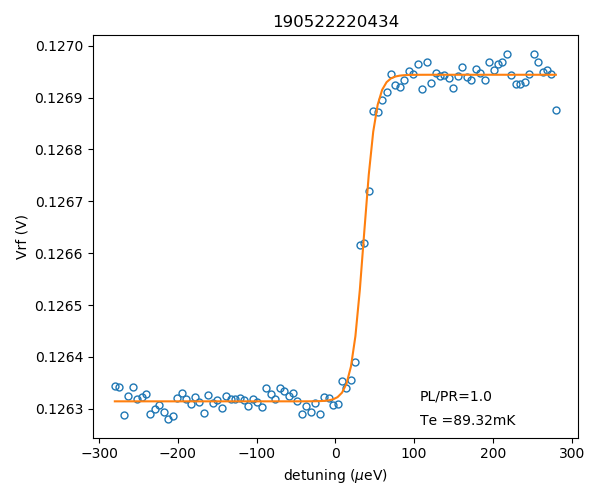

[0.09397 0.08774 0.08046 0.08049 0.08601 0.08839 0.15495 0.10273 0.08681
 0.12174 0.07896 0.09321 0.09076 0.08969 0.09267 0.09479 0.09055 0.10236
 0.08502 0.09225 0.08191 0.08969 0.08143 0.08213 0.09337 0.09021 0.08287
 0.08467 0.08717 0.09694 0.08735 0.10011 0.08552 0.09585 0.09895 0.09189
 0.06864 0.1071  0.0759  0.07739 0.08234 0.10264 0.10045 0.07457 0.08142
 0.08975 0.082   0.08196 0.08589 0.08932] 0.09045960000000001


In [411]:
#loopc,fit every trace and get tc_array and average value

#d1 = ex.load_data(h5files()[-1], load_now = True)
#da = ex.load_data(190522002535)
da = ex.load_data(190522220434)
wh = 1
choice = [1, slice(0,50)][wh]
d = da.isel(**{'repeat':choice})  # slice(7,9) , not including last one
#d.isel(**{'repeat': slice(1,10)}) 
#d = ex.load_data(180606170630)
# #d = ex.load_data(170623143447) # 0.18639328603
# #d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)
# # if True: #subtract plane
# #     try:
# #         d1['Vrf_sub'] = tk.remove_plane(d1['Vrf'])*1e3
# #         d1['Vrf_sub'].attrs['units'] = 'mV'
# #     except:
# #         pass

# # print d1['Vrf_sub'][58][28:70]

#d = d1['Vrf'].values
# d2 = d1['Vrf'][0:22]
# d_ave = d2.values.mean(axis = 0)
# d_a = d_ave[81:160]
# d_b = np.flipud(d_ave)[0:80]
# d =  np.append(d_b,d_a)

#d = ex.load_data(r'Z:\Measurements\Chloe\20161005\161212191836.h5')

start, end  = 0, 100
PR_mid = np.mean(d['PR'].values[start:end])
ratio = 1./1. #  1.75 is the PL/PR ratio of detuning

def PR_to_detuning(PRval):
#    coef = 2.5
#    det_ratio = coef/np.sqrt(coef**2+1)
    det_arm = 1000./25.   #  ueV/mV along detuning, eta 27mV / 1meV
    #ratio = 2.0       # PL/PR ratio along detuning
    return (PRval-(PR_mid))*(np.sqrt(ratio**2 +1.)/1) *1000 *det_arm  # 1.75 is the PL/PR ratio   # all energy parameters are in 'ueV' unit.
    #return (PLval-(-0.505))*(np.sqrt(1.65**2 +1)/1.65) *1000 *det_arm 


def sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current):
    det = (detuning-det_offset)
    omega = np.sqrt(det**2 + 4.* t_c**2)
    #print "omegae", t_c
    kB = 86 #ueV/K
    return c_offset + d_current*(det/omega)*np.tanh(omega/(2.*kB*T_e))+slope*det

Te_arr = np.empty(len(d.repeat))
tc_arr = np.empty(len(d.repeat))

for nn in range(len(d.repeat)):
    
    detuning = PR_to_detuning(d['PR'].values)[start:end] #[25:57]  #[0:121]
    Vrf =  d['Vrf'].values[nn][start:end] #if wh ==0 else np.mean(d['Vrf'].values, axis =0)[start:end]  # np.mean(d['Vrf'].values, axis =0) #[25:57]  #[10:90]

    T_e, t_c, slope, det_offset, c_offset, d_current = 0.05, 1., 1e-5, 1., 3.75, -0.11
    model = lmfit.Model(sensor_current, independent_vars=['detuning'])
    result = model.fit(Vrf, detuning = detuning,
                       T_e        = lmfit.Parameter(value = T_e, min = 0.0, max =0.5),   # min = 0.04, max =0.06 #  max = t_c/3./86.
                       t_c        = lmfit.Parameter(value = t_c, min = 0., max = 0.1),    # min = 0., max = 300.
                       slope      = lmfit.Parameter(value = slope, min = -1.e-1, max = 1.e-1),
                       det_offset = lmfit.Parameter(value = det_offset, min = -100, max = 100),
                       c_offset   = lmfit.Parameter(value = c_offset, min = - 10., max = 10.),
                       d_current  = lmfit.Parameter(value = d_current, min = -20, max = 20))

    T_e, t_c, slope, det_offset, c_offset, d_current = (result.best_values[key] for key in result.var_names)
    #tc_arr[nn] = t_c
    T_ee = round(T_e,5)
    Te_arr[nn] = T_ee

    
tmp = "Te ="+str(1000*T_ee)+"mK"
tc = "tc ="+str(t_c)+"ueV"
vect = 'PL/PR='+ str(ratio)

tup = result.best_values.items()[-1]

print result.fit_report(),    # result.best_values.items()[-1], tup[-1] 
fig = plt.figure(figsize = (6,5))
plt.plot(detuning, Vrf- slope*(detuning-det_offset),  '.', ms = 10, mfc ='none'  )   # c = cmap(0.3), Vrf- slope*(detuning-det_offset)
plt.plot(detuning, sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current)- slope*(detuning-det_offset), '-')
#plt.plot(detuning, sensor_current(detuning, 0.15, t_c, slope, det_offset, c_offset, d_current), '-')
plt.xlabel(r'detuning ($\mu$eV)'); plt.ylabel('Vrf (V)')
#fig.text(0,0.01,tmp)
plt.title(da.attrs['filename'])
#fig.text(0,0.01,d.attrs['filename'])
fig.text(0.7,0.15,tmp)
#fig.text(0.6,0.85,tc)
fig.text(0.7,0.2,vect)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
#print d
#print tc_arr, np.mean(tc_arr)
print Te_arr, np.mean(Te_arr)

In [177]:
d['Vrf'].values[0]

array([ 0.01706394,  0.01707922,  0.01693017,  0.0169547 ,  0.01695963,
        0.01684595,  0.01667053,  0.01646514,  0.01645058,  0.0164076 ,
        0.01622181,  0.01617232,  0.01600449,  0.01603157,  0.01612846,
        0.01599035,  0.01585489,  0.01568617,  0.01566617,  0.01575875,
        0.0158407 ,  0.01592162,  0.01584759,  0.01583786,  0.01584998,
        0.01589856,  0.01609806,  0.01655409,  0.01681559,  0.01705628,
        0.0171559 ,  0.01724863,  0.01739081,  0.0172917 ,  0.01714943,
        0.01711958,  0.0171328 ,  0.0170304 ,  0.01699346,  0.01693705,
        0.0168882 ,  0.01669187,  0.01666674,  0.01645008,  0.01624417,
        0.01627663,  0.01618367,  0.01612807,  0.0161394 ,  0.01602091,
        0.01596518,  0.01586653,  0.01580277,  0.01567371,  0.01554811,
        0.01553689,  0.01553341,  0.01542844,  0.01509919,  0.01504342,
        0.0151604 ], dtype=float32)

In [643]:
which = 1
choice = [0, slice(0,12)][which]
print choice

slice(0, 12, None)


In [121]:
d['PL'].values


array([-0.3375575 , -0.33748635, -0.3374152 , -0.33734405, -0.3372729 ,
       -0.33720175, -0.3371306 , -0.33705945, -0.3369883 , -0.33691715,
       -0.336846  , -0.33677485, -0.3367037 , -0.33663255, -0.3365614 ,
       -0.33649025, -0.3364191 , -0.33634795, -0.3362768 , -0.33620565,
       -0.3361345 , -0.33606335, -0.3359922 , -0.33592105, -0.3358499 ,
       -0.33577875, -0.3357076 , -0.33563645, -0.3355653 , -0.33549415,
       -0.335423  , -0.33535185, -0.3352807 , -0.33520955, -0.3351384 ,
       -0.33506725, -0.3349961 , -0.33492495, -0.3348538 , -0.33478265,
       -0.3347115 , -0.33464035, -0.3345692 , -0.33449805, -0.3344269 ,
       -0.33435575, -0.3342846 , -0.33421345, -0.3341423 , -0.33407115,
       -0.334     , -0.33392885, -0.3338577 , -0.33378655, -0.3337154 ,
       -0.33364425, -0.3335731 , -0.33350195, -0.3334308 , -0.33335965,
       -0.3332885 , -0.33321735, -0.3331462 , -0.33307505, -0.3330039 ,
       -0.33293275, -0.3328616 , -0.33279045, -0.3327193 , -0.33

## Multiple Te fitting

('T_e', 0.037448305262666903) 0.0374483052627 0
('T_e', 0.037614037235220887) 0.0376140372352 1
('T_e', 0.031607803257981376) 0.031607803258 2
('T_e', 0.020359031785454666) 0.0203590317855 3
('T_e', 0.03438177211237315) 0.0343817721124 4
('T_e', 0.15218627055163045) 0.152186270552 5
[[Model]]
    Model(sensor_current)
[[Fit Statistics]]
    # function evals   = 90
    # data points      = 60
    # variables        = 6
    chi-square         = 0.000
    reduced chi-square = 0.000
    Akaike info crit   = -1085.828
    Bayesian info crit = -1073.262
[[Variables]]
    T_e:          0.15218627 +/- 0        (0.00%) (init= 0.04)
    t_c:          1          +/- 0        (0.00%) (init= 1)
    slope:        3.1340e-06 +/- 0        (0.00%) (init= 1e-05)
    det_offset:   11.7715851 +/- 0        (0.00%) (init= 1)
    c_offset:     0.00173227 +/- 0        (0.00%) (init= 3.75)
    d_current:    0.00048843 +/- 0        (0.00%) (init=-0.11)
[[Correlations]] (unreported correlations are <  0.100)



<IPython.core.display.Javascript object>


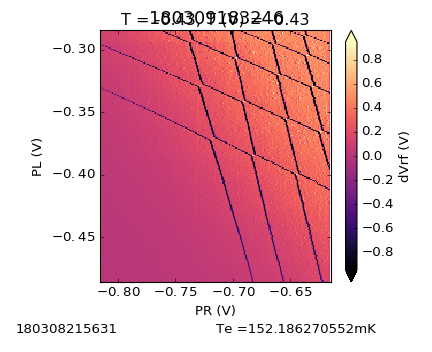

('T_e', 0.26600882040355683) 0.266008820404 6
('T_e', 0.049296736845669535) 0.0492967368457 7
('T_e', 0.00021696994511725685) 0.000216969945117 8
('T_e', 0.054395425701340379) 0.0543954257013 9
('T_e', 0.035090150799297982) 0.0350901507993 10
('T_e', 0.047123321670229125) 0.0471233216702 11
('T_e', 0.077770471514334708) 0.0777704715143 12
('T_e', 0.0037404999163222095) 0.00374049991632 13
('T_e', 0.044535244584584757) 0.0445352445846 14
('T_e', 0.02616475111486773) 0.0261647511149 15
('T_e', 0.055966689751476388) 0.0559666897515 16
('T_e', 0.00032773500845063028) 0.000327735008451 17
('T_e', 0.1211281043864075) 0.121128104386 18
('T_e', 2.4100461757720069e-05) 2.41004617577e-05 19
('T_e', 0.091848252763820706) 0.0918482527638 20
('T_e', 0.23902181443460901) 0.239021814435 21
('T_e', 0.0082605998808635717) 0.00826059988086 22
('T_e', 0.00010165918317515676) 0.000101659183175 23
('T_e', 0.058716997920811698) 0.0587169979208 24
('T_e', 0.019607743342689471) 0.0196077433427 25
('T_e', 0.04

In [14]:
d0 = ex.load_data(180308215631) #  this file is the repeated scan if PL across detuning, first 30 traces are unshifted

#d0 = ex.load_data(h5files()[-1], load_now = True)
# #d = ex.load_data(170623143447) # 0.18639328603
# #d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)
# # if True: #subtract plane
# #     try:
# #         d1['Vrf_sub'] = tk.remove_plane(d1['Vrf'])*1e3
# #         d1['Vrf_sub'].attrs['units'] = 'mV'
# #     except:
# #         pass

# # print d1['Vrf_sub'][58][28:70]

# #d = d1['Vrf'].values
# d2 = d1['Vrf'][0:22]
# d_ave = d2.values.mean(axis = 0)
# d_a = d_ave[81:160]
# d_b = np.flipud(d_ave)[0:80]
# d =  np.append(d_b,d_a)

#d = ex.load_data(r'Z:\Measurements\Chloe\20161005\161212191836.h5')

def PL_to_detuning(PLval):
#    coef = 2.5
#    det_ratio = coef/np.sqrt(coef**2+1)
    det_arm = 153   # 150ueV/mV
#     return (PRval-(0-0.3795))/0.01224*1000    #0.0082*1000
#     return (PRval-(0-0.6587))/0.01914*1000
    
    return (PLval-(-0.05956))*1000*det_arm          # all energy parameters are in 'ueV' unit.

Tes, Tes_re = [],[]
for ii in range(40):
    d =  d0[{'C2 (V)' : ii}]
    detuning = PL_to_detuning(d['PL'].values)[10:70]  #[0:121]
    Vrf = d['Vrf'].values[10:70]

    def sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current):
        det = (detuning-det_offset)
        omega = np.sqrt(det**2+t_c**2)
        #print "omegae", t_c
        kB = 86 #ueV/K
        return c_offset + d_current*(det/omega)*np.tanh(omega/(2.*kB*T_e))+slope*det

    T_e, t_c, slope, det_offset, c_offset, d_current = 0.04, 1., 1e-5, 1., 3.75, -0.11
    model = lmfit.Model(sensor_current, independent_vars=['detuning'])
    result = model.fit(Vrf, detuning = detuning,
                       T_e        = lmfit.Parameter(value = T_e, min = 0.0, max = 0.3),
                       t_c        = lmfit.Parameter(value = t_c, min = 0., max = 1.),
                       slope      = lmfit.Parameter(value = slope, min = -1.e-1, max = 1.e-1),
                       det_offset = lmfit.Parameter(value = det_offset, min = -100, max = 100),
                       c_offset   = lmfit.Parameter(value = c_offset, min = - 10., max = 10.),
                       d_current  = lmfit.Parameter(value = d_current, min = -20, max = 20))

    T_e, t_c, slope, det_offset, c_offset, d_current = (result.best_values[key] for key in result.var_names)
 
    tmp = "Te ="+str(1000*T_e)+"mK"
    tup = result.best_values.items()[-1]
    print result.best_values.items()[-1], tup[-1] ,ii
    
    Tes.append(tup[-1])
    if tup[-1] < 0.100 and tup[-1]> 0.015:
        Tes_re.append(tup[-1])
    if ii == 5:        
        print result.fit_report()
        fig = plt.figure(figsize = (5,4))
        plt.plot(detuning, Vrf, '.')
        plt.plot(detuning, sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current), '-')
        #plt.plot(detuning, sensor_current(detuning, 0.15, t_c, slope, det_offset, c_offset, d_current), '-')
        plt.xlabel(r'detuning ($\mu$eV)'); plt.ylabel('Vrf (V)')
        #fig.text(0,0.01,tmp)
        fig.text(0,0.01,d.attrs['filename'])
        fig.text(0.5,0.01,tmp)
        fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
    #print d

print Tes_re, np.mean(np.asarray(Tes_re)), np.percentile(np.asarray(Tes_re),50),len(Tes_re)

In [112]:
tes = []
tes[0] = 1.1

IndexError: list assignment index out of range

(array([3, 1, 4, 3, 4, 4, 0, 0, 2, 2], dtype=int64), array([ 0.01960774,  0.02683179,  0.03405585,  0.0412799 ,  0.04850395,
        0.055728  ,  0.06295205,  0.0701761 ,  0.07740015,  0.0846242 ,
        0.09184825]))


<IPython.core.display.Javascript object>


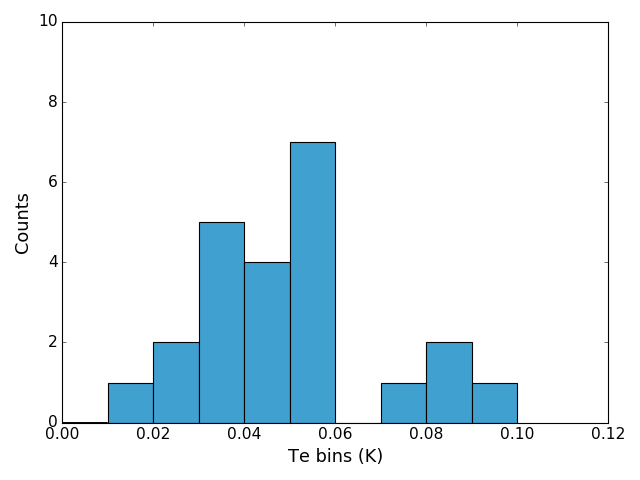

In [238]:
te_hist = np.histogram(np.asarray(Tes_re))
print te_hist
fig = plt.figure()
plt.hist(Tes_re, bins=10, range=[0., 0.1], color='#40a0d0')
plt.xlabel('Te bins (K)', size =16)
plt.xticks(size = 14)
plt.yticks(size = 14)
plt.ylabel('Counts', size =16)
plt.ylim(0.,10)

fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()

In [23]:
te_hist = np.histogram(np.asarray(Tes_re), bins=10, range = [0., 0.1])
print te_hist[0], te_hist[1]
print len(te_hist[0]), len(te_hist[1])
print te_hist[1][1:]

[0 1 2 5 4 7 0 1 2 1] [ 0.    0.01  0.02  0.03  0.04  0.05  0.06  0.07  0.08  0.09  0.1 ]
10 11
[ 0.01  0.02  0.03  0.04  0.05  0.06  0.07  0.08  0.09  0.1 ]


<IPython.core.display.Javascript object>


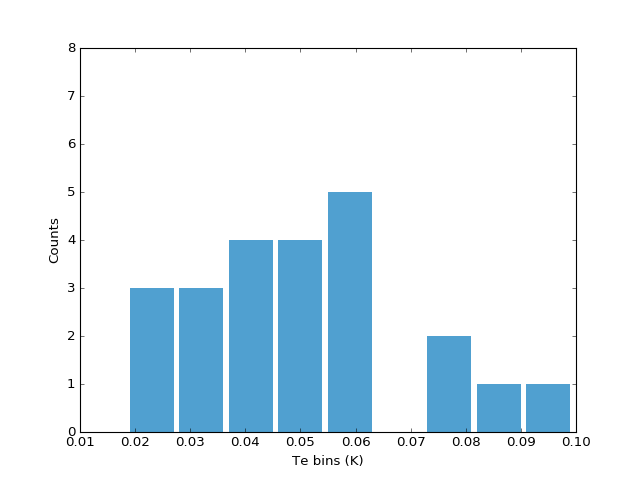

(0.0, 8)

In [226]:
te_hist = np.histogram(np.asarray(Tes_re),bins= 10, range = [0.01, 0.1])

fig = plt.figure()
#plt.plot(te_hist[1][1:],te_hist[0],drawstyle='steps')
plt.bar(te_hist[1][:-1],te_hist[0],width = 0.008, color='#50a0d0',linewidth = 0)
plt.xlabel('Te bins (K)')
plt.ylabel('Counts')
plt.ylim(0.,8)

In [126]:
#d1 = ex.load_data(h5files()[-1], load_now = True)
d1 = ex.load_data(170915173509) # 0.18639328603
#d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)
# if True: #subtract plane
#     try:
#         d1['Vrf_sub'] = tk.remove_plane(d1['Vrf'])*1e3
#         d1['Vrf_sub'].attrs['units'] = 'mV'
#     except:
#         pass

# print d1['Vrf_sub'][58][28:70]

#d = d1['Vrf'].values
d2 = d1['Vrf'][0:22]    #data before switching

d_averaw = d2.values.mean(axis = 0)

d_ave = savgol_filter(d_averaw, 13, 4)

d_ave = d_ave - d_ave[70]   # in total 161 pnts, 70 is where detuning = 0.
d_a = d_ave[0:70]
d_b = - np.flipud(d_ave)[90:]
d =  np.append(d_a, d_b)

PR_v = d1['PR'].values
print d, len(d)
print d_b,len(d_b)
print PR_v, np.where( PR_v == 0.3146), d1['Vrf']['repeat'==1]

[  9.11671668e-05   1.78966671e-04   2.30735168e-04   2.60991976e-04
   2.81244516e-04   2.99986452e-04   3.22706997e-04   3.45582142e-04
   3.66332009e-04   4.22619283e-04   4.50335443e-04   4.54830006e-04
   4.86996025e-04   4.89965081e-04   5.28641045e-04   6.21210784e-04
   7.34424219e-04   8.16432759e-04   8.20280984e-04   8.46439973e-04
   8.72561708e-04   8.91990960e-04   9.45422798e-04   9.88906249e-04
   1.06874853e-03   1.12790428e-03   1.12903118e-03   1.16594136e-03
   1.23246759e-03   1.28119066e-03   1.31720491e-03   1.39544532e-03
   1.48135610e-03   1.53543241e-03   1.58071332e-03   1.55883841e-03
   1.53980777e-03   1.52024440e-03   1.50264055e-03   1.51647814e-03
   1.57341175e-03   1.59068964e-03   1.63298659e-03   1.67069957e-03
   1.71798281e-03   1.77628174e-03   1.78045966e-03   1.80793740e-03
   1.86485052e-03   1.86984055e-03   1.87717937e-03   1.85857154e-03
   1.88378245e-03   1.92283466e-03   2.00172700e-03   2.05153227e-03
   2.05830485e-03   2.06596777e-03

In [60]:
a = np.array([5,6,7,8])
print a[1:4]

[6 7 8]


[[Model]]
    Model(sensor_current)
[[Fit Statistics]]
    # function evals   = 14003
    # data points      = 101
    # variables        = 6
    chi-square         = 0.000
    reduced chi-square = 0.000
    Akaike info crit   = -1616.233
    Bayesian info crit = -1600.543
[[Variables]]
    T_e:          0.02019381 +/- 0        (0.00%) (init= 0.04)
    t_c:          99.9999867 +/- 0        (0.00%) (init= 0.1)
    slope:        9.0035e-05 +/- 0        (0.00%) (init= 0.0001)
    det_offset:  -29.2785920 +/- 0        (0.00%) (init= 1)
    c_offset:     0.06382439 +/- 0        (0.00%) (init= 3.75)
    d_current:   -0.01251465 +/- 0        (0.00%) (init=-0.11)
[[Correlations]] (unreported correlations are <  0.100)



<IPython.core.display.Javascript object>


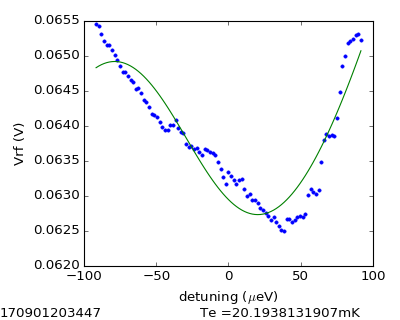

In [240]:
d1 = ex.load_data(h5files()[-1], load_now = True)
#d = ex.load_data(170623143447) # 0.18639328603
#d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)
# if True: #subtract plane
#     try:
#         d1['Vrf_sub'] = tk.remove_plane(d1['Vrf'])*1e3
#         d1['Vrf_sub'].attrs['units'] = 'mV'
#     except:
#         pass

# print d1['Vrf_sub'][58][28:70]

#d = d1['Vrf'].values
d2 = d1['Vrf'][0:100]
d = d2.values.mean(axis = 0)

#d = ex.load_data(r'Z:\Measurements\Chloe\20161005\161212191836.h5')
def PR_to_detuning(PRval):
    coef = 3.6
    det_ratio = coef/np.sqrt(coef**2+1)
    det_arm = det_ratio * 0.02* np.sqrt(2)
#     return (PRval-(0-0.3795))/0.01224*1000    #0.0082*1000
#     return (PRval-(0-0.6587))/0.01914*1000
    
    return (PRval-(0.2669))/det_arm*1000          # all energy parameters are in 'ueV' unit.


detuning = PR_to_detuning(d1['PR'].values)
Vrf = d

def sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current):
    det = (detuning-det_offset)
    omega = np.sqrt(det**2+t_c**2)
    #print "omegae", t_c
    kB = 86 #ueV/K
    return c_offset + d_current*(det/omega)*np.tanh(omega/(2.*kB*T_e))+slope*det

T_e, t_c, slope, det_offset, c_offset, d_current = 0.08, 0.1, 10e-5, 1., 3.75, -0.11
model = lmfit.Model(sensor_current, independent_vars=['detuning'])
result = model.fit(Vrf, detuning = detuning,
                   T_e        = lmfit.Parameter(value = T_e, min = 0.02, max = 0.04),
                   t_c        = lmfit.Parameter(value = t_c, min = 0., max = 100.),
                   slope      = lmfit.Parameter(value = slope, min = -1.e-4, max = 1.e-4),
                   det_offset = lmfit.Parameter(value = det_offset, min = -100, max = 100),
                   c_offset   = lmfit.Parameter(value = c_offset, min = 0.01, max = 16.),
                   d_current  = lmfit.Parameter(value = d_current, min = -20, max = 20))

T_e, t_c, slope, det_offset, c_offset, d_current = (result.best_values[key] for key in result.var_names)

tmp = "Te ="+str(1000*T_e)+"mK"

print result.fit_report()
fig = plt.figure(figsize = (5,4))
plt.plot(detuning, Vrf, '.')
plt.plot(detuning, sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current), '-')
#plt.plot(detuning, sensor_current(detuning, 0.15, t_c, slope, det_offset, c_offset, d_current), '-')
plt.xlabel(r'detuning ($\mu$eV)'); plt.ylabel('Vrf (V)')
#fig.text(0,0.01,tmp)
fig.text(0,0.01,d1.attrs['filename'])
fig.text(0.5,0.01,tmp)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
#print d

<xarray.DataArray 'Vrf_sub' (PR (V): 42)>
array([  7.33459759,   6.50895739,   7.30355835,   6.91448545,
         6.62093592,   7.4965992 ,   6.56715012,   7.28229046,
         6.51669502,   6.63395596,   6.8669095 ,   6.64153337,
         6.37010479,   6.51089478,   6.15212345,   6.14097357,
         6.5820961 ,   6.54320812,   8.51444149,   8.98746777,
         9.79138184,   9.83143997,   9.92781639,  10.08382797,
        10.3857069 ,  10.19595909,   9.91548634,   9.92316341,
         9.95505619,   9.8880043 ,  10.21236897,   9.83224392,
         9.88066959,   9.83138752,   9.92389011,   9.63290405,
         9.47989559,   9.10417366,   9.81648254,   9.76907063,
         9.86240101,  10.25923729], dtype=float32)
Coordinates:
    PC       float64 -0.1864
    PR       (PR (V)) float64 0.2386 0.2383 0.238 0.2377 0.2374 0.2371 ...
    PC (V)   float64 -0.1864
  * PR (V)   (PR (V)) float64 0.2386 0.2383 0.238 0.2377 0.2374 0.2371 ...
Attributes:
    units: mV
[[Model]]
    Model(sensor_cur

<IPython.core.display.Javascript object>


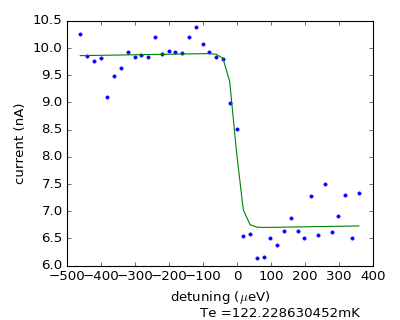

<xarray.DataArray 'Vrf_sub' (PR (V): 42)>
array([  7.33459759,   6.50895739,   7.30355835,   6.91448545,
         6.62093592,   7.4965992 ,   6.56715012,   7.28229046,
         6.51669502,   6.63395596,   6.8669095 ,   6.64153337,
         6.37010479,   6.51089478,   6.15212345,   6.14097357,
         6.5820961 ,   6.54320812,   8.51444149,   8.98746777,
         9.79138184,   9.83143997,   9.92781639,  10.08382797,
        10.3857069 ,  10.19595909,   9.91548634,   9.92316341,
         9.95505619,   9.8880043 ,  10.21236897,   9.83224392,
         9.88066959,   9.83138752,   9.92389011,   9.63290405,
         9.47989559,   9.10417366,   9.81648254,   9.76907063,
         9.86240101,  10.25923729], dtype=float32)
Coordinates:
    PC       float64 -0.1864
    PR       (PR (V)) float64 0.2386 0.2383 0.238 0.2377 0.2374 0.2371 ...
    PC (V)   float64 -0.1864
  * PR (V)   (PR (V)) float64 0.2386 0.2383 0.238 0.2377 0.2374 0.2371 ...
Attributes:
    units: mV


In [393]:
d1 = ex.load_data(170517160940)
#d = ex.load_data(161212191836)  0.18639328603
#d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)
if True: #subtract plane
    try:
        d1['Vrf_sub'] = tk.remove_plane(d1['Vrf'])*1e3
        d1['Vrf_sub'].attrs['units'] = 'mV'
    except:
        pass

print d1['Vrf_sub'][58][28:70]

d = d1['Vrf_sub'][58][28:70]
#d = ex.load_data('')
#d = ex.load_data(r'Z:\Measurements\Chloe\20161005\161212191836.h5')
def PR_to_detuning(PRval):
#     return (PRval-(0-0.3795))/0.01224*1000    #0.0082*1000
#     return (PRval-(0-0.6587))/0.01914*1000
    return (PRval-(0.23325))/0.015*1000


detuning = PR_to_detuning(d['PR'])
current = d

def sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current):
    det = (detuning-det_offset)
    omega = np.sqrt(det**2+t_c**2)
    #print "omegae", t_c
    kB = 86 #ueV/K
    return c_offset + d_current*(det/omega)*np.tanh(omega/(2.*kB*T_e))+slope*det

T_e, t_c, slope, det_offset, c_offset, d_current = 0.08, 0.1, 10e-5, 1., 3.75, -0.11
model = lmfit.Model(sensor_current, independent_vars=['detuning'])
result = model.fit(current, detuning = detuning,
                   T_e        = lmfit.Parameter(value = T_e, min = 0.01, max = 0.5),
                   t_c        = lmfit.Parameter(value = t_c, min = 0., max = 1.),
                   slope      = lmfit.Parameter(value = slope, min = -1.e-4, max = 1.e-4),
                   det_offset = lmfit.Parameter(value = det_offset, min = -100, max = 100),
                   c_offset   = lmfit.Parameter(value = c_offset, min = 0.01, max = 16.),
                   d_current  = lmfit.Parameter(value = d_current, min = -20, max = 20))

T_e, t_c, slope, det_offset, c_offset, d_current = (result.best_values[key] for key in result.var_names)

tmp = "Te ="+str(1000*T_e)+"mK"

print result.fit_report()
fig = plt.figure(figsize = (5,4))
plt.plot(detuning, current, '.')
plt.plot(detuning, sensor_current(detuning, T_e, t_c, slope, det_offset, c_offset, d_current), '-')
#plt.plot(detuning, sensor_current(detuning, 0.15, t_c, slope, det_offset, c_offset, d_current), '-')
plt.xlabel(r'detuning ($\mu$eV)'); plt.ylabel('current (nA)')
#fig.text(0,0.01,tmp)
fig.text(0.5,0.01,tmp)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout()
print d

<xarray.DataArray 'Vrf_sub' (PR (V): 42)>
array([  7.33459759,   6.50895739,   7.30355835,   6.91448545,
         6.62093592,   7.4965992 ,   6.56715012,   7.28229046,
         6.51669502,   6.63395596,   6.8669095 ,   6.64153337,
         6.37010479,   6.51089478,   6.15212345,   6.14097357,
         6.5820961 ,   6.54320812,   8.51444149,   8.98746777,
         9.79138184,   9.83143997,   9.92781639,  10.08382797,
        10.3857069 ,  10.19595909,   9.91548634,   9.92316341,
         9.95505619,   9.8880043 ,  10.21236897,   9.83224392,
         9.88066959,   9.83138752,   9.92389011,   9.63290405,
         9.47989559,   9.10417366,   9.81648254,   9.76907063,
         9.86240101,  10.25923729], dtype=float32)
Coordinates:
    PC       float64 -0.1864
    PR       (PR (V)) float64 0.2386 0.2383 0.238 0.2377 0.2374 0.2371 ...
    PC (V)   float64 -0.1864
  * PR (V)   (PR (V)) float64 0.2386 0.2383 0.238 0.2377 0.2374 0.2371 ...
Attributes:
    units: mV


<IPython.core.display.Javascript object>


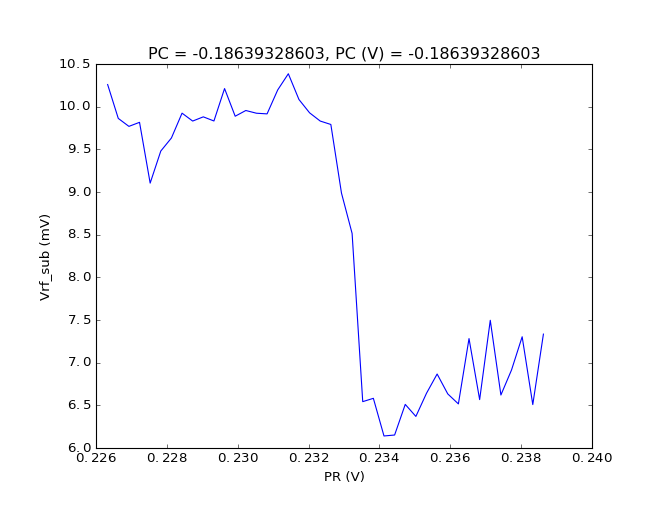

In [180]:
d = ex.load_data(170517160940)
#d = ex.load_data(161212191836)  0.18639328603
#d['diff'] = tk.differentiate(d['Vrf'], sigma = 0.5)
if True: #subtract plane
    try:
        d['Vrf_sub'] = tk.remove_plane(d['Vrf'])*1e3
        d['Vrf_sub'].attrs['units'] = 'mV'
    except:
        pass

print d['Vrf_sub'][58][28:70]

d1 = d['Vrf_sub'][58][28:70]
plt.figure()
tk.plot(d1)#, ylog = True)

In [131]:
x = np.arange(10)
print x

[0 1 2 3 4 5 6 7 8 9]


In [42]:
Init = (0.0375, -0.0461)
print Init[0] + 0.01

0.0475


In [220]:
dps = []
print dps

[]


In [305]:
import matplotlib
matplotlib.__version__

'1.5.3'

In [345]:
import IPython
IPython.__version__

'5.1.0'

In [60]:
Init = (0.0339, -0.0431)
com = (Init[0]+0.1, Init[1])
print com

(0.13390000000000002, -0.0431)


In [202]:
aa = np.array([[1,2,3], [7,8,9]])
bb = np.average(aa, axis = 0 )
cc = np.average(aa, axis = 1 )
print aa, bb, cc

[[1 2 3]
 [7 8 9]] [ 4.  5.  6.] [ 2.  8.]


In [371]:
dd = np.array([1,2,3])
ps = np.empty([2,3])
ps[0] = dd
print ps.size, dd.size

6 3


<IPython.core.display.Javascript object>


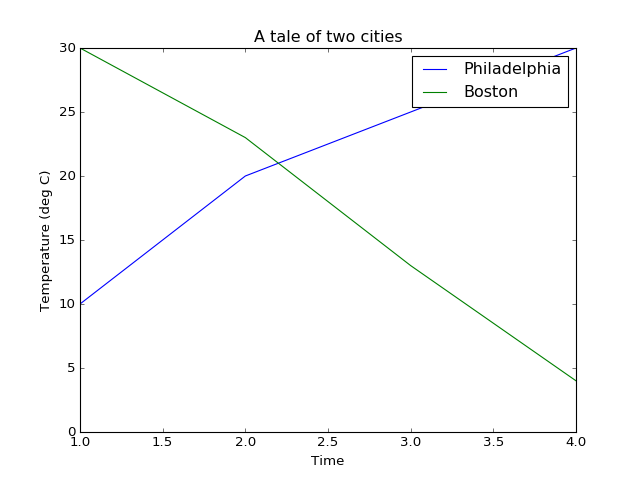

In [345]:
fig, ax = plt.subplots()
ax.plot([1, 2, 3, 4], [10, 20, 25, 30], label='Philadelphia')
ax.plot([1, 2, 3, 4], [30, 23, 13, 4], label='Boston')
ax.set(ylabel='Temperature (deg C)', xlabel='Time', title='A tale of two cities')
ax.legend()
plt.show()

## perula map

In [89]:
from matplotlib.colors import LinearSegmentedColormap

cm_data = [[0.2081, 0.1663, 0.5292], [0.2116238095, 0.1897809524, 0.5776761905], 
 [0.212252381, 0.2137714286, 0.6269714286], [0.2081, 0.2386, 0.6770857143], 
 [0.1959047619, 0.2644571429, 0.7279], [0.1707285714, 0.2919380952, 
  0.779247619], [0.1252714286, 0.3242428571, 0.8302714286], 
 [0.0591333333, 0.3598333333, 0.8683333333], [0.0116952381, 0.3875095238, 
  0.8819571429], [0.0059571429, 0.4086142857, 0.8828428571], 
 [0.0165142857, 0.4266, 0.8786333333], [0.032852381, 0.4430428571, 
  0.8719571429], [0.0498142857, 0.4585714286, 0.8640571429], 
 [0.0629333333, 0.4736904762, 0.8554380952], [0.0722666667, 0.4886666667, 
  0.8467], [0.0779428571, 0.5039857143, 0.8383714286], 
 [0.079347619, 0.5200238095, 0.8311809524], [0.0749428571, 0.5375428571, 
  0.8262714286], [0.0640571429, 0.5569857143, 0.8239571429], 
 [0.0487714286, 0.5772238095, 0.8228285714], [0.0343428571, 0.5965809524, 
  0.819852381], [0.0265, 0.6137, 0.8135], [0.0238904762, 0.6286619048, 
  0.8037619048], [0.0230904762, 0.6417857143, 0.7912666667], 
 [0.0227714286, 0.6534857143, 0.7767571429], [0.0266619048, 0.6641952381, 
  0.7607190476], [0.0383714286, 0.6742714286, 0.743552381], 
 [0.0589714286, 0.6837571429, 0.7253857143], 
 [0.0843, 0.6928333333, 0.7061666667], [0.1132952381, 0.7015, 0.6858571429], 
 [0.1452714286, 0.7097571429, 0.6646285714], [0.1801333333, 0.7176571429, 
  0.6424333333], [0.2178285714, 0.7250428571, 0.6192619048], 
 [0.2586428571, 0.7317142857, 0.5954285714], [0.3021714286, 0.7376047619, 
  0.5711857143], [0.3481666667, 0.7424333333, 0.5472666667], 
 [0.3952571429, 0.7459, 0.5244428571], [0.4420095238, 0.7480809524, 
  0.5033142857], [0.4871238095, 0.7490619048, 0.4839761905], 
 [0.5300285714, 0.7491142857, 0.4661142857], [0.5708571429, 0.7485190476, 
  0.4493904762], [0.609852381, 0.7473142857, 0.4336857143], 
 [0.6473, 0.7456, 0.4188], [0.6834190476, 0.7434761905, 0.4044333333], 
 [0.7184095238, 0.7411333333, 0.3904761905], 
 [0.7524857143, 0.7384, 0.3768142857], [0.7858428571, 0.7355666667, 
  0.3632714286], [0.8185047619, 0.7327333333, 0.3497904762], 
 [0.8506571429, 0.7299, 0.3360285714], [0.8824333333, 0.7274333333, 0.3217], 
 [0.9139333333, 0.7257857143, 0.3062761905], [0.9449571429, 0.7261142857, 
  0.2886428571], [0.9738952381, 0.7313952381, 0.266647619], 
 [0.9937714286, 0.7454571429, 0.240347619], [0.9990428571, 0.7653142857, 
  0.2164142857], [0.9955333333, 0.7860571429, 0.196652381], 
 [0.988, 0.8066, 0.1793666667], [0.9788571429, 0.8271428571, 0.1633142857], 
 [0.9697, 0.8481380952, 0.147452381], [0.9625857143, 0.8705142857, 0.1309], 
 [0.9588714286, 0.8949, 0.1132428571], [0.9598238095, 0.9218333333, 
  0.0948380952], [0.9661, 0.9514428571, 0.0755333333], 
 [0.9763, 0.9831, 0.0538]]

cm_data1 = np.asarray(cm_data)*256

parula_map = LinearSegmentedColormap.from_list('parula', cm_data)

cm.register_cmap(name='parula', cmap= parula_map)

#cm.register_cmap(name='parula', data=cm_data1, lut= 256)  # , lut=128

# ## For use of "viscm view"
# test_cm = parula_map

# if __name__ == "__main__":
#     import matplotlib.pyplot as plt
#     import numpy as np

#     try:
#         from viscm import viscm
#         viscm(parula_map)
#     except ImportError:
#         print("viscm not found, falling back on simple display")
#         plt.imshow(np.linspace(0, 100, 256)[None, :], aspect='auto',
#                    cmap=parula_map)
#     plt.show()

In [271]:
cm11 = cm.get_cmap(name='parula', lut=None)
print cm11 #.values()

In [272]:
cm.parula

AttributeError: 'module' object has no attribute 'parula'

## slice of 2D plot

<IPython.core.display.Javascript object>


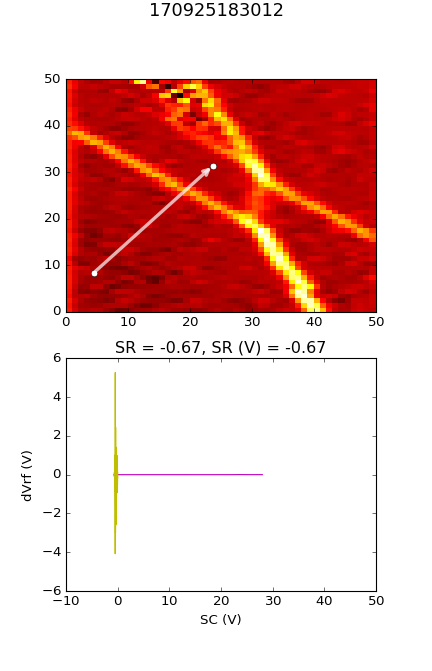

In [124]:
import numpy as np 
import matplotlib.pyplot as plt  

# Handle mouse clicks on the plot:
class LineSlice:
    '''Allow user to drag a line on a pcolor/pcolormesh plot, and plot the Z values from that line on a separate axis.

    Example
    -------
    fig, (ax1, ax2) = plt.subplots( nrows=2 )    # one figure, two axes
    img = ax1.pcolormesh( x, y, Z )     # pcolormesh on the 1st axis
    lntr = LineSlice( img, ax2 )        # Connect the handler, plot LineSlice onto 2nd axis

    Arguments
    ---------
    img: the pcolormesh plot to extract data from and that the User's clicks will be recorded for.
    ax2: the axis on which to plot the data values from the dragged line.


    '''
    def __init__(self, img, ax):
        '''
        img: the pcolormesh instance to get data from/that user should click on
        ax: the axis to plot the line slice on
        '''
        self.img = img
        self.ax = ax
        self.data = img.get_array().reshape(img._meshWidth, img._meshHeight)

        # register the event handlers:
        self.cidclick = img.figure.canvas.mpl_connect('button_press_event', self)
        self.cidrelease = img.figure.canvas.mpl_connect('button_release_event', self)

        self.markers, self.arrow = None, None   # the lineslice indicators on the pcolormesh plot
        self.line = None    # the lineslice values plotted in a line
    #end __init__

    def __call__(self, event):
        '''Matplotlib will run this function whenever the user triggers an event on our figure'''
        if event.inaxes != self.img.axes: return     # exit if clicks weren't within the `img` axes
        if self.img.figure.canvas.manager.toolbar._active is not None: return   # exit if pyplot toolbar (zooming etc.) is active

        if event.name == 'button_press_event':
            self.p1 = (event.xdata, event.ydata)    # save 1st point
        elif event.name == 'button_release_event':
            self.p2 = (event.xdata, event.ydata)    # save 2nd point
            self.drawLineSlice()    # draw the Line Slice position & data
    #end __call__

    def drawLineSlice( self ):
        ''' Draw the region along which the Line Slice will be extracted, onto the original self.img pcolormesh plot.  Also update the self.axis plot to show the line slice data.'''
        '''Uses code from these hints:
        http://stackoverflow.com/questions/7878398/how-to-extract-an-arbitrary-line-of-values-from-a-numpy-array
        http://stackoverflow.com/questions/34840366/matplotlib-pcolor-get-array-returns-flattened-array-how-to-get-2d-data-ba
        '''

        x0,y0 = self.p1[0], self.p1[1]  # get user's selected coordinates
        x1,y1 = self.p2[0], self.p2[1]
        length = int( np.hypot(x1-x0, y1-y0) )
        x, y = np.linspace(x0, x1, length),   np.linspace(y0, y1, length)

        # Extract the values along the line with nearest-neighbor pixel value:
        # get temp. data from the pcolor plot
        zi = self.data[x.astype(np.int), y.astype(np.int)]
        # Extract the values along the line, using cubic interpolation:
        #import scipy.ndimage
        #zi = scipy.ndimage.map_coordinates(self.data, np.vstack((x,y)))

        # if plots exist, delete them:
        if self.markers != None:
            if isinstance(self.markers, list):
                self.markers[0].remove()
            else:
                self.markers.remove()
        if self.arrow != None:
            self.arrow.remove()

        # plot the endpoints
        self.markers = self.img.axes.plot([x0, x1], [y0, y1], 'wo')   
        # plot an arrow:
        self.arrow = self.img.axes.annotate("",
                    xy=(x0, y0),    # start point
                    xycoords='data',
                    xytext=(x1, y1),    # end point
                    textcoords='data',
                    arrowprops=dict(
                        arrowstyle="<-",
                        connectionstyle="arc3", 
                        color='white',
                        alpha=0.7,
                        linewidth=3
                        ),

                    )

        # plot the data along the line on provided `ax`:
        if self.line != None:
            self.line[0].remove()   # delete the plot
        self.line = self.ax.plot(zi)
    #end drawLineSlice()

#end class LineTrace


# load the data:
#d = ex.load_data(h5files()[-15], load_now = True)
fig, (ax1, ax2) = plt.subplots(2, 1, figsize = (5,8))

# plot the data
img = ax1.pcolormesh( np.arange( len(d['PR'].values) ), np.arange(len(d['PC'].values)), d['diff2'].values , cmap = 'hot')

# register the event handler:
LnTr = LineSlice(img, ax2)   

## fit Pulse distortion

[[Model]]
    Model(exp_cutoff)
[[Fit Statistics]]
    # function evals   = 19
    # data points      = 14
    # variables        = 3
    chi-square         = 0.000
    reduced chi-square = 0.000
    Akaike info crit   = -184.776
    Bayesian info crit = -182.858
[[Variables]]
    cut_time:   0.83836165 +/- 0.064031 (7.64%) (init= 2)
    offset:     0.21910996 +/- 0.000825 (0.38%) (init= 0.219)
    amp:        0.03592331 +/- 0.001253 (3.49%) (init= 0.05)
[[Correlations]] (unreported correlations are <  0.250)
    C(cut_time, offset)          =  0.686 
    C(offset, amp)               =  0.428 



<IPython.core.display.Javascript object>


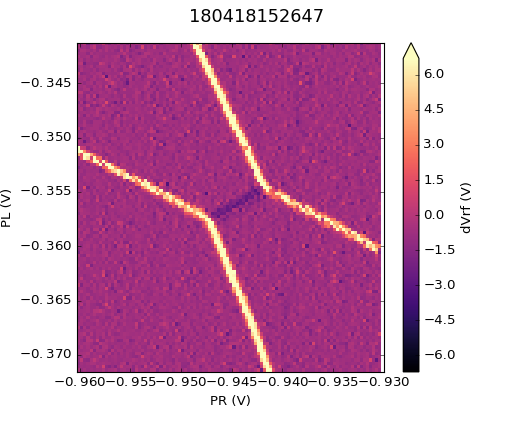

In [337]:
def exp_cutoff(t, cut_time, offset, amp):
    #bb == amp * np.exp(-aa/decay_time) + offset
    return - amp * np.exp(-t/cut_time) + offset

pulse_w = np.array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0, 1.5, 2.0, 5.0, 10.])
pulse_a = np.array([0.695, 0.755, 0.83, 0.867, 0.88, 0.900, 0.911, 0.916, 0.925, 0.932, 0.950, 0.957, 0.964, 0.965])

pulse_a_7122 = np.array([0.186, 0.191, 0.194, 0.198, 0.200, 0.201, 0.203, 0.2056, 0.208, 0.209, 0.212, 0.213, 0.220, 0.220]) # with Sucoflex 100

x, y = pulse_w, pulse_a_7122
amp =0.05
model  = lmfit.Model(exp_cutoff, independent_vars=['t'])
result = model.fit(y, t = x,
               cut_time = lmfit.Parameter(value = 0.2*max(x)),
               offset     = lmfit.Parameter(value = 0.219, min = 0.1, max = 0.5 ),
               amp     = lmfit.Parameter(value = amp))

cut_time, offset, signal = (result.best_values[key] for key in model.param_names)

print(result.fit_report(min_correl=0.25))

#y1 = temp_data['ps'][0].values
#plt.plot(x, result.best_fit, color = 'darkorange') # 'dodgerblue'  'midnightblue' darkturquoise

fig, ax = plt.subplots(figsize = (6,5))

plt.plot(x, y, 'o', color = 'skyblue',markersize=10)
# plt.plot(x, result.best_fit, color = 'dodgerblue')
x_expanded = np.arange(x.min(), 1.*x.max(), np.abs(x[1]-x[0]))
plt.plot(x_expanded, model.func(x_expanded, **result.best_values),  color = 'blue')  ## fitting curve

plt.show()
#fig.text(0.45,0.95,temp_data.attrs['filename'], size =14)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout(pad=2.0, w_pad=0.9, h_pad=0.9)

<IPython.core.display.Javascript object>


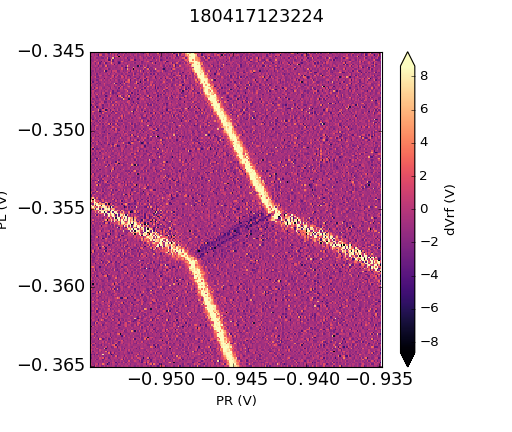

In [287]:
pulse_w = np.linspace(0.1, 1., 10)
am1 = -np.exp(-pulse_w)
am2 = -np.exp(-10*pulse_w)

fig, ax = plt.subplots(figsize = (6,5))

plt.plot(pulse_w, am1, 'o', color = 'skyblue',markersize=10)
plt.plot(pulse_w, am2, 's', color = 'dodgerblue',markersize=10)
# plt.plot(x, result.best_fit, color = 'dodgerblue')

#plt.xlabel('%s'%(temp_data.dims.keys()[-2]), size = 20, family = 'Times New Roman')
#plt.ylabel('Ps', size = 20, family = 'Times New Roman')
plt.xticks(fontsize=16, rotation=0)  #np.arange(0, 100, 20),
plt.yticks(fontsize=16, rotation=0) #plt.yticks(np.arange(0.5, 1.01, 0.1), fontsize=16, rotation=0)
#fig.text(0,0.01,d.attrs['filename'])
#plt.xlim((0.0,2.0))
#plt.ylim((0.4,1.0))
#plt.autoscale(enable=False, axis='both', tight=None)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02))

# ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/1000))
# ax.xaxis.set_major_formatter(ticks_x)

plt.show()
#fig.text(0.45,0.95,temp_data.attrs['filename'], size =14)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout(pad=2.0, w_pad=0.9, h_pad=0.9)
##

In [ ]:
d = ex.load_data(h5files()[-15], load_now = True)
#d = ex.load_data(170915121829)
#d = ex.load_data(170410132638)
#d = ex.load_data(170428164203)
#d = ex.load_data(170501122245)

d['diff1'] = tk.differentiate(d['Vrf'], dim = 0, sigma = 0.5)
d['diff2'] = -tk.differentiate(d['Vrf'], dim = 1, sigma = 1.0)
if True: #subtract plane
    try:
        d['Vrf_sub'] = tk.remove_plane(d['Vrf'])*1e3
        d['Vrf_sub'].attrs['units'] = 'mV'
    except:
        pass
#cmaps = cm.Spectral
cmaps = parula_map
plt.figure()
tk.plot(d, name = 'Vrf',cmap = 'plasma') # ,interpolation = 'bicubic')#, ylog = True)
#tk.implot(d['dVrf'], d['PR'],d['PC'],extent=[0.25, 0.29, -0.240, -0.2005],vmax=8, vmin=-8, cmap ='magma',interpolation = 'None' )
#tk.implot(d['dVrf'], d['PR'],d['PC'],extent=[0.25, 0.29, -0.240, -0.2005],vmax=8, vmin=-8, cmap =parula_map,interpolation = 'None' )
#print d.attrs

In [42]:
r1 = np.array([0.2,0.7,1.3,1.8])
print np.around(r1)

[ 0.  1.  1.  2.]


In [61]:
a = np.array([[10, 7, 4], [3, 2, 1]])
print a[:,-1]

[4 1]


In [69]:
x = np.arange(10)
x.reshape(2,5)
print x.reshape(2,5)

[[0 1 2 3 4]
 [5 6 7 8 9]]


In [71]:
y = np.arange(35).reshape(5,7)
print y

[[ 0  1  2  3  4  5  6]
 [ 7  8  9 10 11 12 13]
 [14 15 16 17 18 19 20]
 [21 22 23 24 25 26 27]
 [28 29 30 31 32 33 34]]


In [84]:
print y[0:2,::] 

[[ 0  1  2  3  4  5  6]
 [ 7  8  9 10 11 12 13]]


In [128]:
z = np.array([1,2,3,5,6,7])
print np.percentile(z,59)

4.9


In [139]:
np.linspace(0.6,0.7,2)

array([ 0.6,  0.7])

In [158]:
np.linspace(0.005,0.,1)

array([ 0.005])

In [85]:
range(10)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

In [786]:
np.array([1, -1.8])*np.linspace(0,0.010,51).reshape(51,1)

array([[ 0.     , -0.     ],
       [ 0.0002 , -0.00036],
       [ 0.0004 , -0.00072],
       [ 0.0006 , -0.00108],
       [ 0.0008 , -0.00144],
       [ 0.001  , -0.0018 ],
       [ 0.0012 , -0.00216],
       [ 0.0014 , -0.00252],
       [ 0.0016 , -0.00288],
       [ 0.0018 , -0.00324],
       [ 0.002  , -0.0036 ],
       [ 0.0022 , -0.00396],
       [ 0.0024 , -0.00432],
       [ 0.0026 , -0.00468],
       [ 0.0028 , -0.00504],
       [ 0.003  , -0.0054 ],
       [ 0.0032 , -0.00576],
       [ 0.0034 , -0.00612],
       [ 0.0036 , -0.00648],
       [ 0.0038 , -0.00684],
       [ 0.004  , -0.0072 ],
       [ 0.0042 , -0.00756],
       [ 0.0044 , -0.00792],
       [ 0.0046 , -0.00828],
       [ 0.0048 , -0.00864],
       [ 0.005  , -0.009  ],
       [ 0.0052 , -0.00936],
       [ 0.0054 , -0.00972],
       [ 0.0056 , -0.01008],
       [ 0.0058 , -0.01044],
       [ 0.006  , -0.0108 ],
       [ 0.0062 , -0.01116],
       [ 0.0064 , -0.01152],
       [ 0.0066 , -0.01188],
       [ 0.006

In [1010]:
PR_array = np.linspace(0,0.010,51)
Init_vec = np.array([1, -1.8])*PR_array.reshape(51,1) 
print Init_vec

[[ 0.      -0.     ]
 [ 0.0002  -0.00036]
 [ 0.0004  -0.00072]
 [ 0.0006  -0.00108]
 [ 0.0008  -0.00144]
 [ 0.001   -0.0018 ]
 [ 0.0012  -0.00216]
 [ 0.0014  -0.00252]
 [ 0.0016  -0.00288]
 [ 0.0018  -0.00324]
 [ 0.002   -0.0036 ]
 [ 0.0022  -0.00396]
 [ 0.0024  -0.00432]
 [ 0.0026  -0.00468]
 [ 0.0028  -0.00504]
 [ 0.003   -0.0054 ]
 [ 0.0032  -0.00576]
 [ 0.0034  -0.00612]
 [ 0.0036  -0.00648]
 [ 0.0038  -0.00684]
 [ 0.004   -0.0072 ]
 [ 0.0042  -0.00756]
 [ 0.0044  -0.00792]
 [ 0.0046  -0.00828]
 [ 0.0048  -0.00864]
 [ 0.005   -0.009  ]
 [ 0.0052  -0.00936]
 [ 0.0054  -0.00972]
 [ 0.0056  -0.01008]
 [ 0.0058  -0.01044]
 [ 0.006   -0.0108 ]
 [ 0.0062  -0.01116]
 [ 0.0064  -0.01152]
 [ 0.0066  -0.01188]
 [ 0.0068  -0.01224]
 [ 0.007   -0.0126 ]
 [ 0.0072  -0.01296]
 [ 0.0074  -0.01332]
 [ 0.0076  -0.01368]
 [ 0.0078  -0.01404]
 [ 0.008   -0.0144 ]
 [ 0.0082  -0.01476]
 [ 0.0084  -0.01512]
 [ 0.0086  -0.01548]
 [ 0.0088  -0.01584]
 [ 0.009   -0.0162 ]
 [ 0.0092  -0.01656]
 [ 0.0094  -0

In [1009]:
ee = Init_vec[len(Init_vec)-1]
ee

array([ 0.01 , -0.018])

In [806]:
for init in Init_vec:
    print init if np.array_equal(init,  Init_vec[len(Init_vec)-1]) else None
    

None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
[ 0.01  -0.018]


In [952]:
a1 = np.array([[1,2],[3]])
b1 = np.array([[1,2],[3,4]])
if np.array_equal(a1[0],b1[0]):
    print '1'
else:
    print '2'

1


In [945]:
a1 = np.array([[1,2],[3]])
a1.shape

(2L,)

In [69]:
cmap

<IPython.core.display.Javascript object>


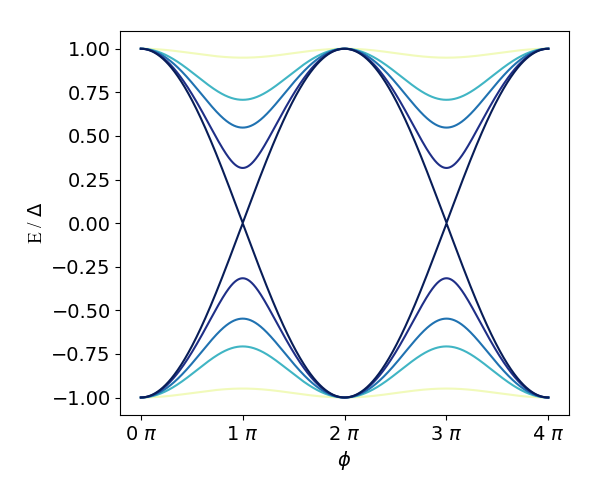

In [96]:
import matplotlib.ticker as tck

def E_Andr(tau, Delta, phi):
    return Delta*np.sqrt(1.- tau* np.sin(phi/2.)**2)

phi = np.linspace(0,4*np.pi,4001)
Delta = 1.0
tau = np.array([0.1,0.5,0.7,0.9,0.99999])

fig, ax = plt.subplots(figsize = (6,5))
for ta in tau:
    
    cmap = cm.get_cmap('YlGnBu')
    ax.plot(phi/np.pi, E_Andr(ta,Delta,phi), '-', color = cmap(ta/1.0))
    ax.plot(phi/np.pi, - E_Andr(ta,Delta,phi), '-', color = cmap(ta/1.0))
    ax.xaxis.set_major_formatter(tck.FormatStrFormatter('%g $\pi$'))
    ax.xaxis.set_major_locator(tck.MultipleLocator(base=1.0))


#plt.plot(pulse_w, am2, 's', color = 'dodgerblue',markersize=10)


#plt.xlabel('%s'%(temp_data.dims.keys()[-2]), size = 20, family = 'Times New Roman')
plt.xlabel('$\phi$', size = 14, family = 'Times New Roman')
plt.ylabel('E / $\Delta$', size = 14, family = 'Times New Roman')
plt.xticks(fontsize=14, rotation=0, fontname = 'Time New Roman')  #np.arange(0, 100, 20),
plt.yticks(fontsize=14, rotation=0,fontname = 'Time New Roman') #plt.yticks(np.arange(0.5, 1.01, 0.1), fontsize=16, rotation=0)
#fig.text(0,0.01,d.attrs['filename'])
#plt.xlim((0.0,2.0))
#plt.ylim((0.4,1.0))
#plt.autoscale(enable=False, axis='both', tight=None)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02))

# ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/1000))
# ax.xaxis.set_major_formatter(ticks_x)

plt.show()
#fig.text(0.45,0.95,temp_data.attrs['filename'], size =14)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout(pad=2.0, w_pad=0.9, h_pad=0.9)
##

<IPython.core.display.Javascript object>


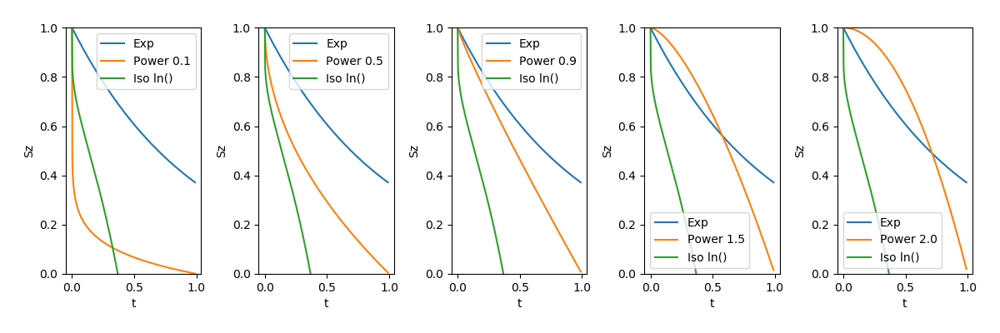

C:\Users\taruchalab\Anaconda2\lib\site-packages\ipykernel_launcher.py:10: RuntimeWarning: divide by zero encountered in log
  # Remove the CWD from sys.path while we load stuff.


In [116]:
import matplotlib.ticker as tck

def Exp_dec(t, Tk):
    return np.exp(-t/(1./Tk))

def Power_dec(t, Tk,p):                         # H.schoeller PRL 104.106801, short time limit
    return 1.- (t*Tk)**p

def Iso_dec(t, Tk):                         # H.schoeller PRL 104.106801, short time limit, Isotropic J
    return 1.+ 1./np.log(t*Tk)

t = np.linspace(0, 0.99, 401)
Tk = 1.0
powers = np.array([0.1,0.5,0.9,1.5,2.0])

fig, axarr = plt.subplots(1,5, figsize = (12,4))

for ii, p in enumerate(powers):
    
    #cmap = cm.get_cmap('YlGnBu')
    axarr[ii].plot(t,  Exp_dec(t, Tk), '-',  label = 'Exp')  # color = cmap(ta/1.0),
    axarr[ii].plot(t, Power_dec(t, Tk,p), '-', label = 'Power %s'%(p) )
    axarr[ii].plot(t, Iso_dec(t, Tk), '-', label = 'Iso ln()')
    axarr[ii].legend()
    axarr[ii].legend
    axarr[ii].set_ylim((0.,1.0))
    axarr[ii].set_xlabel('t')
    axarr[ii].set_ylabel('Sz')


#plt.plot(pulse_w, am2, 's', color = 'dodgerblue',markersize=10)


#plt.xlabel('%s'%(temp_data.dims.keys()[-2]), size = 20, family = 'Times New Roman')
#plt.xlabel('t', size = 14, family = 'Times New Roman')
#plt.ylabel('Sz', size = 14, family = 'Times New Roman')
#plt.xticks(fontsize=14, rotation=0, fontname = 'Time New Roman')  #np.arange(0, 100, 20),
#plt.yticks(fontsize=14, rotation=0,fontname = 'Time New Roman') #plt.yticks(np.arange(0.5, 1.01, 0.1), fontsize=16, rotation=0)
#fig.text(0,0.01,d.attrs['filename'])
#plt.xlim((0.0,2.0))
#plt.ylim((0.4,1.0))
#plt.autoscale(enable=False, axis='both', tight=None)
#fig.axes.yaxis.set_major_locator(ticker.MultipleLocator(tick_spacing))
#plt.yticks(np.arange(min(y), max(y)+0.01, 0.02))

# ticks_x = ticker.FuncFormatter(lambda x, pos: '{0:g}'.format(x/1000))
# ax.xaxis.set_major_formatter(ticks_x)

plt.show()
#fig.text(0.45,0.95,temp_data.attrs['filename'], size =14)
fig.patch.set_alpha(1.0);fig.patch.set_facecolor('w');plt.tight_layout(pad=2.0, w_pad=0.9, h_pad=0.9)
##

In [107]:
for ii,p in enumerate(powers):
    print ii,p

0 0.1
1 0.5
2 0.9
3 1.5
4 2.0


<IPython.core.display.Javascript object>


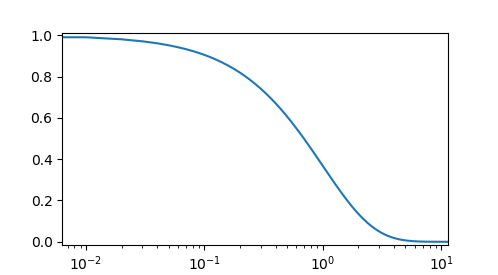

In [120]:
fig, ax = plt.subplots( figsize = (5,4))
t=np.linspace(0,100,10001)
ax.plot(t,  Exp_dec(t, Tk), '-',  label = 'Exp')
plt.xscale('log')
plt.show()